In [3]:
! jupyter labextension disable --level=user @lckr/jupyterlab_variableinspector

Traceback (most recent call last):
  File "/glade/work/mdfowler/conda-envs/pyn_env2/bin/jupyter", line 11, in <module>
    sys.exit(main())
  File "/glade/work/mdfowler/conda-envs/pyn_env2/lib/python3.8/site-packages/jupyter_core/command.py", line 285, in main
    command = _jupyter_abspath(subcommand)
  File "/glade/work/mdfowler/conda-envs/pyn_env2/lib/python3.8/site-packages/jupyter_core/command.py", line 124, in _jupyter_abspath
    raise Exception(
Exception: Jupyter command `jupyter-labextension` not found.


In [1]:
# Load libraries

# # Plotting utils 
import datetime
import glob
import os
import pickle
import time
import warnings
from datetime import date, timedelta
import Ngl
import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.util
import matplotlib as matplotlib
import matplotlib.animation as animation
import matplotlib.colors as colors
import matplotlib.dates as mdates
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.ticker import FormatStrFormatter
import metpy.calc as mpc
import numpy as np
import pandas as pd
import scipy.stats as stats
import seaborn as sns
import xarray as xr
from matplotlib.dates import DateFormatter
from metpy.units import units
from metpy import interpolate
from metpy.calc import vertical_velocity
from mpl_toolkits.axes_grid1 import make_axes_locatable

warnings.filterwarnings('ignore')


## Read in data 

In [11]:
# scamDS_h0_L50 = scamDS_h0_L50.sortby('time')
# scamDS_h2_L50 = scamDS_h2_L50.sortby('time')

# scamDS_h0_L250 = scamDS_h0_L250.sortby('time')
# scamDS_h2_L250 = scamDS_h2_L250.sortby('time')


In [10]:
# file_name_h0_L50 = '/glade/scratch/mdfowler/claspMF_extrmSfc_25pct/allJJA/scamDS_h0_2015and16_L50_20231219.nc'
# file_name_h2_L50 = '/glade/scratch/mdfowler/claspMF_extrmSfc_25pct/allJJA/scamDS_h2_2015and16_L50_20231219.nc'

# scamDS_h0_L50.to_netcdf(file_name_h0_L50, mode='w')
# scamDS_h0_L50.close()

# scamDS_h2_L50.to_netcdf(file_name_h2_L50, mode='w')
# scamDS_h2_L50.close()


In [11]:
# file_name_h0_L250 = '/glade/scratch/mdfowler/claspMF_extrmSfc_25pct/allJJA/scamDS_h0_2015and16_L250_20231219.nc'
# file_name_h2_L250 = '/glade/scratch/mdfowler/claspMF_extrmSfc_25pct/allJJA/scamDS_h2_2015and16_L250_20231219.nc'

# scamDS_h0_L250.to_netcdf(file_name_h0_L250, mode='w')
# scamDS_h0_L250.close()

# scamDS_h2_L250.to_netcdf(file_name_h2_L250, mode='w')
# scamDS_h2_L250.close()


## Set up Dask

In [2]:
import dask

from dask_jobqueue import PBSCluster

# For Casper
cluster = PBSCluster(
    queue="casper",
    walltime="01:00:00",
    project="P93300642",
    memory="4GB",
    resource_spec="select=1:ncpus=1:mem=4GB",
    cores=1,
    processes=1,
)



In [3]:
from dask.distributed import Client

# Connect client to the remote dask workers
client = Client(cluster)
client

Connection method: Cluster object,Cluster type: dask_jobqueue.PBSCluster
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/mdfowler/proxy/38555/status,
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/mdfowler/proxy/38555/status,Workers: 0
Total threads: 0,Total memory: 0 B
Comm: tcp://128.117.208.102:44313,Workers: 0
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/mdfowler/proxy/38555/status,Total threads: 0
Started: Just now,Total memory: 0 B


In [4]:
cluster.scale(24)


In [5]:
client.wait_for_workers(24)

In [2]:
# %%time 
# ## Read in from files above: 
# file_name_h0_L50 = '/glade/scratch/mdfowler/claspMF_extrmSfc_25pct/allJJA/scamDS_h0_2015and16_L50_20231219.nc'
# file_name_h2_L50 = '/glade/scratch/mdfowler/claspMF_extrmSfc_25pct/allJJA/scamDS_h2_2015and16_L50_20231219.nc'

# file_name_h0_L250 = '/glade/scratch/mdfowler/claspMF_extrmSfc_25pct/allJJA/scamDS_h0_2015and16_L250_20231219.nc'
# file_name_h2_L250 = '/glade/scratch/mdfowler/claspMF_extrmSfc_25pct/allJJA/scamDS_h2_2015and16_L250_20231219.nc'


# scamDS_h0_L50 = xr.open_dataset(file_name_h0_L50, decode_times=True)
# scamDS_h2_L50 = xr.open_dataset(file_name_h2_L50, decode_times=True)

# scamDS_h0_L250 = xr.open_dataset(file_name_h0_L250, decode_times=True)
# scamDS_h2_L250 = xr.open_dataset(file_name_h2_L250, decode_times=True)

# # scamDS_h0_L50 = xr.open_dataset(file_name_h0_L50, decode_times=True).load()
# # scamDS_h2_L50 = xr.open_dataset(file_name_h2_L50, decode_times=True).load()

# # scamDS_h0_L250 = xr.open_dataset(file_name_h0_L250, decode_times=True).load()
# # scamDS_h2_L250 = xr.open_dataset(file_name_h2_L250, decode_times=True).load()



CPU times: user 3.25 s, sys: 414 ms, total: 3.66 s
Wall time: 9.88 s


In [8]:
# %%time 
# ## Read in from files: 
# testDir     = '/glade/derecho/scratch/mdfowler/CLASP+MF_diffusionOff/'

# file_name_h0 = testDir+'scamDS_h0_L0eq250_addedTermSmpl_noDiffusion_2015_20240228.nc'
# file_name_h2 = testDir+'scamDS_h2_L0eq250_addedTermSmpl_noDiffusion_2015_20240228.nc'

# scamDS_h0_L250 = xr.open_dataset(file_name_h0, decode_times=True)
# scamDS_h2_L250 = xr.open_dataset(file_name_h2, decode_times=True)

# # scamDS_h0_L50 = xr.open_dataset(file_name_h0_L50, decode_times=True).load()
# # scamDS_h2_L50 = xr.open_dataset(file_name_h2_L50, decode_times=True).load()

# # scamDS_h0_L250 = xr.open_dataset(file_name_h0_L250, decode_times=True).load()
# # scamDS_h2_L250 = xr.open_dataset(file_name_h2_L250, decode_times=True).load()



CPU times: user 646 ms, sys: 112 ms, total: 758 ms
Wall time: 949 ms


In [2]:
# %%time 
# ## Read in from files: 
# testDir     = '/glade/derecho/scratch/mdfowler/CLASP+MF_diffusionOff/'

# file_name_h0 = testDir+'scamDS_h0_L0eq250_addedTermSmpl_noDiffusion_2016_20240226.nc'
# file_name_h2 = testDir+'scamDS_h2_L0eq250_addedTermSmpl_noDiffusion_2016_20240226.nc'

# scamDS_h0_L250_2016 = xr.open_dataset(file_name_h0, decode_times=True)
# scamDS_h2_L250_2016 = xr.open_dataset(file_name_h2, decode_times=True)

# # scamDS_h0_L50 = xr.open_dataset(file_name_h0_L50, decode_times=True).load()
# # scamDS_h2_L50 = xr.open_dataset(file_name_h2_L50, decode_times=True).load()

# # scamDS_h0_L250 = xr.open_dataset(file_name_h0_L250, decode_times=True).load()
# # scamDS_h2_L250 = xr.open_dataset(file_name_h2_L250, decode_times=True).load()



CPU times: user 1.18 s, sys: 407 ms, total: 1.59 s
Wall time: 6.23 s


In [6]:
%%time 
testDir     = '/glade/derecho/scratch/mdfowler/CLASP+MF_diffusionOff/'

listFiles_scam_h0 = np.sort(glob.glob(testDir+'scamDS_h0_L0eq250_addedTermSmpl_noDiffusion_201?_2024022?.nc'))        
scamDS_h0_L250 = xr.open_mfdataset(listFiles_scam_h0, concat_dim='time', 
                            combine='nested', decode_times=True, 
                            data_vars='minimal')
print('h0 files loaded')

listFiles_scam_h2 = np.sort(glob.glob(testDir+'scamDS_h2_L0eq250_addedTermSmpl_noDiffusion_201?_2024022?.nc'))        
scamDS_h2_L250 = xr.open_mfdataset(listFiles_scam_h2, concat_dim='time', 
                            combine='nested', decode_times=True, 
                            data_vars='minimal')
print('h2 files loaded')


h0 files loaded
h2 files loaded
CPU times: user 3.24 s, sys: 866 ms, total: 4.11 s
Wall time: 43.6 s


In [7]:
%%time 
testDir     = '/glade/derecho/scratch/mdfowler/CLASP+MF_diffusionOff/'

listFiles_scam_h0 = np.sort(glob.glob(testDir+'scamDS_h0_L0eq50_addedTermSmpl_noDiffusion_201?_2024022?.nc'))        
scamDS_h0_L50 = xr.open_mfdataset(listFiles_scam_h0, concat_dim='time', 
                            combine='nested', decode_times=True, 
                            data_vars='minimal')
print('h0 files loaded')

listFiles_scam_h2 = np.sort(glob.glob(testDir+'scamDS_h2_L0eq50_addedTermSmpl_noDiffusion_201?_2024022?.nc'))        
scamDS_h2_L50 = xr.open_mfdataset(listFiles_scam_h2, concat_dim='time', 
                            combine='nested', decode_times=True, 
                            data_vars='minimal')
print('h2 files loaded')


h0 files loaded
h2 files loaded
CPU times: user 2.3 s, sys: 578 ms, total: 2.88 s
Wall time: 28.5 s


In [8]:
print('Files start: ', scamDS_h0_L50.time.isel(time=1).values)
print('Files end:   ', scamDS_h0_L50.time.isel(time=-1).values)

Files start:  2015-06-02T00:08:30.000000000
Files end:    2016-09-01T23:58:30.000000000


In [9]:
print('Files start: ', scamDS_h0_L250.time.isel(time=1).values)
print('Files end:   ', scamDS_h0_L250.time.isel(time=-1).values)


Files start:  2015-06-02T00:08:30.000000000
Files end:    2016-09-01T23:58:30.000000000


In [5]:
# ## CLM files -- May not *really* need these, but just in case the file paths are here 
 
# file_name_h0_L50 = '/glade/scratch/mdfowler/claspMF_extrmSfc_25pct/allJJA/clmDS_h1_L0eq50_addedTermSmpl_20231117.nc'
# file_name_h2_L50 = '/glade/scratch/mdfowler/claspMF_extrmSfc_25pct/allJJA/clmDS_h2_L0eq50_addedTermSmpl_20231117.nc'

# file_name_h0_L250 = '/glade/scratch/mdfowler/claspMF_extrmSfc_25pct/allJJA/clmDS_h1_L0eq250_addedTermSmpl_20231117.nc'
# file_name_h2_L250 = '/glade/scratch/mdfowler/claspMF_extrmSfc_25pct/allJJA/clmDS_h2_L0eq250_addedTermSmpl_20231117.nc'

# clmDS_h1_L50 = xr.open_dataset(file_name_h0_L50).load()
# clmDS_h2_L50 = xr.open_dataset(file_name_h2_L50).load()

# clmDS_h1_L250 = xr.open_dataset(file_name_h0_L250).load()
# clmDS_h2_L250 = xr.open_dataset(file_name_h2_L250).load()


In [6]:
# clmDS_h1_L50['case'] = ['HOM_L0eq50', 'HET_L0eq50']
# clmDS_h2_L50['case'] = ['HOM_L0eq50', 'HET_L0eq50']

# clmDS_h1_L250['case'] = ['HOM_L0eq250', 'HET_L0eq250']
# clmDS_h2_L250['case'] = ['HOM_L0eq250', 'HET_L0eq250']


## Plotting 

### Any pre-processing of the data to make life easier?

In [3]:
# ## Add full TKE: 
# scamDS_h0_L50['TKE_interp'] = (('case','time','levInterp'), 
#                                0.5*(scamDS_h0_L50.UP2_CLUBB_interp.values + scamDS_h0_L50.VP2_CLUBB_interp.values + scamDS_h0_L50.WP2_CLUBB_interp.values) )

# scamDS_h0_L250['TKE_interp'] = (('case','time','levInterp'), 
#                                0.5*(scamDS_h0_L250.UP2_CLUBB_interp.values + scamDS_h0_L250.VP2_CLUBB_interp.values + scamDS_h0_L250.WP2_CLUBB_interp.values) ) 



In [10]:
diurnal_h0_L50  = scamDS_h0_L50.resample(time='1H').mean().groupby('time.hour').mean(dim='time')
diurnal_h0_L250 = scamDS_h0_L250.resample(time='1H').mean().groupby('time.hour').mean(dim='time')


In [11]:
%%time 
diurnal_h2_L50  = scamDS_h2_L50.resample(time='1H').mean().groupby('time.hour').mean(dim='time')
diurnal_h2_L250 = scamDS_h2_L250.resample(time='1H').mean().groupby('time.hour').mean(dim='time')


CPU times: user 2.01 s, sys: 0 ns, total: 2.01 s
Wall time: 2.07 s


In [13]:
# diurnalCLM_h2_L50  = clmDS_h2_L50.resample(time='1H').mean().groupby('time.hour').mean(dim='time')
# diurnalCLM_h2_L250 = clmDS_h2_L250.resample(time='1H').mean().groupby('time.hour').mean(dim='time')


In [6]:
# print(len(scamDS_h2_L50.time.values))
# print(len(scamDS_h2_L250.time.values))

# print(len(scamDS_h0_L50.time.values))
# print(len(scamDS_h0_L250.time.values))


52992
52992
52992
52992


In [12]:
## Get plume vs. env differences: 

# L50_thlm_perPlume = np.full([len(scamDS_h2_L50.case.values), len(scamDS_h2_L50.time.values), 
#                              len(scamDS_h2_L50.nens.values), len(scamDS_h2_L50.levInterp.values)], np.nan)

L250_thlm_perPlume = np.full([len(scamDS_h2_L250.case.values), len(scamDS_h2_L250.time.values), 
                             len(scamDS_h2_L250.nens.values), len(scamDS_h2_L250.levInterp.values)], np.nan)

for iEns in range(len(scamDS_h2_L250.nens.values)): 
    # L50_thlm_perPlume[:,:,iEns,:]  = scamDS_h0_L50['thlm_interp'].values
    L250_thlm_perPlume[:,:,iEns,:] = scamDS_h0_L250['thlm_interp'].values



# scamDS_h2_L50['thlu_minus_thlm'] = (('case','time', 'nens','levInterp'),
#                                 np.abs(scamDS_h2_L50.thlu_macmicAvg_interp.values - L50_thlm_perPlume) )

scamDS_h2_L250['thlu_minus_thlm'] = (('case','time', 'nens','levInterp'),
                                np.abs(scamDS_h2_L250.thlu_macmicAvg_interp.values - L250_thlm_perPlume) )



In [13]:
## Get plume vs. env differences: 

# L50_qtm_perPlume = np.full([len(scamDS_h2_L50.case.values), len(scamDS_h2_L50.time.values), 
#                              len(scamDS_h2_L50.nens.values), len(scamDS_h2_L50.levInterp.values)], np.nan)

L250_qtm_perPlume = np.full([len(scamDS_h2_L250.case.values), len(scamDS_h2_L250.time.values), 
                             len(scamDS_h2_L250.nens.values), len(scamDS_h2_L250.levInterp.values)], np.nan)

for iEns in range(len(scamDS_h2_L250.nens.values)): 
    # L50_qtm_perPlume[:,:,iEns,:]  = scamDS_h0_L50['rtm_interp'].values
    L250_qtm_perPlume[:,:,iEns,:] = scamDS_h0_L250['rtm_interp'].values



# scamDS_h2_L50['rtu_minus_rtm'] = (('case','time', 'nens','levInterp'),
#                                 np.abs(scamDS_h2_L50.qtu_macmicAvg_interp.values - L50_qtm_perPlume) )

scamDS_h2_L250['rtu_minus_rtm'] = (('case','time', 'nens','levInterp'),
                                np.abs(scamDS_h2_L250.qtu_macmicAvg_interp.values - L250_qtm_perPlume) )



In [40]:
np.nanmean(scamDS_h0_L50['rtm_interp'].values)

0.006474867027572752

In [41]:
np.nanmean(scamDS_h2_L50.qtu_macmicAvg_interp.values)

0.015236213074315287

In [8]:
# varPlot = 'thlu_macmicAvg_interp'
# DS1 = scamDS_h2_L50
# DS2 = scamDS_h2_L250

# topLev = 500

# ## Get the weights 
# HOMwgts_DS1 = DS1.upa_macmicAvg_interp.isel(case=0).resample(time='1H').mean().fillna(0)
# HETwgts_DS1 = DS1.upa_macmicAvg_interp.isel(case=1).resample(time='1H').mean().fillna(0)
# # homMean_DS1 = DS1[varPlot].where(DS1.levInterp.values>=topLev).isel(case=0).resample(time='1H').mean().weighted(HOMwgts_DS1).mean(dim='nens').groupby('time.hour').mean(dim='time')
# # hetMean_DS1 = DS1[varPlot].where(DS1.levInterp.values>=topLev).isel(case=1).resample(time='1H').mean().weighted(HETwgts_DS1).mean(dim='nens').groupby('time.hour').mean(dim='time')
# homMean_DS1 = (DS1[varPlot].isel(case=0) - scamDS_h0_L50['thlm_interp'].isel(case=0)).where(DS1.levInterp.values>=topLev).resample(time='1H').mean().weighted(HOMwgts_DS1).mean(dim='nens').groupby('time.hour').mean(dim='time')
# hetMean_DS1 = (DS1[varPlot].isel(case=1) - scamDS_h0_L50['thlm_interp'].isel(case=1)).where(DS1.levInterp.values>=topLev).resample(time='1H').mean().weighted(HETwgts_DS1).mean(dim='nens').groupby('time.hour').mean(dim='time')


NameError: name 'topLev' is not defined

### Functions

In [14]:
def plots_timeHeight(DS1, DS2, 
                     DS1raw, DS2raw, 
                     varPlot, unitsStr, clims, dlims, 
                     topLev=500, pltHET=True, cbarFormat='%.2f', cbTicks=5): 
    
    
    # - - - - - - - - - - - - - - - -  
    ## Paired T-test for significance
    # - - - - - - - - - - - - - - - -  
    pVal_DS1 = np.full([24, len(DS1.levInterp.values)], np.nan)
    pVal_DS2 = np.full([24, len(DS2.levInterp.values)], np.nan)
    for iHr in range(24): 
            t,pDS1 = stats.ttest_rel(DS1raw[varPlot].isel(case=0).where(DS1raw['time.hour']==iHr).resample(time='1H').mean().dropna(dim='time'), 
                                     DS1raw[varPlot].isel(case=1).where(DS1raw['time.hour']==iHr).resample(time='1H').mean().dropna(dim='time'), 
                                     nan_policy = 'omit')
            iValDS1 = np.where(pDS1<0.05)[0]
            pVal_DS1[iHr,iValDS1]=1
            
            t,pDS2 = stats.ttest_rel(DS2raw[varPlot].isel(case=0).where(DS2raw['time.hour']==iHr).resample(time='1H').mean().dropna(dim='time'), 
                                     DS2raw[varPlot].isel(case=1).where(DS2raw['time.hour']==iHr).resample(time='1H').mean().dropna(dim='time'), 
                                     nan_policy = 'omit')
            iValDS2 = np.where(pDS2<0.05)[0]
            pVal_DS2[iHr,iValDS2]=1


    if pltHET==True: 
    
        fig,axs = plt.subplots(2,3, figsize=(12,8))
        axs     = axs.ravel()

        axs[0].contourf(DS1.hour.values, DS1.levInterp.values, DS1[varPlot].isel(case=0).transpose().values, clims, cmap = 'jet', extend='both')
        axs[1].contourf(DS1.hour.values, DS1.levInterp.values, DS1[varPlot].isel(case=1).transpose().values, clims, cmap = 'jet', extend='both')
        axs[2].contourf(DS1.hour.values, DS1.levInterp.values, 
                        DS1[varPlot].isel(case=1).transpose().values - DS1[varPlot].isel(case=0).transpose().values, 
                        dlims, cmap = 'seismic', extend='both')
        ## Add significance test?
        for iHr in range(24): 
            for iLev in range(len(DS1.levInterp.values)):
                if pVal_DS1[iHr,iLev]==1:
                    axs[2].plot(DS1.hour.values[iHr], DS1.levInterp.values[iLev],'ko',alpha=0.5,markersize=4,markeredgecolor='white')



        axs[3].contourf(DS2.hour.values, DS2.levInterp.values, DS2[varPlot].isel(case=0).transpose().values, clims, cmap = 'jet', extend='both')
        cplt = axs[4].contourf(DS2.hour.values, DS2.levInterp.values, DS2[varPlot].isel(case=1).transpose().values, clims, cmap = 'jet', extend='both')
        #Add colorbar
        ax_position = axs[4].get_position()
        cbar_ax = fig.add_axes([ax_position.x0-0.2, ax_position.y0-0.06, ax_position.width+0.08, 0.015])
        cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label=unitsStr, format=cbarFormat)
        cbar.ax.locator_params(nbins=cbTicks)

        cplt = axs[5].contourf(DS2.hour.values, DS2.levInterp.values, 
                        DS2[varPlot].isel(case=1).transpose().values-DS2[varPlot].isel(case=0).transpose().values, 
                        dlims, cmap = 'seismic', extend='both')
        #Add colorbar
        ax_position = axs[5].get_position()
        cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.06, ax_position.width, 0.015])
        cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label=unitsStr, format=cbarFormat)
        cbar.ax.locator_params(nbins=cbTicks)
        ## Add significance test?
        for iHr in range(24): 
            for iLev in range(len(DS1.levInterp.values)):
                if pVal_DS2[iHr,iLev]==1:
                    axs[5].plot(DS2.hour.values[iHr], DS2.levInterp.values[iLev],'ko',alpha=0.5,markersize=4,markeredgecolor='white')


        axs[0].set_title(str(varPlot)+'\n'+str(DS1[varPlot].isel(case=0).case.values))
        axs[1].set_title(DS1[varPlot].isel(case=1).case.values)
        axs[2].set_title('HET-HOM')

        axs[3].set_title(str(DS2[varPlot].isel(case=0).case.values)+' [AddHETterm]')
        axs[4].set_title(str(DS2[varPlot].isel(case=1).case.values)+' [AddHETterm]')
        axs[5].set_title('HET-HOM')


        axs[0].invert_yaxis()
        axs[1].invert_yaxis()
        axs[2].invert_yaxis()
        axs[3].invert_yaxis()
        axs[4].invert_yaxis()
        axs[5].invert_yaxis()

        axs[0].set_ylim([980, topLev])
        axs[1].set_ylim([980, topLev])
        axs[2].set_ylim([980, topLev])
        axs[3].set_ylim([980, topLev])
        axs[4].set_ylim([980, topLev])
        axs[5].set_ylim([980, topLev])
        
    else:
        fig,axs = plt.subplots(2,2, figsize=(10,8))
        axs     = axs.ravel()

        axs[0].contourf(DS1.hour.values, DS1.levInterp.values, DS1[varPlot].isel(case=0).transpose().values, clims, cmap = 'jet', extend='both')
        axs[1].contourf(DS1.hour.values, DS1.levInterp.values, 
                        DS1[varPlot].isel(case=1).transpose().values - DS1[varPlot].isel(case=0).transpose().values, 
                        dlims, cmap = 'seismic', extend='both')
        ## Add significance test?
        for iHr in range(24): 
            for iLev in range(len(DS1.levInterp.values)):
                if pVal_DS1[iHr,iLev]==1:
                    axs[1].plot(DS1.hour.values[iHr], DS1.levInterp.values[iLev],'ko',alpha=0.5,markersize=4,markeredgecolor='white')



        cplt= axs[2].contourf(DS2.hour.values, DS2.levInterp.values, DS2[varPlot].isel(case=0).transpose().values, clims, cmap = 'jet', extend='both')
        #Add colorbar
        ax_position = axs[2].get_position()
        cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.06, ax_position.width, 0.015])
        cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label=unitsStr, format=cbarFormat)
        cbar.ax.locator_params(nbins=cbTicks)

        cplt = axs[3].contourf(DS2.hour.values, DS2.levInterp.values, 
                        DS2[varPlot].isel(case=1).transpose().values-DS2[varPlot].isel(case=0).transpose().values, 
                        dlims, cmap = 'seismic', extend='both')
        #Add colorbar
        ax_position = axs[3].get_position()
        cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.06, ax_position.width, 0.015])
        cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label=unitsStr, format=cbarFormat)
        cbar.ax.locator_params(nbins=cbTicks)

        ## Add significance test?
        for iHr in range(24): 
            for iLev in range(len(DS1.levInterp.values)):
                if pVal_DS2[iHr,iLev]==1:
                    axs[3].plot(DS2.hour.values[iHr], DS2.levInterp.values[iLev],'ko',alpha=0.5,markersize=4,markeredgecolor='white')


        axs[0].set_title(str(varPlot)+'\n'+str(DS1[varPlot].isel(case=0).case.values))
        axs[1].set_title('HET-HOM')
        axs[2].set_title(str(DS2[varPlot].isel(case=0).case.values)+' [AddHETterm]')
        axs[3].set_title('HET-HOM')

        axs[0].invert_yaxis()
        axs[1].invert_yaxis()
        axs[2].invert_yaxis()
        axs[3].invert_yaxis()

        axs[0].set_ylim([980, topLev])
        axs[1].set_ylim([980, topLev])
        axs[2].set_ylim([980, topLev])
        axs[3].set_ylim([980, topLev])

    
    return axs

In [15]:
def plots_timeHeight_weightMFplumes(DS1, DS2, 
                                    varPlot, unitsStr, clims, dlims, 
                                    topLev=500, pltHET=True, cbarFormat='%.2f', cbTicks=5): 
    
    ## Get the weights 
    HOMwgts_DS1 = DS1.upa_macmicAvg_interp.isel(case=0).resample(time='1H').mean().fillna(0)
    HETwgts_DS1 = DS1.upa_macmicAvg_interp.isel(case=1).resample(time='1H').mean().fillna(0)
    homMean_DS1 = DS1[varPlot].where(DS1.levInterp.values>=topLev).isel(case=0).resample(time='1H').mean().weighted(HOMwgts_DS1).mean(dim='nens').groupby('time.hour').mean(dim='time')
    hetMean_DS1 = DS1[varPlot].where(DS1.levInterp.values>=topLev).isel(case=1).resample(time='1H').mean().weighted(HETwgts_DS1).mean(dim='nens').groupby('time.hour').mean(dim='time')
    diff_DS1    = (DS1[varPlot].where(DS1.levInterp.values>=topLev).isel(case=1).resample(time='1H').mean().weighted(HETwgts_DS1).mean(dim='nens') - DS1[varPlot].where(DS1.levInterp.values>=topLev).isel(case=0).resample(time='1H').mean().weighted(HOMwgts_DS1).mean(dim='nens')).groupby('time.hour').mean(dim='time')

    HOMwgts_DS2 = DS2.upa_macmicAvg_interp.isel(case=0).resample(time='1H').mean().fillna(0)
    HETwgts_DS2 = DS2.upa_macmicAvg_interp.isel(case=1).resample(time='1H').mean().fillna(0)
    homMean_DS2 = DS2[varPlot].where(DS2.levInterp.values>=topLev).isel(case=0).resample(time='1H').mean().weighted(HOMwgts_DS2).mean(dim='nens').groupby('time.hour').mean(dim='time')
    hetMean_DS2 = DS2[varPlot].where(DS2.levInterp.values>=topLev).isel(case=1).resample(time='1H').mean().weighted(HETwgts_DS2).mean(dim='nens').groupby('time.hour').mean(dim='time')
    diff_DS2    = (DS2[varPlot].where(DS2.levInterp.values>=topLev).isel(case=1).resample(time='1H').mean().weighted(HETwgts_DS2).mean(dim='nens') - DS2[varPlot].where(DS2.levInterp.values>=topLev).isel(case=0).resample(time='1H').mean().weighted(HOMwgts_DS2).mean(dim='nens')).groupby('time.hour').mean(dim='time')
        
        
    # - - - - - - - - - - - - - - - -  
    ## Paired T-test for significance
    # - - - - - - - - - - - - - - - -  
    pVal_DS1 = np.full([24, len(DS1.levInterp.values)], np.nan)
    pVal_DS2 = np.full([24, len(DS2.levInterp.values)], np.nan)
    for iHr in range(24): 
        HOMwgtsDS1 = DS1.upa_macmicAvg_interp.isel(case=0).where(DS1['time.hour']==iHr).resample(time='1H').mean().fillna(0)
        HETwgtsDS1 = DS1.upa_macmicAvg_interp.isel(case=1).where(DS1['time.hour']==iHr).resample(time='1H').mean().fillna(0)
        t,pDS1 = stats.ttest_rel(
                                DS1[varPlot].isel(case=0).where(DS1['time.hour']==iHr).resample(time='1H').mean().weighted(HOMwgtsDS1).mean(dim='nens'),
                                DS1[varPlot].isel(case=1).where(DS1['time.hour']==iHr).resample(time='1H').mean().weighted(HETwgtsDS1).mean(dim='nens'),
                                nan_policy = 'omit')
        iValDS1 = np.where(pDS1<0.05)[0]
        pVal_DS1[iHr,iValDS1]=1
        
        HOMwgtsDS2 = DS2.upa_macmicAvg_interp.isel(case=0).where(DS2['time.hour']==iHr).resample(time='1H').mean().fillna(0)
        HETwgtsDS2 = DS2.upa_macmicAvg_interp.isel(case=1).where(DS2['time.hour']==iHr).resample(time='1H').mean().fillna(0)
        t,pDS2 = stats.ttest_rel(
                                DS2[varPlot].isel(case=0).where(DS2['time.hour']==iHr).resample(time='1H').mean().weighted(HOMwgtsDS2).mean(dim='nens'),
                                DS2[varPlot].isel(case=1).where(DS2['time.hour']==iHr).resample(time='1H').mean().weighted(HETwgtsDS2).mean(dim='nens'),
                                nan_policy = 'omit')
        iValDS2 = np.where(pDS2<0.05)[0]
        pVal_DS2[iHr,iValDS2]=1
        
        
    if pltHET==True: 
        fig,axs = plt.subplots(2,3, figsize=(12,8))
        axs     = axs.ravel()

        axs[0].contourf(homMean_DS1.hour.values, homMean_DS1.levInterp.values, homMean_DS1.transpose().values, clims, cmap = 'jet', extend='both')
        axs[1].contourf(hetMean_DS1.hour.values, hetMean_DS1.levInterp.values, hetMean_DS1.transpose().values, clims, cmap = 'jet', extend='both')
        axs[2].contourf(diff_DS1.hour.values, diff_DS1.levInterp.values, 
                        diff_DS1.transpose().values, 
                        dlims, cmap = 'seismic', extend='both')
        ## Add significance test?
        for iHr in range(24): 
            for iLev in range(len(diff_DS1.levInterp.values)):
                if pVal_DS1[iHr,iLev]==1:
                    axs[2].plot(diff_DS1.hour.values[iHr], diff_DS1.levInterp.values[iLev],'ko',alpha=0.5,markersize=4,markeredgecolor='white')


        axs[3].contourf(homMean_DS2.hour.values, homMean_DS2.levInterp.values, homMean_DS2.transpose().values, clims, cmap = 'jet', extend='both')
        cplt = axs[4].contourf(hetMean_DS2.hour.values, hetMean_DS2.levInterp.values, hetMean_DS2.transpose().values, clims, cmap = 'jet', extend='both')
        #Add colorbar
        ax_position = axs[4].get_position()
        cbar_ax = fig.add_axes([ax_position.x0-0.2, ax_position.y0-0.06, ax_position.width+0.08, 0.015])
        cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label=unitsStr, format=cbarFormat)
        cbar.ax.locator_params(nbins=cbTicks)

        cplt = axs[5].contourf(diff_DS2.hour.values, diff_DS2.levInterp.values, 
                        diff_DS2.transpose().values, 
                        dlims, cmap = 'seismic', extend='both')
         #Add colorbar
        ax_position = axs[5].get_position()
        cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.06, ax_position.width, 0.015])
        cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label=unitsStr, format=cbarFormat)
        cbar.ax.locator_params(nbins=cbTicks)

        ## Add significance test?
        for iHr in range(24): 
            for iLev in range(len(diff_DS2.levInterp.values)):
                if pVal_DS2[iHr,iLev]==1:
                    axs[5].plot(diff_DS2.hour.values[iHr], diff_DS2.levInterp.values[iLev],'ko',alpha=0.5,markersize=4,markeredgecolor='white')


        axs[0].set_title(str(varPlot)+'\n'+str(DS1[varPlot].isel(case=0).case.values))
        axs[1].set_title(DS1[varPlot].isel(case=1).case.values)
        axs[2].set_title('HET-HOM')

        axs[3].set_title(str(DS2[varPlot].isel(case=0).case.values)+' [AddHETterm]')
        axs[4].set_title(str(DS2[varPlot].isel(case=1).case.values)+' [AddHETterm]')
        axs[5].set_title('HET-HOM')

        axs[0].invert_yaxis()
        axs[1].invert_yaxis()
        axs[2].invert_yaxis()
        axs[3].invert_yaxis()
        axs[4].invert_yaxis()
        axs[5].invert_yaxis()

        axs[0].set_ylim([980, topLev])
        axs[1].set_ylim([980, topLev])
        axs[2].set_ylim([980, topLev])
        axs[3].set_ylim([980, topLev])
        axs[4].set_ylim([980, topLev])
        axs[5].set_ylim([980, topLev])
        
    else:
        fig,axs = plt.subplots(2,2, figsize=(10,8))
        axs     = axs.ravel()

        axs[0].contourf(homMean_DS1.hour.values, homMean_DS1.levInterp.values, homMean_DS1.transpose().values, clims, cmap = 'jet', extend='both')
        axs[1].contourf(diff_DS1.hour.values, diff_DS1.levInterp.values, 
                        diff_DS1.transpose().values, 
                        dlims, cmap = 'seismic', extend='both')
        ## Add significance test?
        for iHr in range(24): 
            for iLev in range(len(diff_DS1.levInterp.values)):
                if pVal_DS1[iHr,iLev]==1:
                    axs[1].plot(diff_DS1.hour.values[iHr], diff_DS1.levInterp.values[iLev],'ko',alpha=0.5,markersize=4,markeredgecolor='white')


        cplt = axs[2].contourf(homMean_DS2.hour.values, homMean_DS2.levInterp.values, homMean_DS2.transpose().values, clims, cmap = 'jet', extend='both')
        #Add colorbar
        ax_position = axs[2].get_position()
        cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.06, ax_position.width, 0.015])
        cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label=unitsStr, format=cbarFormat)
        cbar.ax.locator_params(nbins=cbTicks)

        cplt = axs[3].contourf(diff_DS2.hour.values, diff_DS2.levInterp.values, 
                        diff_DS2.transpose().values, 
                        dlims, cmap = 'seismic', extend='both')
         #Add colorbar
        ax_position = axs[3].get_position()
        cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.06, ax_position.width, 0.015])
        cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label=unitsStr, format=cbarFormat)
        cbar.ax.locator_params(nbins=cbTicks)

        ## Add significance test?
        for iHr in range(24): 
            for iLev in range(len(diff_DS2.levInterp.values)):
                if pVal_DS2[iHr,iLev]==1:
                    axs[3].plot(diff_DS2.hour.values[iHr], diff_DS2.levInterp.values[iLev],'ko',alpha=0.5,markersize=4,markeredgecolor='white')


        axs[0].set_title(str(varPlot)+'\n'+str(DS1[varPlot].isel(case=0).case.values))
        axs[1].set_title('HET-HOM')
        axs[2].set_title(str(DS2[varPlot].isel(case=0).case.values)+' [AddHETterm]')
        axs[3].set_title('HET-HOM')

        axs[0].invert_yaxis()
        axs[1].invert_yaxis()
        axs[2].invert_yaxis()
        axs[3].invert_yaxis()
        
        axs[0].set_ylim([980, topLev])
        axs[1].set_ylim([980, topLev])
        axs[2].set_ylim([980, topLev])
        axs[3].set_ylim([980, topLev])

    return axs

In [16]:
def getMeansAndSig(valMult, DS, varPlot): 
    DS_mean  = (valMult*DS[varPlot]).groupby('time.hour').mean(dim='time')
    DS_std   = (valMult*DS[varPlot]).groupby('time.hour').std(dim='time')
    DS_count = (valMult*DS[varPlot]).groupby('time.hour').count(dim='time')
    DS_SE    = DS_std/np.sqrt(DS_count)
    
    ## Paired T-test for significance
    pVal = np.full([24], np.nan)
    for iHr in range(24): 
        t,p = stats.ttest_rel(DS[varPlot].isel(case=0).where(DS['time.hour']==iHr).resample(time='1H').mean().dropna(dim='time'), 
                              DS[varPlot].isel(case=1).where(DS['time.hour']==iHr).resample(time='1H').mean().dropna(dim='time'), 
                              nan_policy = 'omit')
        if p<0.05: 
            pVal[iHr]=1


    return DS_mean,pVal

def plotDiurnalCycle(DS1, DS2, 
                     varPlot, valMult, unitsString,
                     setYlims, yMin, yMax): 
    
    fig,axs = plt.subplots(1,2, figsize=(10,5))
    axs     = axs.ravel()
    
    DS1_mean,pVal_DS1 = getMeansAndSig(valMult, DS1, varPlot)
    DS2_mean,pVal_DS2 = getMeansAndSig(valMult, DS2, varPlot)
    
    ## First option 
    axs[0].plot(DS1_mean.hour.values, DS1_mean.isel(case=0).values, color='dodgerblue', label=DS1_mean.isel(case=0).case.values) 
    axs[0].plot(DS1_mean.hour.values, DS1_mean.isel(case=1).values, color='orangered',  label=DS1_mean.isel(case=1).case.values) 
    axs[0].legend()

    axs[0].plot(DS1_mean.hour.values, DS1_mean.isel(case=0).values*pVal_DS1, 'o', color='dodgerblue')
    axs[0].plot(DS1_mean.hour.values, DS1_mean.isel(case=1).values*pVal_DS1, 'o', color='orangered')
    
    axs[0].set_title(varPlot,fontsize=14)
    axs[0].set_ylabel(unitsString, fontsize=12)
    axs[0].set_xlabel('Local Time (hour)', fontsize=12)
    if setYlims==True: 
        axs[0].set_ylim([yMin, yMax])
        
    ## First option 
    axs[1].plot(DS2_mean.hour.values, DS2_mean.isel(case=0).values, color='dodgerblue', label=DS2_mean.isel(case=0).case.values) 
    axs[1].plot(DS2_mean.hour.values, DS2_mean.isel(case=1).values, color='orangered',  label=DS2_mean.isel(case=1).case.values) 
    axs[1].legend()

    axs[1].plot(DS2_mean.hour.values, DS2_mean.isel(case=0).values*pVal_DS2, 'o', color='dodgerblue')
    axs[1].plot(DS2_mean.hour.values, DS2_mean.isel(case=1).values*pVal_DS2, 'o', color='orangered')
    
    axs[1].set_title(varPlot,fontsize=14)
    axs[1].set_ylabel(unitsString, fontsize=12)
    axs[1].set_xlabel('Local Time (hour)', fontsize=12)
    if setYlims==True: 
        axs[1].set_ylim([yMin, yMax])
        
    return axs



### Make the actual plots

NameError: name 'diurnalCLM_h2_L50' is not defined

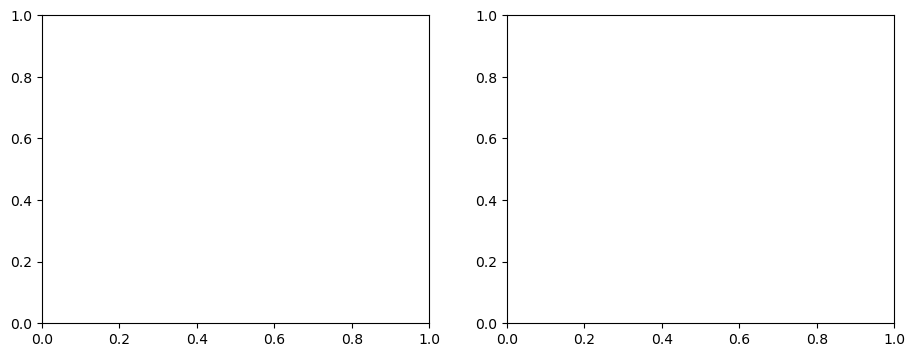

In [58]:
fig,axs = plt.subplots(1,2, figsize=(11,4))
axs = axs.ravel() 

labels = ['grass','crop','urban','lake']
pltColors = ['forestgreen','deepskyblue','orangered','blue']

for iLU in range(len(labels)): 
    axs[0].plot(diurnalCLM_h2_L50.hour.values, diurnalCLM_h2_L50.QFLX.isel(case=0,landunit=iLU).values, 
                color=pltColors[iLU], label=labels[iLU])
    axs[0].plot(diurnalCLM_h2_L50.hour.values, diurnalCLM_h2_L50.QFLX.isel(case=1,landunit=iLU).values, 
                color=pltColors[iLU], linestyle='--', label=None)
    
    axs[1].plot(diurnalCLM_h2_L250.hour.values, diurnalCLM_h2_L250.QFLX.isel(case=0,landunit=iLU).values, 
                color=pltColors[iLU], label=labels[iLU])
    axs[1].plot(diurnalCLM_h2_L250.hour.values, diurnalCLM_h2_L250.QFLX.isel(case=1,landunit=iLU).values, 
                color=pltColors[iLU], linestyle='--', label=None)
    
axs[0].plot(diurnalCLM_h2_L50.hour.values, diurnalCLM_h2_L50.QFLX.isel(case=0).mean(dim='landunit').values, 
                color='k', label='HOMmean')
axs[1].plot(diurnalCLM_h2_L250.hour.values, diurnalCLM_h2_L250.QFLX.isel(case=0).mean(dim='landunit').values, 
                color='k', label='HOMmean')
    
axs[0].plot(diurnalCLM_h2_L50.hour.values, diurnalCLM_h2_L50.QFLX.isel(case=1).mean(dim='landunit').values, 
                color='k', linestyle='--', label='HETmean')
axs[1].plot(diurnalCLM_h2_L250.hour.values, diurnalCLM_h2_L250.QFLX.isel(case=1).mean(dim='landunit').values, 
                color='k', linestyle='--', label='HETmean')

axs[0].legend()
axs[1].legend()

axs[0].set_title('QFLX: L0 = 50m')
axs[1].set_title('QFLX: L0 = 250m')

fig.subplots_adjust(wspace=0.3)

plt.show()

In [17]:
topLev = 500


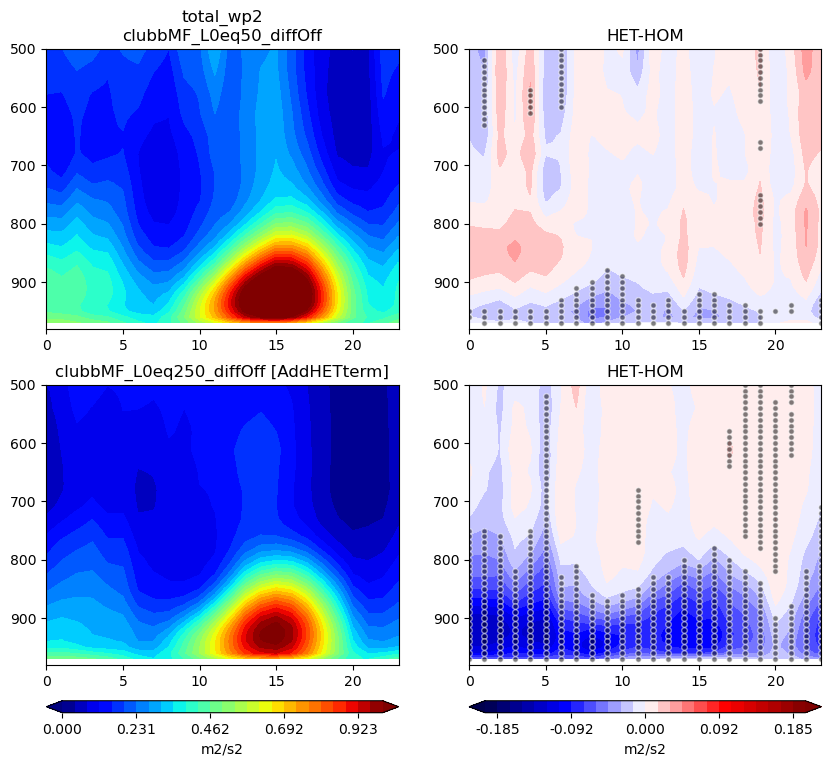

In [60]:
varPlot = 'total_wp2'
unitsStr = 'm2/s2'

cStep = (1-0)/26
clims = np.arange(0,1+cStep,cStep)
diffMax = 0.2
dStep = (2*diffMax)/26
dlims = np.arange(-diffMax, diffMax+dStep, dStep)

axs = plots_timeHeight(diurnal_h2_L50, diurnal_h2_L250, 
                       scamDS_h2_L50, scamDS_h2_L250,
                       varPlot, unitsStr, clims, dlims, topLev, 
                       pltHET=False,cbarFormat='%.3f', cbTicks=5)

# axs[0].axvline(9, color='white', linestyle='--')
# axs[0].axvline(14, color='white', linestyle='--')
# axs[1].axvline(9, color='white', linestyle='--')
# axs[1].axvline(14, color='white', linestyle='--')
# axs[2].axvline(9, color='green', linestyle='--')
# axs[2].axvline(14, color='green', linestyle='--')

# axs[0].axhline(800, color='white', linestyle='--')
# axs[1].axhline(800, color='white', linestyle='--')
# axs[2].axhline(800, color='green', linestyle='--')


In [61]:
# varPlot = 'total_wp2'
# unitsStr = 'm2/s2'

# cStep = (1-0)/26
# clims = np.arange(0,1+cStep,cStep)
# diffMax = 0.2
# dStep = (2*diffMax)/26
# dlims = np.arange(-diffMax, diffMax+dStep, dStep)

# axs = plots_timeHeight(diurnal_h2_L50, diurnal_h2_L250, 
#                        scamDS_h2_L50, scamDS_h2_L250,
#                        varPlot, unitsStr, clims, dlims, topLev, 
#                        pltHET=False,cbarFormat='%.3f', cbTicks=5)


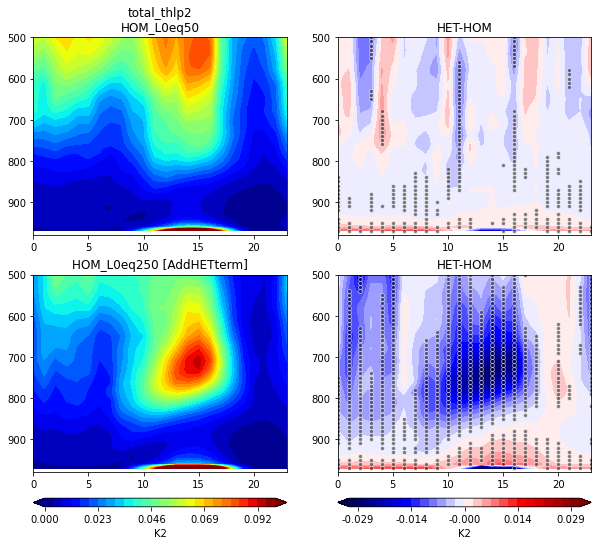

In [21]:
varPlot = 'total_thlp2'
unitsStr = 'K2'

cStep = (0.1-0)/26
clims = np.arange(0,0.1+cStep,cStep)
diffMax = 3.1e-2
dStep = (2*diffMax)/26
dlims = np.arange(-diffMax, diffMax+dStep, dStep)

axs = plots_timeHeight(diurnal_h2_L50, diurnal_h2_L250, 
                       scamDS_h2_L50, scamDS_h2_L250,
                       varPlot, unitsStr, clims, dlims, topLev, 
                      pltHET=False, cbarFormat='%.3f', cbTicks=5)



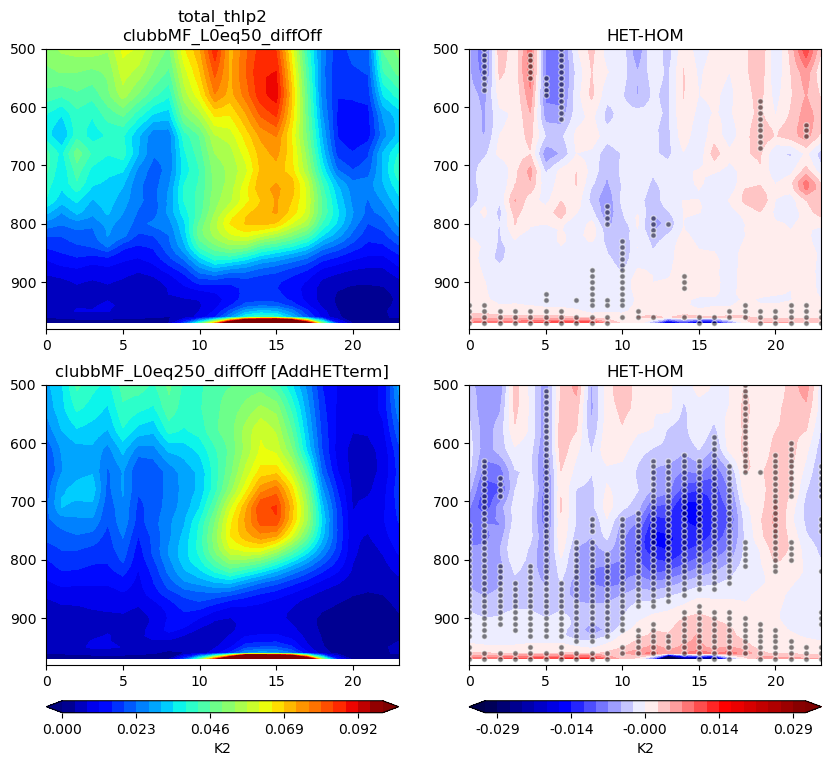

In [62]:
varPlot = 'total_thlp2'
unitsStr = 'K2'

cStep = (0.1-0)/26
clims = np.arange(0,0.1+cStep,cStep)
diffMax = 3.1e-2
dStep = (2*diffMax)/26
dlims = np.arange(-diffMax, diffMax+dStep, dStep)

axs = plots_timeHeight(diurnal_h2_L50, diurnal_h2_L250, 
                       scamDS_h2_L50, scamDS_h2_L250,
                       varPlot, unitsStr, clims, dlims, topLev, 
                      pltHET=False, cbarFormat='%.3f', cbTicks=5)



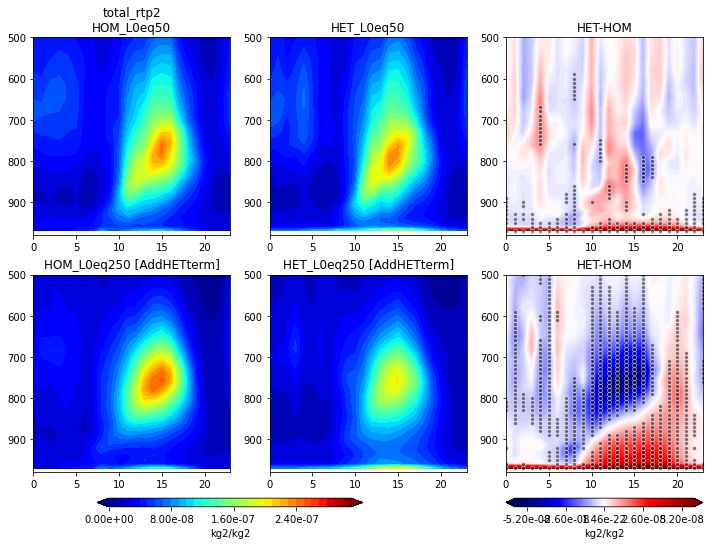

In [38]:
varPlot = 'total_rtp2'
unitsStr = 'kg2/kg2'

clims = np.arange(0,3.2e-7,1e-8)
dlims = np.arange(-6e-8, 6.1e-8, 0.1e-8)

axs = plots_timeHeight(diurnal_h2_L50, diurnal_h2_L250, 
                       scamDS_h2_L50, scamDS_h2_L250,
                       varPlot, unitsStr, clims, dlims, topLev, 
                       pltHET=True, cbarFormat='%.2e')


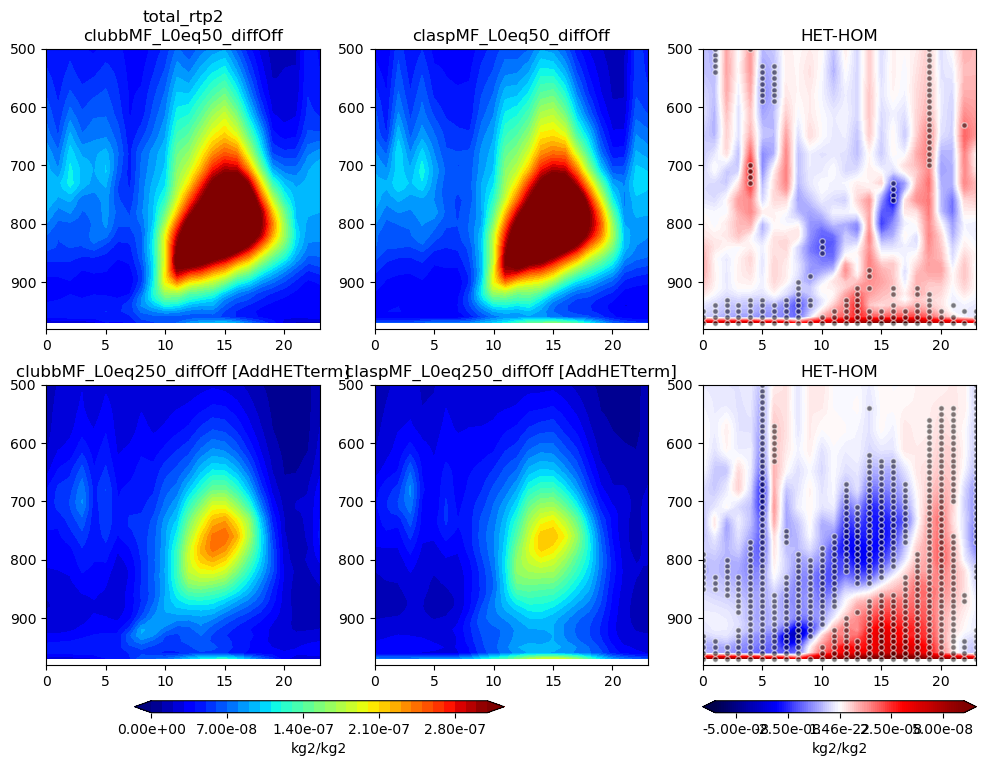

In [63]:
varPlot = 'total_rtp2'
unitsStr = 'kg2/kg2'

clims = np.arange(0,3.2e-7,1e-8)
dlims = np.arange(-6e-8, 6.1e-8, 0.1e-8)

axs = plots_timeHeight(diurnal_h2_L50, diurnal_h2_L250, 
                       scamDS_h2_L50, scamDS_h2_L250,
                       varPlot, unitsStr, clims, dlims, topLev, 
                       pltHET=True, cbarFormat='%.2e')


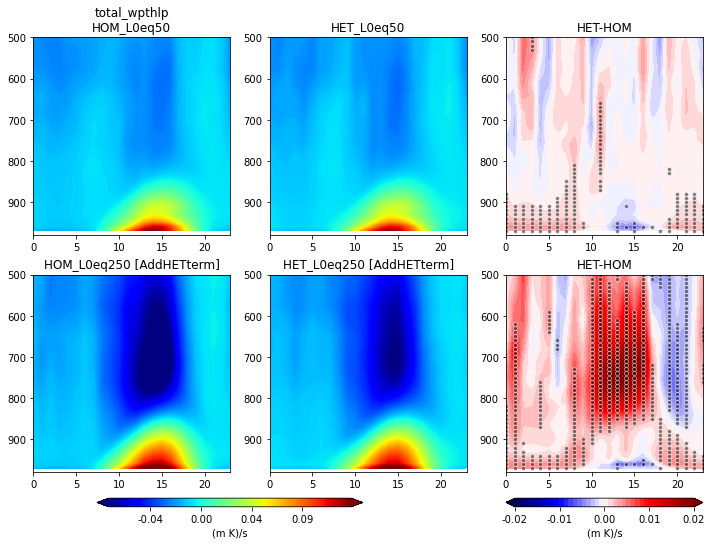

In [23]:
varPlot = 'total_wpthlp'
unitsStr = scamDS_h0_L50.wpthlp.units

clims = np.arange(-0.08,0.13,0.001)
dlims = np.arange(-2e-2, 2.1e-2, 0.1e-2)

axs = plots_timeHeight(diurnal_h2_L50, diurnal_h2_L250, 
                       scamDS_h2_L50, scamDS_h2_L250,
                       varPlot, unitsStr, clims, dlims, topLev)


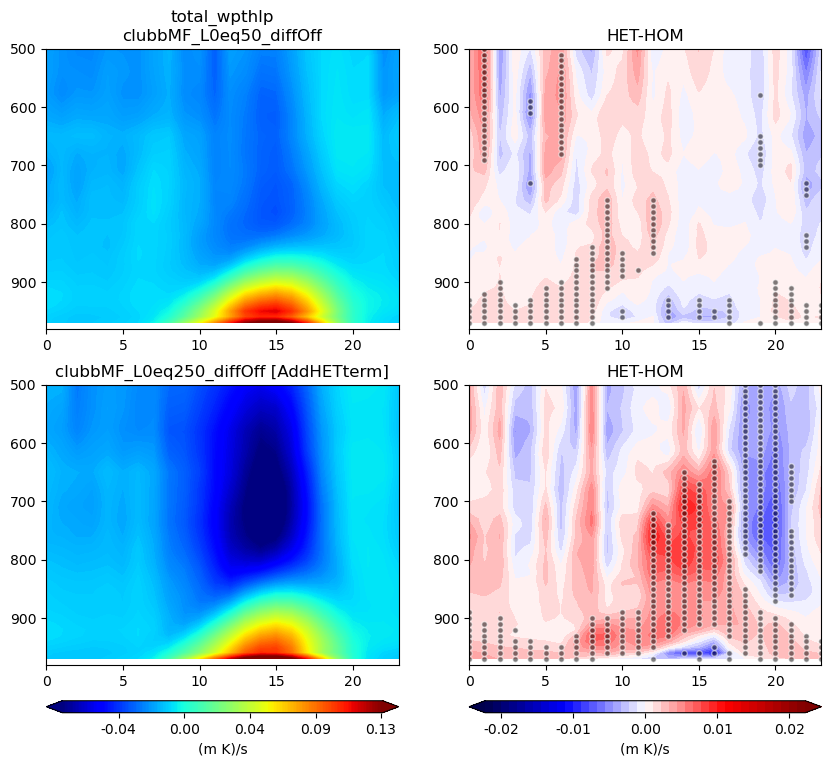

In [64]:
varPlot = 'total_wpthlp'
unitsStr = scamDS_h0_L250.wpthlp.units

clims = np.arange(-0.08,0.13,0.001)
dlims = np.arange(-2e-2, 2.1e-2, 0.1e-2)
topLev = 500

axs = plots_timeHeight(diurnal_h2_L50, diurnal_h2_L250, 
                       scamDS_h2_L50, scamDS_h2_L250,
                       varPlot, unitsStr, clims, dlims, topLev,
                      pltHET=False)


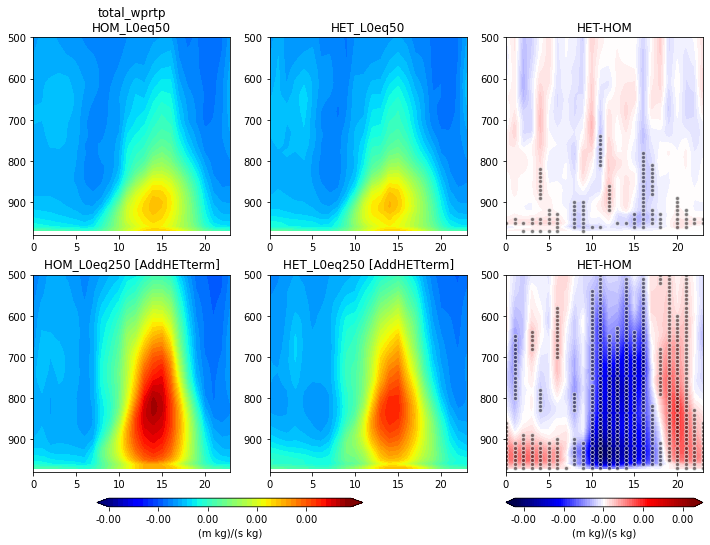

In [24]:
varPlot = 'total_wprtp'
unitsStr = scamDS_h0_L50.wprtp.units

clims = np.arange(-0.5e-4,2e-4,0.05e-4)
dlims = np.arange(-4e-5, 4.1e-5, 0.1e-5)

axs = plots_timeHeight(diurnal_h2_L50, diurnal_h2_L250, 
                       scamDS_h2_L50, scamDS_h2_L250,
                       varPlot, unitsStr, clims, dlims, topLev)


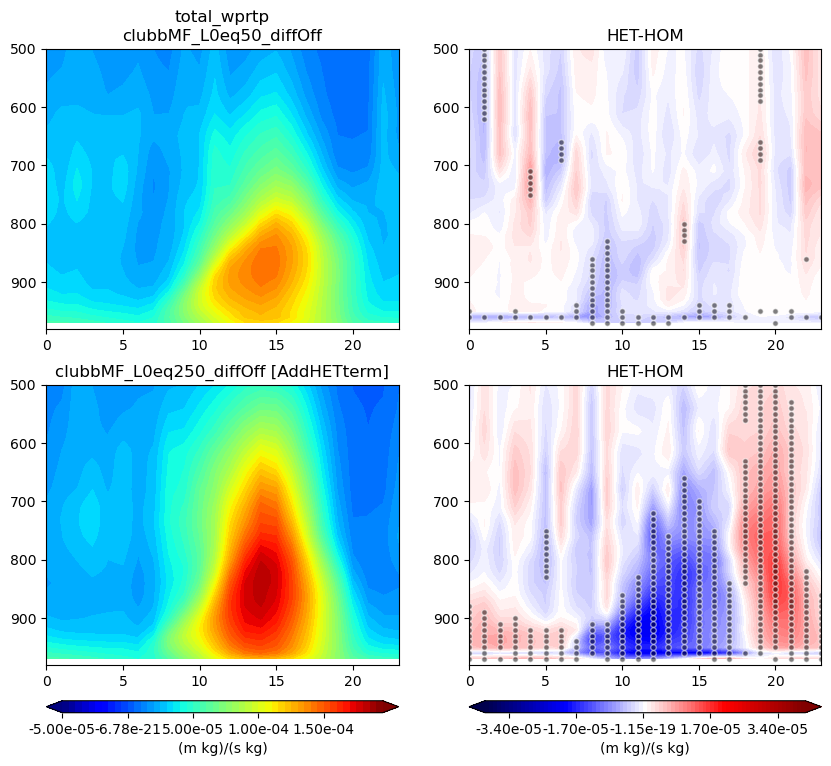

In [65]:
varPlot = 'total_wprtp'
unitsStr = scamDS_h0_L250.wprtp.units

clims = np.arange(-0.5e-4,2e-4,0.05e-4)
dlims = np.arange(-4e-5, 4.1e-5, 0.1e-5)

axs = plots_timeHeight(diurnal_h2_L50, diurnal_h2_L250, 
                       scamDS_h2_L50, scamDS_h2_L250,
                       varPlot, unitsStr, clims, dlims, topLev,
                      pltHET=False, cbarFormat='%.2e')


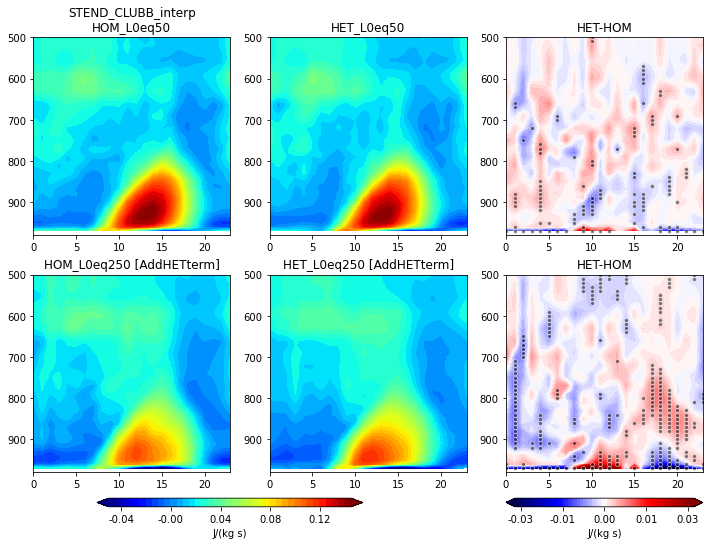

In [25]:
varPlot = 'STEND_CLUBB_interp'
unitsStr = scamDS_h0_L50.STEND_CLUBB.units

clims = np.arange(-0.5e-1, 1.5e-1, 0.05e-1)
dlims = np.arange(-3e-2,  3.1e-2, 0.1e-2)

axs = plots_timeHeight(diurnal_h0_L50, diurnal_h0_L250, 
                       scamDS_h0_L50, scamDS_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev)


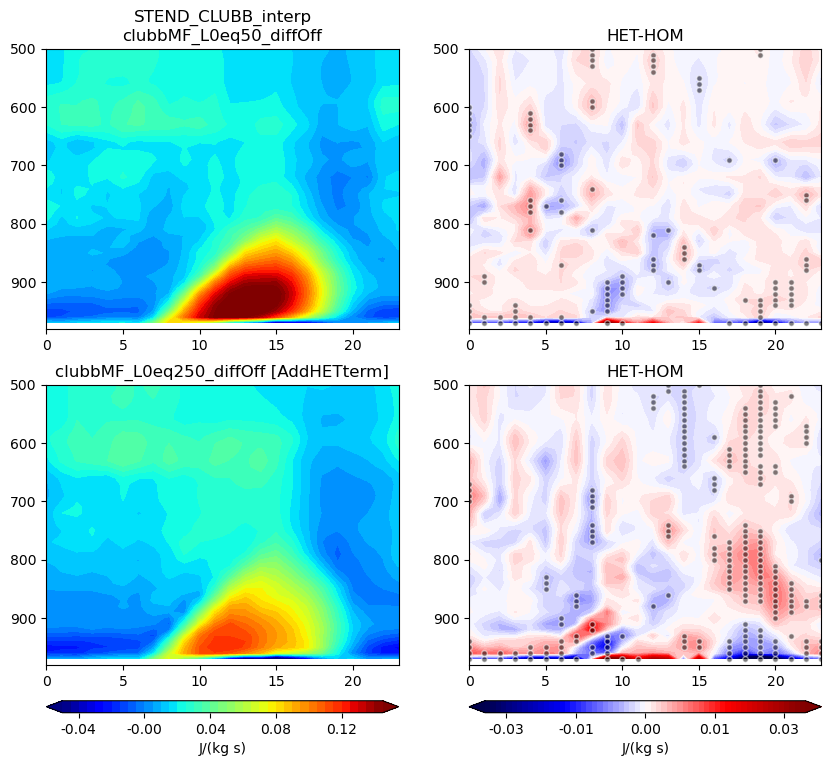

In [66]:
varPlot = 'STEND_CLUBB_interp'
unitsStr = scamDS_h0_L250.STEND_CLUBB.units

clims = np.arange(-0.5e-1, 1.5e-1, 0.05e-1)
dlims = np.arange(-3e-2,  3.1e-2, 0.1e-2)

axs = plots_timeHeight(diurnal_h0_L50, diurnal_h0_L250, 
                       scamDS_h0_L50, scamDS_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev,
                      pltHET=False)


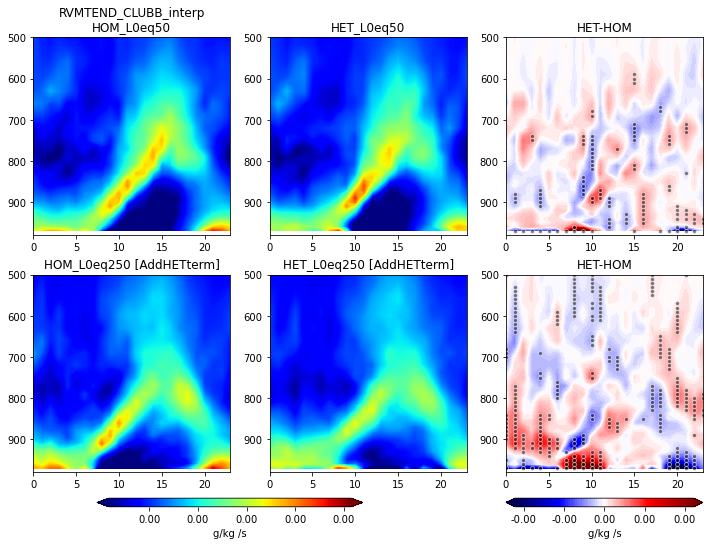

In [26]:
varPlot = 'RVMTEND_CLUBB_interp'
unitsStr = scamDS_h0_L50.RVMTEND_CLUBB.units

clims = np.arange(-2e-8, 1e-7, 0.05e-8)
dlims = np.arange(-4e-8,  4.1e-8, 0.1e-8)

axs = plots_timeHeight(diurnal_h0_L50, diurnal_h0_L250, 
                       scamDS_h0_L50, scamDS_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev)


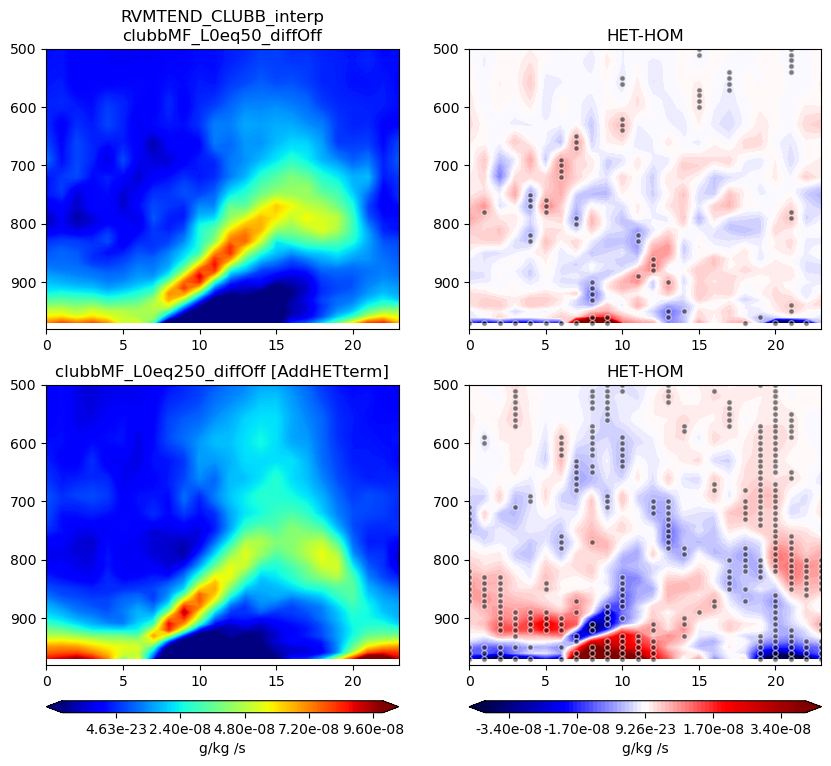

In [67]:
varPlot = 'RVMTEND_CLUBB_interp'
unitsStr = scamDS_h0_L250.RVMTEND_CLUBB.units

clims = np.arange(-2e-8, 1e-7, 0.05e-8)
dlims = np.arange(-4e-8,  4.1e-8, 0.1e-8)

axs = plots_timeHeight(diurnal_h0_L50, diurnal_h0_L250, 
                       scamDS_h0_L50, scamDS_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev,
                      pltHET=False, cbarFormat='%.2e')


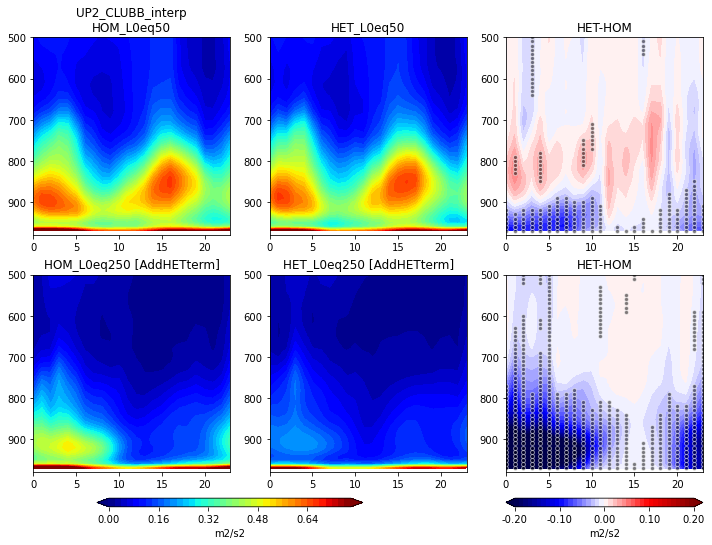

In [27]:
varPlot = 'UP2_CLUBB_interp'
unitsStr = scamDS_h0_L50.UP2_CLUBB.units

clims = np.arange(0, 0.8, 0.02)
dlims = np.arange(-0.2,  0.21, 0.01)

axs = plots_timeHeight(diurnal_h0_L50, diurnal_h0_L250, 
                       scamDS_h0_L50, scamDS_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev)


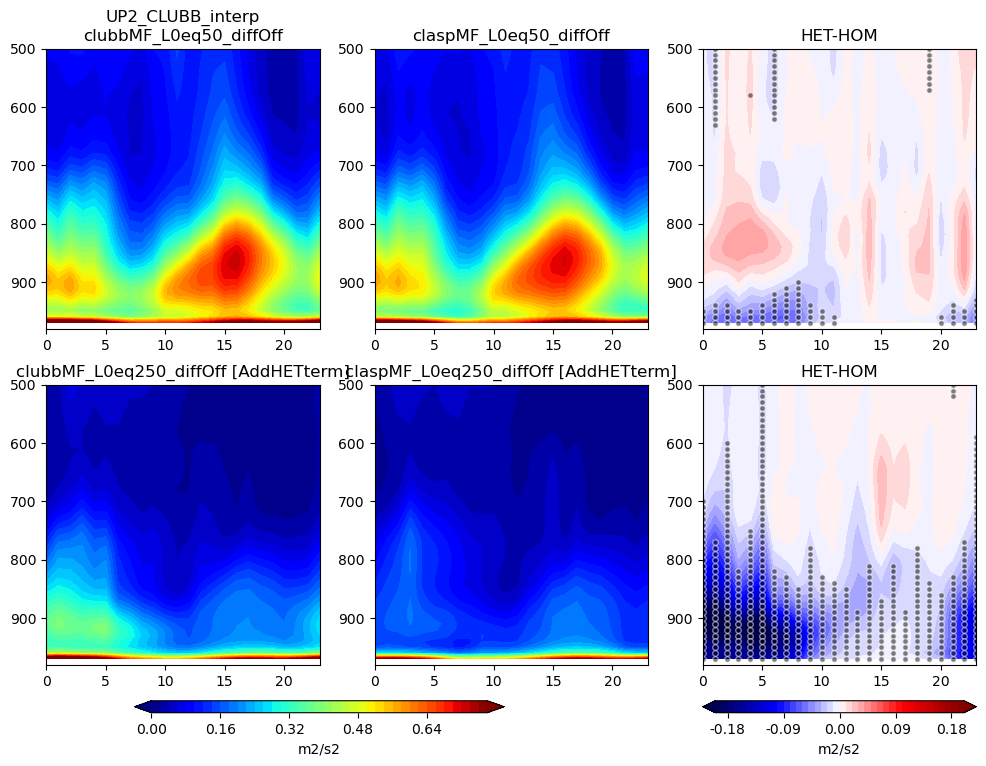

In [68]:
varPlot = 'UP2_CLUBB_interp'
unitsStr = scamDS_h0_L250.UP2_CLUBB.units

clims = np.arange(0, 0.8, 0.02)
dlims = np.arange(-0.2,  0.21, 0.01)

axs = plots_timeHeight(diurnal_h0_L50, diurnal_h0_L250, 
                       scamDS_h0_L50, scamDS_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev)


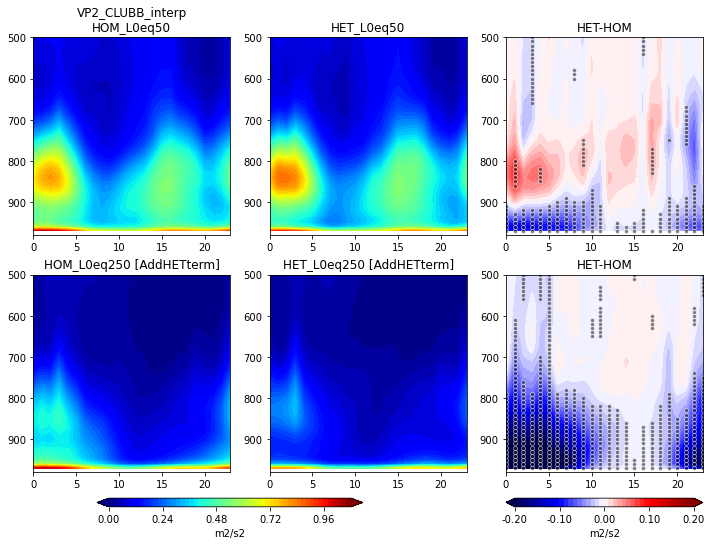

In [28]:
varPlot = 'VP2_CLUBB_interp'
unitsStr = scamDS_h0_L50.VP2_CLUBB.units

clims = np.arange(0, 1.1, 0.02)
dlims = np.arange(-0.2,  0.21, 0.01)

axs = plots_timeHeight(diurnal_h0_L50, diurnal_h0_L250, 
                       scamDS_h0_L50, scamDS_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev)


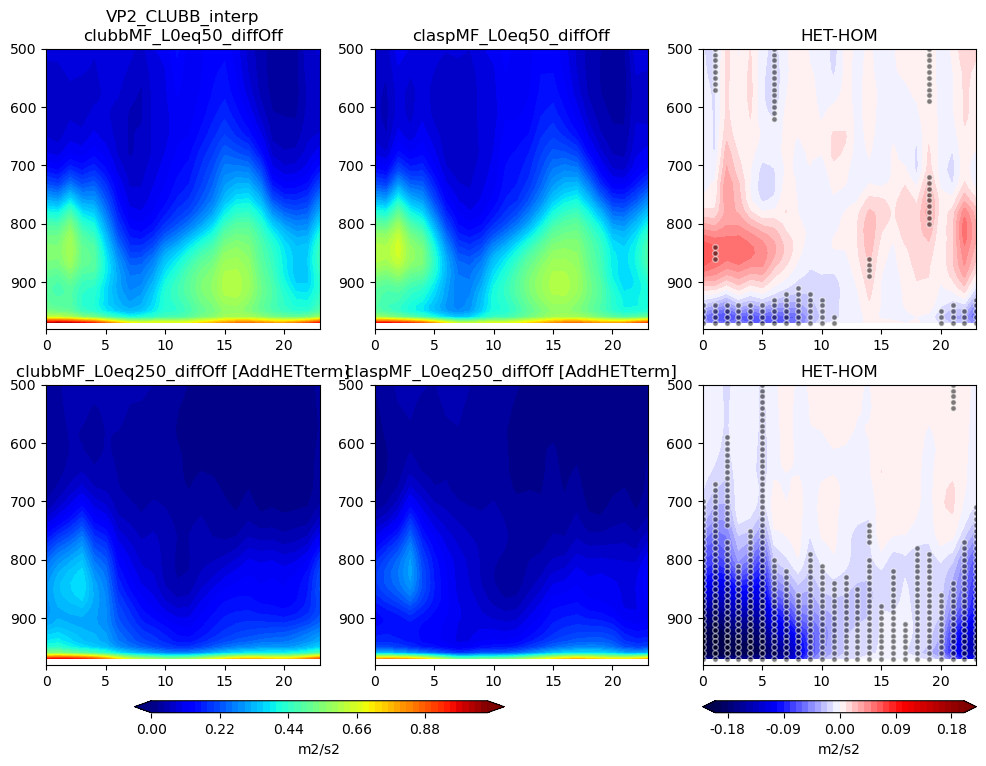

In [69]:
varPlot = 'VP2_CLUBB_interp'
unitsStr = scamDS_h0_L250.VP2_CLUBB.units

clims = np.arange(0, 1.1, 0.02)
dlims = np.arange(-0.2,  0.21, 0.01)

axs = plots_timeHeight(diurnal_h0_L50, diurnal_h0_L250, 
                       scamDS_h0_L50, scamDS_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev)


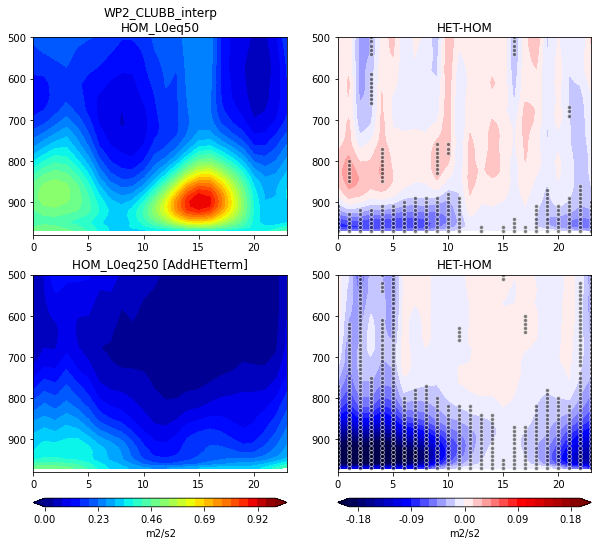

In [29]:
varPlot = 'WP2_CLUBB_interp'
unitsStr = scamDS_h0_L50.WP2_CLUBB.units

cStep = (1-0)/26
clims = np.arange(0,1+cStep,cStep)
diffMax = 0.2
dStep = (2*diffMax)/26
dlims = np.arange(-diffMax, diffMax+dStep, dStep)

axs = plots_timeHeight(diurnal_h0_L50, diurnal_h0_L250, 
                       scamDS_h0_L50, scamDS_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev,
                       pltHET=False)


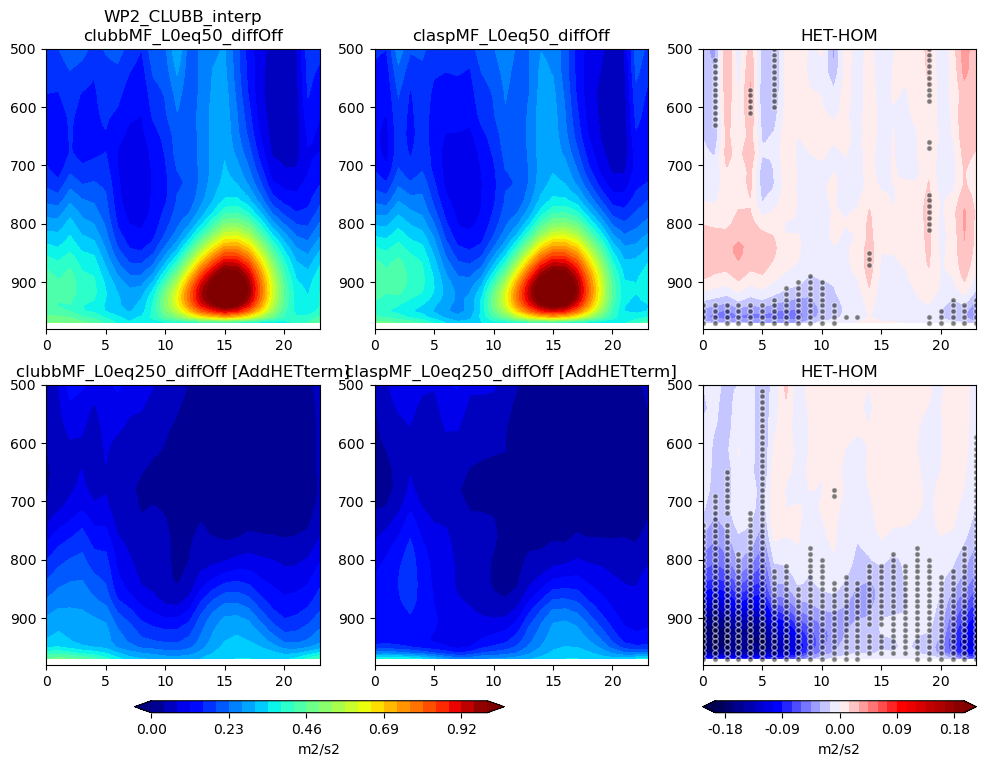

In [70]:
varPlot = 'WP2_CLUBB_interp'
unitsStr = scamDS_h0_L250.WP2_CLUBB.units

cStep = (1-0)/26
clims = np.arange(0,1+cStep,cStep)
diffMax = 0.2
dStep = (2*diffMax)/26
dlims = np.arange(-diffMax, diffMax+dStep, dStep)

axs = plots_timeHeight(diurnal_h0_L50, diurnal_h0_L250, 
                       scamDS_h0_L50, scamDS_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev,
                       pltHET=True)


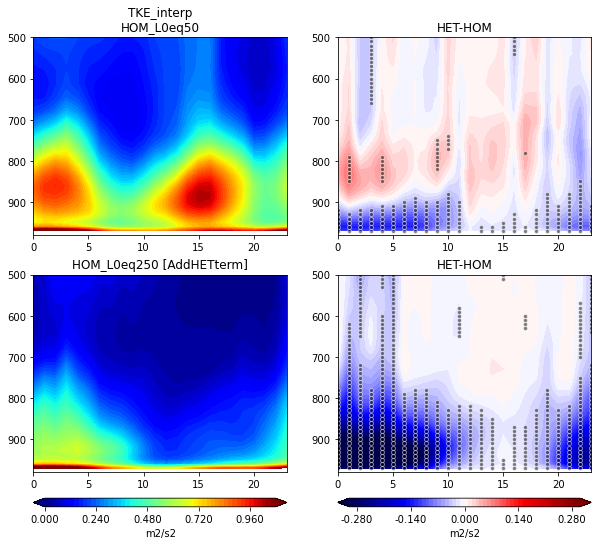

In [30]:
varPlot = 'TKE_interp'
unitsStr = scamDS_h0_L50.WP2_CLUBB.units

clims = np.arange(0, 1.1, 0.02)
dlims = np.arange(-0.3,  0.31, 0.01)

axs = plots_timeHeight(diurnal_h0_L50, diurnal_h0_L250, 
                       scamDS_h0_L50, scamDS_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev,
                       pltHET=False, cbarFormat='%.3f', cbTicks=5)


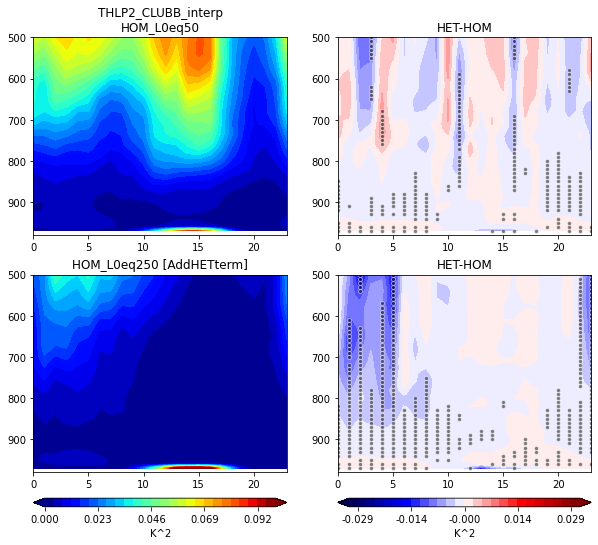

In [31]:
varPlot = 'THLP2_CLUBB_interp'
unitsStr = scamDS_h0_L50.THLP2_CLUBB.units

# clims = np.arange(0, 0.07, 0.002)
# dlims = np.arange(-0.02,  0.021, 0.001)
cStep = (0.1-0)/26
clims = np.arange(0,0.1+cStep,cStep)
diffMax = 3.1e-2
dStep = (2*diffMax)/26
dlims = np.arange(-diffMax, diffMax+dStep, dStep)


axs = plots_timeHeight(diurnal_h0_L50, diurnal_h0_L250, 
                       scamDS_h0_L50, scamDS_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev,
                       pltHET=False, cbarFormat='%.3f', cbTicks=5)


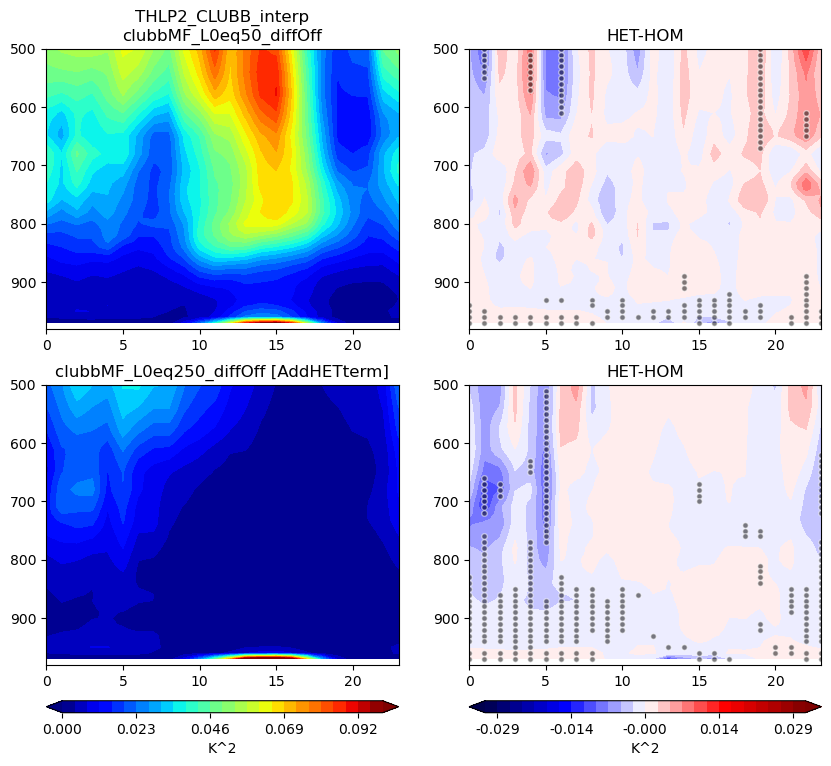

In [71]:
varPlot = 'THLP2_CLUBB_interp'
unitsStr = scamDS_h0_L250.THLP2_CLUBB.units

# clims = np.arange(0, 0.07, 0.002)
# dlims = np.arange(-0.02,  0.021, 0.001)
cStep = (0.1-0)/26
clims = np.arange(0,0.1+cStep,cStep)
diffMax = 3.1e-2
dStep = (2*diffMax)/26
dlims = np.arange(-diffMax, diffMax+dStep, dStep)


axs = plots_timeHeight(diurnal_h0_L50, diurnal_h0_L250, 
                       scamDS_h0_L50, scamDS_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev,
                       pltHET=False, cbarFormat='%.3f', cbTicks=5)


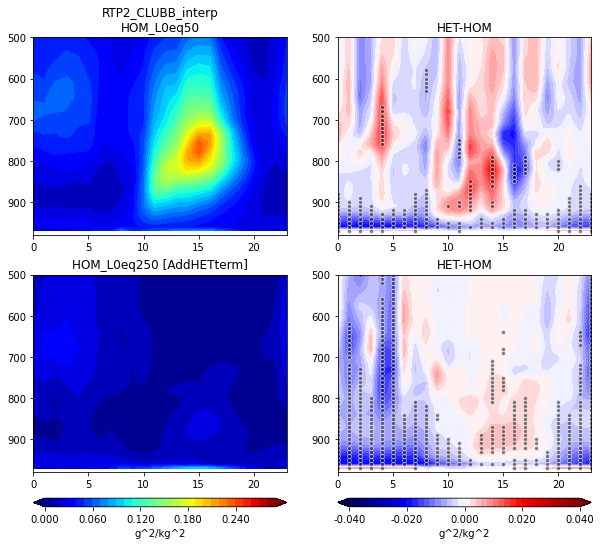

In [32]:
varPlot = 'RTP2_CLUBB_interp'
unitsStr = scamDS_h0_L50.RTP2_CLUBB.units

clims = np.arange(0, 0.3, 0.01)
dlims = np.arange(-0.4e-1,  0.42e-1, 0.02e-1)

axs = plots_timeHeight(diurnal_h0_L50, diurnal_h0_L250, 
                       scamDS_h0_L50, scamDS_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev,
                        pltHET=False, cbarFormat='%.3f', cbTicks=5)


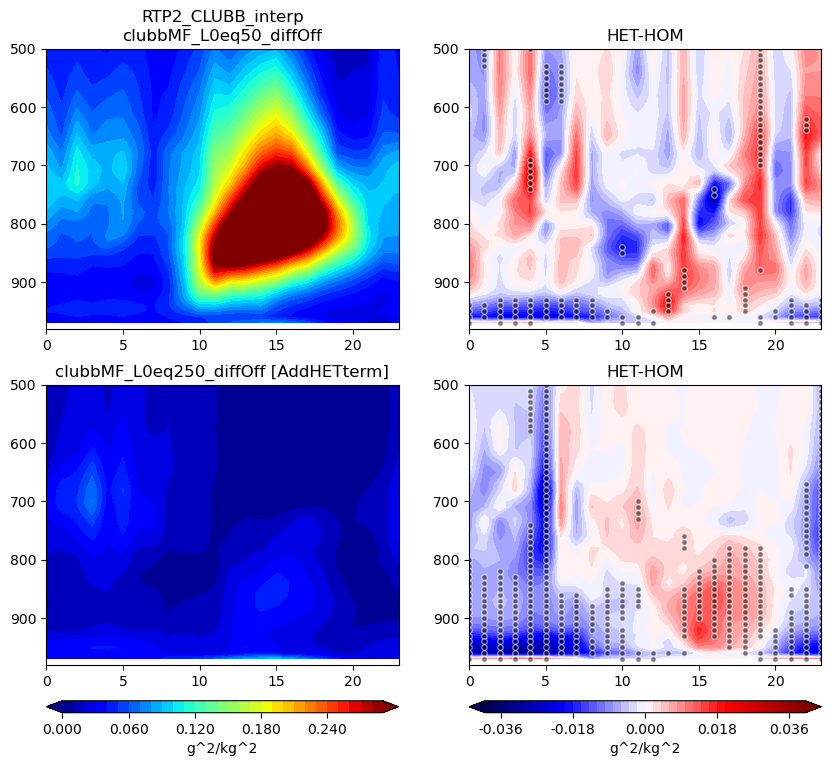

In [72]:
varPlot = 'RTP2_CLUBB_interp'
unitsStr = scamDS_h0_L250.RTP2_CLUBB.units

clims = np.arange(0, 0.3, 0.01)
dlims = np.arange(-0.4e-1,  0.42e-1, 0.02e-1)

axs = plots_timeHeight(diurnal_h0_L50, diurnal_h0_L250, 
                       scamDS_h0_L50, scamDS_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev,
                        pltHET=False, cbarFormat='%.3f', cbTicks=5)


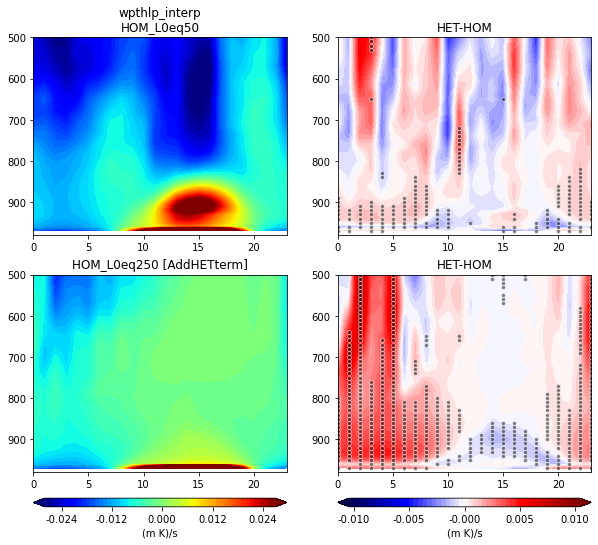

In [33]:
varPlot = 'wpthlp_interp'
unitsStr = scamDS_h0_L50.wpthlp.units

clims = np.arange(-2.8e-2, 2.8e-2, 0.1e-2)
dlims = np.arange(-1e-2,  1.04e-2, 0.04e-2)

axs = plots_timeHeight(diurnal_h0_L50, diurnal_h0_L250, 
                       scamDS_h0_L50, scamDS_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev,
                        pltHET=False, cbarFormat='%.3f', cbTicks=5)


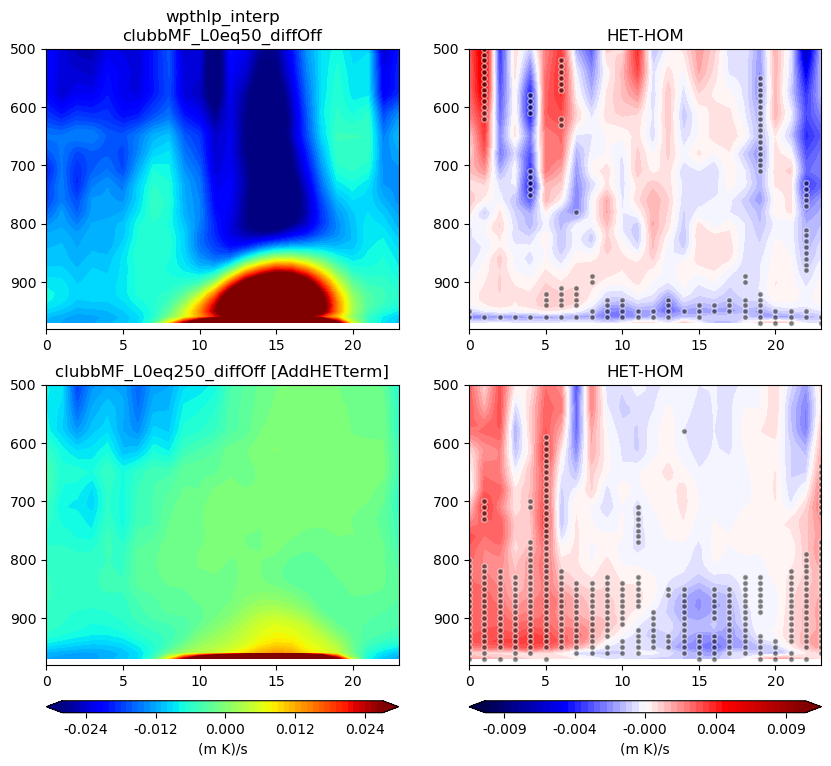

In [73]:
varPlot = 'wpthlp_interp'
unitsStr = scamDS_h0_L250.wpthlp.units

clims = np.arange(-2.8e-2, 2.8e-2, 0.1e-2)
dlims = np.arange(-1e-2,  1.04e-2, 0.04e-2)

axs = plots_timeHeight(diurnal_h0_L50, diurnal_h0_L250, 
                       scamDS_h0_L50, scamDS_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev,
                        pltHET=False, cbarFormat='%.3f', cbTicks=5)


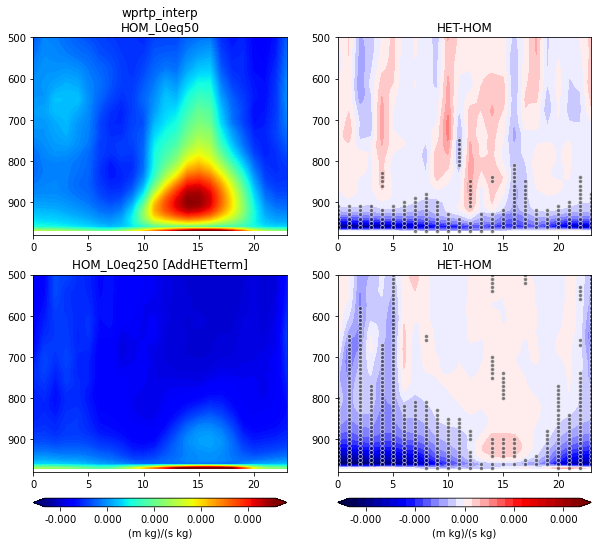

In [34]:
varPlot  = 'wprtp_interp'
unitsStr = scamDS_h0_L50.wprtp.units

clims = np.arange(-0.8e-5, 1.1e-4, 0.1e-5)
dlims = np.arange(-2.8e-5, 3.0e-5, 0.2e-5)

axs = plots_timeHeight(diurnal_h0_L50, diurnal_h0_L250, 
                       scamDS_h0_L50, scamDS_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev,
                        pltHET=False, cbarFormat='%.3f', cbTicks=5)


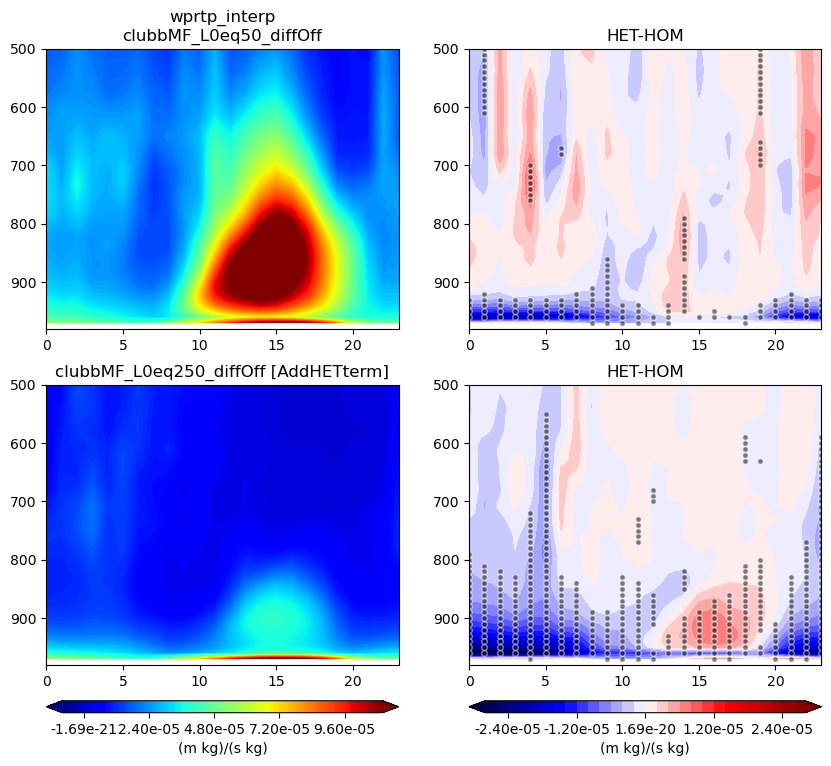

In [74]:
varPlot  = 'wprtp_interp'
unitsStr = scamDS_h0_L250.wprtp.units

clims = np.arange(-0.8e-5, 1.1e-4, 0.1e-5)
dlims = np.arange(-2.8e-5, 3.0e-5, 0.2e-5)

axs = plots_timeHeight(diurnal_h0_L50, diurnal_h0_L250, 
                       scamDS_h0_L50, scamDS_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev,
                        pltHET=False, cbarFormat='%.2e', cbTicks=5)


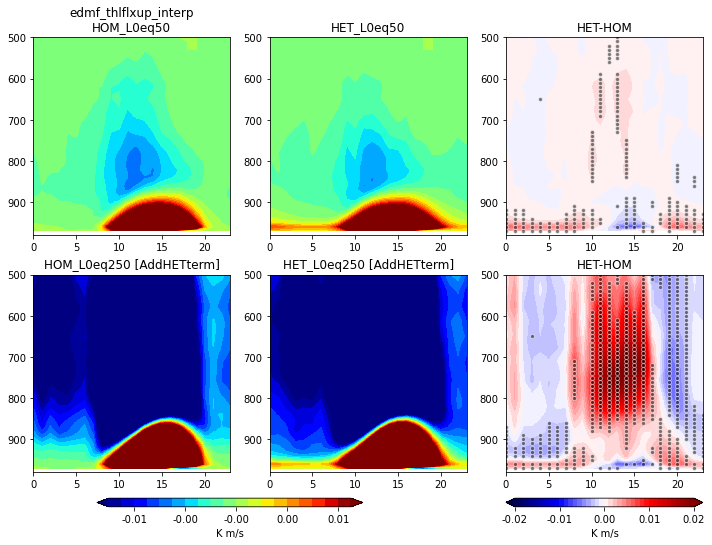

In [35]:
varPlot = 'edmf_thlflxup_interp'
unitsStr = scamDS_h2_L50.edmf_thlflxup.units

clims = np.arange(-1e-2, 1e-2, 0.1e-2)
dlims = np.arange(-2e-2, 2.1e-2, 0.1e-2)

axs = plots_timeHeight(diurnal_h2_L50, diurnal_h2_L250, 
                       scamDS_h2_L50, scamDS_h2_L250,
                       varPlot, unitsStr, clims, dlims, topLev)


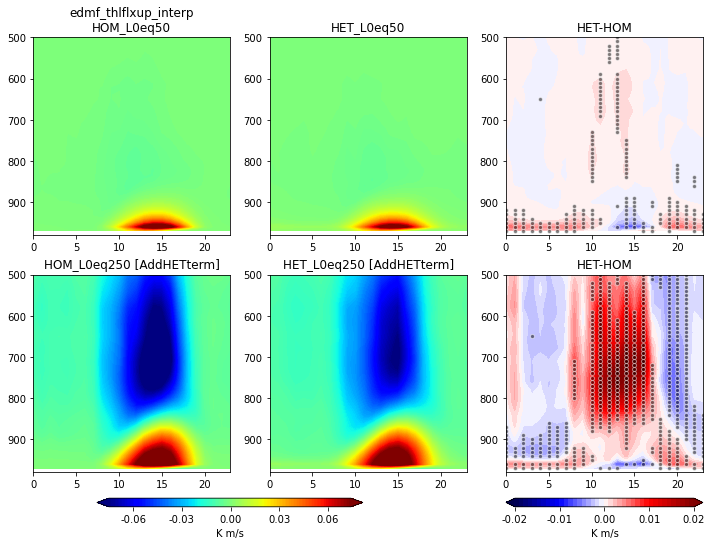

In [36]:
varPlot = 'edmf_thlflxup_interp'
unitsStr = scamDS_h2_L50.edmf_thlflxup.units

clims = np.arange(-8e-2, 8e-2, 0.1e-2)
dlims = np.arange(-2e-2, 2.1e-2, 0.1e-2)

axs = plots_timeHeight(diurnal_h2_L50, diurnal_h2_L250, 
                       scamDS_h2_L50, scamDS_h2_L250,
                       varPlot, unitsStr, clims, dlims, topLev, 
                       pltHET=True, cbarFormat='%.2f', cbTicks=5)


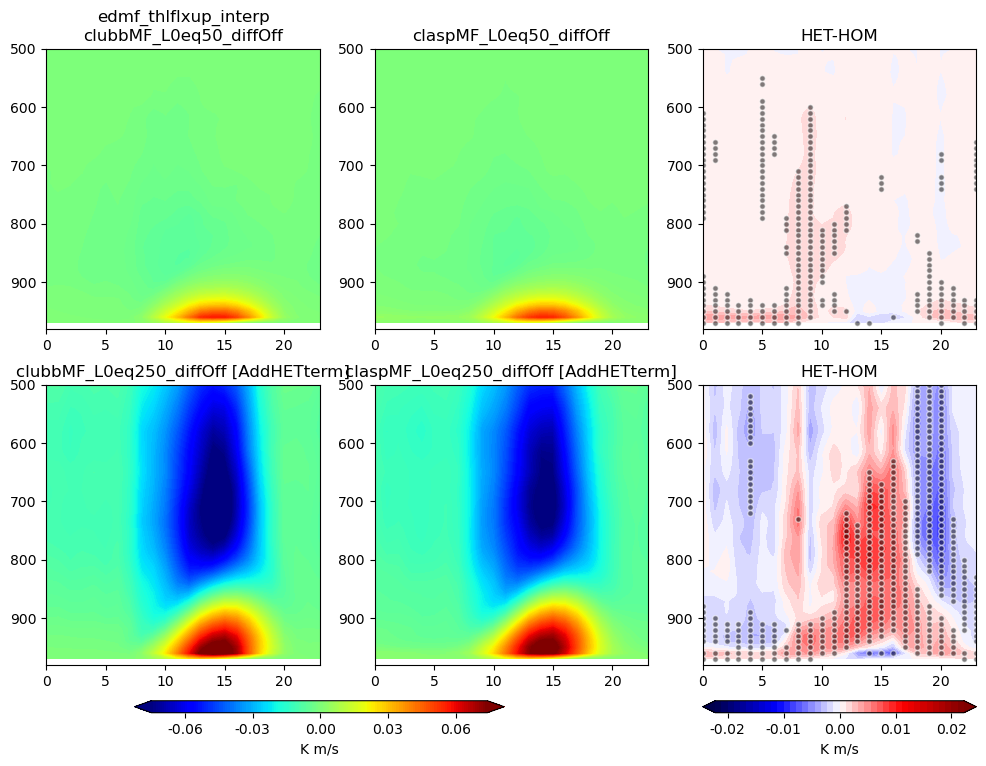

In [75]:
varPlot = 'edmf_thlflxup_interp'
unitsStr = scamDS_h2_L250.edmf_thlflxup.units

clims = np.arange(-8e-2, 8e-2, 0.1e-2)
dlims = np.arange(-2e-2, 2.1e-2, 0.1e-2)

axs = plots_timeHeight(diurnal_h2_L50, diurnal_h2_L250, 
                       scamDS_h2_L50, scamDS_h2_L250,
                       varPlot, unitsStr, clims, dlims, topLev, 
                       pltHET=True, cbarFormat='%.2f', cbTicks=5)


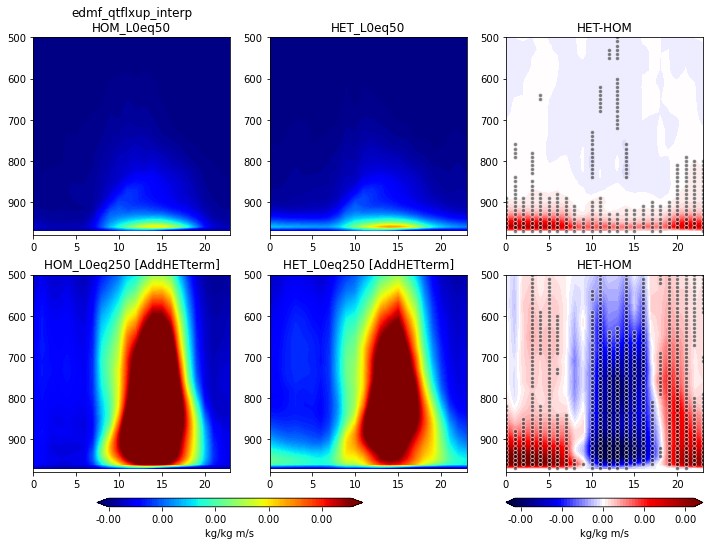

In [37]:
varPlot = 'edmf_qtflxup_interp'
unitsStr = scamDS_h2_L50.edmf_qtflxup.units

clims = np.arange(-1e-7, 1e-4, 0.1e-5)
dlims = np.arange(-3e-5, 3.1e-5, 0.1e-5)

axs = plots_timeHeight(diurnal_h2_L50, diurnal_h2_L250, 
                       scamDS_h2_L50, scamDS_h2_L250,
                       varPlot, unitsStr, clims, dlims, topLev) 


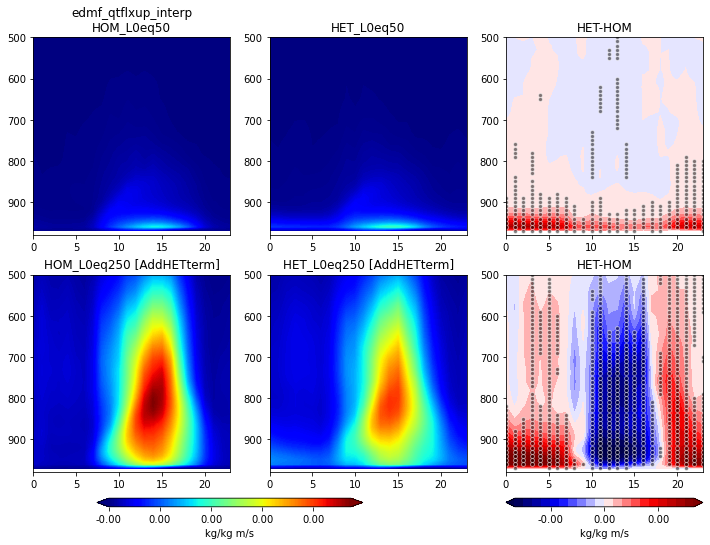

In [38]:
varPlot = 'edmf_qtflxup_interp'
unitsStr = scamDS_h2_L50.edmf_qtflxup.units

clims = np.arange(-1e-7, 1.8e-4, 0.1e-5)
dlims = np.arange(-3e-5, 3.3e-5, 0.3e-5)

axs = plots_timeHeight(diurnal_h2_L50, diurnal_h2_L250, 
                       scamDS_h2_L50, scamDS_h2_L250,
                       varPlot, unitsStr, clims, dlims, topLev)


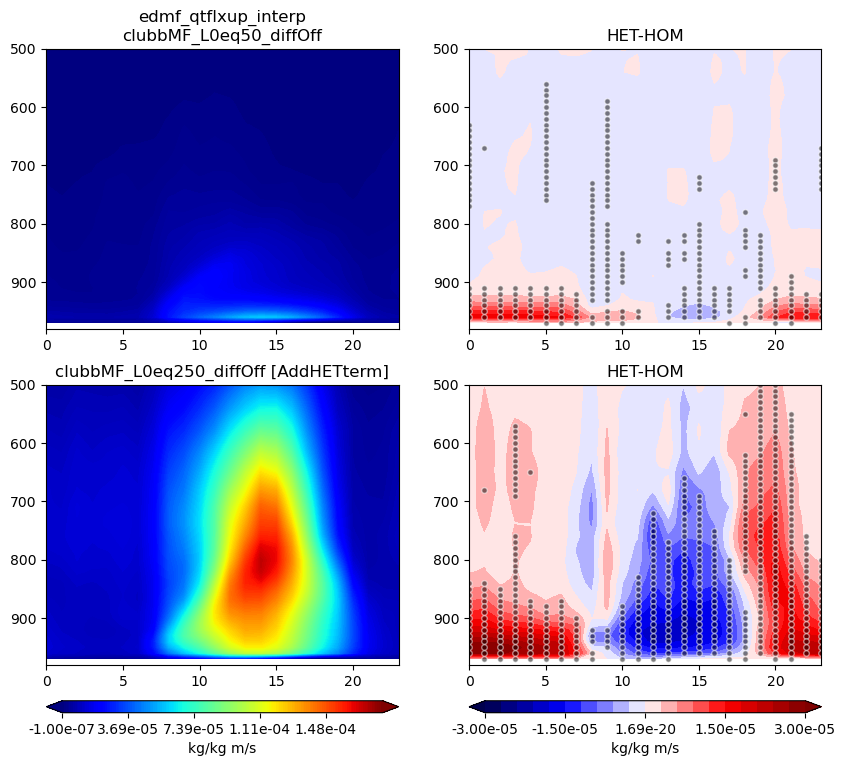

In [76]:
varPlot = 'edmf_qtflxup_interp'
unitsStr = scamDS_h2_L250.edmf_qtflxup.units

clims = np.arange(-1e-7, 1.8e-4, 0.1e-5)
dlims = np.arange(-3e-5, 3.3e-5, 0.3e-5)

axs = plots_timeHeight(diurnal_h2_L50, diurnal_h2_L250, 
                       scamDS_h2_L50, scamDS_h2_L250,
                       varPlot, unitsStr, clims, dlims, topLev,
                      pltHET=False, cbarFormat='%.2e', cbTicks=5 )


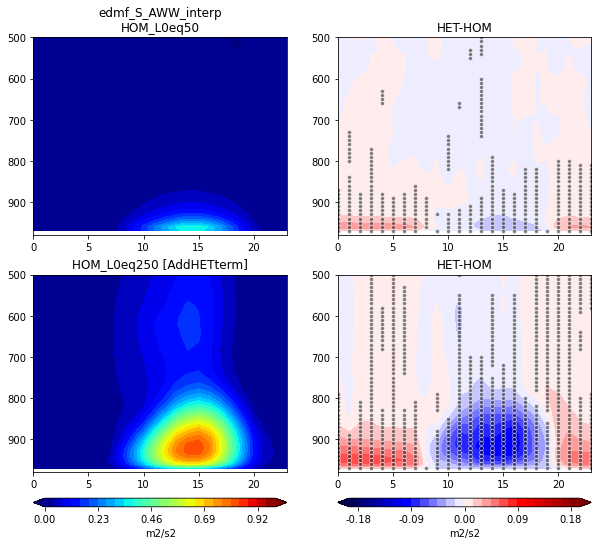

In [39]:
varPlot = 'edmf_S_AWW_interp'
unitsStr = scamDS_h2_L50.edmf_S_AWW.units

cStep = (1-0)/26
clims = np.arange(0,1+cStep,cStep)
diffMax = 0.2
dStep = (2*diffMax)/26
dlims = np.arange(-diffMax, diffMax+dStep, dStep)

axs = plots_timeHeight(diurnal_h2_L50, diurnal_h2_L250, 
                       scamDS_h2_L50, scamDS_h2_L250,
                       varPlot, unitsStr, clims, dlims, topLev,
                        pltHET=False)


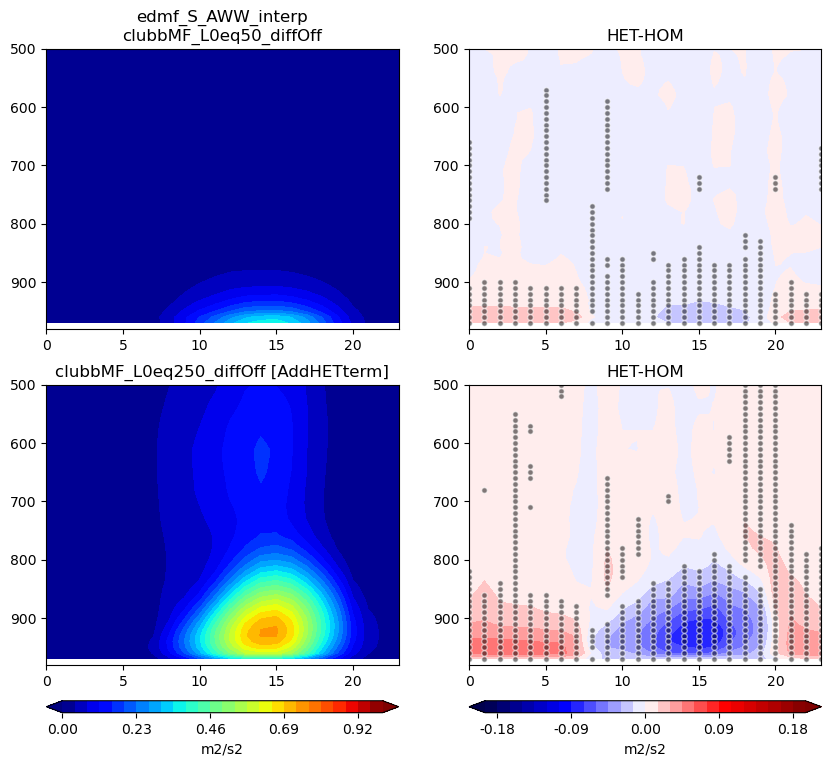

In [77]:
varPlot = 'edmf_S_AWW_interp'
unitsStr = scamDS_h2_L250.edmf_S_AWW.units

cStep = (1-0)/26
clims = np.arange(0,1+cStep,cStep)
diffMax = 0.2
dStep = (2*diffMax)/26
dlims = np.arange(-diffMax, diffMax+dStep, dStep)

axs = plots_timeHeight(diurnal_h2_L50, diurnal_h2_L250, 
                       scamDS_h2_L50, scamDS_h2_L250,
                       varPlot, unitsStr, clims, dlims, topLev,
                        pltHET=False)


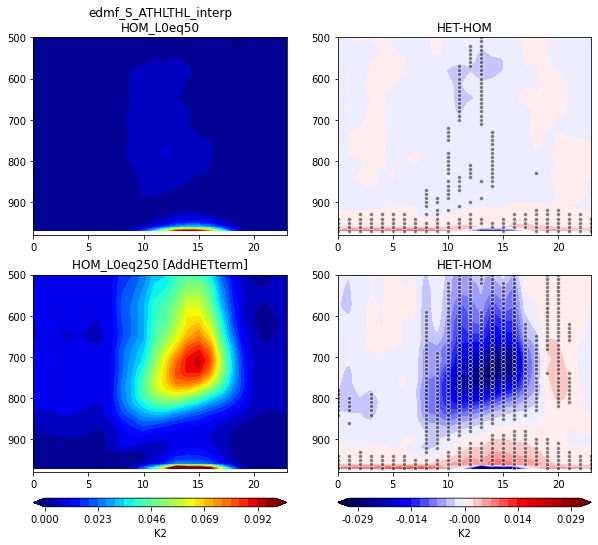

In [40]:
varPlot = 'edmf_S_ATHLTHL_interp'
unitsStr = scamDS_h2_L50.edmf_S_ATHLTHL.units

# clims = np.arange(0, 0.08, 0.002)
# dlims = np.arange(-1e-2, 1.2e-2, 0.2e-3)
cStep = (0.1-0)/26
clims = np.arange(0,0.1+cStep,cStep)
diffMax = 3.1e-2
dStep = (2*diffMax)/26
dlims = np.arange(-diffMax, diffMax+dStep, dStep)


axs = plots_timeHeight(diurnal_h2_L50, diurnal_h2_L250, 
                       scamDS_h2_L50, scamDS_h2_L250,
                       varPlot, unitsStr, clims, dlims, topLev,
                        pltHET=False, cbarFormat='%.3f', cbTicks=5)


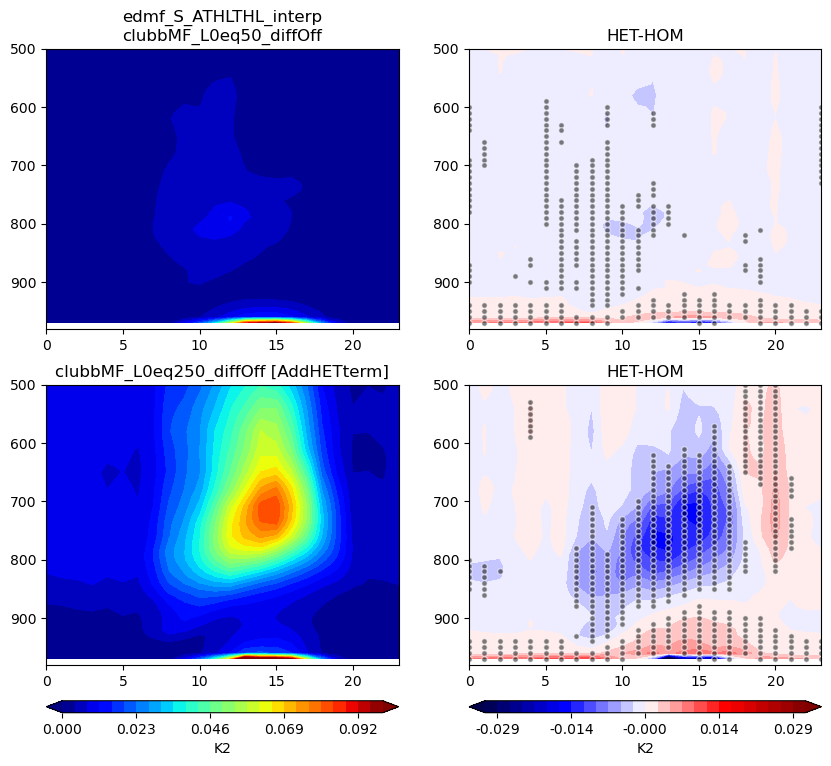

In [78]:
varPlot = 'edmf_S_ATHLTHL_interp'
unitsStr = scamDS_h2_L250.edmf_S_ATHLTHL.units

# clims = np.arange(0, 0.08, 0.002)
# dlims = np.arange(-1e-2, 1.2e-2, 0.2e-3)
cStep = (0.1-0)/26
clims = np.arange(0,0.1+cStep,cStep)
diffMax = 3.1e-2
dStep = (2*diffMax)/26
dlims = np.arange(-diffMax, diffMax+dStep, dStep)


axs = plots_timeHeight(diurnal_h2_L50, diurnal_h2_L250, 
                       scamDS_h2_L50, scamDS_h2_L250,
                       varPlot, unitsStr, clims, dlims, topLev,
                        pltHET=False, cbarFormat='%.3f', cbTicks=5)


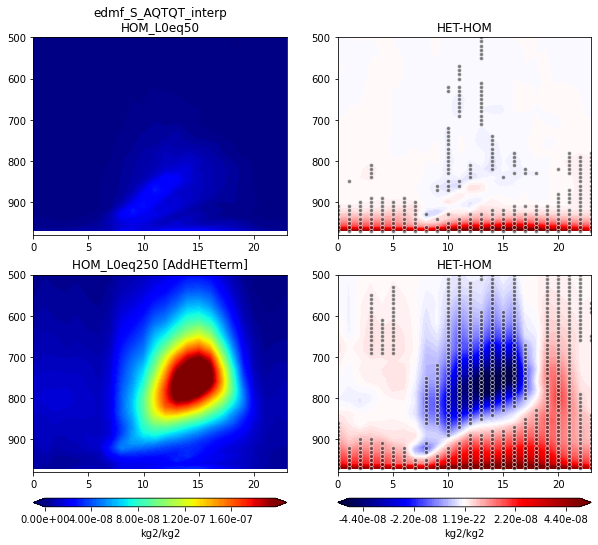

In [37]:
varPlot = 'edmf_S_AQTQT_interp'
unitsStr = scamDS_h2_L50.edmf_S_AQTQT.units

clims = np.arange(0, 2e-7, 0.02e-7)
dlims = np.arange(-5e-8, 5.1e-8, 0.1e-8)

axs = plots_timeHeight(diurnal_h2_L50, diurnal_h2_L250, 
                       scamDS_h2_L50, scamDS_h2_L250,
                       varPlot, unitsStr, clims, dlims, topLev,
                        pltHET=False, cbarFormat='%.2e', cbTicks=5)


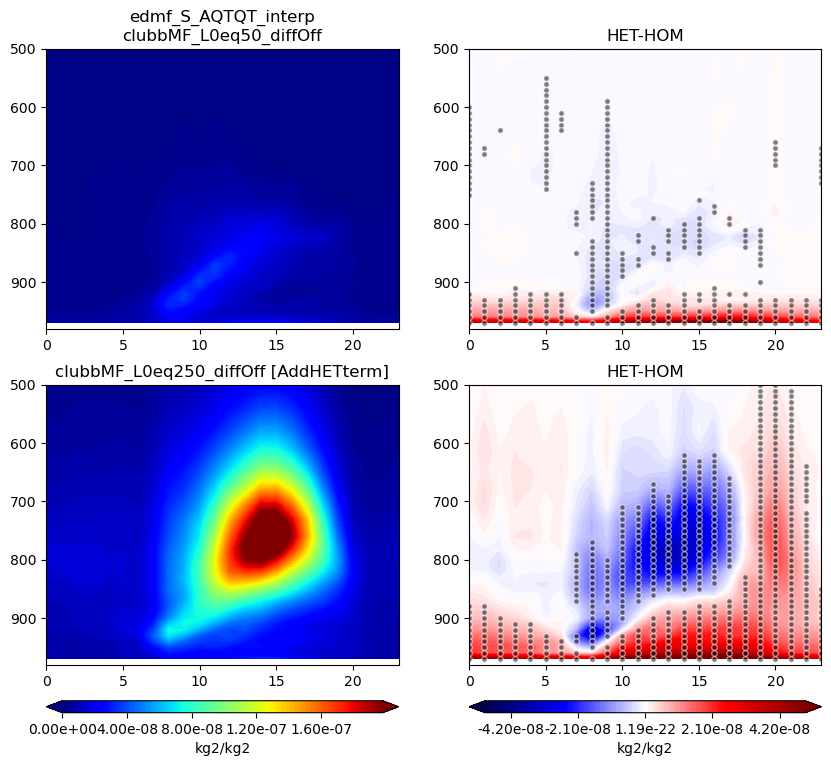

In [79]:
varPlot = 'edmf_S_AQTQT_interp'
unitsStr = scamDS_h2_L250.edmf_S_AQTQT.units

clims = np.arange(0, 2e-7, 0.02e-7)
dlims = np.arange(-5e-8, 5.1e-8, 0.1e-8)

axs = plots_timeHeight(diurnal_h2_L50, diurnal_h2_L250, 
                       scamDS_h2_L50, scamDS_h2_L250,
                       varPlot, unitsStr, clims, dlims, topLev,
                        pltHET=False, cbarFormat='%.2e', cbTicks=5)


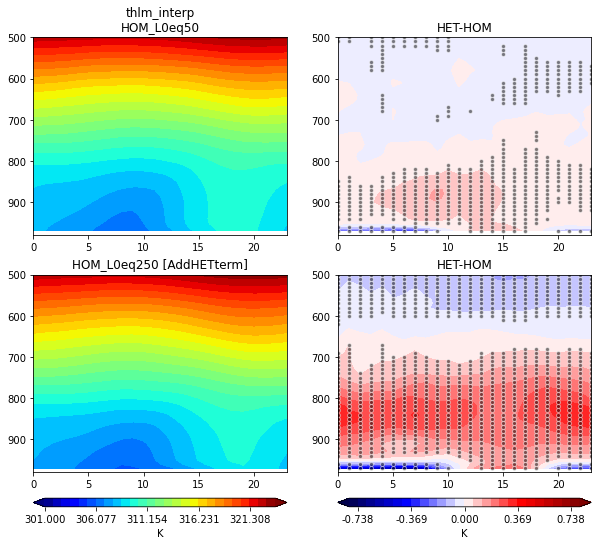

In [ ]:
# varPlot = 'THETAL_interp'
varPlot = 'thlm_interp'
unitsStr = scamDS_h0_L50.thlm.units

cStep = (323 - 301)/26
clims = np.arange(301, 323+cStep, cStep)
dMax = 0.8
dStep = (2*dMax)/26
dlims = np.arange(-dMax, dMax+dStep, dStep)

axs = plots_timeHeight(diurnal_h0_L50, diurnal_h0_L250, 
                       scamDS_h0_L50, scamDS_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev,
                       pltHET=False, cbarFormat='%.3f', cbTicks=5)



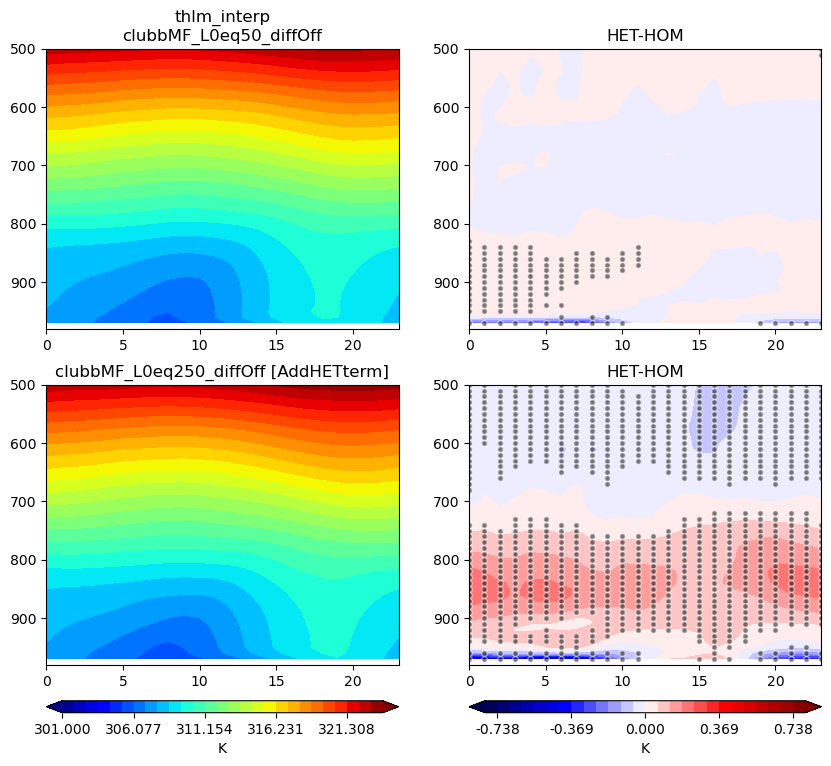

In [80]:
# varPlot = 'THETAL_interp'
varPlot = 'thlm_interp'
unitsStr = scamDS_h0_L250.thlm.units

cStep = (323 - 301)/26
clims = np.arange(301, 323+cStep, cStep)
dMax = 0.8
dStep = (2*dMax)/26
dlims = np.arange(-dMax, dMax+dStep, dStep)

axs = plots_timeHeight(diurnal_h0_L50, diurnal_h0_L250, 
                       scamDS_h0_L50, scamDS_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev,
                       pltHET=False, cbarFormat='%.3f', cbTicks=5)



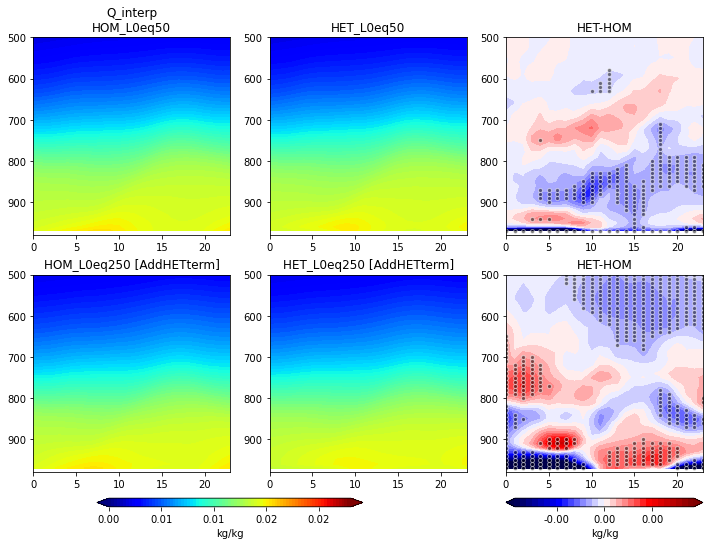

In [ ]:
varPlot = 'Q_interp'
unitsStr = scamDS_h0_L50.Q.units

clims = np.arange(0,0.025,0.0003)
dlims = np.arange(-0.3e-3, 0.32e-3, 0.02e-3)

axs = plots_timeHeight(diurnal_h0_L50, diurnal_h0_L250, 
                       scamDS_h0_L50, scamDS_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev)



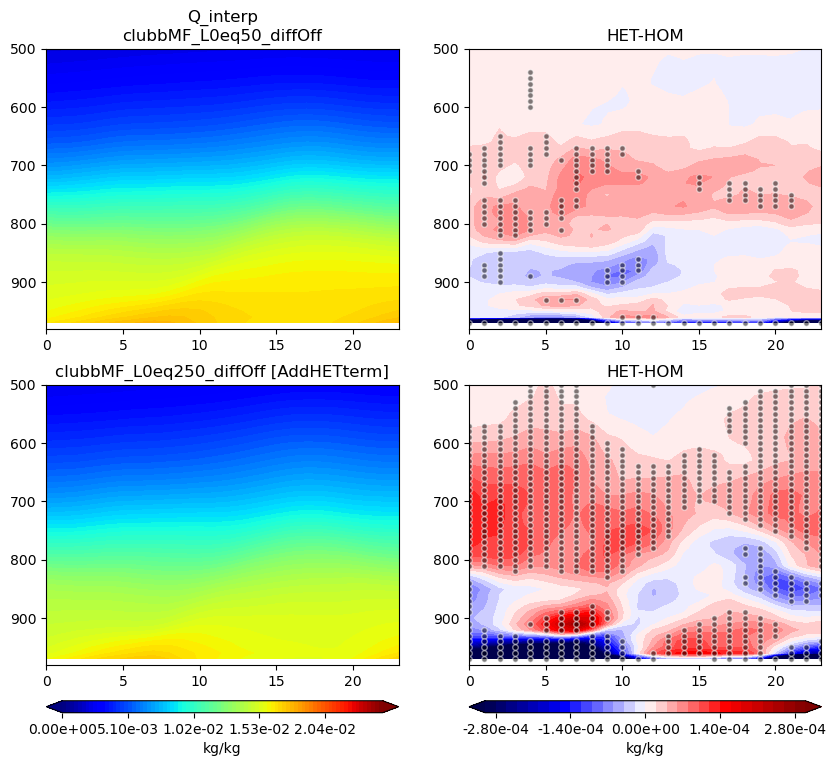

In [81]:
varPlot = 'Q_interp'
unitsStr = scamDS_h0_L250.Q.units

clims = np.arange(0,0.025,0.0003)
dlims = np.arange(-0.3e-3, 0.32e-3, 0.02e-3)

axs = plots_timeHeight(diurnal_h0_L50, diurnal_h0_L250, 
                       scamDS_h0_L50, scamDS_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev,
                       pltHET=False, cbarFormat='%.2e', cbTicks=5)



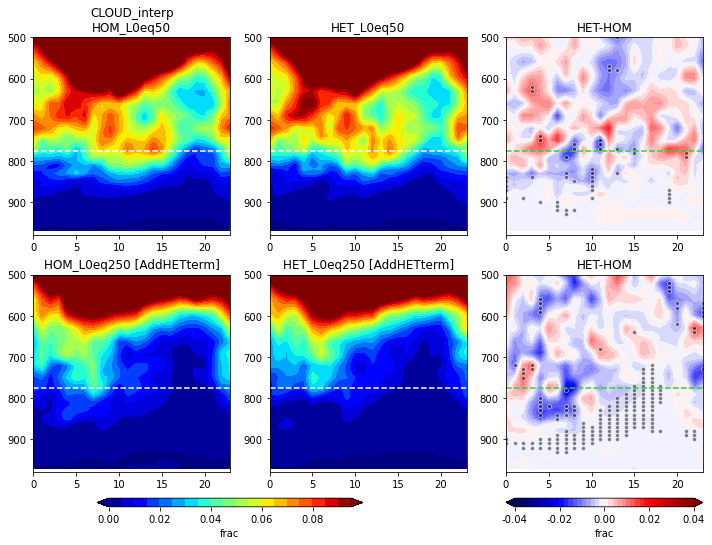

In [ ]:
varPlot = 'CLOUD_interp'
unitsStr = 'frac'

clims = np.arange(0,0.1,0.005)
dlims = np.arange(-0.04, 0.042, 0.002)

axs = plots_timeHeight(diurnal_h0_L50, diurnal_h0_L250, 
                       scamDS_h0_L50, scamDS_h0_L250,
                       varPlot, unitsStr, clims, dlims, 500)

axs[0].axhline(775, color='white',linestyle='--')
axs[1].axhline(775, color='white',linestyle='--')
axs[2].axhline(775, color='limegreen',linestyle='--')

axs[3].axhline(775, color='white',linestyle='--')
axs[4].axhline(775, color='white',linestyle='--')
axs[5].axhline(775, color='limegreen',linestyle='--')


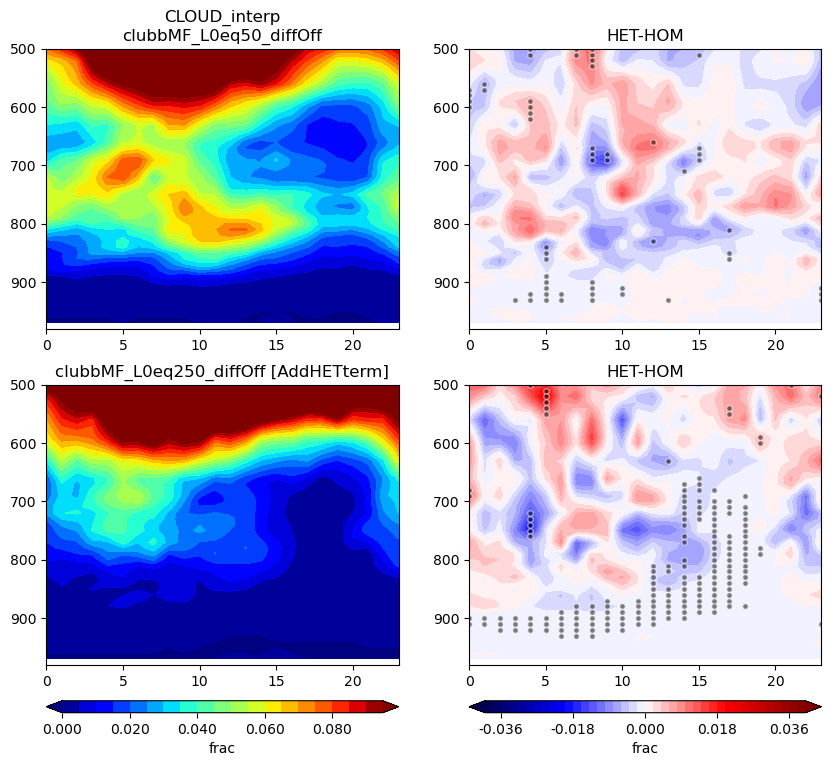

In [82]:
varPlot = 'CLOUD_interp'
unitsStr = 'frac'

clims = np.arange(0,0.1,0.005)
dlims = np.arange(-0.04, 0.042, 0.002)

axs = plots_timeHeight(diurnal_h0_L50, diurnal_h0_L250, 
                       scamDS_h0_L50, scamDS_h0_L250,
                       varPlot, unitsStr, clims, dlims, 500,
                       pltHET=False, cbarFormat='%.3f', cbTicks=5
                      )


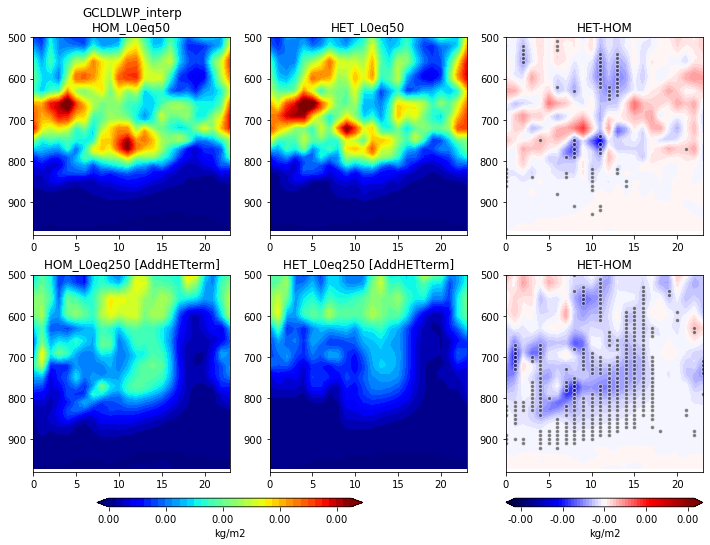

In [ ]:
varPlot = 'GCLDLWP_interp'
unitsStr = scamDS_h0_L50.GCLDLWP.units

clims = np.arange(0,3.5e-3,1e-4)
dlims = np.arange(-3e-3, 3.1e-3, 0.1e-3)

axs = plots_timeHeight(diurnal_h0_L50, diurnal_h0_L250, 
                       scamDS_h0_L50, scamDS_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev)



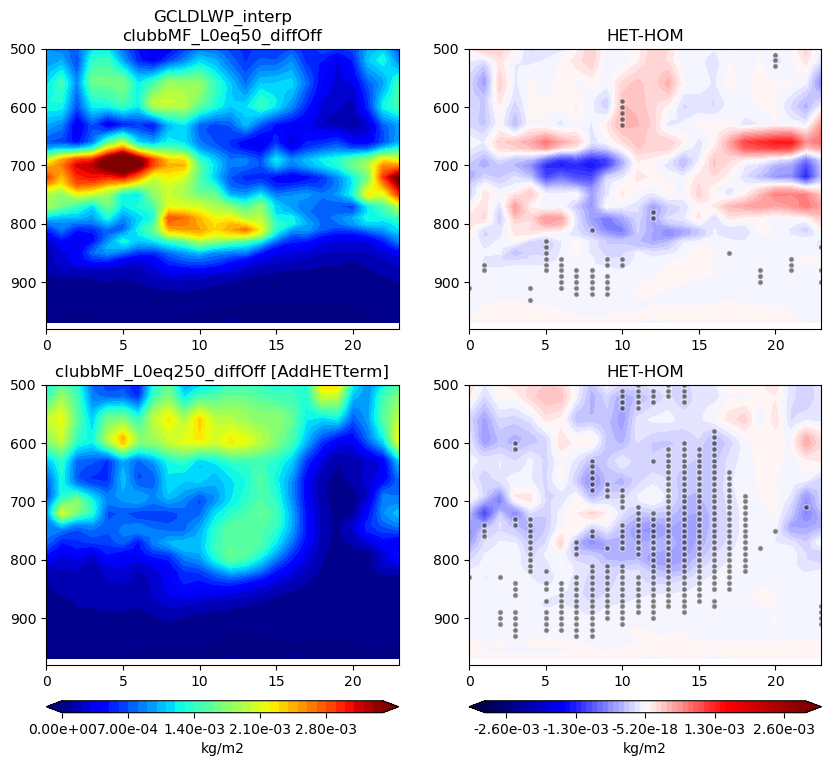

In [83]:
varPlot = 'GCLDLWP_interp'
unitsStr = scamDS_h0_L250.GCLDLWP.units

clims = np.arange(0,3.5e-3,1e-4)
dlims = np.arange(-3e-3, 3.1e-3, 0.1e-3)

axs = plots_timeHeight(diurnal_h0_L50, diurnal_h0_L250, 
                       scamDS_h0_L50, scamDS_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev,
                       pltHET=False, cbarFormat='%.2e', cbTicks=5 )



In [27]:
topLev=500

Text(0.5, 1.0, 'HET')

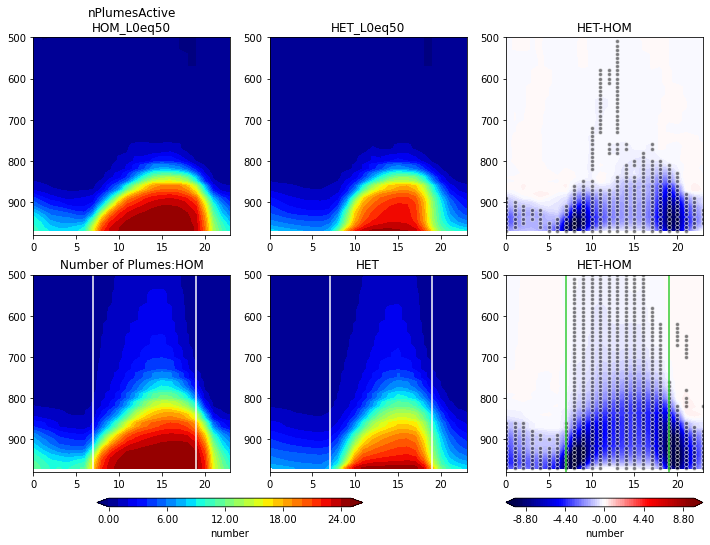

In [17]:
varPlot = 'nPlumesActive'
unitsStr = 'number'

clims = np.arange(0,26,1)
dlims = np.arange(-10, 10.2, 0.2)

axs = plots_timeHeight(diurnal_h0_L50, diurnal_h0_L250, 
                       scamDS_h0_L50, scamDS_h0_L250, 
                       varPlot, unitsStr, clims, dlims, topLev, 
                       pltHET=True, cbarFormat='%.2f', cbTicks=5)

axs[3].axvline(7, color='white',linestyle='-')
axs[4].axvline(7, color='white',linestyle='-')
axs[5].axvline(7, color='limegreen',linestyle='-')

axs[3].axvline(19, color='white',linestyle='-')
axs[4].axvline(19, color='white',linestyle='-')
axs[5].axvline(19, color='limegreen',linestyle='-')

axs[3].set_title('Number of Plumes: HOM')
axs[4].set_title('HET')



Text(0.5, 1.0, 'HET')

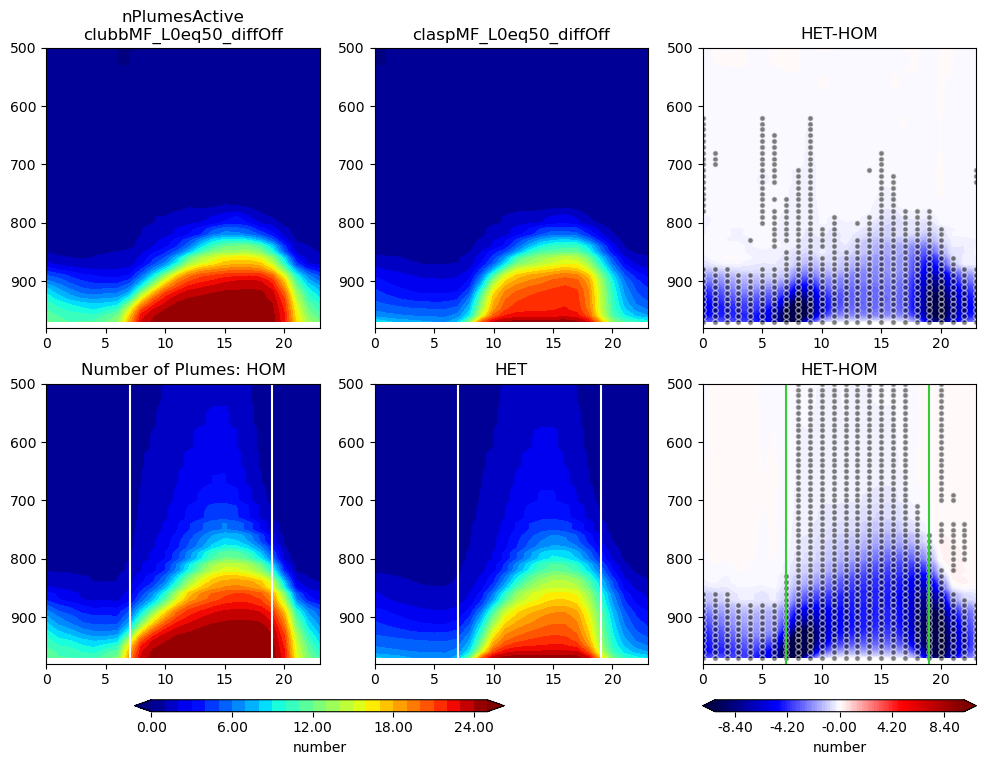

In [84]:
varPlot = 'nPlumesActive'
unitsStr = 'number'

clims = np.arange(0,26,1)
dlims = np.arange(-10, 10.2, 0.2)

axs = plots_timeHeight(diurnal_h0_L50, diurnal_h0_L250, 
                       scamDS_h0_L50, scamDS_h0_L250, 
                       varPlot, unitsStr, clims, dlims, topLev, 
                       pltHET=True, cbarFormat='%.2f', cbTicks=5)

axs[3].axvline(7, color='white',linestyle='-')
axs[4].axvline(7, color='white',linestyle='-')
axs[5].axvline(7, color='limegreen',linestyle='-')

axs[3].axvline(19, color='white',linestyle='-')
axs[4].axvline(19, color='white',linestyle='-')
axs[5].axvline(19, color='limegreen',linestyle='-')

axs[3].set_title('Number of Plumes: HOM')
axs[4].set_title('HET')



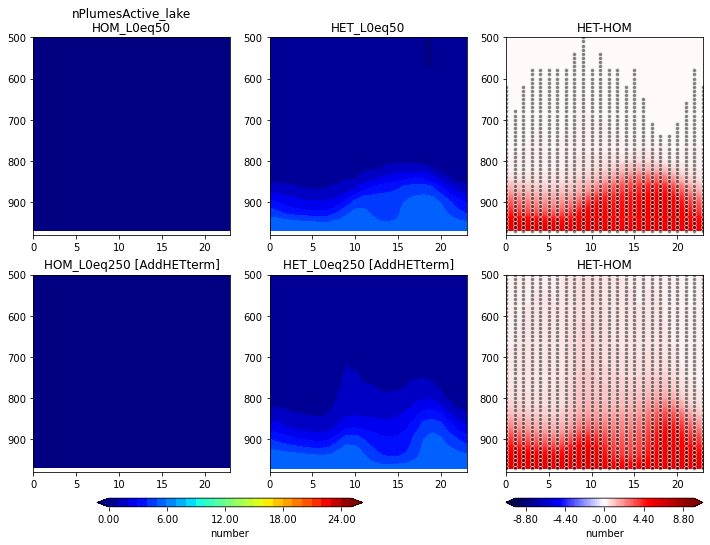

In [18]:
varPlot = 'nPlumesActive_lake'
unitsStr = 'number'

clims = np.arange(0,26,1)
dlims = np.arange(-10, 10.2, 0.2)

axs = plots_timeHeight(diurnal_h0_L50, diurnal_h0_L250, 
                       scamDS_h0_L50, scamDS_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev)


**Dig into some signals that don't make sense**

In [16]:
hourly_h0_L50 = scamDS_h0_L50.resample(time='1H').mean()
hourly_h0_L250 = scamDS_h0_L250.resample(time='1H').mean()

hourly_h2_L50 = scamDS_h2_L50.resample(time='1H').mean()
hourly_h2_L250 = scamDS_h2_L250.resample(time='1H').mean()


In [131]:
hourlyCLM_h1_L50 = clmDS_h1_L50.resample(time='1H').mean()
hourlyCLM_h1_L250 = clmDS_h1_L250.resample(time='1H').mean()

hourlyCLM_h2_L50 = clmDS_h2_L50.resample(time='1H').mean()
hourlyCLM_h2_L250 = clmDS_h2_L250.resample(time='1H').mean()


In [51]:
hrSel = 7

isel_50  = np.where(hourly_h0_L50['time.hour'].values==hrSel)[0]
isel_250 = np.where(hourly_h0_L250['time.hour'].values==hrSel)[0]


thisHrDS_L50 = hourly_h0_L50.nPlumesActive.isel(time=isel_50)
thisHrDS_L250 = hourly_h0_L250.nPlumesActive.isel(time=isel_250)

thisHrDS_L50_lake = hourly_h0_L50.nPlumesActive_lake.isel(time=isel_50)
thisHrDS_L50_grass = hourly_h0_L50.nPlumesActive_grass.isel(time=isel_50)
thisHrDS_L50_crop = hourly_h0_L50.nPlumesActive_crop.isel(time=isel_50)
thisHrDS_L50_urban = hourly_h0_L50.nPlumesActive_urban.isel(time=isel_50)

thisHrDS_L250_lake = hourly_h0_L250.nPlumesActive_lake.isel(time=isel_250)
thisHrDS_L250_grass = hourly_h0_L250.nPlumesActive_grass.isel(time=isel_250)
thisHrDS_L250_crop = hourly_h0_L250.nPlumesActive_crop.isel(time=isel_250)
thisHrDS_L250_urban = hourly_h0_L250.nPlumesActive_urban.isel(time=isel_250)



In [120]:
print('L=50\n HOM plumes = %.1f   HET plumes = %.1f ' % (thisHrDS_L50.isel(case=0, time=8, levInterp=-1).values, 
                                                         thisHrDS_L50.isel(case=1, time=8, levInterp=-1).values) )
print('   lakePlumes = %.1f   urbanPlumes = %.1f   grassPlumes = %.1f   cropPlumes = %.1f ' % 
              (thisHrDS_L50_lake.isel(case=1,time=8,levInterp=-1).values, thisHrDS_L50_urban.isel(case=1,time=8,levInterp=-1).values,
               thisHrDS_L50_grass.isel(case=1,time=8,levInterp=-1).values, thisHrDS_L50_crop.isel(case=1,time=8,levInterp=-1).values ) )

print()
print('L=250\n HOM plumes = %.1f   HET plumes = %.1f ' % (thisHrDS_L250.isel(case=0, time=8, levInterp=-1).values, 
                                                          thisHrDS_L250.isel(case=1, time=8, levInterp=-1).values) )
print('   lakePlumes = %.1f   urbanPlumes = %.1f   grassPlumes = %.1f   cropPlumes = %.1f ' % 
              (thisHrDS_L250_lake.isel(case=1,time=8,levInterp=-1).values, thisHrDS_L250_urban.isel(case=1,time=8,levInterp=-1).values,
               thisHrDS_L250_grass.isel(case=1,time=8,levInterp=-1).values, thisHrDS_L250_crop.isel(case=1,time=8,levInterp=-1).values ) )



L=50
 HOM plumes = 22.9   HET plumes = 12.0 
   lakePlumes = 6.0   urbanPlumes = 6.0   grassPlumes = 0.0   cropPlumes = 0.0 

L=250
 HOM plumes = 22.9   HET plumes = 11.5 
   lakePlumes = 6.0   urbanPlumes = 5.5   grassPlumes = 0.0   cropPlumes = 0.0 


In [145]:
# Is the overall atm different on this day? 

iDay = np.where((hourly_h0_L50['time.month'] == thisHrDS_L50_lake.isel(time=5)['time.month'].values) & 
                (hourly_h0_L50['time.day'] == thisHrDS_L50_lake.isel(time=5)['time.day'].values))[0]

thisDay_L50  = hourly_h0_L50.isel(time=iDay)
thisDay_L250 = hourly_h0_L250.isel(time=iDay)

print(thisDay_L50.time.values[0])
print(thisDay_L250.time.values[0])

2015-06-07T00:00:00.000000000
2015-06-07T00:00:00.000000000


In [146]:
# Is the overall atm different on this day? 

iDay = np.where((hourlyCLM_h1_L50['time.month'] == thisHrDS_L50_lake.isel(time=5)['time.month'].values) & 
                (hourlyCLM_h1_L50['time.day'] == thisHrDS_L50_lake.isel(time=5)['time.day'].values))[0]

thisDayCLM_L50  = hourlyCLM_h1_L50.isel(time=iDay)
thisDayCLM_L250 = hourlyCLM_h1_L250.isel(time=iDay)

print(thisDayCLM_L50.time.values[0])
print(thisDayCLM_L250.time.values[0])


iDay = np.where((hourlyCLM_h2_L50['time.month'] == thisHrDS_L50_lake.isel(time=5)['time.month'].values) & 
                (hourlyCLM_h2_L50['time.day'] == thisHrDS_L50_lake.isel(time=5)['time.day'].values))[0]

thisDayCLM_h2_L50  = hourlyCLM_h2_L50.isel(time=iDay)
thisDayCLM_h2_L250 = hourlyCLM_h2_L250.isel(time=iDay)

print(thisDayCLM_h2_L50.time.values[0])
print(thisDayCLM_h2_L250.time.values[0])


2015-06-07T00:00:00.000000000
2015-06-07T00:00:00.000000000
2015-06-07T00:00:00.000000000
2015-06-07T00:00:00.000000000


(0.0, 10.0)

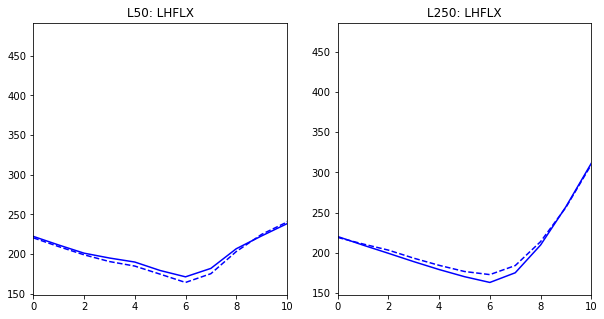

In [147]:
varPlot = 'LHFLX'

fig,axs = plt.subplots(1,2,figsize=(10,5))
axs = axs.ravel()

axs[0].plot(thisDay_L50['time.hour'].values, thisDay_L50.isel(case=0)[varPlot].values, 'b-', label='HOM')
axs[0].plot(thisDay_L50['time.hour'].values, thisDay_L50.isel(case=1)[varPlot].values, 'b--', label='HET')
axs[0].set_title('L50: '+varPlot)

axs[1].plot(thisDay_L250['time.hour'].values, thisDay_L250.isel(case=0)[varPlot].values, 'b-', label='HOM')
axs[1].plot(thisDay_L250['time.hour'].values, thisDay_L250.isel(case=1)[varPlot].values, 'b--', label='HET')
axs[1].set_title('L250: '+varPlot)

axs[0].set_xlim([0,10])
axs[1].set_xlim([0,10])


(0.0, 10.0)

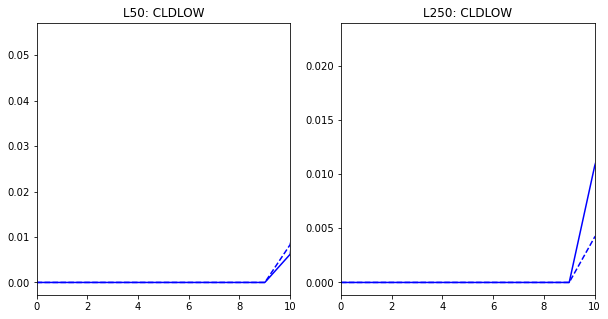

In [123]:
varPlot = 'CLDLOW'

fig,axs = plt.subplots(1,2,figsize=(10,5))
axs = axs.ravel()

axs[0].plot(thisDay_L50['time.hour'].values, thisDay_L50.isel(case=0)[varPlot].values, 'b-', label='HOM')
axs[0].plot(thisDay_L50['time.hour'].values, thisDay_L50.isel(case=1)[varPlot].values, 'b--', label='HET')
axs[0].set_title('L50: '+varPlot)

axs[1].plot(thisDay_L250['time.hour'].values, thisDay_L250.isel(case=0)[varPlot].values, 'b-', label='HOM')
axs[1].plot(thisDay_L250['time.hour'].values, thisDay_L250.isel(case=1)[varPlot].values, 'b--', label='HET')
axs[1].set_title('L250: '+varPlot)


axs[0].set_xlim([0,10])
axs[1].set_xlim([0,10])

(0.0, 10.0)

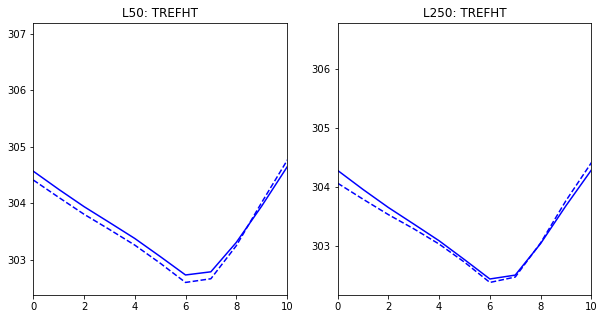

In [127]:
varPlot = 'TREFHT'

fig,axs = plt.subplots(1,2,figsize=(10,5))
axs = axs.ravel()

axs[0].plot(thisDay_L50['time.hour'].values, thisDay_L50.isel(case=0)[varPlot].values, 'b-', label='HOM')
axs[0].plot(thisDay_L50['time.hour'].values, thisDay_L50.isel(case=1)[varPlot].values, 'b--', label='HET')
axs[0].set_title('L50: '+varPlot)

axs[1].plot(thisDay_L250['time.hour'].values, thisDay_L250.isel(case=0)[varPlot].values, 'b-', label='HOM')
axs[1].plot(thisDay_L250['time.hour'].values, thisDay_L250.isel(case=1)[varPlot].values, 'b--', label='HET')
axs[1].set_title('L250: '+varPlot)


axs[0].set_xlim([0,10])
axs[1].set_xlim([0,10])

(0.0, 10.0)

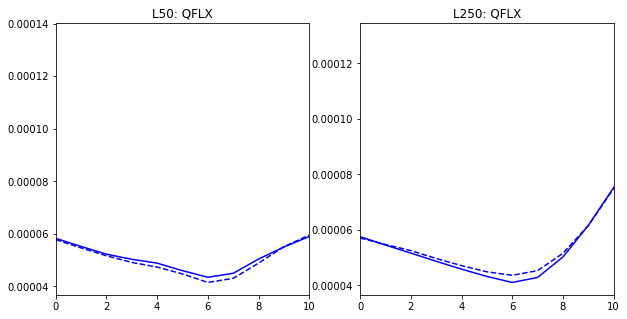

In [163]:
# varPlot = 'TG'
varPlot = 'QFLX'

fig,axs = plt.subplots(1,2,figsize=(10,5))
axs = axs.ravel()

axs[0].plot(thisDayCLM_L50['time.hour'].values, np.nanmean(thisDayCLM_L50.isel(case=0)[varPlot].values, axis=1), 'b-', label='HOM')
axs[0].plot(thisDayCLM_L50['time.hour'].values, np.nanmean(thisDayCLM_L50.isel(case=1)[varPlot].values, axis=1), 'b--', label='HET')
axs[0].set_title('L50: '+varPlot)

axs[1].plot(thisDayCLM_L250['time.hour'].values, np.nanmean(thisDayCLM_L250.isel(case=0)[varPlot].values, axis=1), 'b-', label='HOM')
axs[1].plot(thisDayCLM_L250['time.hour'].values, np.nanmean(thisDayCLM_L250.isel(case=1)[varPlot].values, axis=1), 'b--', label='HET')
axs[1].set_title('L250: '+varPlot)


# axs[0].set_ylim([54.4, 54.42])
# axs[1].set_ylim([54.4, 54.42])

axs[0].set_xlim([0,10])
axs[1].set_xlim([0,10])

In [139]:
thisDayCLM_L50

<xarray.Dataset>
Dimensions:             (levgrnd: 25, levsoi: 20, levlak: 10, levdcmp: 1,
                         time: 24, case: 2, lndgrid: 1, gridcell: 1,
                         landunit: 4, column: 8, pft: 8)
Coordinates:
  * levgrnd             (levgrnd) float32 0.01 0.04 0.09 ... 19.48 28.87 42.0
  * levsoi              (levsoi) float32 0.01 0.04 0.09 0.16 ... 5.95 6.94 8.03
  * levlak              (levlak) float32 0.05 0.6 2.1 4.6 ... 25.6 34.33 44.78
  * levdcmp             (levdcmp) float32 1.0
  * case                (case) <U10 'HOM_L0eq50' 'HET_L0eq50'
  * time                (time) datetime64[ns] 2015-06-10 ... 2015-06-10T23:00:00
Dimensions without coordinates: lndgrid, gridcell, landunit, column, pft
Data variables: (12/59)
    mcdate              (time, case) float64 2.015e+07 2.015e+07 ... 2.015e+07
    mcsec               (time, case) float64 1.971e+04 1.971e+04 ... 1.611e+04
    mdcur               (time, case) float64 1.0 1.0 1.0 1.0 ... 1.0 1.0 1.0 1.0
    mscur               (time, case) float64 1.65e+03 1.65e+03 ... 8.445e+04
    nstep               (time, case) float64 293.5 293.5 305.5 ... 569.5 569.5
    lon                 (time, case, lndgrid) float32 261.6 261.6 ... 261.6
    ...                  ...
    QVEGE               (time, case, pft) float32 7.667e-13 -3.998e-13 ... 0.0
    QVEGT               (time, case, pft) float32 8.729e-09 1.553e-08 ... 0.0
    SOILWATER_10CM      (time, case, pft) float32 54.41 54.41 nan ... nan nan
    TG                  (time, case, pft) float32 299.4 299.2 ... 299.8 308.3
    TSA                 (time, case, pft) float32 303.2 303.2 ... 305.4 305.2
    QFLX                (time, case, pft) float32 6.263e-05 ... 0.0001818

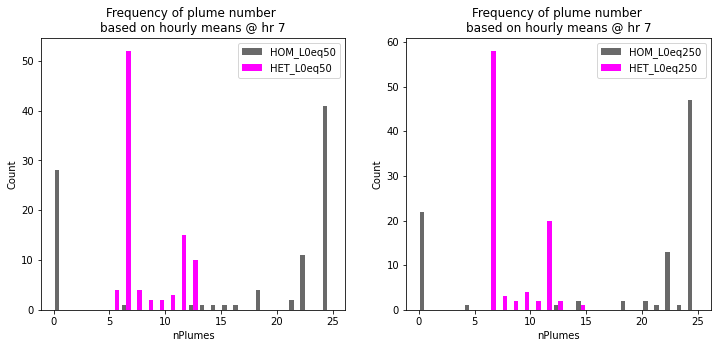

In [165]:
bins = np.arange(0,26)

fig,axs = plt.subplots(1,2,figsize=(12,5))
axs = axs.ravel()

# Set width for bars
bar_width = 0.4

# ------ L0 = 50 ------
# Create histograms
hist1, bins1 = np.histogram(thisHrDS_L50.isel(case=0,levInterp=-1), bins)
hist2, bins2 = np.histogram(thisHrDS_L50.isel(case=1,levInterp=-1), bins)

# Set bin positions for grouped bar chart
bin_centers1 = 0.5 * (bins1[1:] + bins1[:-1])
bin_centers2 = 0.5 * (bins2[1:] + bins2[:-1])

# Create grouped bar chart
axs[0].bar(bin_centers1 - bar_width/2, hist1, label=str(thisHrDS_L50.isel(case=0).case.values), width=bar_width, color='dimgray')
axs[0].bar(bin_centers2 + bar_width/2, hist2, label=str(thisHrDS_L50.isel(case=1).case.values), width=bar_width, color='magenta')

axs[0].set_xlabel('nPlumes')
axs[0].set_ylabel('Count')
axs[0].set_title('Frequency of plume number \nbased on hourly means @ hr '+str(hrSel))
axs[0].legend()


# ------ L0 = 250 ------
# Create histograms
hist1, bins1 = np.histogram(thisHrDS_L250.isel(case=0,levInterp=-1), bins)
hist2, bins2 = np.histogram(thisHrDS_L250.isel(case=1,levInterp=-1), bins)

# Set bin positions for grouped bar chart
bin_centers1 = 0.5 * (bins1[1:] + bins1[:-1])
bin_centers2 = 0.5 * (bins2[1:] + bins2[:-1])

# Create grouped bar chart
axs[1].bar(bin_centers1 - bar_width/2, hist1, label=str(thisHrDS_L250.isel(case=0).case.values), width=bar_width, color='dimgray')
axs[1].bar(bin_centers2 + bar_width/2, hist2, label=str(thisHrDS_L250.isel(case=1).case.values), width=bar_width, color='magenta')

axs[1].set_xlabel('nPlumes')
axs[1].set_ylabel('Count')
axs[1].set_title('Frequency of plume number \nbased on hourly means @ hr '+str(hrSel))
axs[1].legend()

plt.show()

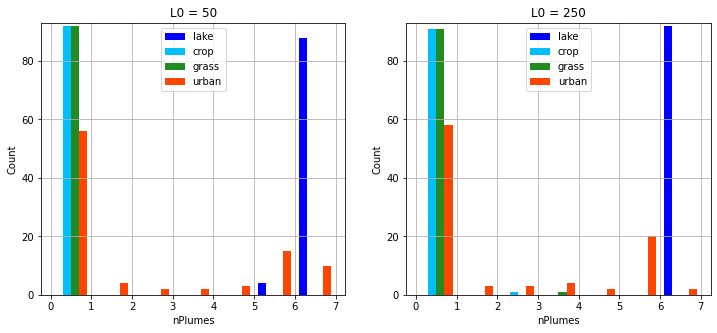

In [170]:
bins = np.arange(0,8)
# Set bin positions for grouped bar chart
bin_centers1 = 0.5 * (bins[1:] + bins[:-1])

# Set width for bars
bar_width = 0.2

fig,axs = plt.subplots(1,2,figsize=(12,5))
axs = axs.ravel()

# ------ L0 = 50 ------

# Create histograms
hist2_lake, bins2_lake = np.histogram(thisHrDS_L50_lake.isel(case=1,levInterp=-1), bins)
hist2_crop, bins2_crop = np.histogram(thisHrDS_L50_crop.isel(case=1,levInterp=-1), bins)
hist2_grass, bins2_grass = np.histogram(thisHrDS_L50_grass.isel(case=1,levInterp=-1), bins)
hist2_urban, bins2_urban = np.histogram(thisHrDS_L50_urban.isel(case=1,levInterp=-1), bins)

# Create grouped bar chart
axs[0].bar(bin_centers1 - bar_width*(3/2), hist2_lake, label='lake', width=bar_width, color='blue')
axs[0].bar(bin_centers1 - bar_width/2, hist2_crop, label='crop', width=bar_width, color='deepskyblue')
axs[0].bar(bin_centers1 + bar_width/2, hist2_grass, label='grass', width=bar_width, color='forestgreen')
axs[0].bar(bin_centers1 + bar_width*(3/2), hist2_urban, label='urban', width=bar_width, color='orangered')

axs[0].set_xlabel('nPlumes')
axs[0].set_ylabel('Count')
axs[0].set_title('L0 = 50')
axs[0].legend()

# ------ L0 = 250 ------
# Create histograms
hist2_lake, bins2_lake = np.histogram(thisHrDS_L250_lake.isel(case=1,levInterp=-1), bins)
hist2_crop, bins2_crop = np.histogram(thisHrDS_L250_crop.isel(case=1,levInterp=-1), bins)
hist2_grass, bins2_grass = np.histogram(thisHrDS_L250_grass.isel(case=1,levInterp=-1), bins)
hist2_urban, bins2_urban = np.histogram(thisHrDS_L250_urban.isel(case=1,levInterp=-1), bins)

# Create grouped bar chart
axs[1].bar(bin_centers1 - bar_width*(3/2), hist2_lake, label='lake', width=bar_width, color='blue')
axs[1].bar(bin_centers1 - bar_width/2, hist2_crop, label='crop', width=bar_width, color='deepskyblue')
axs[1].bar(bin_centers1 + bar_width/2, hist2_grass, label='grass', width=bar_width, color='forestgreen')
axs[1].bar(bin_centers1 + bar_width*(3/2), hist2_urban, label='urban', width=bar_width, color='orangered')

axs[1].set_xlabel('nPlumes')
axs[1].set_ylabel('Count')
axs[1].set_title('L0 = 250')
axs[1].legend()

axs[0].grid()
axs[1].grid()
axs[0].set_ylim([0,93])
axs[1].set_ylim([0,93])

plt.show()

In [18]:
thisHrDS_L50  = hourly_h2_L50.qtu_macmicAvg_interp.isel(time=isel_50, levInterp=-1)
thisHrDS_L250 = hourly_h2_L250.qtu_macmicAvg_interp.isel(time=isel_250, levInterp=-1)


In [38]:
## Get the weights 
varPlot = 'qtu_macmicAvg_interp'
DS1 = hourly_h2_L50
DS2 = hourly_h2_L250
topLev = 700
hrSel = 7

iTimes_DS1 = np.where(DS1['time.hour'].values==hrSel)[0]
iTimes_DS2 = np.where(DS2['time.hour'].values==hrSel)[0]

HOMwgts_DS1 = DS1.upa_macmicAvg_interp.isel(case=0, time=iTimes_DS1).fillna(0)
HETwgts_DS1 = DS1.upa_macmicAvg_interp.isel(case=1, time=iTimes_DS1).fillna(0)
homMean_DS1 = DS1[varPlot].where(DS1.levInterp.values>=topLev).isel(case=0, time=iTimes_DS1).weighted(HOMwgts_DS1).mean(dim='nens')
hetMean_DS1 = DS1[varPlot].where(DS1.levInterp.values>=topLev).isel(case=1, time=iTimes_DS1).weighted(HETwgts_DS1).mean(dim='nens')
diff_DS1    = DS1[varPlot].where(DS1.levInterp.values>=topLev).isel(case=1, time=iTimes_DS1).weighted(HETwgts_DS1).mean(dim='nens') - DS1[varPlot].where(DS1.levInterp.values>=topLev).isel(case=0, time=iTimes_DS1).resample(time='1H').mean().weighted(HOMwgts_DS1).mean(dim='nens')

HOMwgts_DS2 = DS2.upa_macmicAvg_interp.isel(case=0, time=iTimes_DS2).fillna(0)
HETwgts_DS2 = DS2.upa_macmicAvg_interp.isel(case=1, time=iTimes_DS2).fillna(0)
homMean_DS2 = DS2[varPlot].where(DS2.levInterp.values>=topLev).isel(case=0, time=iTimes_DS2).weighted(HOMwgts_DS2).mean(dim='nens')
hetMean_DS2 = DS2[varPlot].where(DS2.levInterp.values>=topLev).isel(case=1, time=iTimes_DS2).weighted(HETwgts_DS2).mean(dim='nens')
diff_DS2    = DS2[varPlot].where(DS2.levInterp.values>=topLev).isel(case=1, time=iTimes_DS2).weighted(HETwgts_DS2).mean(dim='nens') - DS2[varPlot].where(DS2.levInterp.values>=topLev).isel(case=0, time=iTimes_DS2).weighted(HOMwgts_DS2).mean(dim='nens')


(0.0, 20.0)

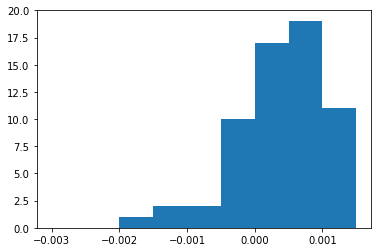

In [47]:
plt.hist(diff_DS1.isel(levInterp=-1).values, np.arange(-0.003, 0.002, 0.0005))
plt.ylim([0,20])


(0.0, 20.0)

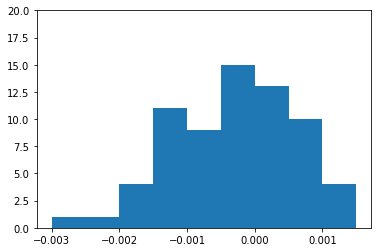

In [48]:
plt.hist(diff_DS2.isel(levInterp=-1).values, np.arange(-0.003, 0.002, 0.0005))
plt.ylim([0,20])


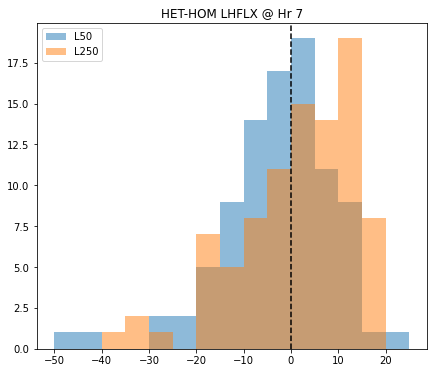

In [179]:
varPlot = 'LHFLX'
DS1 = hourly_h0_L50
DS2 = hourly_h0_L250
hrSel = 7

binSel = np.arange(-50, 30, 5)

iTimes_DS1 = np.where(DS1['time.hour'].values==hrSel)[0]
iTimes_DS2 = np.where(DS2['time.hour'].values==hrSel)[0]

thisHr_DS1 = DS1[varPlot].isel(time=iTimes_DS1)
thisHr_DS2 = DS2[varPlot].isel(time=iTimes_DS2)

fig,axs = plt.subplots(1,1, figsize=(7,6))

axs.hist(thisHr_DS1.isel(case=1).values - thisHr_DS1.isel(case=0).values,bins=binSel, alpha=0.5)
axs.hist(thisHr_DS2.isel(case=1).values - thisHr_DS2.isel(case=0).values, bins=binSel, alpha=0.5)

axs.set_title('HET-HOM '+varPlot+' @ Hr '+str(hrSel))
axs.legend(['L50','L250'])

axs.axvline(0,color='k',linestyle='--')


Text(0.5, 1.0, 'All days, mean diurnal cycle\n LWCF')

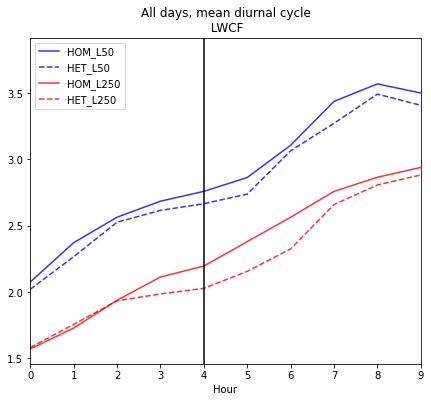

In [207]:
# varPlot = 'LHFLX'
# varPlot = 'CLDLOW'
varPlot = 'LWCF'

hrlyMean_L50 = hourly_h0_L50[varPlot].groupby('time.hour').mean()
hrlyMean_L250 = hourly_h0_L250[varPlot].groupby('time.hour').mean()

fig,axs = plt.subplots(1,1, figsize=(7,6))

axs.plot(hrlyMean_L50.hour.values, hrlyMean_L50.isel(case=0).values, 'b-', alpha=0.8, label='HOM_L50')
axs.plot(hrlyMean_L50.hour.values, hrlyMean_L50.isel(case=1).values, 'b--', alpha=0.8, label='HET_L50')

axs.plot(hrlyMean_L250.hour.values, hrlyMean_L250.isel(case=0).values, 'r-', alpha=0.8, label='HOM_L250')
axs.plot(hrlyMean_L250.hour.values, hrlyMean_L250.isel(case=1).values, 'r--', alpha=0.8, label='HET_L250')

axs.legend()
axs.set_xlabel('Hour')

## LHFLX: 
# axs.set_xlim([0,9])
# axs.set_ylim([140,230])
# axs.set_xlim([3,8])
# axs.set_ylim([140,190])

## CLDLOW: 
axs.set_xlim([0,9])

axs.axvline(4,color='k',linestyle='-')

axs.set_title('All days, mean diurnal cycle\n '+varPlot)

In [119]:
print('Differences: ')
print('L50:   ', diff_DS1.isel(levInterp=-1, time=8).values)
print('L250: ', diff_DS2.isel(levInterp=-1, time=8).values)
print()
print('L50:   HOM = %6f  HET= %6f ' % (homMean_DS1.isel(levInterp=-1, time=8).values, hetMean_DS1.isel(levInterp=-1, time=8).values))
print('L250:  HOM = %6f  HET= %6f ' % (homMean_DS2.isel(levInterp=-1, time=8).values, hetMean_DS2.isel(levInterp=-1, time=8).values))


Differences: 
L50:    0.00027269062636182603
L250:  -0.0007566479265293941

L50:   HOM = 0.018344  HET= 0.018617 
L250:  HOM = 0.017949  HET= 0.017193 


       HOM (50)   HET (50)       HOM (250)   HET (250) 
 6/ 7:  198.16    194.62           197.49      201.71
 6/ 8:  144.11    140.54           143.09      159.11
 6/10:  205.14    203.97           207.55      213.32
 6/12:  133.58    124.31           131.99      130.85
 6/13:  155.29    149.88           144.90      153.41
 6/23:  192.53    183.31           197.22      190.73
 6/24:  223.61    219.89           223.63      220.68
 6/26:  181.50    178.11           181.09      185.07
 6/28:  197.31    192.07           200.95      195.78
 7/ 1:  200.28    200.13           201.89      208.78
 7/ 8:  96.31     94.35           103.08      111.46
 7/ 9:  93.55     97.13            95.87      106.20
 7/12:  203.42    197.47           202.62      202.10
 7/13:  180.99    177.56           185.58      198.41
 7/16:  217.00    219.10           217.17      224.46
 7/19:  178.43    176.17           181.21      181.52
 7/31:  93.57     99.73           102.77      110.54
 8/14:  174.14    167.48     

(-50.0, 50.0)

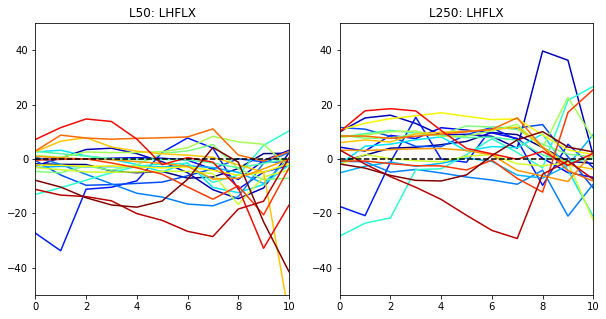

In [155]:
iDays_neg250pos50 = np.where( (diff_DS1.isel(levInterp=-1).values>=0) & (diff_DS2.isel(levInterp=-1).values <0 ) )[0]

varPlot = 'LHFLX'
fig,axs = plt.subplots(1,2,figsize=(10,5))
axs = axs.ravel()

# Generating an array of N colors from a colormap
def generate_colors(N, colormap_name='jet'):
    colormap = plt.cm.get_cmap(colormap_name, N)
    colors = colormap(np.linspace(0, 1, N))
    return colors

# Example: Generate an array of 10 colors from the 'viridis' colormap
N = len(iDays_neg250pos50)
colors = generate_colors(N, 'jet')

print ('       HOM (50)   HET (50)       HOM (250)   HET (250) ')
for iDay in range(len(iDays_neg250pos50)): 
    selDay = np.where((hourly_h0_L50['time.month'] == diff_DS1.isel(levInterp=-1, time=iDays_neg250pos50[iDay])['time.month'].values) & 
                     (hourly_h0_L50['time.day'] == diff_DS1.isel(levInterp=-1, time=iDays_neg250pos50[iDay])['time.day'].values))[0]

    thisDay_L50  = hourly_h0_L50.isel(time=selDay)
    thisDay_L250 = hourly_h0_L250.isel(time=selDay)
    
    print('%2i/%2i:  %5.2f %9.2f  %15.2f   %9.2f' % (thisDay_L50['time.month'].values[0], thisDay_L50['time.day'].values[0],
          np.nanmean(thisDay_L50.isel(case=0, time=np.arange(0,10,1))[varPlot].values), np.nanmean(thisDay_L50.isel(case=1, time=np.arange(0,10,1))[varPlot].values), 
          np.nanmean(thisDay_L250.isel(case=0, time=np.arange(0,10,1))[varPlot].values), np.nanmean(thisDay_L250.isel(case=1, time=np.arange(0,10,1))[varPlot].values) ))

    # axs[0].plot(thisDay_L50['time.hour'].values, thisDay_L50.isel(case=0)[varPlot].values, '-', color=colors[iDay], label='HOM')
    # axs[0].plot(thisDay_L50['time.hour'].values, thisDay_L50.isel(case=1)[varPlot].values, '--', color=colors[iDay], label='HET')
    axs[0].plot(thisDay_L50['time.hour'].values, 
                thisDay_L50.isel(case=1)[varPlot].values-thisDay_L50.isel(case=0)[varPlot].values, 
                '-', color=colors[iDay], label='HET-HOM')
    axs[0].set_title('L50: '+varPlot)

    # axs[1].plot(thisDay_L250['time.hour'].values, thisDay_L250.isel(case=0)[varPlot].values, '-',color=colors[iDay], label='HOM')
    # axs[1].plot(thisDay_L250['time.hour'].values, thisDay_L250.isel(case=1)[varPlot].values, '--', color=colors[iDay], label='HET')
    axs[1].plot(thisDay_L250['time.hour'].values, 
                thisDay_L250.isel(case=1)[varPlot].values-thisDay_L250.isel(case=0)[varPlot].values,
                '-', color=colors[iDay], label='HET-HOM')
    axs[1].set_title('L250: '+varPlot)


axs[0].set_xlim([0,10])
axs[1].set_xlim([0,10])

axs[0].axhline(0, color='k', linestyle = '--')
axs[1].axhline(0, color='k', linestyle = '--')

axs[0].set_ylim([-50, 50])
axs[1].set_ylim([-50, 50])


These are plume-specific properties (means over the plume ensemble)

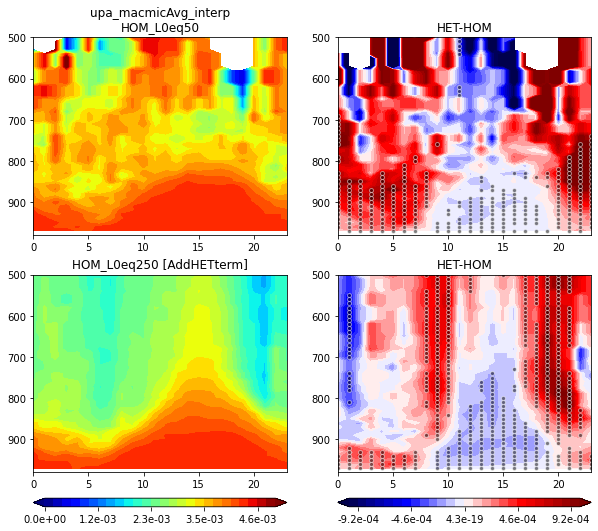

In [ ]:
varPlot = 'upa_macmicAvg_interp'
unitsStr = ''

cStep = (0.005-0)/26
clims = np.arange(0, 0.005+cStep, cStep)
dMax = 0.001
dStep = (2*dMax)/26
dlims = np.arange(-dMax, dMax+dStep, dStep)

axs = plots_timeHeight_weightMFplumes(scamDS_h2_L50, scamDS_h2_L250, 
                                      varPlot, unitsStr, clims, dlims, topLev,
                                       pltHET=False, cbarFormat='%.1e', cbTicks=7)


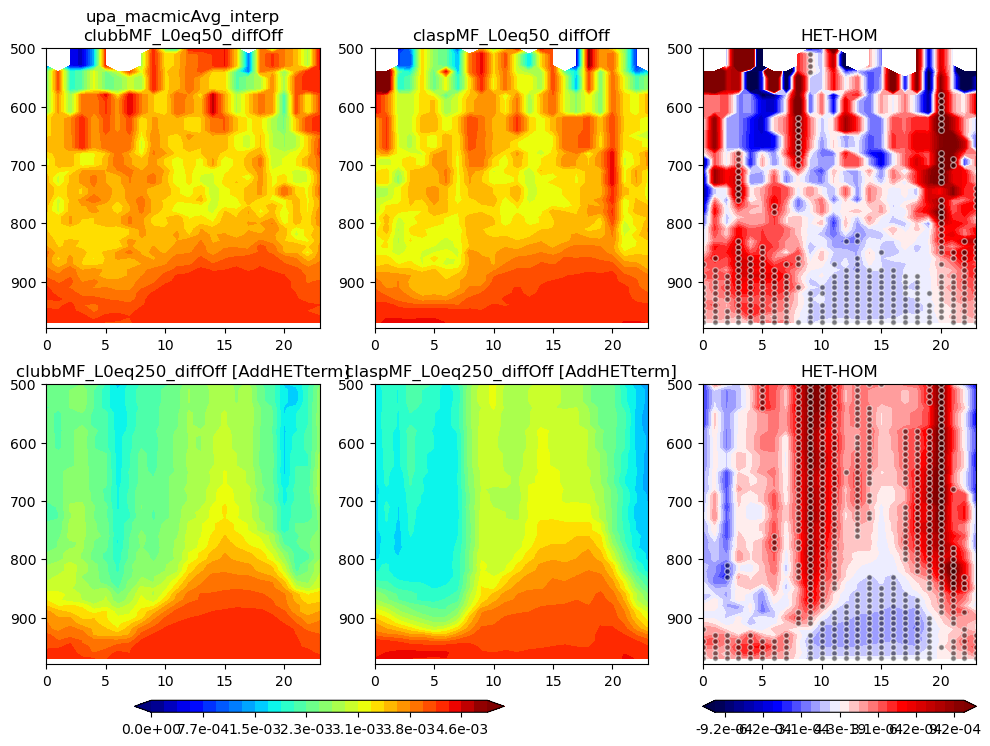

In [18]:
varPlot = 'upa_macmicAvg_interp'
unitsStr = ''

cStep = (0.005-0)/26
clims = np.arange(0, 0.005+cStep, cStep)
dMax = 0.001
dStep = (2*dMax)/26
dlims = np.arange(-dMax, dMax+dStep, dStep)

axs = plots_timeHeight_weightMFplumes(scamDS_h2_L50, scamDS_h2_L250, 
                                      varPlot, unitsStr, clims, dlims, topLev,
                                       pltHET=True, cbarFormat='%.1e', cbTicks=7)


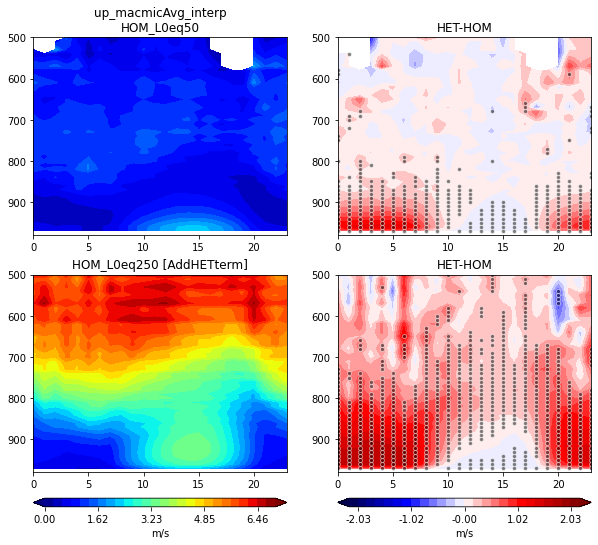

In [ ]:
varPlot = 'up_macmicAvg_interp'
unitsStr = 'm/s'

cStep = (7-0)/26
clims = np.arange(0, 7+cStep, cStep)
dMax = 2.2
dStep = (2*dMax)/26
dlims = np.arange(-dMax, dMax+dStep, dStep)

axs = plots_timeHeight_weightMFplumes(scamDS_h2_L50, scamDS_h2_L250, 
                                      varPlot, unitsStr, clims, dlims, topLev,
                                       pltHET=False, cbarFormat='%.2f', cbTicks=7)


In [ ]:
varPlot = 'up_macmicAvg_interp'
unitsStr = 'm/s'

cStep = (7-0)/26
clims = np.arange(0, 7+cStep, cStep)
dMax = 2.2
dStep = (2*dMax)/26
dlims = np.arange(-dMax, dMax+dStep, dStep)

axs = plots_timeHeight_weightMFplumes(scamDS_h2_L50, scamDS_h2_L250, 
                                      varPlot, unitsStr, clims, dlims, topLev,
                                       pltHET=True, cbarFormat='%.2f', cbTicks=7)


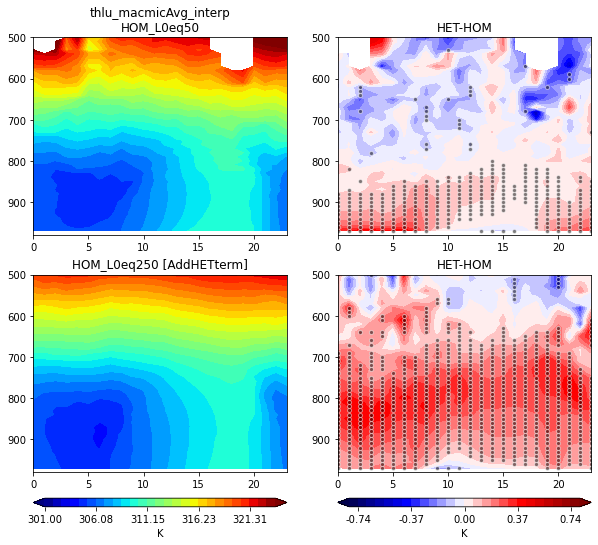

In [ ]:
varPlot = 'thlu_macmicAvg_interp'
unitsStr = 'K'

cStep = (323 - 301)/26
clims = np.arange(301, 323+cStep, cStep)
dMax = 0.8
dStep = (2*dMax)/26
dlims = np.arange(-dMax, dMax+dStep, dStep)

axs = plots_timeHeight_weightMFplumes(scamDS_h2_L50, scamDS_h2_L250, 
                                      varPlot, unitsStr, clims, dlims, topLev,
                                      pltHET=False, cbarFormat='%.2f')


In [ ]:
varPlot = 'thlu_macmicAvg_interp'
unitsStr = 'K'

cStep = (323 - 301)/26
clims = np.arange(301, 323+cStep, cStep)
dMax = 0.8
dStep = (2*dMax)/26
dlims = np.arange(-dMax, dMax+dStep, dStep)

axs = plots_timeHeight_weightMFplumes(scamDS_h2_L50, scamDS_h2_L250, 
                                      varPlot, unitsStr, clims, dlims, topLev,
                                      pltHET=True, cbarFormat='%.2f')


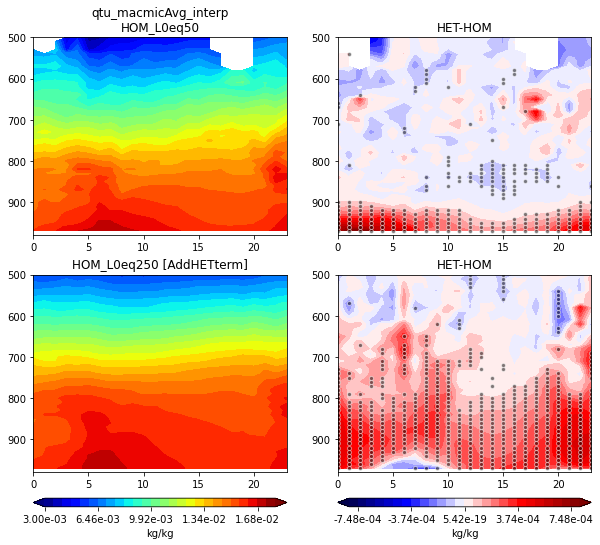

In [ ]:
varPlot  = 'qtu_macmicAvg_interp'
unitsStr = 'kg/kg'

cStep = (1.8e-2 - 0.003)/26
clims = np.arange(0.003, 1.8e-2+cStep, cStep)
dMax = 0.81e-3
dStep = (2*dMax)/26
dlims = np.arange(-dMax, dMax+dStep, dStep)

axs = plots_timeHeight_weightMFplumes(scamDS_h2_L50, scamDS_h2_L250, 
                                      varPlot, unitsStr, clims, dlims, topLev,
                                      pltHET=False, cbarFormat='%.2e')


In [ ]:
varPlot  = 'qtu_macmicAvg_interp'
unitsStr = 'kg/kg'

cStep = (1.8e-2 - 0.003)/26
clims = np.arange(0.003, 1.8e-2+cStep, cStep)
dMax = 0.81e-3
dStep = (2*dMax)/26
dlims = np.arange(-dMax, dMax+dStep, dStep)

axs = plots_timeHeight_weightMFplumes(scamDS_h2_L50, scamDS_h2_L250, 
                                      varPlot, unitsStr, clims, dlims, topLev,
                                      pltHET=True, cbarFormat='%.2e')


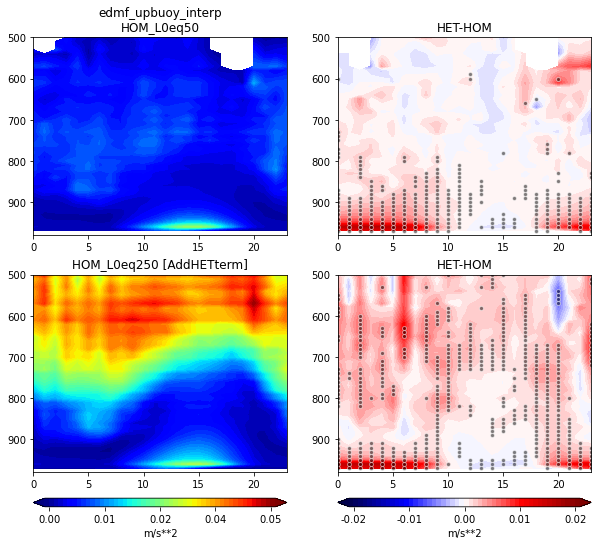

In [ ]:
varPlot  = 'edmf_upbuoy_interp'
unitsStr = 'm/s**2'

clims = np.arange(-0.001, 0.05, 0.001)
dlims = np.arange(-0.025, .026, 0.001)

axs = plots_timeHeight_weightMFplumes(scamDS_h2_L50, scamDS_h2_L250, 
                                      varPlot, unitsStr, clims, dlims, topLev,
                                       pltHET=False, cbarFormat='%.2f')


In [ ]:
varPlot  = 'edmf_upbuoy_interp'
unitsStr = 'm/s**2'

clims = np.arange(-0.001, 0.05, 0.001)
dlims = np.arange(-0.025, .026, 0.001)

axs = plots_timeHeight_weightMFplumes(scamDS_h2_L50, scamDS_h2_L250, 
                                      varPlot, unitsStr, clims, dlims, topLev,
                                       pltHET=True, cbarFormat='%.2f')


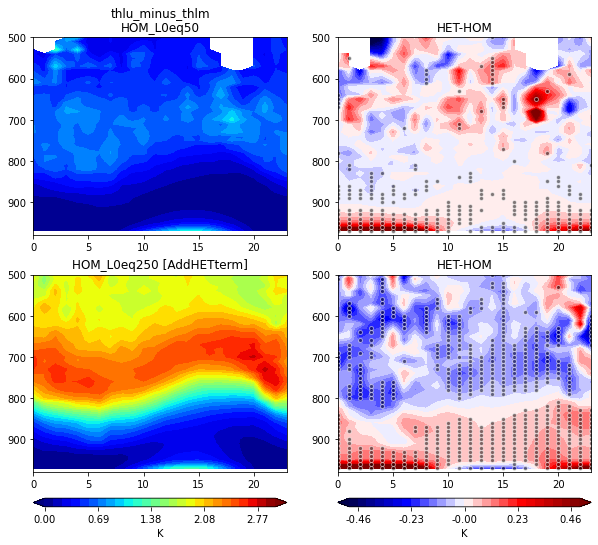

In [ ]:

varPlot = 'thlu_minus_thlm'
unitsStr = 'K'

cMax = 3.0
# cStep = (2*cMax)/26
# cLims = np.arange(-cMax, cMax+cStep, cStep)
cStep = (cMax)/26
clims = np.arange(0, cMax+cStep, cStep)

dMax = 0.5
dStep = (2*dMax)/26
dlims = np.arange(-dMax, dMax+dStep, dStep)

axs = plots_timeHeight_weightMFplumes(scamDS_h2_L50, scamDS_h2_L250, 
                                      varPlot, unitsStr, clims, dlims, topLev,
                                      pltHET=False, cbarFormat='%.2f')



In [149]:
## Difference in mean thlu (plumes) and THETAL (environment) [mf uses the variable thlm_in]
#      [First attempt... made a variable in scamDS_h2 DS's though, which is substnatially easier...]
topLev = 500

varPlot = 'thlu_macmicAvg_interp'
# DS1 = scamDS_h2_L50
DS2 = scamDS_h2_L250


# ## Get the weights 
# HOMwgts_DS1 = DS1.upa_macmicAvg_interp.isel(case=0).resample(time='1H').mean().fillna(0)
# HETwgts_DS1 = DS1.upa_macmicAvg_interp.isel(case=1).resample(time='1H').mean().fillna(0)
# # homMean_DS1 = DS1[varPlot].where(DS1.levInterp.values>=topLev).isel(case=0).resample(time='1H').mean().weighted(HOMwgts_DS1).mean(dim='nens').groupby('time.hour').mean(dim='time')
# # hetMean_DS1 = DS1[varPlot].where(DS1.levInterp.values>=topLev).isel(case=1).resample(time='1H').mean().weighted(HETwgts_DS1).mean(dim='nens').groupby('time.hour').mean(dim='time')
# homMean_DS1 = (DS1[varPlot].isel(case=0) - scamDS_h0_L50['thlm_interp'].isel(case=0)).where(DS1.levInterp.values>=topLev).resample(time='1H').mean().weighted(HOMwgts_DS1).mean(dim='nens').groupby('time.hour').mean(dim='time')
# hetMean_DS1 = (DS1[varPlot].isel(case=1) - scamDS_h0_L50['thlm_interp'].isel(case=1)).where(DS1.levInterp.values>=topLev).resample(time='1H').mean().weighted(HETwgts_DS1).mean(dim='nens').groupby('time.hour').mean(dim='time')


HOMwgts_DS2 = DS2.upa_macmicAvg_interp.isel(case=0).resample(time='1H').mean().fillna(0)
HETwgts_DS2 = DS2.upa_macmicAvg_interp.isel(case=1).resample(time='1H').mean().fillna(0)
# homMean_DS2 = DS2[varPlot].where(DS2.levInterp.values>=topLev).isel(case=0).resample(time='1H').mean().weighted(HOMwgts_DS2).mean(dim='nens').groupby('time.hour').mean(dim='time')
# hetMean_DS2 = DS2[varPlot].where(DS2.levInterp.values>=topLev).isel(case=1).resample(time='1H').mean().weighted(HETwgts_DS2).mean(dim='nens').groupby('time.hour').mean(dim='time')
homMean_DS2 = (DS2[varPlot].isel(case=0) - scamDS_h0_L250['thlm_interp'].isel(case=0)).where(DS2.levInterp.values>=topLev).resample(time='1H').mean().weighted(HOMwgts_DS2).mean(dim='nens').groupby('time.hour').mean(dim='time')
hetMean_DS2 = (DS2[varPlot].isel(case=1) - scamDS_h0_L250['thlm_interp'].isel(case=1)).where(DS2.levInterp.values>=topLev).resample(time='1H').mean().weighted(HETwgts_DS2).mean(dim='nens').groupby('time.hour').mean(dim='time')

# thlDiffs_hom_DS1 = homMean_DS1 - scamDS_h0_L50['thlm_interp'].isel(case=0).resample(time='1H').mean().fillna(0)
# thlDiffs_het_DS1 = hetMean_DS1 - scamDS_h0_L50['thlm_interp'].isel(case=1).resample(time='1H').mean().fillna(0)

# thlDiffs_hom_DS2 = homMean_DS2 - scamDS_h0_L250['thlm_interp'].isel(case=0).resample(time='1H').mean().fillna(0)
# thlDiffs_het_DS2 = hetMean_DS2 - scamDS_h0_L250['thlm_interp'].isel(case=1).resample(time='1H').mean().fillna(0)


In [150]:

# homMean_DS1 = np.abs(homMean_DS1)
# hetMean_DS1 = np.abs(hetMean_DS1)

homMean_DS2 = np.abs(homMean_DS2)
hetMean_DS2 = np.abs(hetMean_DS2)


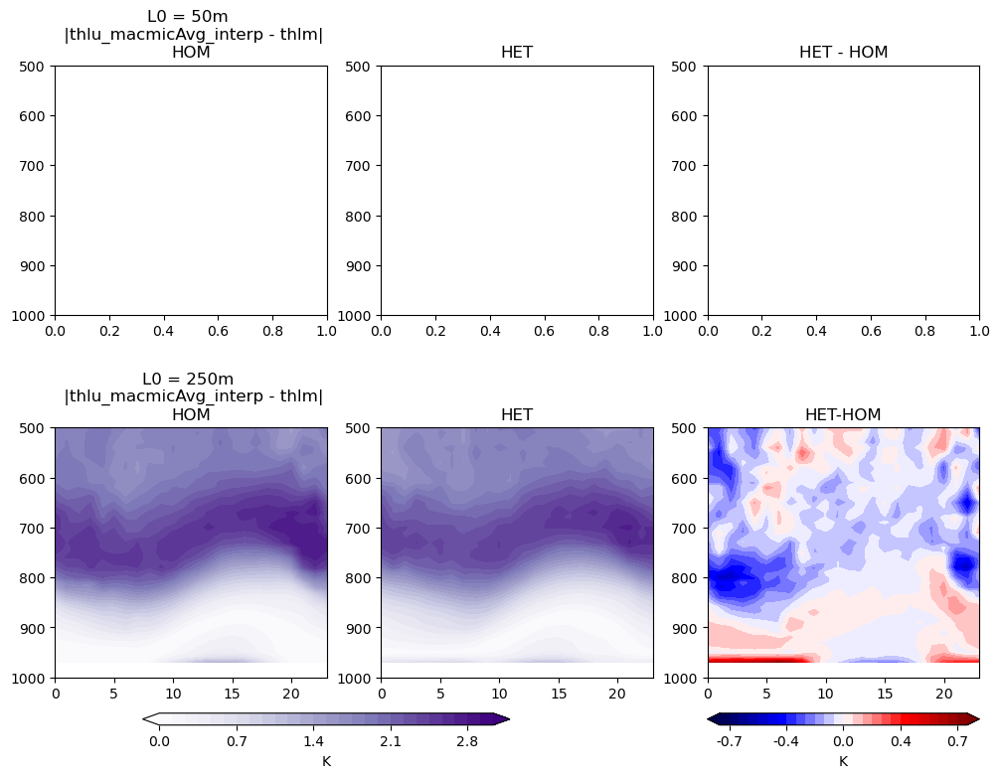

In [152]:
cMax = 3.0
# cStep = (2*cMax)/26
# cLims = np.arange(-cMax, cMax+cStep, cStep)
cStep = (cMax)/26
cLims = np.arange(0, cMax+cStep, cStep)

unitsStr = 'K'

dMax = 0.8
dStep = (2*dMax)/26
dLims = np.arange(-dMax, dMax+dStep, dStep)

fig,axs = plt.subplots(2,3, figsize=(12,8))
axs = axs.ravel()

# axs[0].contourf(homMean_DS1.hour.values, homMean_DS1.levInterp.values, np.transpose(homMean_DS1.values), 
#                # cLims, extend='both', cmap='PuOr_r')
#                cLims, extend='both', cmap='Purples')
# axs[1].contourf(hetMean_DS1.hour.values, hetMean_DS1.levInterp.values, np.transpose(hetMean_DS1.values),
#                cLims, extend='both', cmap='Purples')
# axs[2].contourf(hetMean_DS1.hour.values, hetMean_DS1.levInterp.values, np.transpose(hetMean_DS1.values-homMean_DS1.values),
#                dLims, extend='both', cmap='seismic')


axs[3].contourf(homMean_DS2.hour.values, homMean_DS2.levInterp.values, np.transpose(homMean_DS2.values),
               cLims, extend='both', cmap='Purples')
cplt = axs[4].contourf(hetMean_DS2.hour.values, hetMean_DS2.levInterp.values, np.transpose(hetMean_DS2.values),
                      cLims, extend='both', cmap='Purples')
#Add colorbar
ax_position = axs[4].get_position()
cbar_ax = fig.add_axes([ax_position.x0-0.2, ax_position.y0-0.06, ax_position.width+0.08, 0.015])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label=unitsStr, format='%.1f')
cbar.ax.locator_params(nbins=5)

cplt = axs[5].contourf(hetMean_DS2.hour.values, hetMean_DS2.levInterp.values, np.transpose(hetMean_DS2.values-homMean_DS2.values),
                      dLims, extend='both', cmap='seismic')
 #Add colorbar
ax_position = axs[5].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.06, ax_position.width, 0.015])
cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label=unitsStr, format='%.1f')
cbar.ax.locator_params(nbins=5)

axs[0].invert_yaxis()
axs[1].invert_yaxis()
axs[2].invert_yaxis()
axs[3].invert_yaxis()
axs[4].invert_yaxis()
axs[5].invert_yaxis()

axs[0].set_ylim([1000,topLev])
axs[1].set_ylim([1000,topLev])
axs[2].set_ylim([1000,topLev])
axs[3].set_ylim([1000,topLev])
axs[4].set_ylim([1000,topLev])
axs[5].set_ylim([1000,topLev])

# axs[0].set_title('L0 = 50m \n thlu_macmicAvg_interp - thlm\nHOM')
axs[0].set_title('L0 = 50m \n |thlu_macmicAvg_interp - thlm|\nHOM')
axs[1].set_title('HET')
axs[2].set_title('HET - HOM')
axs[3].set_title('L0 = 250m \n |thlu_macmicAvg_interp - thlm|\nHOM')
axs[4].set_title('HET')
axs[5].set_title('HET-HOM')

fig.subplots_adjust(hspace=0.45)

In [61]:
np.unique(scamDS_h2_L50.plumeLabel.isel(case=1))

array(['C3grass', 'IrrigCrop', 'Lake', 'Off', 'SurfaceAvg', 'Urban'],
      dtype=object)

In [14]:
labels = scamDS_h2_L250.plumeLabel.isel(case=1).values

In [7]:
print('C3grass: ', len(np.where(labels=='C3grass')[0]))
print('IrrigCrop: ', len(np.where(labels=='IrrigCrop')[0]))
print('Lake: ', len(np.where(labels=='Lake')[0]))
print('Urban: ', len(np.where(labels=='Urban')[0]))
print('Off: ', len(np.where(labels=='Off')[0]))
print('SurfaceAvg: ', len(np.where(labels=='SurfaceAvg')[0]))


C3grass:  181846
IrrigCrop:  143982
Lake:  315253
Urban:  241968
Off:  440721
SurfaceAvg:  1030


In [15]:
## At a certain hour, how many plumes per surface...? 
hrSel = 14

labels_hr = scamDS_h2_L250.plumeLabel.isel(case=1, time=np.where(scamDS_h2_L250['time.hour']==hrSel)[0]).values

print('Number of plumes initiated over each surface at hour ', hrSel)
print('C3grass: ', len(np.where(labels_hr=='C3grass')[0]))
print('IrrigCrop: ', len(np.where(labels_hr=='IrrigCrop')[0]))
print('Lake: ', len(np.where(labels_hr=='Lake')[0]))
print('Urban: ', len(np.where(labels_hr=='Urban')[0]))
print('Off: ', len(np.where(labels_hr=='Off')[0]))
print('SurfaceAvg: ', len(np.where(labels_hr=='SurfaceAvg')[0]))


Number of plumes initiated over each surface at hour  14
C3grass:  15351
IrrigCrop:  13044
Lake:  13122
Urban:  13152
Off:  412
SurfaceAvg:  119


In [16]:
scamDS_h0_L250.nPlumesActive_grass.isel(case=1).load()
scamDS_h0_L250.nPlumesActive_crop.isel(case=1).load()
scamDS_h0_L250.nPlumesActive_lake.isel(case=1).load()
scamDS_h0_L250.nPlumesActive_urban.isel(case=1).load()
scamDS_h0_L250.nPlumesActive.isel(case=1).load()


<xarray.DataArray 'nPlumesActive' (time: 52992, levInterp: 78)>
array([[0, 0, 0, ..., 6, 6, 6],
       [0, 0, 0, ..., 5, 6, 6],
       [0, 0, 0, ..., 6, 6, 6],
       ...,
       [0, 0, 0, ..., 6, 6, 6],
       [0, 0, 0, ..., 6, 6, 6],
       [0, 0, 0, ..., 6, 6, 6]])
Coordinates:
    lat        float64 36.6
    lon        float64 262.5
  * time       (time) datetime64[ns] 2015-06-02T00:03:30 ... 2016-09-01T23:58:30
  * levInterp  (levInterp) float64 200.0 210.0 220.0 230.0 ... 950.0 960.0 970.0
    case       <U23 'claspMF_L0eq250_diffOff'

In [17]:
from tqdm.notebook import tqdm_notebook
from tqdm import tqdm


In [18]:

#               Hr, sfcType, levInterp
numPlumesArr = np.full([24, 5, 78], np.nan)

## SfcType index: [0          1      2       3       4]
##                grass,   crop,   lake,   urban,   off

for iHr in tqdm(range(24)): 
    for iLev in range(len(scamDS_h0_L250.levInterp.values)):
        numPlumesArr[iHr, 0, iLev] = np.nanmean(scamDS_h0_L250.nPlumesActive_grass.isel(case=1, levInterp=iLev, time=np.where(scamDS_h2_L250['time.hour']==iHr)[0]).resample(time='1H').mean(dim='time').dropna(dim='time').values)
        numPlumesArr[iHr, 1, iLev] = np.nanmean(scamDS_h0_L250.nPlumesActive_crop.isel(case=1, levInterp=iLev, time=np.where(scamDS_h2_L250['time.hour']==iHr)[0]).resample(time='1H').mean(dim='time').dropna(dim='time').values)
        numPlumesArr[iHr, 2, iLev] = np.nanmean(scamDS_h0_L250.nPlumesActive_lake.isel(case=1, levInterp=iLev, time=np.where(scamDS_h2_L250['time.hour']==iHr)[0]).resample(time='1H').mean(dim='time').dropna(dim='time').values)
        numPlumesArr[iHr, 3, iLev] = np.nanmean(scamDS_h0_L250.nPlumesActive_urban.isel(case=1, levInterp=iLev, time=np.where(scamDS_h2_L250['time.hour']==iHr)[0]).resample(time='1H').mean(dim='time').dropna(dim='time').values)
        numPlumesArr[iHr, 4, iLev] = np.nanmean(25 - scamDS_h0_L250.nPlumesActive.isel(case=1, levInterp=iLev, time=np.where(scamDS_h2_L250['time.hour']==iHr)[0]).resample(time='1H').mean(dim='time').dropna(dim='time').values)
        

100%|██████████| 24/24 [20:42<00:00, 51.77s/it]


In [19]:
numPlumesArr_HOM = np.full([24, 2, 78], np.nan)

for iHr in tqdm(range(24)): 
    for iLev in range(len(scamDS_h0_L250.levInterp.values)):
        numPlumesArr_HOM[iHr, 0, iLev] = np.nanmean(scamDS_h0_L250.nPlumesActive.isel(case=0, levInterp=iLev, time=np.where(scamDS_h2_L250['time.hour']==iHr)[0]).resample(time='1H').mean(dim='time').dropna(dim='time').values)
        numPlumesArr_HOM[iHr, 1, iLev] = np.nanmean(25 - scamDS_h0_L250.nPlumesActive.isel(case=0, levInterp=iLev, time=np.where(scamDS_h2_L250['time.hour']==iHr)[0]).resample(time='1H').mean(dim='time').dropna(dim='time').values)



100%|██████████| 24/24 [08:37<00:00, 21.57s/it]


In [26]:
scamDS_h0_L250.levInterp.values[-20::]

array([780., 790., 800., 810., 820., 830., 840., 850., 860., 870., 880.,
       890., 900., 910., 920., 930., 940., 950., 960., 970.])

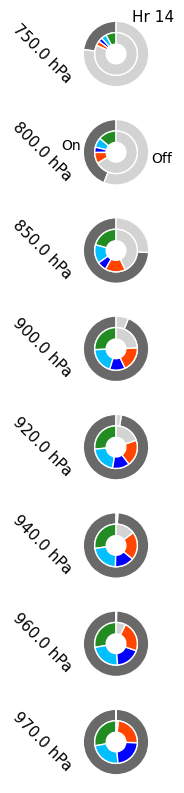

In [31]:
colors = ['forestgreen', 'deepskyblue', 'blue', 'orangered', 'lightgray']
colorsHom = ['dimgray', 'lightgray']
size = 0.35

maxLevs = 8
# hrSel = 14
hours = np.arange(5,22,1)

levSels = scamDS_h0_L250.levInterp.values[::2][-10::]
levSels = np.asarray([ 750., 800., 850., 900., 920., 940., 960., 970.])

fig,axs = plt.subplots(maxLevs,1, figsize=(20,10))
axs     = axs.ravel()

for iLev in range(maxLevs):
    # pltInd = iHr+(len(hours)*iLev)
    pltInd = iLev
    levPlt = np.where(scamDS_h0_L250.levInterp.values==levSels[iLev])[0][0]
    ## HOM
    # if iLev==(maxLevs-4):
    if iLev==1:
        p,t = axs[pltInd].pie(numPlumesArr_HOM[hrSel,:,levPlt], radius = 1, colors=colorsHom, labels=['On','Off'], startangle=90, wedgeprops=dict(width=size, edgecolor='w'))
    else: 
        p,t = axs[pltInd].pie(numPlumesArr_HOM[hrSel,:,levPlt], radius = 1, colors=colorsHom, startangle=90, wedgeprops=dict(width=size, edgecolor='w'))

    ## HET
    p,t = axs[pltInd].pie(numPlumesArr[hrSel,:,levPlt], radius = 1-size, colors=colors, startangle=90, wedgeprops=dict(width=size, edgecolor='w'))

    axs[pltInd].set_title(levSels[iLev].astype('str')+' hPa', x=-0.4, y=0.05, fontsize=11, rotation = -45) 

    plt.margins(0,0)

    if iLev==0: 
        axs[pltInd].text(0.5, 0.98, 'Hr '+str(hrSel), fontsize=11)



## Same for L0=50 m

In [32]:

#               Hr, sfcType, levInterp
numPlumesArr_50 = np.full([24, 5, 78], np.nan)

## SfcType index: [0          1      2       3       4]
##                grass,   crop,   lake,   urban,   off

for iHr in tqdm(range(24)): 
    for iLev in range(len(scamDS_h0_L50.levInterp.values)):
        numPlumesArr_50[iHr, 0, iLev] = np.nanmean(scamDS_h0_L50.nPlumesActive_grass.isel(case=1, levInterp=iLev, time=np.where(scamDS_h0_L50['time.hour']==iHr)[0]).resample(time='1H').mean(dim='time').dropna(dim='time').values)
        numPlumesArr_50[iHr, 1, iLev] = np.nanmean(scamDS_h0_L50.nPlumesActive_crop.isel(case=1, levInterp=iLev, time=np.where(scamDS_h0_L50['time.hour']==iHr)[0]).resample(time='1H').mean(dim='time').dropna(dim='time').values)
        numPlumesArr_50[iHr, 2, iLev] = np.nanmean(scamDS_h0_L50.nPlumesActive_lake.isel(case=1, levInterp=iLev, time=np.where(scamDS_h0_L50['time.hour']==iHr)[0]).resample(time='1H').mean(dim='time').dropna(dim='time').values)
        numPlumesArr_50[iHr, 3, iLev] = np.nanmean(scamDS_h0_L50.nPlumesActive_urban.isel(case=1, levInterp=iLev, time=np.where(scamDS_h0_L50['time.hour']==iHr)[0]).resample(time='1H').mean(dim='time').dropna(dim='time').values)
        numPlumesArr_50[iHr, 4, iLev] = np.nanmean(25 - scamDS_h0_L50.nPlumesActive.isel(case=1, levInterp=iLev, time=np.where(scamDS_h0_L50['time.hour']==iHr)[0]).resample(time='1H').mean(dim='time').dropna(dim='time').values)
        

100%|██████████| 24/24 [06:22<00:00, 15.92s/it]


In [33]:
numPlumesArr_50_HOM = np.full([24, 2, 78], np.nan)

for iHr in tqdm(range(24)): 
    for iLev in range(len(scamDS_h0_L250.levInterp.values)):
        numPlumesArr_50_HOM[iHr, 0, iLev] = np.nanmean(scamDS_h0_L50.nPlumesActive.isel(case=0, levInterp=iLev, time=np.where(scamDS_h0_L50['time.hour']==iHr)[0]).resample(time='1H').mean(dim='time').dropna(dim='time').values)
        numPlumesArr_50_HOM[iHr, 1, iLev] = np.nanmean(25 - scamDS_h0_L50.nPlumesActive.isel(case=0, levInterp=iLev, time=np.where(scamDS_h0_L50['time.hour']==iHr)[0]).resample(time='1H').mean(dim='time').dropna(dim='time').values)



100%|██████████| 24/24 [02:29<00:00,  6.24s/it]


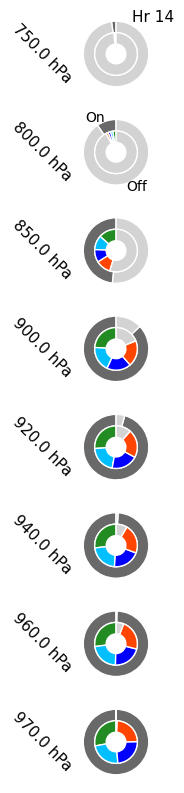

In [34]:
colors = ['forestgreen', 'deepskyblue', 'blue', 'orangered', 'lightgray']
colorsHom = ['dimgray', 'lightgray']
size = 0.35

maxLevs = 8
# hrSel = 14
hours = np.arange(5,22,1)

levSels = scamDS_h0_L50.levInterp.values[::2][-10::]
levSels = np.asarray([ 750., 800., 850., 900., 920., 940., 960., 970.])

fig,axs = plt.subplots(maxLevs,1, figsize=(20,10))
axs     = axs.ravel()

for iLev in range(maxLevs):
    # pltInd = iHr+(len(hours)*iLev)
    pltInd = iLev
    levPlt = np.where(scamDS_h0_L50.levInterp.values==levSels[iLev])[0][0]
    ## HOM
    # if iLev==(maxLevs-4):
    if iLev==1:
        p,t = axs[pltInd].pie(numPlumesArr_50_HOM[hrSel,:,levPlt], radius = 1, colors=colorsHom, labels=['On','Off'], startangle=90, wedgeprops=dict(width=size, edgecolor='w'))
    else: 
        p,t = axs[pltInd].pie(numPlumesArr_50_HOM[hrSel,:,levPlt], radius = 1, colors=colorsHom, startangle=90, wedgeprops=dict(width=size, edgecolor='w'))

    ## HET
    p,t = axs[pltInd].pie(numPlumesArr_50[hrSel,:,levPlt], radius = 1-size, colors=colors, startangle=90, wedgeprops=dict(width=size, edgecolor='w'))

    axs[pltInd].set_title(levSels[iLev].astype('str')+' hPa', x=-0.4, y=0.05, fontsize=11, rotation = -45) 

    plt.margins(0,0)

    if iLev==0: 
        axs[pltInd].text(0.5, 0.98, 'Hr '+str(hrSel), fontsize=11)



**What happens at actual sfc level?**

In [9]:
scamDS_h2_L250.plumeLabel

<xarray.DataArray 'plumeLabel' (case: 2, time: 52992, nens: 25)>
dask.array<concatenate, shape=(2, 52992, 25), dtype=<U10, chunksize=(2, 26496, 25), chunktype=numpy.ndarray>
Coordinates:
    lat      float64 36.6
    lon      float64 262.5
  * time     (time) datetime64[ns] 2015-06-02T00:03:30 ... 2016-09-01T23:58:30
  * nens     (nens) int64 0 1 2 3 4 5 6 7 8 9 ... 15 16 17 18 19 20 21 22 23 24
    ncyc     int64 0
  * case     (case) <U23 'clubbMF_L0eq250_diffOff' 'claspMF_L0eq250_diffOff'

In [22]:
selHrs = np.where(scamDS_h2_L250['time.hour'].values==14)[0]

thisHr = scamDS_h2_L250.plumeLabel.isel(time=selHrs, case=1)
print(thisHr.case.values)

nTimes = len(thisHr.time.values)

plumeLabels_sfc_grass = np.full([nTimes], np.nan)
plumeLabels_sfc_irrig = np.full([nTimes], np.nan)
plumeLabels_sfc_lake  = np.full([nTimes], np.nan)
plumeLabels_sfc_urban = np.full([nTimes], np.nan)
plumeLabels_sfc_off   = np.full([nTimes], np.nan)

for iTime in range(nTimes):
    plumeLabels_sfc_grass[iTime] = np.sum(thisHr.isel(time=iTime).str.count('C3grass').values)
    plumeLabels_sfc_irrig[iTime] = np.sum(thisHr.isel(time=iTime).str.count('IrrigCrop').values)
    plumeLabels_sfc_lake[iTime] = np.sum(thisHr.isel(time=iTime).str.count('Lake').values)
    plumeLabels_sfc_urban[iTime] = np.sum(thisHr.isel(time=iTime).str.count('Urban').values)
    plumeLabels_sfc_off[iTime] = np.sum(thisHr.isel(time=iTime).str.count('Off').values)


claspMF_L0eq250_diffOff


In [45]:
selHrs = np.where(scamDS_h2_L250['time.hour'].values==14)[0]
thisHrDS = scamDS_h2_L250.plumeLabel.isel(time=selHrs, case=1)

np.where(thisHrDS=='Off')[0]

array([1526, 1526, 1526, 1526, 1526, 1526, 1527, 1527, 1527, 1527, 1527,
       1527, 1528, 1528, 1528, 1528, 1528, 1528, 1529, 1529, 1529, 1529,
       1529, 1529, 1530, 1530, 1530, 1530, 1530, 1530, 1531, 1531, 1531,
       1531, 1531, 1531, 1532, 1532, 1532, 1532, 1532, 1532, 1533, 1533,
       1533, 1533, 1533, 1533, 1534, 1534, 1534, 1534, 1534, 1534, 1535,
       1535, 1535, 1535, 1535, 1535, 1596, 1596, 1596, 1596, 1596, 1596,
       1596, 1596, 1596, 1596, 1596, 1596, 1597, 1597, 1597, 1597, 1597,
       1597, 1597, 1597, 1597, 1597, 1597, 1597, 1598, 1598, 1598, 1598,
       1598, 1598, 1598, 1598, 1598, 1598, 1598, 1598, 1599, 1599, 1599,
       1599, 1599, 1599, 1599, 1599, 1599, 1599, 1599, 1599, 1600, 1600,
       1600, 1600, 1600, 1600, 1600, 1600, 1600, 1600, 1600, 1600, 1601,
       1601, 1601, 1601, 1601, 1601, 1601, 1601, 1601, 1601, 1601, 1601,
       1602, 1602, 1602, 1602, 1602, 1602, 1602, 1602, 1602, 1602, 1602,
       1602, 1603, 1603, 1603, 1603, 1603, 1603, 16

In [26]:
numPlumesSfc = np.full([5], np.nan)
numPlumesSfc[0] = np.nanmean(plumeLabels_sfc_grass)
numPlumesSfc[1] = np.nanmean(plumeLabels_sfc_irrig)
numPlumesSfc[2] = np.nanmean(plumeLabels_sfc_lake)
numPlumesSfc[3] = np.nanmean(plumeLabels_sfc_urban)
numPlumesSfc[4] = np.nanmean(plumeLabels_sfc_off)


## SfcType index: [0          1      2       3       4]
##                grass,   crop,   lake,   urban,   off


In [28]:
plumeLabels_sfc_HOM = np.full([nTimes], np.nan)

thisHr_HOM = scamDS_h2_L250.plumeLabel.isel(time=selHrs, case=0)

for iTime in range(nTimes):
    plumeLabels_sfc_grass[iTime] = np.sum(thisHr_HOM.isel(time=iTime).str.count('SurfaceAvg').values)

numPlumesSfc_HOM = np.full([2], np.nan)

numPlumesSfc_HOM[0] = np.nanmean(plumeLabels_sfc_grass)
numPlumesSfc_HOM[1] = np.nanmean(25 - plumeLabels_sfc_grass)

Text(0.5, 0.98, 'Hr 14')

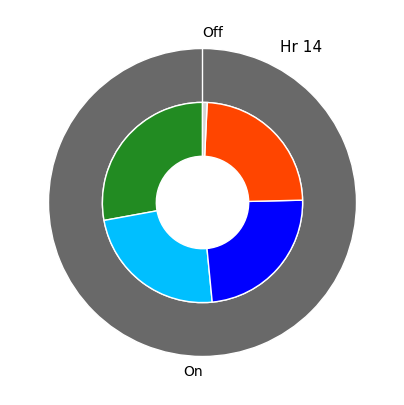

In [31]:
colors = ['forestgreen', 'deepskyblue', 'blue', 'orangered', 'lightgray']
colorsHom = ['dimgray', 'lightgray']
size = 0.35


fig,axs = plt.subplots(1,1, figsize=(5,5))

p,t = axs.pie(numPlumesSfc_HOM, radius = 1, colors=colorsHom, labels=['On','Off'], startangle=90, wedgeprops=dict(width=size, edgecolor='w'))

## HET
p,t = axs.pie(numPlumesSfc, radius = 1-size, colors=colors, startangle=90, wedgeprops=dict(width=size, edgecolor='w'))

# axs.set_title('Surface', x=-0.4, y=0.05, fontsize=11, rotation = -45) 

plt.margins(0,0)

axs.text(0.5, 0.98, 'Hr 14', fontsize=11)



In [35]:
numPlumesSfc

array([6.95244565, 5.9076087 , 5.94293478, 5.95652174, 0.1865942 ])

In [34]:
np.sum(numPlumesSfc)

24.946105072463766

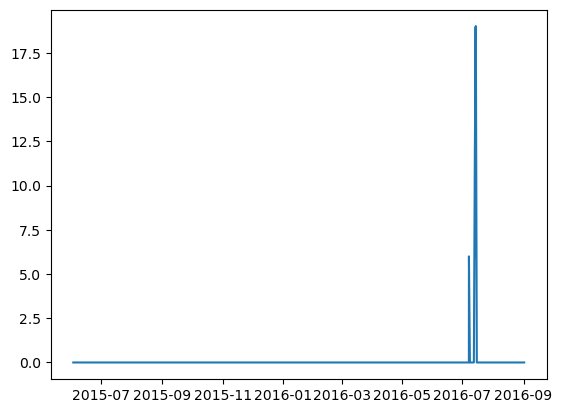

In [47]:
plt.plot(thisHr.time.values, plumeLabels_sfc_off)
# plt.xlim(thisHr.time.values[190], thisHr.time.values[-1])

In [ ]:
# Add error bars for plume plot below of +/- one sigma? 

(305.0, 311.0)

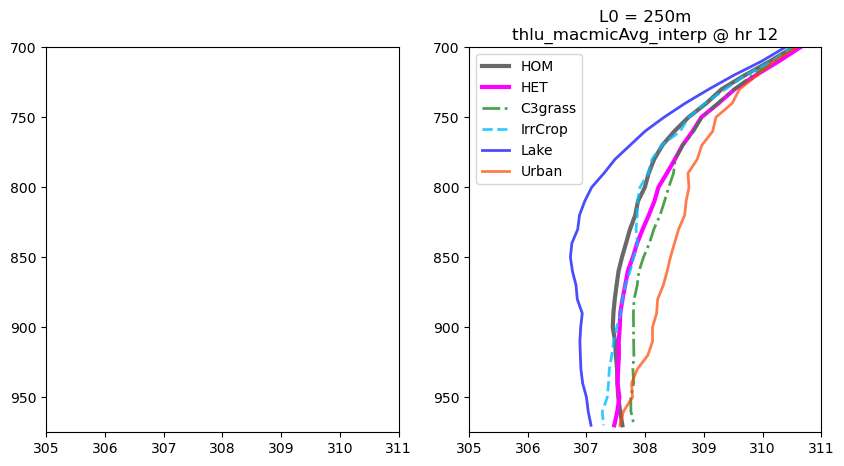

In [32]:
hrSel = 12
# varSel = 'up_macmicAvg_interp'
varSel = 'thlu_macmicAvg_interp'
# varSel = 'qtu_macmicAvg_interp'
# varSel = 'edmf_upbuoy_interp'


fig,axs = plt.subplots(1,2,figsize=(10,5))
axs = axs.ravel() 

# - - - - - - - - - - - - 
# L50 
# - - - - - - - - - - - - 

## HOM 
thisHr_L50_HOM = scamDS_h2_L50.isel(time=np.where(scamDS_h2_L50['time.hour']==hrSel)[0]).isel(case=0)
homVarWgt = thisHr_L50_HOM['upa_macmicAvg_interp'].where(thisHr_L50_HOM.plumeLabel == 'SurfaceAvg').fillna(0)
homVar    = thisHr_L50_HOM[varSel].where(thisHr_L50_HOM.plumeLabel == 'SurfaceAvg').weighted(homVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')
homVar_std    = thisHr_L50_HOM[varSel].where(thisHr_L50_HOM.plumeLabel == 'SurfaceAvg').weighted(homVarWgt).mean(dim='nens').resample(time='1H').mean().std(dim='time')

## HET
thisHr_L50_HET = scamDS_h2_L50.isel(time=np.where(scamDS_h2_L50['time.hour']==hrSel)[0]).isel(case=1)
hetVarWgt = thisHr_L50_HET['upa_macmicAvg_interp'].fillna(0)
hetVar    = thisHr_L50_HET[varSel].weighted(hetVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')    

grassVarWgt = thisHr_L50_HET['upa_macmicAvg_interp'].where(thisHr_L50_HET.plumeLabel == 'C3grass').fillna(0)
cropVarWgt  = thisHr_L50_HET['upa_macmicAvg_interp'].where(thisHr_L50_HET.plumeLabel == 'IrrigCrop').fillna(0)
lakeVarWgt  = thisHr_L50_HET['upa_macmicAvg_interp'].where(thisHr_L50_HET.plumeLabel == 'Lake').fillna(0)
urbanVarWgt = thisHr_L50_HET['upa_macmicAvg_interp'].where(thisHr_L50_HET.plumeLabel == 'Urban').fillna(0)

grassVar = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'C3grass').weighted(grassVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')
cropVar  = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'IrrigCrop').weighted(cropVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')
lakeVar  = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'Lake').weighted(lakeVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')
urbanVar = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'Urban').weighted(urbanVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')

## Get std too 
grassVar_std = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'C3grass').weighted(grassVarWgt).mean(dim='nens').resample(time='1H').mean().std(dim='time')
cropVar_std  = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'IrrigCrop').weighted(cropVarWgt).mean(dim='nens').resample(time='1H').mean().std(dim='time')
lakeVar_std  = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'Lake').weighted(lakeVarWgt).mean(dim='nens').resample(time='1H').mean().std(dim='time')
urbanVar_std = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'Urban').weighted(urbanVarWgt).mean(dim='nens').resample(time='1H').mean().std(dim='time')


## Add to Plot 
axs[0].plot(homVar.values, homVar.levInterp, color='dimgrey', linewidth=3, label='HOM')
# axs[0].fill_betweenx(homVar.levInterp, homVar.values-homVar_std.values, homVar.values+homVar_std.values, color='dimgrey', alpha=0.3)

axs[0].plot(hetVar.values, hetVar.levInterp, color='magenta', linewidth=3, linestyle='-',label='HET')

axs[0].plot(grassVar.values, grassVar.levInterp, color='forestgreen', linewidth=2, linestyle='-.', alpha=0.8, label='C3grass')
# axs[0].fill_betweenx(grassVar.levInterp, grassVar.values-grassVar_std.values, grassVar.values+grassVar_std.values, color='mediumspringgreen', alpha=0.15)

axs[0].plot(cropVar.values, cropVar.levInterp, color='deepskyblue', linewidth=2, linestyle='--', alpha=0.8, label='IrrCrop')
# axs[0].fill_betweenx(cropVar.levInterp, cropVar.values-cropVar_std.values, cropVar.values+cropVar_std.values, color='darkorange', alpha=0.15)

axs[0].plot(lakeVar.values, lakeVar.levInterp, color='blue', linewidth=2, alpha=0.7, label='Lake')
# axs[0].fill_betweenx(lakeVar.levInterp, lakeVar.values-lakeVar_std.values, lakeVar.values+lakeVar_std.values, color='blue', alpha=0.15)

axs[0].plot(urbanVar.values, urbanVar.levInterp, color='orangered', linewidth=2, alpha=0.7, label='Urban')
# axs[0].fill_betweenx(urbanVar.levInterp, urbanVar.values-urbanVar_std.values, urbanVar.values+urbanVar_std.values, color='orangered', alpha=0.15)

axs[0].legend()

axs[0].invert_yaxis()
axs[0].set_title('L0 = 50m\n'+varSel+' @ hr '+str(hrSel))

# - - - - - - - - - - - - 
# L250 
# - - - - - - - - - - - - 

## HOM 
thisHr_L250_HOM = scamDS_h2_L250.isel(time=np.where(scamDS_h2_L250['time.hour']==hrSel)[0]).isel(case=0)
homVarWgt = thisHr_L250_HOM['upa_macmicAvg_interp'].where(thisHr_L250_HOM.plumeLabel == 'SurfaceAvg').fillna(0)
homVar    = thisHr_L250_HOM[varSel].where(thisHr_L250_HOM.plumeLabel == 'SurfaceAvg').weighted(homVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')

## HET
thisHr_L250_HET = scamDS_h2_L250.isel(time=np.where(scamDS_h2_L250['time.hour']==hrSel)[0]).isel(case=1)
hetVarWgt = thisHr_L250_HET['upa_macmicAvg_interp'].fillna(0)
hetVar    = thisHr_L250_HET[varSel].weighted(hetVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')    

grassVarWgt = thisHr_L250_HET['upa_macmicAvg_interp'].where(thisHr_L250_HET.plumeLabel == 'C3grass').fillna(0)
cropVarWgt  = thisHr_L250_HET['upa_macmicAvg_interp'].where(thisHr_L250_HET.plumeLabel == 'IrrigCrop').fillna(0)
lakeVarWgt  = thisHr_L250_HET['upa_macmicAvg_interp'].where(thisHr_L250_HET.plumeLabel == 'Lake').fillna(0)
urbanVarWgt = thisHr_L250_HET['upa_macmicAvg_interp'].where(thisHr_L250_HET.plumeLabel == 'Urban').fillna(0)

grassVar = thisHr_L250_HET[varSel].where(thisHr_L250_HET.plumeLabel == 'C3grass').weighted(grassVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')
cropVar  = thisHr_L250_HET[varSel].where(thisHr_L250_HET.plumeLabel == 'IrrigCrop').weighted(cropVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')
lakeVar  = thisHr_L250_HET[varSel].where(thisHr_L250_HET.plumeLabel == 'Lake').weighted(lakeVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')
urbanVar = thisHr_L250_HET[varSel].where(thisHr_L250_HET.plumeLabel == 'Urban').weighted(urbanVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')

## Add to Plot 
axs[1].plot(homVar.values, homVar.levInterp, color='dimgrey', linewidth=3,  label='HOM')
axs[1].plot(hetVar.values, hetVar.levInterp, color='magenta', linewidth=3, linestyle='-',label='HET')
axs[1].plot(grassVar.values, grassVar.levInterp, color='forestgreen',  linewidth=2, linestyle='-.', alpha=0.8, label='C3grass')
axs[1].plot(cropVar.values, cropVar.levInterp, color='deepskyblue', linewidth=2, linestyle='--', alpha=0.8, label='IrrCrop')
axs[1].plot(lakeVar.values, lakeVar.levInterp, color='blue', linewidth=2, alpha=0.7, label='Lake')
axs[1].plot(urbanVar.values, urbanVar.levInterp, color='orangered', linewidth=2, alpha=0.7, label='Urban')
axs[1].legend()

axs[1].invert_yaxis()
axs[1].set_title('L0 = 250m\n'+varSel+' @ hr '+str(hrSel))

axs[0].set_ylim([975, 700])
axs[1].set_ylim([975, 700])

# # 'thlu_macmicAvg_interp'
axs[0].set_xlim([305,311])
axs[1].set_xlim([305,311])
# axs[0].set_xlim([304,311])  ## 5am
# axs[1].set_xlim([304,311])

# # up_macmicAvg 
# axs[0].set_xlim([1,6])
# axs[1].set_xlim([1,6])

# # # qtu_macmicAvg
# axs[0].set_xlim([0.012,0.02]) 
# axs[1].set_xlim([0.012,0.02])

# # buoyancy
# axs[0].set_xlim([0,0.04])
# axs[1].set_xlim([0,0.04])


In [22]:
scamDS_h0_L50.nPlumesActive_grass

<xarray.DataArray 'nPlumesActive_grass' (case: 2, time: 52992, levInterp: 78)>
array([[[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]]])
Coordinates:
    lat        float64 36.6
    lon        float64 262.5
  * time       (time) datetime64[ns] 2015-06-02T00:03:30 ... 2016-09-01T23:58:30
  * levInterp  (levInterp) float64 200.0 210.0 220.0 230.0 ... 950.0 960.0 970.0
  * case       (case) object 'HOM_L0eq50' 'HET_L0eq50'

(0.0, 0.5)

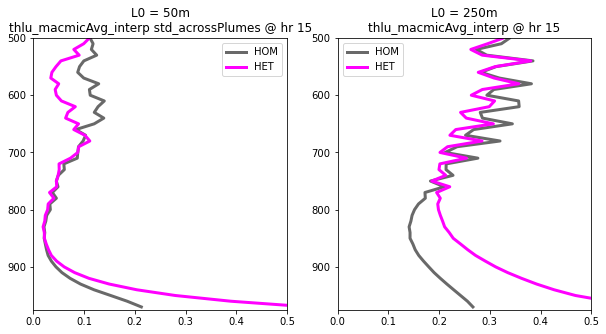

In [50]:
## Plot the std across plumes instead of the mean... 


hrSel = 15
# varSel = 'up_macmicAvg_interp'
varSel = 'thlu_macmicAvg_interp'
# varSel = 'qtu_macmicAvg_interp'
# varSel = 'edmf_upbuoy_interp'


fig,axs = plt.subplots(1,2,figsize=(10,5))
axs = axs.ravel() 

# - - - - - - - - - - - - 
# L50 
# - - - - - - - - - - - - 

## HOM 
thisHr_L50_HOM = scamDS_h2_L50.isel(time=np.where(scamDS_h2_L50['time.hour']==hrSel)[0]).isel(case=0)
homVarWgt = thisHr_L50_HOM['upa_macmicAvg_interp'].where(thisHr_L50_HOM.plumeLabel == 'SurfaceAvg').fillna(0)
homVar    = thisHr_L50_HOM[varSel].where(thisHr_L50_HOM.plumeLabel == 'SurfaceAvg').weighted(homVarWgt).std(dim='nens').resample(time='1H').mean().mean(dim='time')

## HET
thisHr_L50_HET = scamDS_h2_L50.isel(time=np.where(scamDS_h2_L50['time.hour']==hrSel)[0]).isel(case=1)
hetVarWgt = thisHr_L50_HET['upa_macmicAvg_interp'].fillna(0)
hetVar    = thisHr_L50_HET[varSel].weighted(hetVarWgt).std(dim='nens').resample(time='1H').mean().mean(dim='time')    

grassVarWgt = thisHr_L50_HET['upa_macmicAvg_interp'].where(thisHr_L50_HET.plumeLabel == 'C3grass').fillna(0)
cropVarWgt  = thisHr_L50_HET['upa_macmicAvg_interp'].where(thisHr_L50_HET.plumeLabel == 'IrrigCrop').fillna(0)
lakeVarWgt  = thisHr_L50_HET['upa_macmicAvg_interp'].where(thisHr_L50_HET.plumeLabel == 'Lake').fillna(0)
urbanVarWgt = thisHr_L50_HET['upa_macmicAvg_interp'].where(thisHr_L50_HET.plumeLabel == 'Urban').fillna(0)

grassVar = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'C3grass').weighted(grassVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')
cropVar  = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'IrrigCrop').weighted(cropVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')
lakeVar  = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'Lake').weighted(lakeVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')
urbanVar = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'Urban').weighted(urbanVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')

## Get std too 
grassVar_std = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'C3grass').weighted(grassVarWgt).mean(dim='nens').resample(time='1H').mean().std(dim='time')
cropVar_std  = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'IrrigCrop').weighted(cropVarWgt).mean(dim='nens').resample(time='1H').mean().std(dim='time')
lakeVar_std  = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'Lake').weighted(lakeVarWgt).mean(dim='nens').resample(time='1H').mean().std(dim='time')
urbanVar_std = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'Urban').weighted(urbanVarWgt).mean(dim='nens').resample(time='1H').mean().std(dim='time')


## Add to Plot 
axs[0].plot(homVar.values, homVar.levInterp, color='dimgrey', linewidth=3, label='HOM')

axs[0].plot(hetVar.values, hetVar.levInterp, color='magenta', linewidth=3, linestyle='-',label='HET')

# axs[0].plot(grassVar.values, grassVar.levInterp, color='forestgreen', linewidth=2, linestyle='-.', alpha=0.8, label='C3grass')
# # axs[0].fill_betweenx(grassVar.levInterp, grassVar.values-grassVar_std.values, grassVar.values+grassVar_std.values, color='mediumspringgreen', alpha=0.15)

# axs[0].plot(cropVar.values, cropVar.levInterp, color='deepskyblue', linewidth=2, linestyle='--', alpha=0.8, label='IrrCrop')
# # axs[0].fill_betweenx(cropVar.levInterp, cropVar.values-cropVar_std.values, cropVar.values+cropVar_std.values, color='darkorange', alpha=0.15)

# axs[0].plot(lakeVar.values, lakeVar.levInterp, color='blue', linewidth=2, alpha=0.7, label='Lake')
# # axs[0].fill_betweenx(lakeVar.levInterp, lakeVar.values-lakeVar_std.values, lakeVar.values+lakeVar_std.values, color='blue', alpha=0.15)

# axs[0].plot(urbanVar.values, urbanVar.levInterp, color='orangered', linewidth=2, alpha=0.7, label='Urban')
# # axs[0].fill_betweenx(urbanVar.levInterp, urbanVar.values-urbanVar_std.values, urbanVar.values+urbanVar_std.values, color='orangered', alpha=0.15)

axs[0].legend()

axs[0].invert_yaxis()
axs[0].set_title('L0 = 50m\n'+varSel+' std_acrossPlumes @ hr '+str(hrSel))

# - - - - - - - - - - - - 
# L250 
# - - - - - - - - - - - - 

## HOM 
thisHr_L250_HOM = scamDS_h2_L250.isel(time=np.where(scamDS_h2_L250['time.hour']==hrSel)[0]).isel(case=0)
homVarWgt = thisHr_L250_HOM['upa_macmicAvg_interp'].where(thisHr_L250_HOM.plumeLabel == 'SurfaceAvg').fillna(0)
homVar    = thisHr_L250_HOM[varSel].where(thisHr_L250_HOM.plumeLabel == 'SurfaceAvg').weighted(homVarWgt).std(dim='nens').resample(time='1H').mean().mean(dim='time')

## HET
thisHr_L250_HET = scamDS_h2_L250.isel(time=np.where(scamDS_h2_L250['time.hour']==hrSel)[0]).isel(case=1)
hetVarWgt = thisHr_L250_HET['upa_macmicAvg_interp'].fillna(0)
hetVar    = thisHr_L250_HET[varSel].weighted(hetVarWgt).std(dim='nens').resample(time='1H').mean().mean(dim='time')    

grassVarWgt = thisHr_L250_HET['upa_macmicAvg_interp'].where(thisHr_L250_HET.plumeLabel == 'C3grass').fillna(0)
cropVarWgt  = thisHr_L250_HET['upa_macmicAvg_interp'].where(thisHr_L250_HET.plumeLabel == 'IrrigCrop').fillna(0)
lakeVarWgt  = thisHr_L250_HET['upa_macmicAvg_interp'].where(thisHr_L250_HET.plumeLabel == 'Lake').fillna(0)
urbanVarWgt = thisHr_L250_HET['upa_macmicAvg_interp'].where(thisHr_L250_HET.plumeLabel == 'Urban').fillna(0)

grassVar = thisHr_L250_HET[varSel].where(thisHr_L250_HET.plumeLabel == 'C3grass').weighted(grassVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')
cropVar  = thisHr_L250_HET[varSel].where(thisHr_L250_HET.plumeLabel == 'IrrigCrop').weighted(cropVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')
lakeVar  = thisHr_L250_HET[varSel].where(thisHr_L250_HET.plumeLabel == 'Lake').weighted(lakeVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')
urbanVar = thisHr_L250_HET[varSel].where(thisHr_L250_HET.plumeLabel == 'Urban').weighted(urbanVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')

## Add to Plot 
axs[1].plot(homVar.values, homVar.levInterp, color='dimgrey', linewidth=3,  label='HOM')
axs[1].plot(hetVar.values, hetVar.levInterp, color='magenta', linewidth=3, linestyle='-',label='HET')
# axs[1].plot(grassVar.values, grassVar.levInterp, color='forestgreen',  linewidth=2, linestyle='-.', alpha=0.8, label='C3grass')
# axs[1].plot(cropVar.values, cropVar.levInterp, color='deepskyblue', linewidth=2, linestyle='--', alpha=0.8, label='IrrCrop')
# axs[1].plot(lakeVar.values, lakeVar.levInterp, color='blue', linewidth=2, alpha=0.7, label='Lake')
# axs[1].plot(urbanVar.values, urbanVar.levInterp, color='orangered', linewidth=2, alpha=0.7, label='Urban')
axs[1].legend()

axs[1].invert_yaxis()
axs[1].set_title('L0 = 250m\n'+varSel+' @ hr '+str(hrSel))

axs[0].set_ylim([975, 500])
axs[1].set_ylim([975, 500])

# 'thlu_macmicAvg_interp'
# axs[0].set_xlim([308,313])
# axs[1].set_xlim([308,313])
# axs[0].set_xlim([304,311])  ## 5am
# axs[1].set_xlim([304,311])

# # up_macmicAvg 
# axs[0].set_xlim([0,6])
# axs[1].set_xlim([0,6])

# qtu_macmicAvg
# axs[0].set_xlim([0.011,0.018]) 
# axs[1].set_xlim([0.011,0.018])

# # # buoyancy
# axs[0].set_xlim([0,0.03])
# axs[1].set_xlim([0,0.03])

# # thlu std 
axs[0].set_xlim([0,0.5])
axs[1].set_xlim([0,0.5])



(0.0, 25.0)

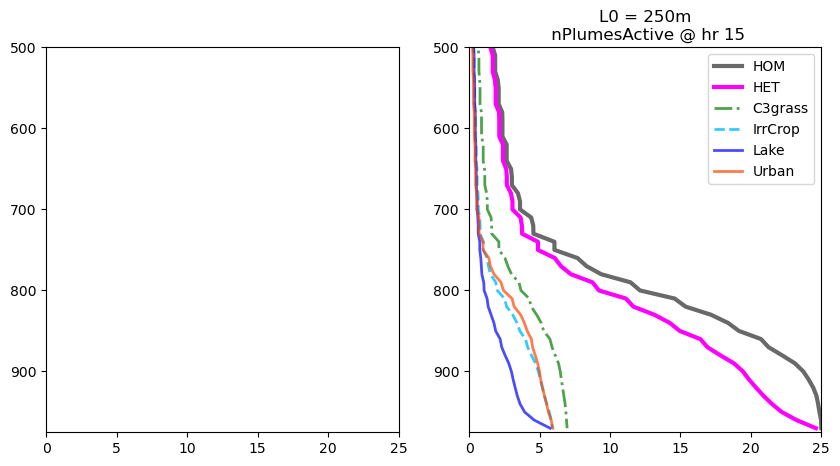

In [16]:
hrSel = 15
varSel = 'nPlumes_Active'
# varSel = 'thlu_macmicAvg_interp'
# varSel = 'qtu_macmicAvg_interp'
# varSel = 'edmf_upbuoy_interp'


fig,axs = plt.subplots(1,2,figsize=(10,5))
axs = axs.ravel() 

# # - - - - - - - - - - - - 
# # L50 
# # - - - - - - - - - - - - 

# ## HOM 
# thisHr_L50_HOM = scamDS_h0_L50.isel(time=np.where(scamDS_h0_L50['time.hour']==hrSel)[0]).isel(case=0)
# homVar    = thisHr_L50_HOM['nPlumesActive'].resample(time='1H').mean().mean(dim='time')

# ## HET
# thisHr_L50_HET = scamDS_h0_L50.isel(time=np.where(scamDS_h0_L50['time.hour']==hrSel)[0]).isel(case=1)
# hetVar    = thisHr_L50_HET['nPlumesActive'].resample(time='1H').mean().mean(dim='time')


# grassVar = thisHr_L50_HET['nPlumesActive_grass'].resample(time='1H').mean().mean(dim='time')
# cropVar  = thisHr_L50_HET['nPlumesActive_crop'].resample(time='1H').mean().mean(dim='time')
# lakeVar  = thisHr_L50_HET['nPlumesActive_lake'].resample(time='1H').mean().mean(dim='time')
# urbanVar = thisHr_L50_HET['nPlumesActive_urban'].resample(time='1H').mean().mean(dim='time')


# ## Add to Plot 
# axs[0].plot(homVar.values, homVar.levInterp, color='dimgrey', linewidth=3, label='HOM')
# axs[0].plot(hetVar.values, hetVar.levInterp, color='magenta', linewidth=3, linestyle='-',label='HET')
# axs[0].plot(grassVar.values, grassVar.levInterp, color='forestgreen', linewidth=2, linestyle='-.', alpha=0.8, label='C3grass')
# axs[0].plot(cropVar.values, cropVar.levInterp, color='deepskyblue', linewidth=2, linestyle='--', alpha=0.8, label='IrrCrop')
# axs[0].plot(lakeVar.values, lakeVar.levInterp, color='blue', linewidth=2, alpha=0.7, label='Lake')
# axs[0].plot(urbanVar.values, urbanVar.levInterp, color='orangered', linewidth=2, alpha=0.7, label='Urban')

# axs[0].legend()

# axs[0].invert_yaxis()
# axs[0].set_title('L0 = 50m\n nPlumesActive @ hr '+str(hrSel))

# - - - - - - - - - - - - 
# L250 
# - - - - - - - - - - - - 

## HOM 
thisHr_L250_HOM = scamDS_h0_L250.isel(time=np.where(scamDS_h0_L250['time.hour']==hrSel)[0]).isel(case=0)
homVar    = thisHr_L250_HOM['nPlumesActive'].resample(time='1H').mean().mean(dim='time')

## HET
thisHr_L250_HET = scamDS_h0_L250.isel(time=np.where(scamDS_h0_L250['time.hour']==hrSel)[0]).isel(case=1)
hetVar    = thisHr_L250_HET['nPlumesActive'].resample(time='1H').mean().mean(dim='time')

grassVar = thisHr_L250_HET['nPlumesActive_grass'].resample(time='1H').mean().mean(dim='time')
cropVar  = thisHr_L250_HET['nPlumesActive_crop'].resample(time='1H').mean().mean(dim='time')
lakeVar  = thisHr_L250_HET['nPlumesActive_lake'].resample(time='1H').mean().mean(dim='time')
urbanVar = thisHr_L250_HET['nPlumesActive_urban'].resample(time='1H').mean().mean(dim='time')


## Add to Plot 
axs[1].plot(homVar.values, homVar.levInterp, color='dimgrey', linewidth=3,  label='HOM')
axs[1].plot(hetVar.values, hetVar.levInterp, color='magenta', linewidth=3, linestyle='-',label='HET')
axs[1].plot(grassVar.values, grassVar.levInterp, color='forestgreen',  linewidth=2, linestyle='-.', alpha=0.8, label='C3grass')
axs[1].plot(cropVar.values, cropVar.levInterp, color='deepskyblue', linewidth=2, linestyle='--', alpha=0.8, label='IrrCrop')
axs[1].plot(lakeVar.values, lakeVar.levInterp, color='blue', linewidth=2, alpha=0.7, label='Lake')
axs[1].plot(urbanVar.values, urbanVar.levInterp, color='orangered', linewidth=2, alpha=0.7, label='Urban')
axs[1].legend()

axs[1].invert_yaxis()
axs[1].set_title('L0 = 250m\n nPlumesActive @ hr '+str(hrSel))

axs[0].set_ylim([975, 500])
axs[1].set_ylim([975, 500])

axs[0].set_xlim([0,25])
axs[1].set_xlim([0,25])



In [51]:
## Is there a way to get "termination height" for plumes...? 

thisHr_L50_HOM = scamDS_h0_L50.isel(time=np.where(scamDS_h0_L50['time.hour']==hrSel)[0]).isel(case=0)
homVar_hrly    = thisHr_L50_HOM['nPlumesActive'].resample(time='1H').mean().dropna(dim='time')
homVar_raw     = thisHr_L50_HOM['nPlumesActive']

thisHr_L50_HET = scamDS_h0_L50.isel(time=np.where(scamDS_h0_L50['time.hour']==hrSel)[0]).isel(case=1)
hetVar_hrly    = thisHr_L50_HET['nPlumesActive'].resample(time='1H').mean().dropna(dim='time')
hetVar_raw     = thisHr_L50_HET['nPlumesActive']

maxLev_HOM = np.full(len(homVar_raw.time.values), np.nan)
maxLev_HET = np.full(len(hetVar_raw.time.values), np.nan)
for iTimes in range(len(homVar_raw.time.values)): 
    imaxLev_HOM = np.min(np.where(homVar_raw.values[iTimes,:]>0)[0])
    maxLev_HOM[iTimes] = homVar_raw.levInterp.values[imaxLev_HOM]
    
    imaxLev_HET = np.min(np.where(hetVar_raw.values[iTimes,:]>0)[0])
    maxLev_HET[iTimes] = hetVar_raw.levInterp.values[imaxLev_HET]


In [57]:
print(maxLev_HOM.mean())
print(maxLev_HET.mean())

800.9329710144928
804.0579710144928


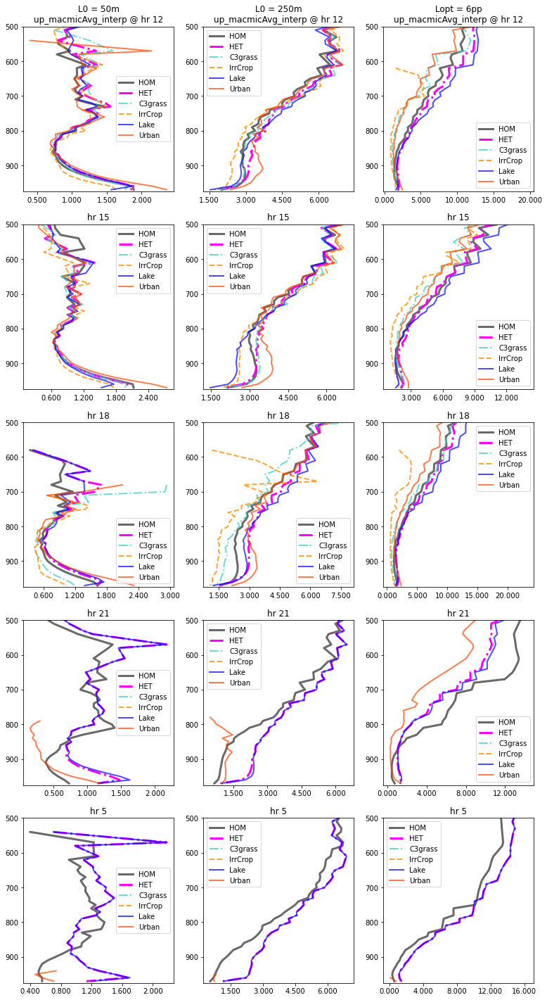

In [15]:
fig,axs = plt.subplots(5,3,figsize=(13,25))
axs = axs.ravel() 

hrList  = [12, 15, 18, 21, 5] 

varSel = 'up_macmicAvg_interp'
# varSel = 'thlu_macmicAvg_interp'
# varSel = 'qtu_macmicAvg_interp'
# varSel = 'edmf_upbuoy_interp'

for iHr in range(len(hrList)):
    hrSel = hrList[iHr]

    # - - - - - - - - - - - - 
    # L50 
    # - - - - - - - - - - - - 

    ## HOM 
    thisHr_L50_HOM = scamDS_h2_L50.isel(time=np.where(scamDS_h2_L50['time.hour']==hrSel)[0]).isel(case=0)
    homVarWgt = thisHr_L50_HOM['upa_macmicAvg_interp'].where(thisHr_L50_HOM.plumeLabel == 'SurfaceAvg').fillna(0)
    homVar    = thisHr_L50_HOM[varSel].where(thisHr_L50_HOM.plumeLabel == 'SurfaceAvg').weighted(homVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')
    homVar_std    = thisHr_L50_HOM[varSel].where(thisHr_L50_HOM.plumeLabel == 'SurfaceAvg').weighted(homVarWgt).mean(dim='nens').resample(time='1H').mean().std(dim='time')

    ## HET
    thisHr_L50_HET = scamDS_h2_L50.isel(time=np.where(scamDS_h2_L50['time.hour']==hrSel)[0]).isel(case=1)
    hetVarWgt = thisHr_L50_HET['upa_macmicAvg_interp'].fillna(0)
    hetVar    = thisHr_L50_HET[varSel].weighted(hetVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')    

    grassVarWgt = thisHr_L50_HET['upa_macmicAvg_interp'].where(thisHr_L50_HET.plumeLabel == 'C3grass').fillna(0)
    cropVarWgt  = thisHr_L50_HET['upa_macmicAvg_interp'].where(thisHr_L50_HET.plumeLabel == 'IrrigCrop').fillna(0)
    lakeVarWgt  = thisHr_L50_HET['upa_macmicAvg_interp'].where(thisHr_L50_HET.plumeLabel == 'Lake').fillna(0)
    urbanVarWgt = thisHr_L50_HET['upa_macmicAvg_interp'].where(thisHr_L50_HET.plumeLabel == 'Urban').fillna(0)

    grassVar = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'C3grass').weighted(grassVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')
    cropVar  = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'IrrigCrop').weighted(cropVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')
    lakeVar  = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'Lake').weighted(lakeVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')
    urbanVar = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'Urban').weighted(urbanVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')

    ## Get std too 
    grassVar_std = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'C3grass').weighted(grassVarWgt).mean(dim='nens').resample(time='1H').mean().std(dim='time')
    cropVar_std  = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'IrrigCrop').weighted(cropVarWgt).mean(dim='nens').resample(time='1H').mean().std(dim='time')
    lakeVar_std  = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'Lake').weighted(lakeVarWgt).mean(dim='nens').resample(time='1H').mean().std(dim='time')
    urbanVar_std = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'Urban').weighted(urbanVarWgt).mean(dim='nens').resample(time='1H').mean().std(dim='time')


    ## Add to Plot 
    axs[iHr*3].plot(homVar.values, homVar.levInterp, color='dimgrey', linewidth=3, label='HOM')
    axs[iHr*3].plot(hetVar.values, hetVar.levInterp, color='magenta', linewidth=3, linestyle='-.',label='HET')
    axs[iHr*3].plot(grassVar.values, grassVar.levInterp, color='mediumturquoise', linewidth=2, linestyle='-.', alpha=0.8, label='C3grass')
    axs[iHr*3].plot(cropVar.values, cropVar.levInterp, color='darkorange', linewidth=2, linestyle='--', alpha=0.8, label='IrrCrop')
    axs[iHr*3].plot(lakeVar.values, lakeVar.levInterp, color='blue', linewidth=2, alpha=0.7, label='Lake')
    axs[iHr*3].plot(urbanVar.values, urbanVar.levInterp, color='orangered', linewidth=2, alpha=0.7, label='Urban')
    axs[iHr*3].legend()

    axs[iHr*3].invert_yaxis()
    if iHr==0:
        axs[iHr*3].set_title('L0 = 50m\n'+varSel+' @ hr '+str(hrSel))
    else:
        axs[iHr*3].set_title('hr '+str(hrSel))

    # - - - - - - - - - - - - 
    # L250 
    # - - - - - - - - - - - - 

    ## HOM 
    thisHr_L250_HOM = scamDS_h2_L250.isel(time=np.where(scamDS_h2_L250['time.hour']==hrSel)[0]).isel(case=0)
    homVarWgt = thisHr_L250_HOM['upa_macmicAvg_interp'].where(thisHr_L250_HOM.plumeLabel == 'SurfaceAvg').fillna(0)
    homVar    = thisHr_L250_HOM[varSel].where(thisHr_L250_HOM.plumeLabel == 'SurfaceAvg').weighted(homVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')

    ## HET
    thisHr_L250_HET = scamDS_h2_L250.isel(time=np.where(scamDS_h2_L250['time.hour']==hrSel)[0]).isel(case=1)
    hetVarWgt = thisHr_L250_HET['upa_macmicAvg_interp'].fillna(0)
    hetVar    = thisHr_L250_HET[varSel].weighted(hetVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')    
    
    grassVarWgt = thisHr_L250_HET['upa_macmicAvg_interp'].where(thisHr_L250_HET.plumeLabel == 'C3grass').fillna(0)
    cropVarWgt  = thisHr_L250_HET['upa_macmicAvg_interp'].where(thisHr_L250_HET.plumeLabel == 'IrrigCrop').fillna(0)
    lakeVarWgt  = thisHr_L250_HET['upa_macmicAvg_interp'].where(thisHr_L250_HET.plumeLabel == 'Lake').fillna(0)
    urbanVarWgt = thisHr_L250_HET['upa_macmicAvg_interp'].where(thisHr_L250_HET.plumeLabel == 'Urban').fillna(0)

    grassVar = thisHr_L250_HET[varSel].where(thisHr_L250_HET.plumeLabel == 'C3grass').weighted(grassVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')
    cropVar  = thisHr_L250_HET[varSel].where(thisHr_L250_HET.plumeLabel == 'IrrigCrop').weighted(cropVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')
    lakeVar  = thisHr_L250_HET[varSel].where(thisHr_L250_HET.plumeLabel == 'Lake').weighted(lakeVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')
    urbanVar = thisHr_L250_HET[varSel].where(thisHr_L250_HET.plumeLabel == 'Urban').weighted(urbanVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')

    ## Add to Plot 
    axs[(iHr*3)+1].plot(homVar.values, homVar.levInterp, color='dimgrey', linewidth=3,  label='HOM')
    axs[(iHr*3)+1].plot(hetVar.values, hetVar.levInterp, color='magenta', linewidth=3, linestyle='-.',label='HET')
    axs[(iHr*3)+1].plot(grassVar.values, grassVar.levInterp, color='mediumturquoise',  linewidth=2, linestyle='-.', alpha=0.8, label='C3grass')
    axs[(iHr*3)+1].plot(cropVar.values, cropVar.levInterp, color='darkorange', linewidth=2, linestyle='--', alpha=0.8, label='IrrCrop')
    axs[(iHr*3)+1].plot(lakeVar.values, lakeVar.levInterp, color='blue', linewidth=2, alpha=0.7, label='Lake')
    axs[(iHr*3)+1].plot(urbanVar.values, urbanVar.levInterp, color='orangered', linewidth=2, alpha=0.7, label='Urban')
    axs[(iHr*3)+1].legend()

    axs[(iHr*3)+1].invert_yaxis()
    if iHr==0:
        axs[(iHr*3)+1].set_title('L0 = 250m\n'+varSel+' @ hr '+str(hrSel))
    else: 
        axs[(iHr*3)+1].set_title('hr '+str(hrSel))        

    # - - - - - - - - - - - - 
    # Lpp 
    # - - - - - - - - - - - - 

    ## HOM 
    thisHr_Lpp_HOM = scamDS_h2_Lpp.isel(time=np.where(scamDS_h2_Lpp['time.hour']==hrSel)[0]).isel(case=0)
    homVarWgt = thisHr_Lpp_HOM['upa_macmicAvg_interp'].where(thisHr_Lpp_HOM.plumeLabel == 'SurfaceAvg').fillna(0)
    homVar    = thisHr_Lpp_HOM[varSel].where(thisHr_Lpp_HOM.plumeLabel == 'SurfaceAvg').weighted(homVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')
    homVarCount = thisHr_Lpp_HOM[varSel].where(thisHr_Lpp_HOM.plumeLabel == 'SurfaceAvg').resample(time='1H').mean().mean(dim='time').count(dim='nens')

    ## HET
    thisHr_Lpp_HET = scamDS_h2_Lpp.isel(time=np.where(scamDS_h2_Lpp['time.hour']==hrSel)[0]).isel(case=1)
    hetVarWgt = thisHr_Lpp_HET['upa_macmicAvg_interp'].fillna(0)
    hetVar    = thisHr_Lpp_HET[varSel].weighted(hetVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')    

    grassVarWgt = thisHr_Lpp_HET['upa_macmicAvg_interp'].where(thisHr_Lpp_HET.plumeLabel == 'C3grass').fillna(0)
    cropVarWgt  = thisHr_Lpp_HET['upa_macmicAvg_interp'].where(thisHr_Lpp_HET.plumeLabel == 'IrrigCrop').fillna(0)
    lakeVarWgt  = thisHr_Lpp_HET['upa_macmicAvg_interp'].where(thisHr_Lpp_HET.plumeLabel == 'Lake').fillna(0)
    urbanVarWgt = thisHr_Lpp_HET['upa_macmicAvg_interp'].where(thisHr_Lpp_HET.plumeLabel == 'Urban').fillna(0)

    grassVar = thisHr_Lpp_HET[varSel].where(thisHr_Lpp_HET.plumeLabel == 'C3grass').weighted(grassVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')
    cropVar  = thisHr_Lpp_HET[varSel].where(thisHr_Lpp_HET.plumeLabel == 'IrrigCrop').weighted(cropVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')
    lakeVar  = thisHr_Lpp_HET[varSel].where(thisHr_Lpp_HET.plumeLabel == 'Lake').weighted(lakeVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')
    urbanVar = thisHr_Lpp_HET[varSel].where(thisHr_Lpp_HET.plumeLabel == 'Urban').weighted(urbanVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')

    grassVarCount = thisHr_Lpp_HET[varSel].where(thisHr_Lpp_HET.plumeLabel == 'C3grass').resample(time='1H').mean().mean(dim='time').count(dim='nens')
    cropVarCount  = thisHr_Lpp_HET[varSel].where(thisHr_Lpp_HET.plumeLabel == 'IrrigCrop').resample(time='1H').mean().mean(dim='time').count(dim='nens')
    lakeVarCount  = thisHr_Lpp_HET[varSel].where(thisHr_Lpp_HET.plumeLabel == 'Lake').resample(time='1H').mean().mean(dim='time').count(dim='nens')
    urbanVarCount = thisHr_Lpp_HET[varSel].where(thisHr_Lpp_HET.plumeLabel == 'Urban').resample(time='1H').mean().mean(dim='time').count(dim='nens')


    ## Add to Plot 
    axs[(iHr*3)+2].plot(homVar.values, homVar.levInterp, color='dimgrey', linewidth=3, label='HOM')
    axs[(iHr*3)+2].plot(hetVar.values, hetVar.levInterp, color='magenta', linewidth=3, linestyle='-.',label='HET')
    axs[(iHr*3)+2].plot(grassVar.values, grassVar.levInterp, color='mediumturquoise', linewidth=2, linestyle='-.', alpha=0.8, label='C3grass')
    axs[(iHr*3)+2].plot(cropVar.values, cropVar.levInterp, color='darkorange', linewidth=2, linestyle='--', alpha=0.8, label='IrrCrop')
    axs[(iHr*3)+2].plot(lakeVar.values, lakeVar.levInterp, color='blue', linewidth=2, alpha=0.7, label='Lake')
    axs[(iHr*3)+2].plot(urbanVar.values, urbanVar.levInterp, color='orangered', linewidth=2, alpha=0.7, label='Urban')
    axs[(iHr*3)+2].legend()
    
    axs[(iHr*3)+2].invert_yaxis()
    
    if iHr==0:
        axs[(iHr*3)+2].set_title('Lopt = 6pp\n'+varSel+' @ hr '+str(hrSel))
    else:
        axs[(iHr*3)+2].set_title('hr '+str(hrSel))


    axs[(iHr*3)].set_ylim([975, 500])
    axs[(iHr*3)+1].set_ylim([975, 500])
    axs[(iHr*3)+2].set_ylim([975, 500])
    
    axs[(iHr*3)].xaxis.set_major_formatter(FormatStrFormatter('%.3f'))
    axs[(iHr*3)+1].xaxis.set_major_formatter(FormatStrFormatter('%.3f'))
    axs[(iHr*3)+2].xaxis.set_major_formatter(FormatStrFormatter('%.3f'))
    
    axs[(iHr*3)].xaxis.set_major_locator(plt.MaxNLocator(5))
    axs[(iHr*3)+1].xaxis.set_major_locator(plt.MaxNLocator(5))
    axs[(iHr*3)+2].xaxis.set_major_locator(plt.MaxNLocator(5))

    # # 'thlu_macmicAvg_interp'
    # axs[(iHr*3)].set_xlim([307,322])
    # axs[(iHr*3)+1].set_xlim([307,322])
    # axs[(iHr*3)+2].set_xlim([307,322])

    # # up_macmicAvg 
    # axs[(iHr*3)].set_xlim([0,13])
    # axs[(iHr*3)+1].set_xlim([0,13])
    # axs[(iHr*3)+2].set_xlim([0,13])

    # # qtu_macmicAvg
    # axs[(iHr*3)].set_xlim([0.005,0.02])
    # axs[(iHr*3)+1].set_xlim([0.005,0.02])
    # axs[(iHr*3)+2].set_xlim([0.005,0.02])
    
    # edmf_upbuoy 



What if we made some tables of the plume properties that have changed? <br> 
- Daytime vs. Nighttime (6a-6p) / (6p-6a)
- Different levels (950, 850, 750 hPa)
- Plume means and standard deviations (weighted by plume area)


In [ ]:
# scamDS_h2_L50, scamDS_h2_L250, scamDS_h2_Lpp, 

In [ ]:
def MFplume_meanANDstd(DS, varPlot, selLev): 
    
    ## Get the weights 
    HOMwgts_DS = DS.upa_macmicAvg_interp.sel(levInterp=selLev, method='nearest').isel(case=0).resample(time='1H').mean().fillna(0)
    HETwgts_DS = DS.upa_macmicAvg_interp.sel(levInterp=selLev, method='nearest').isel(case=1).resample(time='1H').mean().fillna(0)
    
    homMean_DS = DS[varPlot].sel(levInterp=selLev, method='nearest').isel(case=0).resample(time='1H').mean().weighted(HOMwgts_DS).mean(dim='nens').groupby('time.hour').mean(dim='time')
    hetMean_DS = DS[varPlot].sel(levInterp=selLev, method='nearest').isel(case=1).resample(time='1H').mean().weighted(HETwgts_DS).mean(dim='nens').groupby('time.hour').mean(dim='time')

    homStd_DS  = DS[varPlot].sel(levInterp=selLev, method='nearest').isel(case=0).resample(time='1H').mean().weighted(HOMwgts_DS).std(dim='nens').groupby('time.hour').mean(dim='time')
    hetStd_DS  = DS[varPlot].sel(levInterp=selLev, method='nearest').isel(case=1).resample(time='1H').mean().weighted(HETwgts_DS).std(dim='nens').groupby('time.hour').mean(dim='time')

    return homMean_DS,hetMean_DS,homStd_DS,hetStd_DS


In [23]:

varSel = 'up_macmicAvg_interp'
levSels = [950, 850, 750]

print(' Daytime averages (6a-6p): '+varSel)
print()
print('            ------- L0 = 50 m -------            ------- L0 = 250 m -------            ------- Lopt = 6pp -------') 
print('              HOM              HET                 HOM                HET                HOM                HET         ')

levSels = [950, 850, 750]

for iLev in range(len(levSels)): 
    
    # Select daytime hours 
    iTime50_day  = np.where( (scamDS_h2_L50['time.hour'].values>=6) &  (scamDS_h2_L50['time.hour'].values<=18) )[0]
    iTime250_day = np.where( (scamDS_h2_L50['time.hour'].values>=6) &  (scamDS_h2_L50['time.hour'].values<=18) )[0]
    iTimePP_day  = np.where( (scamDS_h2_L50['time.hour'].values>=6) &  (scamDS_h2_L50['time.hour'].values<=18) )[0]

    homMean_L50,hetMean_L50,homStd_L50,hetStd_L50     = MFplume_meanANDstd(scamDS_h2_L50.isel(time=iTime50_day), varSel, levSels[iLev])
    homMean_L250,hetMean_L250,homStd_L250,hetStd_L250 = MFplume_meanANDstd(scamDS_h2_L250.isel(time=iTime250_day), varSel, levSels[iLev])
    homMean_Lpp,hetMean_Lpp,homStd_Lpp,hetStd_Lpp     = MFplume_meanANDstd(scamDS_h2_Lpp.isel(time=iTimePP_day), varSel, levSels[iLev])

    print('%3i hPa:| %4.2f+/-%4.2f %9.2f+/-%4.2f | %14f+/-%4.2f %9.2f+/-%4.2f | %13f+/-%4.2f %9.2f+/-%4.2f |' % 
          (levSels[iLev], homMean_L50.mean(dim='hour').values,homStd_L50.mean(dim='hour').values, 
                          hetMean_L50.mean(dim='hour').values, hetStd_L50.mean(dim='hour').values, 
            homMean_L250.mean(dim='hour').values,homStd_L250.mean(dim='hour').values, 
                          hetMean_L250.mean(dim='hour').values, hetStd_L250.mean(dim='hour').values,
            homMean_Lpp.mean(dim='hour').values,homStd_Lpp.mean(dim='hour').values, 
                        hetMean_Lpp.mean(dim='hour').values, hetStd_Lpp.mean(dim='hour').values) )



 Daytime averages (6a-6p): up_macmicAvg_interp

            ------- L0 = 50 m -------            ------- L0 = 250 m -------            ------- Lopt = 6pp -------
              HOM              HET                 HOM                HET                HOM                HET         
950 hPa: 1.34+/-0.20      1.56+/-0.45 |        2.281923+/-0.39      2.56+/-0.79 |        1.345631+/-0.27      1.69+/-0.56
850 hPa: 0.82+/-0.17      0.80+/-0.15 |        2.604206+/-0.64      3.08+/-0.82 |        2.192697+/-0.36      2.50+/-0.53
750 hPa: 1.25+/-0.25      1.24+/-0.19 |        3.937514+/-1.09      4.31+/-0.94 |        5.209444+/-0.57      5.69+/-0.55


In [24]:

varSel = 'thlu_macmicAvg_interp'
levSels = [950, 850, 750]

print(' Daytime averages (6a-6p): '+varSel)
print()
print('            ------- L0 = 50 m -------            ------- L0 = 250 m -------            ------- Lopt = 6pp -------') 
print('              HOM              HET                 HOM                HET                HOM                HET         ')

levSels = [950, 850, 750]

for iLev in range(len(levSels)): 
    
    # Select daytime hours 
    iTime50_day  = np.where( (scamDS_h2_L50['time.hour'].values>=6) &  (scamDS_h2_L50['time.hour'].values<=18) )[0]
    iTime250_day = np.where( (scamDS_h2_L50['time.hour'].values>=6) &  (scamDS_h2_L50['time.hour'].values<=18) )[0]
    iTimePP_day  = np.where( (scamDS_h2_L50['time.hour'].values>=6) &  (scamDS_h2_L50['time.hour'].values<=18) )[0]

    homMean_L50,hetMean_L50,homStd_L50,hetStd_L50     = MFplume_meanANDstd(scamDS_h2_L50.isel(time=iTime50_day), varSel, levSels[iLev])
    homMean_L250,hetMean_L250,homStd_L250,hetStd_L250 = MFplume_meanANDstd(scamDS_h2_L250.isel(time=iTime250_day), varSel, levSels[iLev])
    homMean_Lpp,hetMean_Lpp,homStd_Lpp,hetStd_Lpp     = MFplume_meanANDstd(scamDS_h2_Lpp.isel(time=iTimePP_day), varSel, levSels[iLev])

    print('%3i hPa:| %4.2f+/-%4.2f %9.2f+/-%4.2f | %14f+/-%4.2f %9.2f+/-%4.2f | %13f+/-%4.2f %9.2f+/-%4.2f |' % 
          (levSels[iLev], homMean_L50.mean(dim='hour').values,homStd_L50.mean(dim='hour').values, 
                          hetMean_L50.mean(dim='hour').values, hetStd_L50.mean(dim='hour').values, 
            homMean_L250.mean(dim='hour').values,homStd_L250.mean(dim='hour').values, 
                          hetMean_L250.mean(dim='hour').values, hetStd_L250.mean(dim='hour').values,
            homMean_Lpp.mean(dim='hour').values,homStd_Lpp.mean(dim='hour').values, 
                        hetMean_Lpp.mean(dim='hour').values, hetStd_Lpp.mean(dim='hour').values) )



 Daytime averages (6a-6p): thlu_macmicAvg_interp

            ------- L0 = 50 m -------            ------- L0 = 250 m -------            ------- Lopt = 6pp -------
              HOM              HET                 HOM                HET                HOM                HET         
950 hPa:| 307.58+/-0.06    307.88+/-0.18 |     307.336016+/-0.12    307.65+/-0.32 |    307.473447+/-0.08    307.61+/-0.21 |
850 hPa:| 307.30+/-0.05    307.51+/-0.04 |     307.189100+/-0.12    307.75+/-0.18 |    307.246135+/-0.05    307.32+/-0.07 |
750 hPa:| 309.55+/-0.12    309.32+/-0.08 |     308.821392+/-0.24    309.25+/-0.20 |    309.077461+/-0.08    308.96+/-0.08 |


In [25]:

varSel = 'qtu_macmicAvg_interp'
levSels = [950, 850, 750]

print(' Daytime averages (6a-6p): '+varSel)
print()
print('            ------- L0 = 50 m -------            ------- L0 = 250 m -------            ------- Lopt = 6pp -------') 
print('              HOM              HET                 HOM                HET                HOM                HET         ')

levSels = [950, 850, 750]

for iLev in range(len(levSels)): 
    
    # Select daytime hours 
    iTime50_day  = np.where( (scamDS_h2_L50['time.hour'].values>=6) &  (scamDS_h2_L50['time.hour'].values<=18) )[0]
    iTime250_day = np.where( (scamDS_h2_L50['time.hour'].values>=6) &  (scamDS_h2_L50['time.hour'].values<=18) )[0]
    iTimePP_day  = np.where( (scamDS_h2_L50['time.hour'].values>=6) &  (scamDS_h2_L50['time.hour'].values<=18) )[0]

    homMean_L50,hetMean_L50,homStd_L50,hetStd_L50     = MFplume_meanANDstd(scamDS_h2_L50.isel(time=iTime50_day), varSel, levSels[iLev])
    homMean_L250,hetMean_L250,homStd_L250,hetStd_L250 = MFplume_meanANDstd(scamDS_h2_L250.isel(time=iTime250_day), varSel, levSels[iLev])
    homMean_Lpp,hetMean_Lpp,homStd_Lpp,hetStd_Lpp     = MFplume_meanANDstd(scamDS_h2_Lpp.isel(time=iTimePP_day), varSel, levSels[iLev])

    print('%3i hPa:| %4.2f+/-%4.2f %9.2f+/-%4.2f | %14f+/-%4.2f %9.2f+/-%4.2f | %13f+/-%4.2f %9.2f+/-%4.2f |' % 
          (levSels[iLev], homMean_L50.mean(dim='hour').values,homStd_L50.mean(dim='hour').values, 
                          hetMean_L50.mean(dim='hour').values, hetStd_L50.mean(dim='hour').values, 
            homMean_L250.mean(dim='hour').values,homStd_L250.mean(dim='hour').values, 
                          hetMean_L250.mean(dim='hour').values, hetStd_L250.mean(dim='hour').values,
            homMean_Lpp.mean(dim='hour').values,homStd_Lpp.mean(dim='hour').values, 
                        hetMean_Lpp.mean(dim='hour').values, hetStd_Lpp.mean(dim='hour').values) )



 Daytime averages (6a-6p): qtu_macmicAvg_interp

            ------- L0 = 50 m -------            ------- L0 = 250 m -------            ------- Lopt = 6pp -------
              HOM              HET                 HOM                HET                HOM                HET         
950 hPa:| 0.02+/-0.00      0.02+/-0.00 |       0.016651+/-0.00      0.02+/-0.00 |      0.016549+/-0.00      0.02+/-0.00 |
850 hPa:| 0.02+/-0.00      0.01+/-0.00 |       0.016118+/-0.00      0.02+/-0.00 |      0.015371+/-0.00      0.02+/-0.00 |
750 hPa:| 0.01+/-0.00      0.01+/-0.00 |       0.014553+/-0.00      0.01+/-0.00 |      0.014429+/-0.00      0.01+/-0.00 |


Diurnal cycle plots

array([<AxesSubplot:title={'center':'RHREFHT'}, xlabel='Local Time (hour)', ylabel='fraction'>,
       <AxesSubplot:title={'center':'RHREFHT'}, xlabel='Local Time (hour)', ylabel='fraction'>],
      dtype=object)

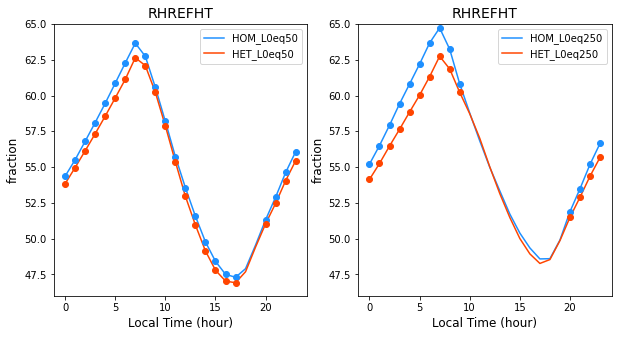

In [31]:
varPlot     = 'RHREFHT'
yMax        = 65
yMin        = 46
unitsString = scamDS_h0_L50[varPlot].units
setYlims    = True
valMult     =  1

plotDiurnalCycle(scamDS_h0_L50, scamDS_h0_L250,
                 varPlot, valMult, unitsString,
                 setYlims, yMin, yMax)


In [ ]:
varPlot     = 'RHREFHT'
yMax        = 69
yMin        = 46
unitsString = scamDS_h0_L250[varPlot].units
setYlims    = True
valMult     =  1

plotDiurnalCycle(scamDS_h0_L50, scamDS_h0_L250,
                 varPlot, valMult, unitsString,
                 setYlims, yMin, yMax)


array([<AxesSubplot:title={'center':'QREFHT'}, xlabel='Local Time (hour)', ylabel='kg/kg'>,
       <AxesSubplot:title={'center':'QREFHT'}, xlabel='Local Time (hour)', ylabel='kg/kg'>],
      dtype=object)

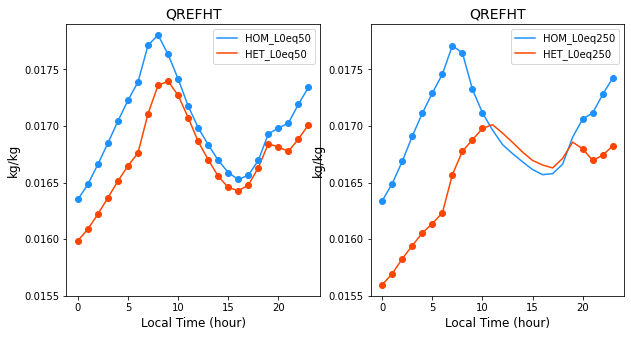

In [35]:
varPlot     = 'QREFHT'
yMax        = 0.0179
yMin        = 0.0155
unitsString = scamDS_h0_L50[varPlot].units
setYlims    = True
valMult     = 1

plotDiurnalCycle(scamDS_h0_L50, scamDS_h0_L250,
                 varPlot, valMult, unitsString,
                 setYlims, yMin, yMax)


In [ ]:
varPlot     = 'QREFHT'
yMax        = 0.0183
yMin        = 0.0155
unitsString = scamDS_h0_L250[varPlot].units
setYlims    = True
valMult     = 1

plotDiurnalCycle(scamDS_h0_L50, scamDS_h0_L250,
                 varPlot, valMult, unitsString,
                 setYlims, yMin, yMax)


array([<AxesSubplot:title={'center':'TREFHT'}, xlabel='Local Time (hour)', ylabel='K'>,
       <AxesSubplot:title={'center':'TREFHT'}, xlabel='Local Time (hour)', ylabel='K'>],
      dtype=object)

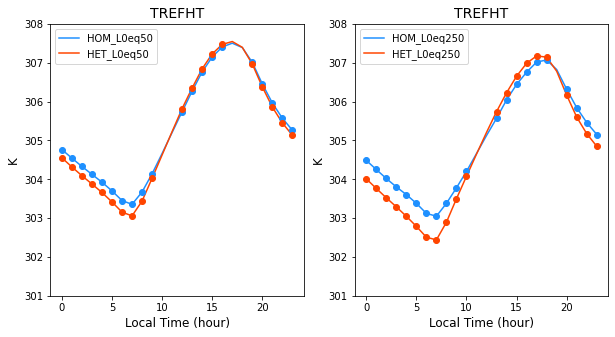

In [ ]:
varPlot     = 'TREFHT'
yMax        = 308
yMin        = 301
unitsString = scamDS_h0_L50[varPlot].units
setYlims    = True
valMult     = 1

plotDiurnalCycle(scamDS_h0_L50, scamDS_h0_L250,
                 varPlot, valMult, unitsString,
                 setYlims, yMin, yMax)


In [ ]:
varPlot     = 'TREFHT'
yMax        = 308
yMin        = 301
unitsString = scamDS_h0_L250[varPlot].units
setYlims    = True
valMult     = 1

plotDiurnalCycle(scamDS_h0_L50, scamDS_h0_L250,
                 varPlot, valMult, unitsString,
                 setYlims, yMin, yMax)


array([<AxesSubplot:title={'center':'CLDTOT'}, xlabel='Local Time (hour)', ylabel='fraction'>,
       <AxesSubplot:title={'center':'CLDTOT'}, xlabel='Local Time (hour)', ylabel='fraction'>],
      dtype=object)

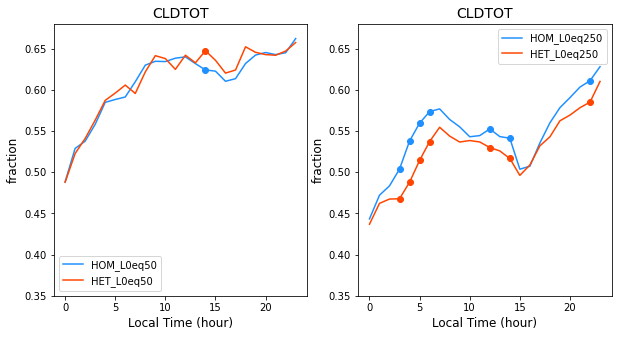

In [ ]:
varPlot     = 'CLDTOT'
yMax        = 0.68
yMin        = 0.35
unitsString = scamDS_h0_L50[varPlot].units
setYlims    = True
valMult     = 1

plotDiurnalCycle(scamDS_h0_L50, scamDS_h0_L250,
                 varPlot, valMult, unitsString,
                 setYlims, yMin, yMax)


In [ ]:
varPlot     = 'CLDTOT'
yMax        = 0.68
yMin        = 0.35
unitsString = scamDS_h0_L250[varPlot].units
setYlims    = True
valMult     = 1

plotDiurnalCycle(scamDS_h0_L50, scamDS_h0_L250,
                 varPlot, valMult, unitsString,
                 setYlims, yMin, yMax)


array([<AxesSubplot:title={'center':'CLDLOW'}, xlabel='Local Time (hour)', ylabel='fraction'>,
       <AxesSubplot:title={'center':'CLDLOW'}, xlabel='Local Time (hour)', ylabel='fraction'>],
      dtype=object)

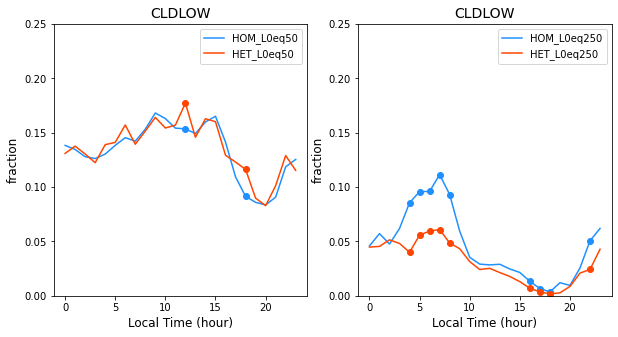

In [ ]:
varPlot     = 'CLDLOW'
yMax        = 0.25
yMin        = 0.0
unitsString = scamDS_h0_L50[varPlot].units
setYlims    = True
valMult     = 1

plotDiurnalCycle(scamDS_h0_L50, scamDS_h0_L250,
                 varPlot, valMult, unitsString,
                 setYlims, yMin, yMax)


In [ ]:
varPlot     = 'CLDLOW'
yMax        = 0.25
yMin        = 0.0
unitsString = scamDS_h0_L250[varPlot].units
setYlims    = True
valMult     = 1

plotDiurnalCycle(scamDS_h0_L50, scamDS_h0_L250,
                 varPlot, valMult, unitsString,
                 setYlims, yMin, yMax)


array([<AxesSubplot:title={'center':'TGCLDLWP'}, xlabel='Local Time (hour)', ylabel='kg/m2'>,
       <AxesSubplot:title={'center':'TGCLDLWP'}, xlabel='Local Time (hour)', ylabel='kg/m2'>],
      dtype=object)

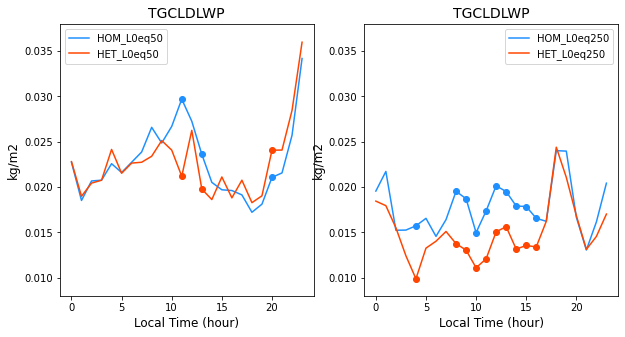

In [ ]:
varPlot     = 'TGCLDLWP'
yMax        = 0.038
yMin        = 0.008
unitsString = scamDS_h0_L50[varPlot].units
setYlims    = True
valMult     = 1

plotDiurnalCycle(scamDS_h0_L50, scamDS_h0_L250,
                 varPlot, valMult, unitsString,
                 setYlims, yMin, yMax)


In [ ]:
varPlot     = 'TGCLDLWP'
yMax        = 0.038
yMin        = 0.008
unitsString = scamDS_h0_L250[varPlot].units
setYlims    = True
valMult     = 1

plotDiurnalCycle(scamDS_h0_L50, scamDS_h0_L250,
                 varPlot, valMult, unitsString,
                 setYlims, yMin, yMax)


array([<AxesSubplot:title={'center':'TMQ'}, xlabel='Local Time (hour)', ylabel='kg/m2'>,
       <AxesSubplot:title={'center':'TMQ'}, xlabel='Local Time (hour)', ylabel='kg/m2'>],
      dtype=object)

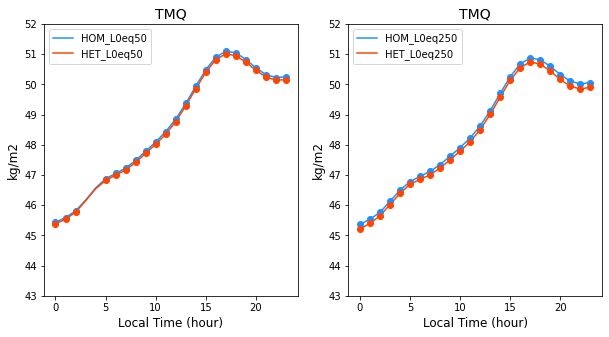

In [ ]:
varPlot     = 'TMQ'
yMax        = 52
yMin        = 43
unitsString = scamDS_h0_L50[varPlot].units
setYlims    = True
valMult     = 1

plotDiurnalCycle(scamDS_h0_L50, scamDS_h0_L250,
                 varPlot, valMult, unitsString,
                 setYlims, yMin, yMax)


In [ ]:
varPlot     = 'TMQ'
yMax        = 52
yMin        = 43
unitsString = scamDS_h0_L250[varPlot].units
setYlims    = True
valMult     = 1

plotDiurnalCycle(scamDS_h0_L50, scamDS_h0_L250,
                 varPlot, valMult, unitsString,
                 setYlims, yMin, yMax)


array([<AxesSubplot:title={'center':'PBLH'}, xlabel='Local Time (hour)', ylabel='m'>,
       <AxesSubplot:title={'center':'PBLH'}, xlabel='Local Time (hour)', ylabel='m'>],
      dtype=object)

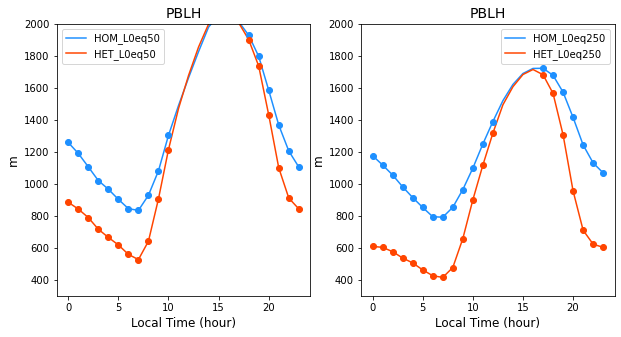

In [ ]:
varPlot     = 'PBLH'
yMax        = 2000
yMin        = 300
unitsString = scamDS_h0_L50[varPlot].units
setYlims    = True
valMult     = 1

plotDiurnalCycle(scamDS_h0_L50, scamDS_h0_L250,
                 varPlot, valMult, unitsString,
                 setYlims, yMin, yMax)



In [ ]:
varPlot     = 'PBLH'
yMax        = 2000
yMin        = 300
unitsString = scamDS_h0_L250[varPlot].units
setYlims    = True
valMult     = 1

plotDiurnalCycle(scamDS_h0_L50, scamDS_h0_L250,
                 varPlot, valMult, unitsString,
                 setYlims, yMin, yMax)



array([<AxesSubplot:title={'center':'PRECT'}, xlabel='Local Time (hour)', ylabel='mm/d'>,
       <AxesSubplot:title={'center':'PRECT'}, xlabel='Local Time (hour)', ylabel='mm/d'>],
      dtype=object)

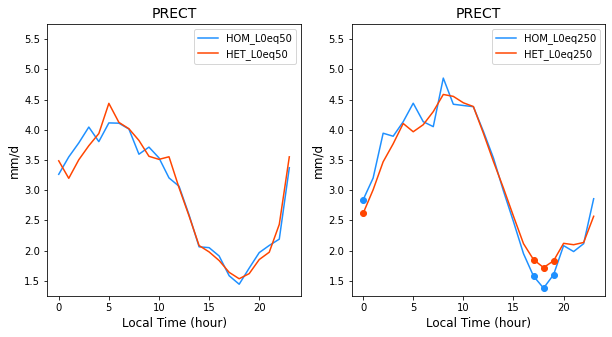

In [ ]:
varPlot     = 'PRECT'
yMax        = 5.75
yMin        = 1.25
unitsString = 'mm/d'
setYlims    = True
valMult     = 86400*1e3

plotDiurnalCycle(scamDS_h0_L50, scamDS_h0_L250,
                 varPlot, valMult, unitsString,
                 setYlims, yMin, yMax)


In [ ]:
varPlot     = 'PRECT'
yMax        = 5.75
yMin        = 1.0
unitsString = 'mm/d'
setYlims    = True
valMult     = 86400*1e3

plotDiurnalCycle(scamDS_h0_L50, scamDS_h0_L250,
                 varPlot, valMult, unitsString,
                 setYlims, yMin, yMax)


array([<AxesSubplot:title={'center':'PRECC'}, xlabel='Local Time (hour)', ylabel='mm/d'>,
       <AxesSubplot:title={'center':'PRECC'}, xlabel='Local Time (hour)', ylabel='mm/d'>],
      dtype=object)

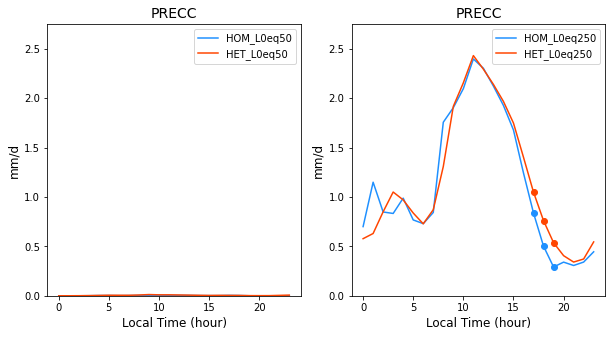

In [ ]:
varPlot     = 'PRECC'
yMax        = 2.75
yMin        = 0.0
unitsString = 'mm/d'
setYlims    = True
valMult     = 86400*1e3

plotDiurnalCycle(scamDS_h0_L50, scamDS_h0_L250,
                 varPlot, valMult, unitsString,
                 setYlims, yMin, yMax)



In [ ]:
varPlot     = 'PRECC'
yMax        = 2.75
yMin        = 0.0
unitsString = 'mm/d'
setYlims    = True
valMult     = 86400*1e3

plotDiurnalCycle(scamDS_h0_L50, scamDS_h0_L250,
                 varPlot, valMult, unitsString,
                 setYlims, yMin, yMax)



Text(0, 0.5, 'Count of hourly rain rates >0')

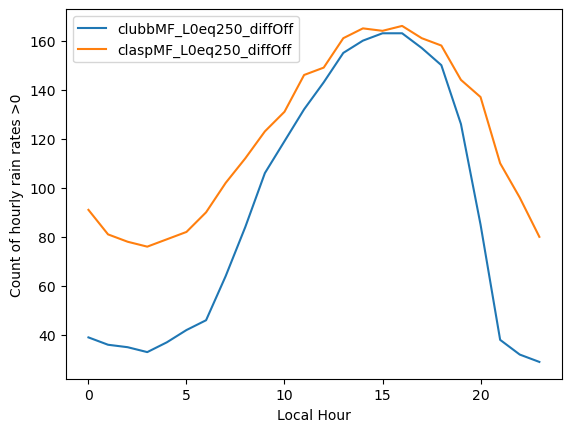

In [24]:
## small investigation of timing of PRECC...
precc = scamDS_h0_L250['PRECC'].resample(time='1H').mean()
countRainByHour = precc.where(precc>0.0).groupby('time.hour').count()
# Plot rain events that occur in each hour
plt.plot(countRainByHour.isel(case=0).values, label=countRainByHour.case.values[0])
plt.plot(countRainByHour.isel(case=1).values, label=countRainByHour.case.values[1])
plt.xlabel('Local Hour')
plt.legend()
plt.ylabel('Count of hourly rain rates >0')

array([<AxesSubplot:title={'center':'LHFLX'}, xlabel='Local Time (hour)', ylabel='W/m2'>,
       <AxesSubplot:title={'center':'LHFLX'}, xlabel='Local Time (hour)', ylabel='W/m2'>],
      dtype=object)

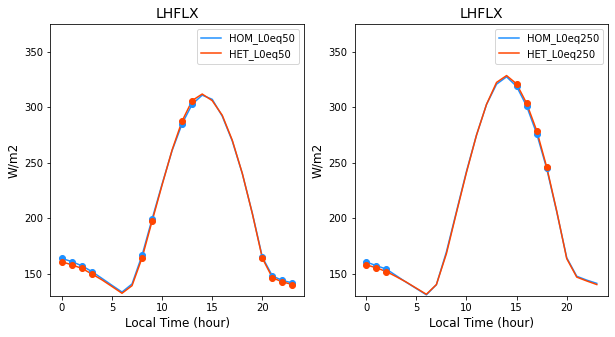

In [ ]:
varPlot     = 'LHFLX'
yMax        = 375
yMin        = 130
unitsString = scamDS_h0_L50[varPlot].units
setYlims    = True
valMult     = 1

plotDiurnalCycle(scamDS_h0_L50, scamDS_h0_L250,
                 varPlot, valMult, unitsString,
                 setYlims, yMin, yMax)


In [ ]:
varPlot     = 'LHFLX'
yMax        = 325
yMin        = 90
unitsString = scamDS_h0_L250[varPlot].units
setYlims    = True
valMult     = 1

plotDiurnalCycle(scamDS_h0_L50, scamDS_h0_L250,
                 varPlot, valMult, unitsString,
                 setYlims, yMin, yMax)


array([<AxesSubplot:title={'center':'SHFLX'}, xlabel='Local Time (hour)', ylabel='W/m2'>,
       <AxesSubplot:title={'center':'SHFLX'}, xlabel='Local Time (hour)', ylabel='W/m2'>],
      dtype=object)

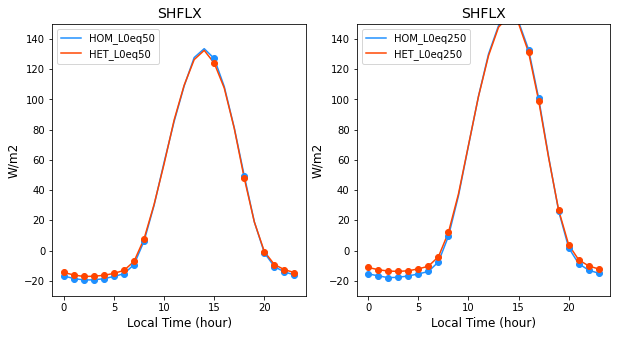

In [ ]:
varPlot     = 'SHFLX'
yMax        = 150
yMin        = -30
unitsString = scamDS_h0_L50[varPlot].units
setYlims    = True
valMult     = 1

plotDiurnalCycle(scamDS_h0_L50, scamDS_h0_L250,
                 varPlot, valMult, unitsString,
                 setYlims, yMin, yMax)


In [ ]:
varPlot     = 'SHFLX'
yMax        = 180
yMin        = -30
unitsString = scamDS_h0_L250[varPlot].units
setYlims    = True
valMult     = 1

plotDiurnalCycle(scamDS_h0_L50, scamDS_h0_L250,
                 varPlot, valMult, unitsString,
                 setYlims, yMin, yMax)


array([<AxesSubplot:title={'center':'SWCF'}, xlabel='Local Time (hour)', ylabel='W/m2'>,
       <AxesSubplot:title={'center':'SWCF'}, xlabel='Local Time (hour)', ylabel='W/m2'>],
      dtype=object)

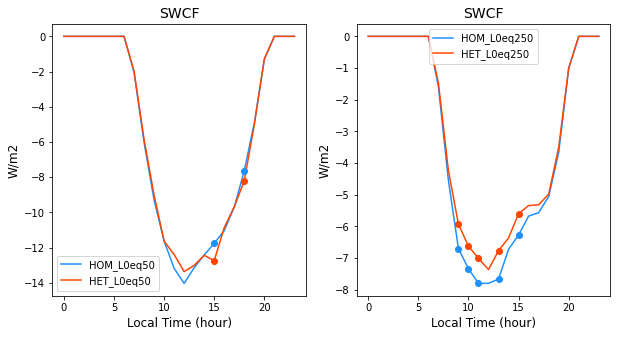

In [ ]:
varPlot     = 'SWCF'
yMax        = 150
yMin        = -30
unitsString = scamDS_h0_L50[varPlot].units
setYlims    = False
valMult     = 1

plotDiurnalCycle(scamDS_h0_L50, scamDS_h0_L250,
                 varPlot, valMult, unitsString,
                 setYlims, yMin, yMax)


In [ ]:
varPlot     = 'SWCF'
yMax        = 150
yMin        = -30
unitsString = scamDS_h0_L250[varPlot].units
setYlims    = False
valMult     = 1

plotDiurnalCycle(scamDS_h0_L50, scamDS_h0_L250,
                 varPlot, valMult, unitsString,
                 setYlims, yMin, yMax)


array([<AxesSubplot:title={'center':'LWCF'}, xlabel='Local Time (hour)', ylabel='W/m2'>,
       <AxesSubplot:title={'center':'LWCF'}, xlabel='Local Time (hour)', ylabel='W/m2'>],
      dtype=object)

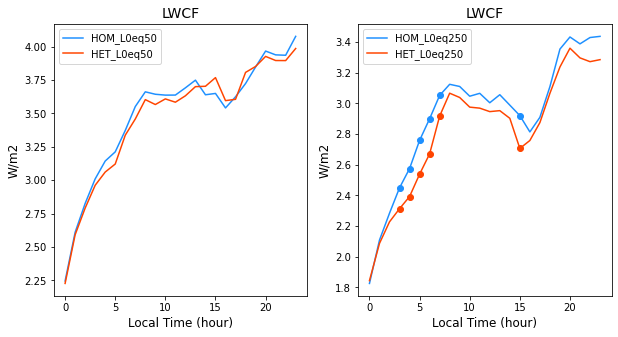

In [ ]:
varPlot     = 'LWCF'
yMax        = 150
yMin        = -30
unitsString = scamDS_h0_L50[varPlot].units
setYlims    = False
valMult     = 1

plotDiurnalCycle(scamDS_h0_L50, scamDS_h0_L250,
                 varPlot, valMult, unitsString,
                 setYlims, yMin, yMax)


In [ ]:
varPlot     = 'LWCF'
yMax        = 150
yMin        = -30
unitsString = scamDS_h0_L250[varPlot].units
setYlims    = False
valMult     = 1

plotDiurnalCycle(scamDS_h0_L50, scamDS_h0_L250,
                 varPlot, valMult, unitsString,
                 setYlims, yMin, yMax)


array([<AxesSubplot:title={'center':'U10'}, xlabel='Local Time (hour)', ylabel='m/s'>,
       <AxesSubplot:title={'center':'U10'}, xlabel='Local Time (hour)', ylabel='m/s'>],
      dtype=object)

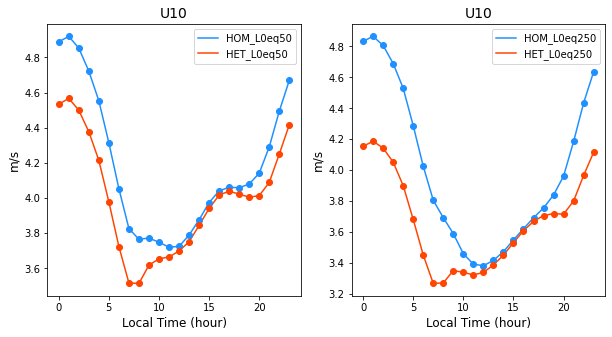

In [ ]:
varPlot     = 'U10'
yMax        = 150
yMin        = -30
unitsString = scamDS_h0_L50[varPlot].units
setYlims    = False
valMult     = 1

plotDiurnalCycle(scamDS_h0_L50, scamDS_h0_L250,
                 varPlot, valMult, unitsString,
                 setYlims, yMin, yMax)


In [ ]:
varPlot     = 'U10'
yMax        = 150
yMin        = -30
unitsString = scamDS_h0_L250[varPlot].units
setYlims    = False
valMult     = 1

plotDiurnalCycle(scamDS_h0_L50, scamDS_h0_L250,
                 varPlot, valMult, unitsString,
                 setYlims, yMin, yMax)


## Isolate days that fall into certain classes

In [ ]:
## Use something similar to Meng's definition of clear/cloudy/rain days 

def getDayClass_DS(DSuse, DSuse_h2): 

    q_var = 'CLDLIQ_interp'
    q_ctl  = DSuse.isel(case=0)[q_var]
    q_test = DSuse.isel(case=1)[q_var]

    p_var = 'PRECT'
    p_ctl  = DSuse.isel(case=0)[p_var]
    p_test = DSuse.isel(case=1)[p_var]

    minHr = 6
    maxHr = 18

    # minHr = 0
    # maxHr = 7

    selHours = np.where( (DSuse['time.hour'].values>=minHr) & (DSuse['time.hour'].values<=maxHr) )[0]

    levSel   = np.where((DSuse.levInterp.values>600))[0]

    # Daily mean rain rate in right units:
    p_dailyMean = p_ctl.isel(time=selHours).resample(time='1D').mean(dim='time')*1e3*86400
    p_dailyMean_test = p_test.isel(time=selHours).resample(time='1D').mean(dim='time')*1e3*86400

    # Select lower levels
    q_dailyMax      = q_ctl.isel(levInterp=levSel, time=selHours).resample(time='1D').mean(dim='time').max(dim='levInterp')
    q_dailyMax_test = q_test.isel(levInterp=levSel, time=selHours).resample(time='1D').mean(dim='time').max(dim='levInterp')

    # Consistently use percentiles across cases, though numbers will vary
    # plim = np.nanpercentile(p_dailyMean, 60)  #mm/day
    # qlim = np.nanpercentile(q_dailyMax,  60) #kg/kg
    plim = np.nanpercentile(p_dailyMean, 75)  #mm/day
    qlim = np.nanpercentile(q_dailyMax,  50) #kg/kg

    # Define days using their indices...
    iRainDay  = np.where(  (p_dailyMean >= plim) & (p_dailyMean_test >= plim) )[0]

    iCloudDay = np.where( (p_dailyMean < plim) & (q_dailyMax>=qlim) & 
                          (p_dailyMean_test < plim) & (q_dailyMax_test>=qlim))[0]

    iClearDay = np.where( (p_dailyMean < plim) & (q_dailyMax<qlim) & 
                          (p_dailyMean_test < plim) & (q_dailyMax_test<qlim))[0]

    print('Number of rainy  days: ', len(iRainDay))
    print('Number of cloudy days: ', len(iCloudDay))
    print('Number of clear  days: ', len(iClearDay))
    
    # - - - - - - - - - - - - - - - - 
    # Also get those days in the full DS 
    # - - - - - - - - - - - - - - - - 

    iclear_times  = []
    icloudy_times = []
    irainy_times  = []

    for iT in range(len(p_dailyMean.time.values)):
        thisDay = p_dailyMean.isel(time=iT)
        iTimes = np.where((DSuse['time.year'].values==thisDay['time.year'].values) & 
                          (DSuse['time.month'].values==thisDay['time.month'].values) &
                          (DSuse['time.day'].values==thisDay['time.day'].values))[0]

        if iT in iClearDay:
            iclear_times = np.append(iclear_times, iTimes) 
        elif iT in iCloudDay:
            icloudy_times = np.append(icloudy_times, iTimes) 
        elif iT in iRainDay: 
            irainy_times = np.append(irainy_times, iTimes) 
        #else:
            # print('Day not defined!! iT = ',iT)

    clearDays_DS  = DSuse.isel(time=iclear_times.astype(int)).resample(time='1H').mean(dim='time').groupby('time.hour').mean(dim='time')
    cloudyDays_DS = DSuse.isel(time=icloudy_times.astype(int)).resample(time='1H').mean(dim='time').groupby('time.hour').mean(dim='time')
    rainyDays_DS  = DSuse.isel(time=irainy_times.astype(int)).resample(time='1H').mean(dim='time').groupby('time.hour').mean(dim='time')
    
    clearDays_DS_h2  = DSuse_h2.isel(time=iclear_times.astype(int)).resample(time='1H').mean(dim='time').groupby('time.hour').mean(dim='time')
    cloudyDays_DS_h2 = DSuse_h2.isel(time=icloudy_times.astype(int)).resample(time='1H').mean(dim='time').groupby('time.hour').mean(dim='time')
    rainyDays_DS_h2  = DSuse_h2.isel(time=irainy_times.astype(int)).resample(time='1H').mean(dim='time').groupby('time.hour').mean(dim='time')

    clear_rawH2  = DSuse_h2.isel(time=iclear_times.astype(int)).resample(time='1H').mean(dim='time')
    cloudy_rawH2 = DSuse_h2.isel(time=icloudy_times.astype(int)).resample(time='1H').mean(dim='time')
    rainy_rawH2  = DSuse_h2.isel(time=irainy_times.astype(int)).resample(time='1H').mean(dim='time')
    
    return clearDays_DS,cloudyDays_DS,rainyDays_DS, clearDays_DS_h2,cloudyDays_DS_h2,rainyDays_DS_h2, clear_rawH2,cloudy_rawH2,rainy_rawH2

In [ ]:
clear_h0_L50,cloudy_h0_L50,rainy_h0_L50, clear_h2_L50,cloudy_h2_L50,rainy_h2_L50, clearRaw_L50,cloudyRaw_L50,rainyRaw_L50 = getDayClass_DS(scamDS_h0_L50, scamDS_h2_L50)
print()
clear_h0_L250,cloudy_h0_L250,rainy_h0_L250, clear_h2_L250,cloudy_h2_L250,rainy_h2_L250, clearRaw_L250,cloudyRaw_L250,rainyRaw_L250 = getDayClass_DS(scamDS_h0_L250, scamDS_h2_L250)



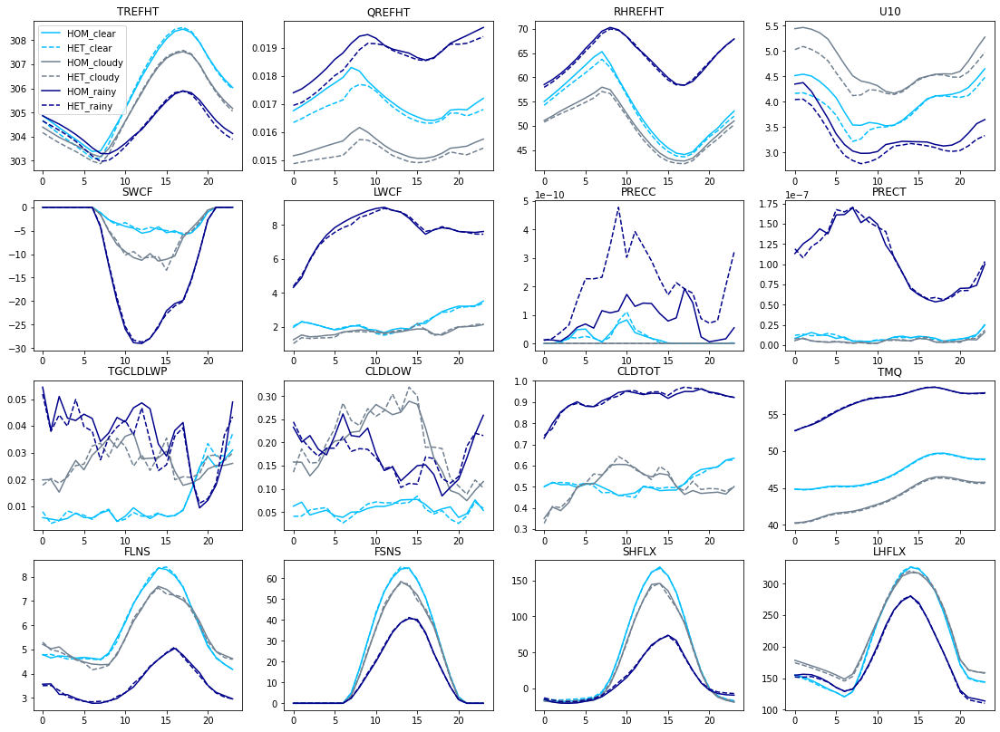

In [11]:
# ## L0  = 50 m

# # ----- 2D CAM plots ----- #
# pltVars = ['TREFHT','QREFHT','RHREFHT',
#            'U10','SWCF','LWCF','PRECC',
#            'PRECT','TGCLDLWP',
#           'CLDLOW','CLDTOT','TMQ', 
#           'FLNS','FSNS','SHFLX','LHFLX']  

# fig,axs = plt.subplots(4,4, figsize=(19,14))
# axs     = axs.ravel()

# for iVar in range(len(pltVars)): 
#     axs[iVar].plot(clear_h0_L50['hour'].values, clear_h0_L50[pltVars[iVar]].isel(case=0), 
#                    color='deepskyblue', label='HOM_clear' )
#     axs[iVar].plot(clear_h0_L50['hour'].values, clear_h0_L50[pltVars[iVar]].isel(case=1), 
#                    '--', color='deepskyblue', label='HET_clear' )
    
#     axs[iVar].plot(cloudy_h0_L50['hour'].values, cloudy_h0_L50[pltVars[iVar]].isel(case=0), 
#                    color='slategrey', label='HOM_cloudy' )
#     axs[iVar].plot(cloudy_h0_L50['hour'].values, cloudy_h0_L50[pltVars[iVar]].isel(case=1), 
#                    '--', color='slategrey', label='HET_cloudy' )
        
#     axs[iVar].plot(rainy_h0_L50['hour'].values, rainy_h0_L50[pltVars[iVar]].isel(case=0), 
#                    color='darkblue', label='HOM_rainy' )
#     axs[iVar].plot(rainy_h0_L50['hour'].values, rainy_h0_L50[pltVars[iVar]].isel(case=1), 
#                    '--', color='darkblue', label='HET_rainy' )
    
#     if pltVars[iVar]=='TREFHT':    
#         axs[iVar].legend()
#     axs[iVar].set_title(pltVars[iVar])


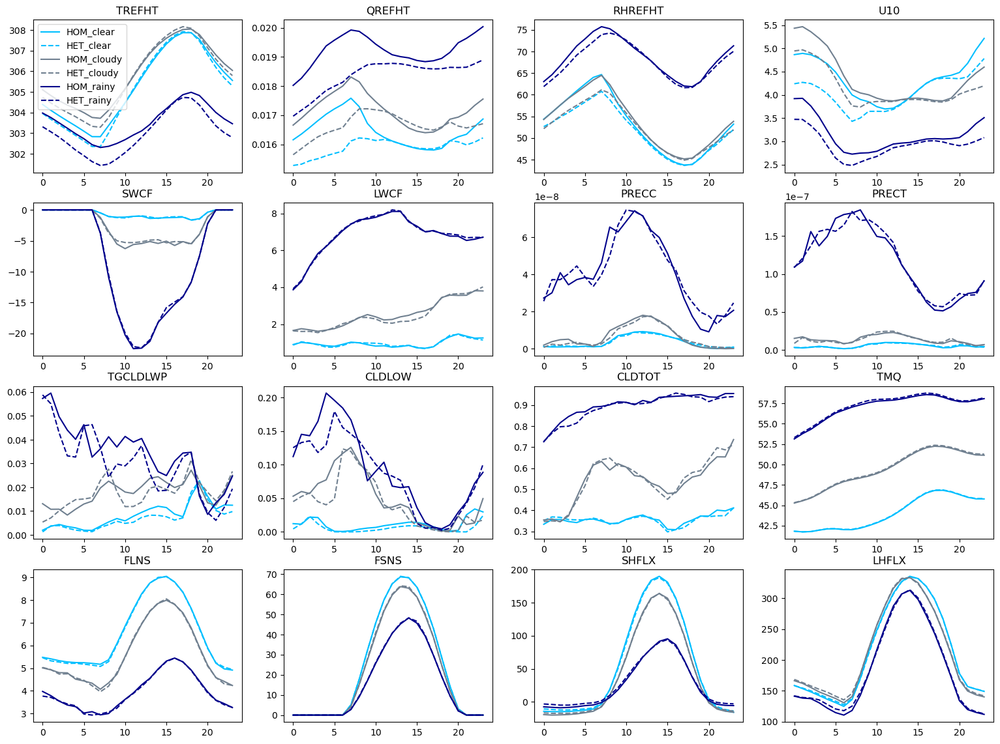

In [68]:
## L0  = 250 m

# ----- 2D CAM plots ----- #
pltVars = ['TREFHT','QREFHT','RHREFHT',
           'U10','SWCF','LWCF','PRECC',
           'PRECT','TGCLDLWP',
          'CLDLOW','CLDTOT','TMQ', 
          'FLNS','FSNS','SHFLX','LHFLX']  

fig,axs = plt.subplots(4,4, figsize=(19,14))
axs     = axs.ravel()

for iVar in range(len(pltVars)): 
    axs[iVar].plot(clear_h0_L250['hour'].values, clear_h0_L250[pltVars[iVar]].isel(case=0), 
                   color='deepskyblue', label='HOM_clear' )
    axs[iVar].plot(clear_h0_L250['hour'].values, clear_h0_L250[pltVars[iVar]].isel(case=1), 
                   '--', color='deepskyblue', label='HET_clear' )
    
    axs[iVar].plot(cloudy_h0_L250['hour'].values, cloudy_h0_L250[pltVars[iVar]].isel(case=0), 
                   color='slategrey', label='HOM_cloudy' )
    axs[iVar].plot(cloudy_h0_L250['hour'].values, cloudy_h0_L250[pltVars[iVar]].isel(case=1), 
                   '--', color='slategrey', label='HET_cloudy' )
        
    axs[iVar].plot(rainy_h0_L250['hour'].values, rainy_h0_L250[pltVars[iVar]].isel(case=0), 
                   color='darkblue', label='HOM_rainy' )
    axs[iVar].plot(rainy_h0_L250['hour'].values, rainy_h0_L250[pltVars[iVar]].isel(case=1), 
                   '--', color='darkblue', label='HET_rainy' )
    
    if pltVars[iVar]=='TREFHT':    
        axs[iVar].legend()
    axs[iVar].set_title(pltVars[iVar])


Clear days: 
Max increase @ hr 14 = 0.099121
Max decrease @ hr 6 = -0.480927
Cloudy days: 
Max increase @ hr 16 = 0.147614
Max decrease @ hr 7 = -0.431976
Rainy days: 
Max increase @ hr 16 = -0.023376
Max decrease @ hr 7 = -0.871552


Text(0, 0.5, 'K')

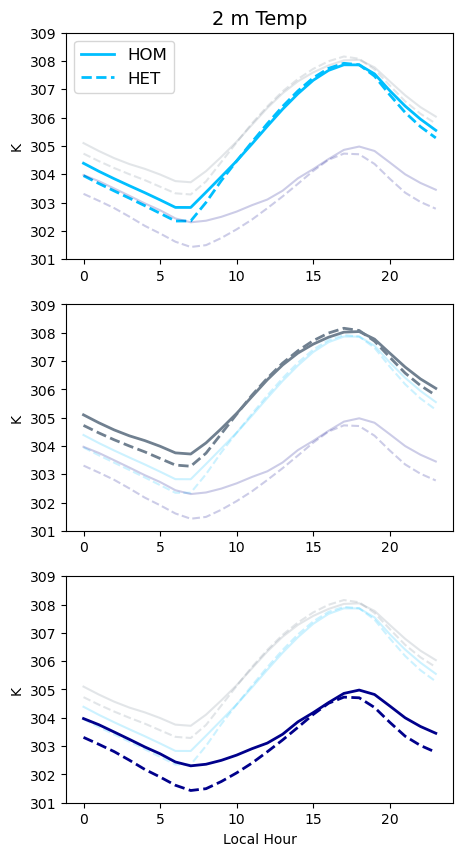

In [27]:
fig,axs = plt.subplots(3,1, figsize=(5,10))
axs = axs.ravel() 

varSel = 'TREFHT'
plotLabel = '2 m Temp'
ymin = 301
ymax = 309
unitsStr = 'K'

# varSel = 'CLDTOT'
# plotLabel = 'Cloud Fraction'
# ymin = 0.2
# ymax = 1
# unitsStr = 'fraction'

# varSel = 'QREFHT'
# plotLabel = '2 m Humidity'
# ymin = 0.014
# ymax = 0.020
# unitsStr = scamDS_h0_L50[varSel].units

# varSel = 'TGCLDLWP'
# plotLabel = 'Grid Cloud LWP'
# ymin = 0.00
# ymax = 0.075
# unitsStr = scamDS_h0_L50[varSel].units

# varSel = 'PRECT'
# plotLabel = 'Precipitation'
# ymin = 0.00
# ymax = 0.05e-5
# unitsStr = scamDS_h0_L50[varSel].units

axs[0].plot(clear_h0_L250['hour'].values, clear_h0_L250[varSel].isel(case=0), 
               color='deepskyblue', linewidth=2, label='HOM' )
axs[0].plot(clear_h0_L250['hour'].values, clear_h0_L250[varSel].isel(case=1), 
               '--', color='deepskyblue', linewidth=2, label='HET' )
axs[0].legend(fontsize=12)
axs[0].plot(cloudy_h0_L250['hour'].values, cloudy_h0_L250[varSel].isel(case=0), 
               color='slategrey', alpha = 0.2)
axs[0].plot(cloudy_h0_L250['hour'].values, cloudy_h0_L250[varSel].isel(case=1), 
               '--', color='slategrey', alpha = 0.2)
axs[0].plot(rainy_h0_L250['hour'].values, rainy_h0_L250[varSel].isel(case=0), 
               color='darkblue', alpha = 0.2 )
axs[0].plot(rainy_h0_L250['hour'].values, rainy_h0_L250[varSel].isel(case=1), 
               '--', color='darkblue', alpha = 0.2 )
diff0 = clear_h0_L250[varSel].isel(case=1) - clear_h0_L250[varSel].isel(case=0)
print('Clear days: \nMax increase @ hr %i = %f\nMax decrease @ hr %i = %f'  % 
      (np.where(diff0 ==np.nanmax(diff0))[0], np.nanmax(diff0), np.where(diff0 ==np.nanmin(diff0))[0], np.nanmin(diff0)) ) 


axs[1].plot(clear_h0_L250['hour'].values, clear_h0_L250[varSel].isel(case=0), 
               color='deepskyblue', alpha = 0.2 )
axs[1].plot(clear_h0_L250['hour'].values, clear_h0_L250[varSel].isel(case=1), 
               '--', color='deepskyblue',alpha = 0.2 )
axs[1].plot(cloudy_h0_L250['hour'].values, cloudy_h0_L250[varSel].isel(case=0), 
               color='slategrey', linewidth=2, alpha = 1)
axs[1].plot(cloudy_h0_L250['hour'].values, cloudy_h0_L250[varSel].isel(case=1), 
               '--', color='slategrey',linewidth=2, alpha =1)    
axs[1].plot(rainy_h0_L250['hour'].values, rainy_h0_L250[varSel].isel(case=0), 
               color='darkblue', alpha = 0.2 )
axs[1].plot(rainy_h0_L250['hour'].values, rainy_h0_L250[varSel].isel(case=1), 
               '--', color='darkblue', alpha = 0.2 )
diff0 = cloudy_h0_L250[varSel].isel(case=1) - cloudy_h0_L250[varSel].isel(case=0)
print('Cloudy days: \nMax increase @ hr %i = %f\nMax decrease @ hr %i = %f'  % 
      (np.where(diff0 ==np.nanmax(diff0))[0], np.nanmax(diff0), np.where(diff0 ==np.nanmin(diff0))[0], np.nanmin(diff0)) ) 

      
axs[2].plot(clear_h0_L250['hour'].values, clear_h0_L250[varSel].isel(case=0), 
               color='deepskyblue', alpha = 0.2 )
axs[2].plot(clear_h0_L250['hour'].values, clear_h0_L250[varSel].isel(case=1), 
               '--', color='deepskyblue',alpha = 0.2 )
axs[2].plot(cloudy_h0_L250['hour'].values, cloudy_h0_L250[varSel].isel(case=0), 
               color='slategrey', alpha = 0.2)
axs[2].plot(cloudy_h0_L250['hour'].values, cloudy_h0_L250[varSel].isel(case=1), 
               '--', color='slategrey', alpha =0.2)
axs[2].plot(rainy_h0_L250['hour'].values, rainy_h0_L250[varSel].isel(case=0), 
               color='darkblue', linewidth=2, alpha = 1 )
axs[2].plot(rainy_h0_L250['hour'].values, rainy_h0_L250[varSel].isel(case=1), 
               '--', color='darkblue', linewidth=2, alpha = 1 )
diff0 = rainy_h0_L250[varSel].isel(case=1) - rainy_h0_L250[varSel].isel(case=0)
print('Rainy days: \nMax increase @ hr %i = %f\nMax decrease @ hr %i = %f'  % 
      (np.where(diff0 ==np.nanmax(diff0))[0], np.nanmax(diff0), np.where(diff0 ==np.nanmin(diff0))[0], np.nanmin(diff0)) ) 


axs[0].set_title(plotLabel, fontsize=14)
axs[0].set_ylim([ymin, ymax])
axs[1].set_ylim([ymin, ymax])
axs[2].set_ylim([ymin, ymax])

axs[2].set_xlabel('Local Hour') 
axs[0].set_ylabel(unitsStr)
axs[1].set_ylabel(unitsStr)
axs[2].set_ylabel(unitsStr)

Clear days: 
Max increase @ hr 13 = 0.268062
Max decrease @ hr 23 = -0.111107
Cloudy days: 
Max increase @ hr 10 = 0.868618
Max decrease @ hr 15 = -0.618618
Rainy days: 
Max increase @ hr 15 = 0.834652
Max decrease @ hr 3 = -0.094588


Text(0, 0.5, 'W/m2')

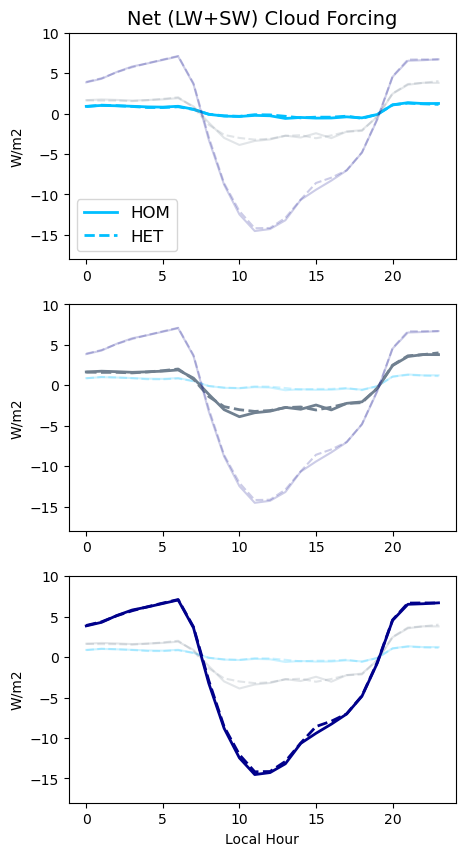

In [29]:
clear_h0_L250['netCldForcing'] = clear_h0_L250['LWCF'] + clear_h0_L250['SWCF']
cloudy_h0_L250['netCldForcing'] = cloudy_h0_L250['LWCF'] + cloudy_h0_L250['SWCF']
rainy_h0_L250['netCldForcing'] = rainy_h0_L250['LWCF'] + rainy_h0_L250['SWCF']


fig,axs = plt.subplots(3,1, figsize=(5,10))
axs = axs.ravel() 

varSel = 'netCldForcing'
plotLabel = 'Net (LW+SW) Cloud Forcing'
ymin = -18
ymax = 10
unitsStr = scamDS_h0_L250['LWCF'].units

axs[0].plot(clear_h0_L250['hour'].values, clear_h0_L250[varSel].isel(case=0), 
               color='deepskyblue', linewidth=2, label='HOM' )
axs[0].plot(clear_h0_L250['hour'].values, clear_h0_L250[varSel].isel(case=1), 
               '--', color='deepskyblue', linewidth=2, label='HET' )
axs[0].legend(fontsize=12)
axs[0].plot(cloudy_h0_L250['hour'].values, cloudy_h0_L250[varSel].isel(case=0), 
               color='slategrey', alpha = 0.2)
axs[0].plot(cloudy_h0_L250['hour'].values, cloudy_h0_L250[varSel].isel(case=1), 
               '--', color='slategrey', alpha = 0.2)
axs[0].plot(rainy_h0_L250['hour'].values, rainy_h0_L250[varSel].isel(case=0), 
               color='darkblue', alpha = 0.2 )
axs[0].plot(rainy_h0_L250['hour'].values, rainy_h0_L250[varSel].isel(case=1), 
               '--', color='darkblue', alpha = 0.2 )
diff0 = clear_h0_L250[varSel].isel(case=1) - clear_h0_L250[varSel].isel(case=0)
print('Clear days: \nMax increase @ hr %i = %f\nMax decrease @ hr %i = %f'  % 
      (np.where(diff0 ==np.nanmax(diff0))[0], np.nanmax(diff0), np.where(diff0 ==np.nanmin(diff0))[0], np.nanmin(diff0)) ) 


axs[1].plot(clear_h0_L250['hour'].values, clear_h0_L250[varSel].isel(case=0), 
               color='deepskyblue', alpha = 0.2 )
axs[1].plot(clear_h0_L250['hour'].values, clear_h0_L250[varSel].isel(case=1), 
               '--', color='deepskyblue',alpha = 0.2 )
axs[1].plot(cloudy_h0_L250['hour'].values, cloudy_h0_L250[varSel].isel(case=0), 
               color='slategrey', linewidth=2, alpha = 1)
axs[1].plot(cloudy_h0_L250['hour'].values, cloudy_h0_L250[varSel].isel(case=1), 
               '--', color='slategrey',linewidth=2, alpha =1)    
axs[1].plot(rainy_h0_L250['hour'].values, rainy_h0_L250[varSel].isel(case=0), 
               color='darkblue', alpha = 0.2 )
axs[1].plot(rainy_h0_L250['hour'].values, rainy_h0_L250[varSel].isel(case=1), 
               '--', color='darkblue', alpha = 0.2 )
diff0 = cloudy_h0_L250[varSel].isel(case=1) - cloudy_h0_L250[varSel].isel(case=0)
print('Cloudy days: \nMax increase @ hr %i = %f\nMax decrease @ hr %i = %f'  % 
      (np.where(diff0 ==np.nanmax(diff0))[0], np.nanmax(diff0), np.where(diff0 ==np.nanmin(diff0))[0], np.nanmin(diff0)) ) 

      
axs[2].plot(clear_h0_L250['hour'].values, clear_h0_L250[varSel].isel(case=0), 
               color='deepskyblue', alpha = 0.2 )
axs[2].plot(clear_h0_L250['hour'].values, clear_h0_L250[varSel].isel(case=1), 
               '--', color='deepskyblue',alpha = 0.2 )
axs[2].plot(cloudy_h0_L250['hour'].values, cloudy_h0_L250[varSel].isel(case=0), 
               color='slategrey', alpha = 0.2)
axs[2].plot(cloudy_h0_L250['hour'].values, cloudy_h0_L250[varSel].isel(case=1), 
               '--', color='slategrey', alpha =0.2)
axs[2].plot(rainy_h0_L250['hour'].values, rainy_h0_L250[varSel].isel(case=0), 
               color='darkblue', linewidth=2, alpha = 1 )
axs[2].plot(rainy_h0_L250['hour'].values, rainy_h0_L250[varSel].isel(case=1), 
               '--', color='darkblue', linewidth=2, alpha = 1 )
diff0 = rainy_h0_L250[varSel].isel(case=1) - rainy_h0_L250[varSel].isel(case=0)
print('Rainy days: \nMax increase @ hr %i = %f\nMax decrease @ hr %i = %f'  % 
      (np.where(diff0 ==np.nanmax(diff0))[0], np.nanmax(diff0), np.where(diff0 ==np.nanmin(diff0))[0], np.nanmin(diff0)) ) 


axs[0].set_title(plotLabel, fontsize=14)
axs[0].set_ylim([ymin, ymax])
axs[1].set_ylim([ymin, ymax])
axs[2].set_ylim([ymin, ymax])

axs[2].set_xlabel('Local Hour') 
axs[0].set_ylabel(unitsStr)
axs[1].set_ylabel(unitsStr)
axs[2].set_ylabel(unitsStr)

Clear days: 
Max increase @ hr 13 = 0.264702
Max decrease @ hr 10 = -0.170990
Cloudy days: 
Max increase @ hr 10 = 1.032047
Max decrease @ hr 8 = -0.377436
Rainy days: 
Max increase @ hr 15 = 0.875225
Max decrease @ hr 0 = -0.205180


Text(0, 0.5, 'W/m2')

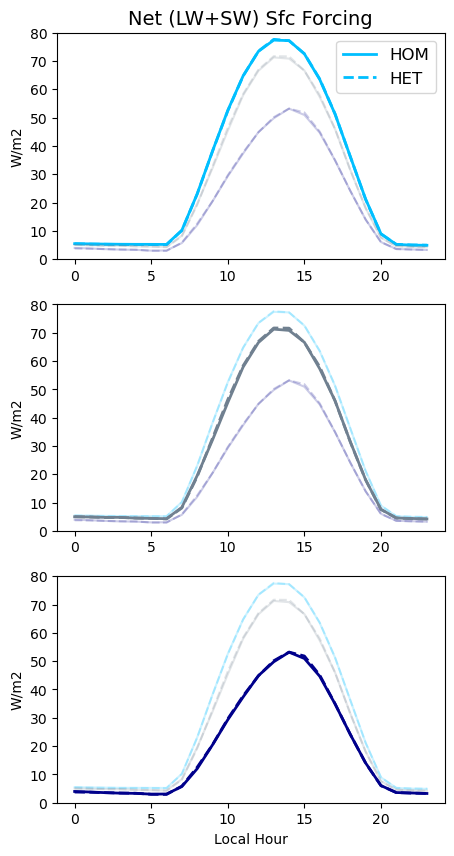

In [30]:
clear_h0_L250['netSfcForcing'] = clear_h0_L250['FLNS'] + clear_h0_L250['FSNS']
cloudy_h0_L250['netSfcForcing'] = cloudy_h0_L250['FLNS'] + cloudy_h0_L250['FSNS']
rainy_h0_L250['netSfcForcing'] = rainy_h0_L250['FLNS'] + rainy_h0_L250['FSNS']


fig,axs = plt.subplots(3,1, figsize=(5,10))
axs = axs.ravel() 

varSel = 'netSfcForcing'
plotLabel = 'Net (LW+SW) Sfc Forcing'
ymin = 0
ymax = 80
unitsStr = scamDS_h0_L250['FLNS'].units

axs[0].plot(clear_h0_L250['hour'].values, clear_h0_L250[varSel].isel(case=0), 
               color='deepskyblue', linewidth=2, label='HOM' )
axs[0].plot(clear_h0_L250['hour'].values, clear_h0_L250[varSel].isel(case=1), 
               '--', color='deepskyblue', linewidth=2, label='HET' )
axs[0].legend(fontsize=12)
axs[0].plot(cloudy_h0_L250['hour'].values, cloudy_h0_L250[varSel].isel(case=0), 
               color='slategrey', alpha = 0.2)
axs[0].plot(cloudy_h0_L250['hour'].values, cloudy_h0_L250[varSel].isel(case=1), 
               '--', color='slategrey', alpha = 0.2)
axs[0].plot(rainy_h0_L250['hour'].values, rainy_h0_L250[varSel].isel(case=0), 
               color='darkblue', alpha = 0.2 )
axs[0].plot(rainy_h0_L250['hour'].values, rainy_h0_L250[varSel].isel(case=1), 
               '--', color='darkblue', alpha = 0.2 )
diff0 = clear_h0_L250[varSel].isel(case=1) - clear_h0_L250[varSel].isel(case=0)
print('Clear days: \nMax increase @ hr %i = %f\nMax decrease @ hr %i = %f'  % 
      (np.where(diff0 ==np.nanmax(diff0))[0], np.nanmax(diff0), np.where(diff0 ==np.nanmin(diff0))[0], np.nanmin(diff0)) ) 


axs[1].plot(clear_h0_L250['hour'].values, clear_h0_L250[varSel].isel(case=0), 
               color='deepskyblue', alpha = 0.2 )
axs[1].plot(clear_h0_L250['hour'].values, clear_h0_L250[varSel].isel(case=1), 
               '--', color='deepskyblue',alpha = 0.2 )
axs[1].plot(cloudy_h0_L250['hour'].values, cloudy_h0_L250[varSel].isel(case=0), 
               color='slategrey', linewidth=2, alpha = 1)
axs[1].plot(cloudy_h0_L250['hour'].values, cloudy_h0_L250[varSel].isel(case=1), 
               '--', color='slategrey',linewidth=2, alpha =1)    
axs[1].plot(rainy_h0_L250['hour'].values, rainy_h0_L250[varSel].isel(case=0), 
               color='darkblue', alpha = 0.2 )
axs[1].plot(rainy_h0_L250['hour'].values, rainy_h0_L250[varSel].isel(case=1), 
               '--', color='darkblue', alpha = 0.2 )
diff0 = cloudy_h0_L250[varSel].isel(case=1) - cloudy_h0_L250[varSel].isel(case=0)
print('Cloudy days: \nMax increase @ hr %i = %f\nMax decrease @ hr %i = %f'  % 
      (np.where(diff0 ==np.nanmax(diff0))[0], np.nanmax(diff0), np.where(diff0 ==np.nanmin(diff0))[0], np.nanmin(diff0)) ) 

      
axs[2].plot(clear_h0_L250['hour'].values, clear_h0_L250[varSel].isel(case=0), 
               color='deepskyblue', alpha = 0.2 )
axs[2].plot(clear_h0_L250['hour'].values, clear_h0_L250[varSel].isel(case=1), 
               '--', color='deepskyblue',alpha = 0.2 )
axs[2].plot(cloudy_h0_L250['hour'].values, cloudy_h0_L250[varSel].isel(case=0), 
               color='slategrey', alpha = 0.2)
axs[2].plot(cloudy_h0_L250['hour'].values, cloudy_h0_L250[varSel].isel(case=1), 
               '--', color='slategrey', alpha =0.2)
axs[2].plot(rainy_h0_L250['hour'].values, rainy_h0_L250[varSel].isel(case=0), 
               color='darkblue', linewidth=2, alpha = 1 )
axs[2].plot(rainy_h0_L250['hour'].values, rainy_h0_L250[varSel].isel(case=1), 
               '--', color='darkblue', linewidth=2, alpha = 1 )
diff0 = rainy_h0_L250[varSel].isel(case=1) - rainy_h0_L250[varSel].isel(case=0)
print('Rainy days: \nMax increase @ hr %i = %f\nMax decrease @ hr %i = %f'  % 
      (np.where(diff0 ==np.nanmax(diff0))[0], np.nanmax(diff0), np.where(diff0 ==np.nanmin(diff0))[0], np.nanmin(diff0)) ) 


axs[0].set_title(plotLabel, fontsize=14)
axs[0].set_ylim([ymin, ymax])
axs[1].set_ylim([ymin, ymax])
axs[2].set_ylim([ymin, ymax])

axs[2].set_xlabel('Local Hour') 
axs[0].set_ylabel(unitsStr)
axs[1].set_ylabel(unitsStr)
axs[2].set_ylabel(unitsStr)

Clear days: 
Max increase @ hr 4 = 2.679413
Max decrease @ hr 9 = -5.201202
Cloudy days: 
Max increase @ hr 13 = 9.726624
Max decrease @ hr 9 = -1.577927
Rainy days: 
Max increase @ hr 6 = 8.756500
Max decrease @ hr 14 = -1.674103


Text(0, 0.5, 'W/m2')

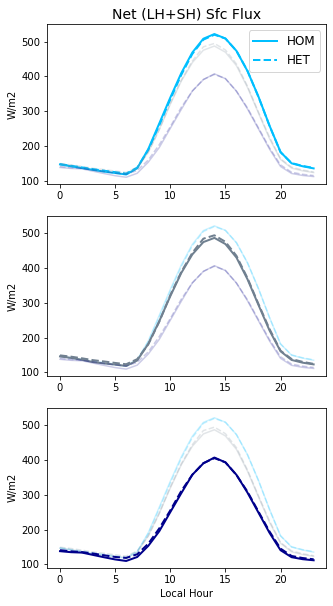

In [38]:
clear_h0_L250['netSfcFluxes'] = clear_h0_L250['LHFLX'] + clear_h0_L250['SHFLX']
cloudy_h0_L250['netSfcFluxes'] = cloudy_h0_L250['LHFLX'] + cloudy_h0_L250['SHFLX']
rainy_h0_L250['netSfcFluxes'] = rainy_h0_L250['LHFLX'] + rainy_h0_L250['SHFLX']


fig,axs = plt.subplots(3,1, figsize=(5,10))
axs = axs.ravel() 

varSel = 'netSfcFluxes'
plotLabel = 'Net (LH+SH) Sfc Flux'
ymin = 90
ymax = 550
unitsStr = scamDS_h0_L50['LHFLX'].units

axs[0].plot(clear_h0_L250['hour'].values, clear_h0_L250[varSel].isel(case=0), 
               color='deepskyblue', linewidth=2, label='HOM' )
axs[0].plot(clear_h0_L250['hour'].values, clear_h0_L250[varSel].isel(case=1), 
               '--', color='deepskyblue', linewidth=2, label='HET' )
axs[0].legend(fontsize=12)
axs[0].plot(cloudy_h0_L250['hour'].values, cloudy_h0_L250[varSel].isel(case=0), 
               color='slategrey', alpha = 0.2)
axs[0].plot(cloudy_h0_L250['hour'].values, cloudy_h0_L250[varSel].isel(case=1), 
               '--', color='slategrey', alpha = 0.2)
axs[0].plot(rainy_h0_L250['hour'].values, rainy_h0_L250[varSel].isel(case=0), 
               color='darkblue', alpha = 0.2 )
axs[0].plot(rainy_h0_L250['hour'].values, rainy_h0_L250[varSel].isel(case=1), 
               '--', color='darkblue', alpha = 0.2 )
diff0 = clear_h0_L250[varSel].isel(case=1) - clear_h0_L250[varSel].isel(case=0)
print('Clear days: \nMax increase @ hr %i = %f\nMax decrease @ hr %i = %f'  % 
      (np.where(diff0 ==np.nanmax(diff0))[0], np.nanmax(diff0), np.where(diff0 ==np.nanmin(diff0))[0], np.nanmin(diff0)) ) 


axs[1].plot(clear_h0_L250['hour'].values, clear_h0_L250[varSel].isel(case=0), 
               color='deepskyblue', alpha = 0.2 )
axs[1].plot(clear_h0_L250['hour'].values, clear_h0_L250[varSel].isel(case=1), 
               '--', color='deepskyblue',alpha = 0.2 )
axs[1].plot(cloudy_h0_L250['hour'].values, cloudy_h0_L250[varSel].isel(case=0), 
               color='slategrey', linewidth=2, alpha = 1)
axs[1].plot(cloudy_h0_L250['hour'].values, cloudy_h0_L250[varSel].isel(case=1), 
               '--', color='slategrey',linewidth=2, alpha =1)    
axs[1].plot(rainy_h0_L250['hour'].values, rainy_h0_L250[varSel].isel(case=0), 
               color='darkblue', alpha = 0.2 )
axs[1].plot(rainy_h0_L250['hour'].values, rainy_h0_L250[varSel].isel(case=1), 
               '--', color='darkblue', alpha = 0.2 )
diff0 = cloudy_h0_L250[varSel].isel(case=1) - cloudy_h0_L250[varSel].isel(case=0)
print('Cloudy days: \nMax increase @ hr %i = %f\nMax decrease @ hr %i = %f'  % 
      (np.where(diff0 ==np.nanmax(diff0))[0], np.nanmax(diff0), np.where(diff0 ==np.nanmin(diff0))[0], np.nanmin(diff0)) ) 

      
axs[2].plot(clear_h0_L250['hour'].values, clear_h0_L250[varSel].isel(case=0), 
               color='deepskyblue', alpha = 0.2 )
axs[2].plot(clear_h0_L250['hour'].values, clear_h0_L250[varSel].isel(case=1), 
               '--', color='deepskyblue',alpha = 0.2 )
axs[2].plot(cloudy_h0_L250['hour'].values, cloudy_h0_L250[varSel].isel(case=0), 
               color='slategrey', alpha = 0.2)
axs[2].plot(cloudy_h0_L250['hour'].values, cloudy_h0_L250[varSel].isel(case=1), 
               '--', color='slategrey', alpha =0.2)
axs[2].plot(rainy_h0_L250['hour'].values, rainy_h0_L250[varSel].isel(case=0), 
               color='darkblue', linewidth=2, alpha = 1 )
axs[2].plot(rainy_h0_L250['hour'].values, rainy_h0_L250[varSel].isel(case=1), 
               '--', color='darkblue', linewidth=2, alpha = 1 )
diff0 = rainy_h0_L250[varSel].isel(case=1) - rainy_h0_L250[varSel].isel(case=0)
print('Rainy days: \nMax increase @ hr %i = %f\nMax decrease @ hr %i = %f'  % 
      (np.where(diff0 ==np.nanmax(diff0))[0], np.nanmax(diff0), np.where(diff0 ==np.nanmin(diff0))[0], np.nanmin(diff0)) ) 


axs[0].set_title(plotLabel, fontsize=14)
axs[0].set_ylim([ymin, ymax])
axs[1].set_ylim([ymin, ymax])
axs[2].set_ylim([ymin, ymax])

axs[2].set_xlabel('Local Hour') 
axs[0].set_ylabel(unitsStr)
axs[1].set_ylabel(unitsStr)
axs[2].set_ylabel(unitsStr)

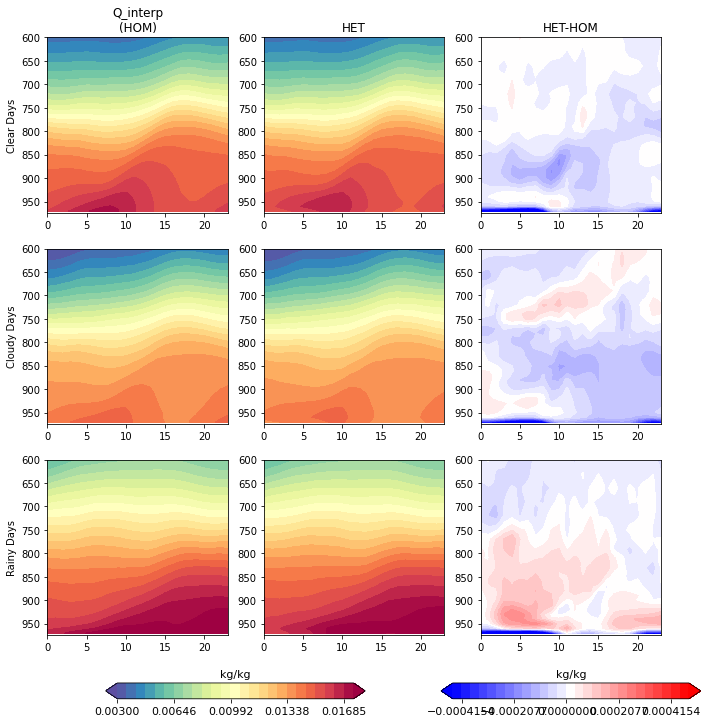

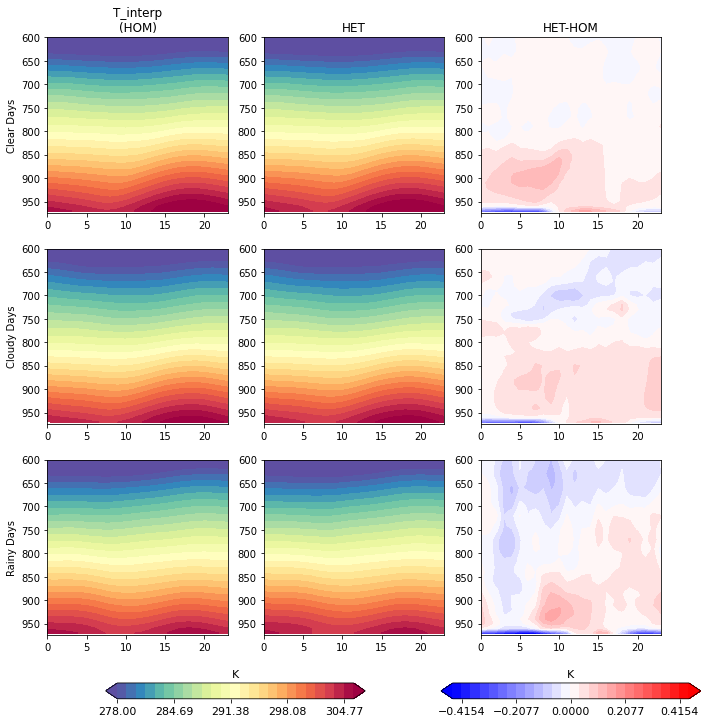

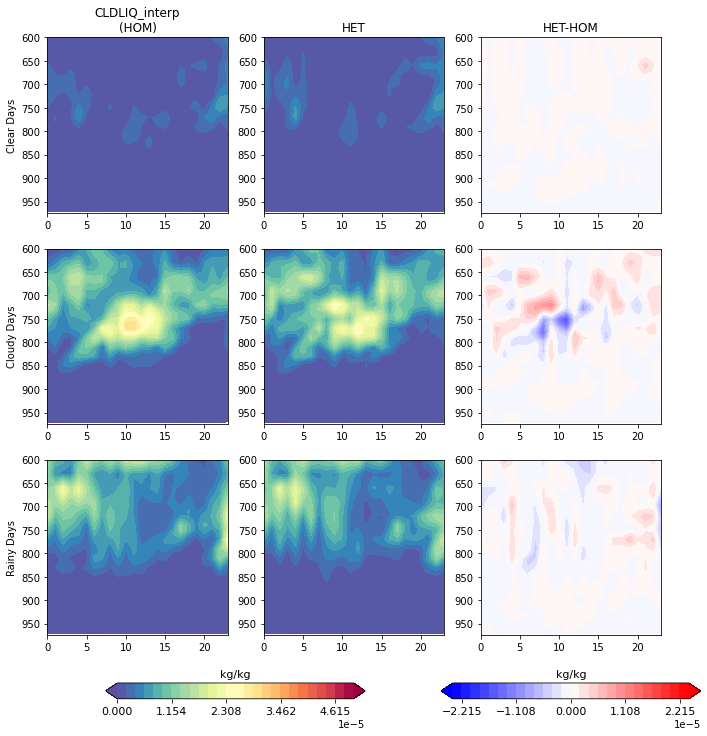

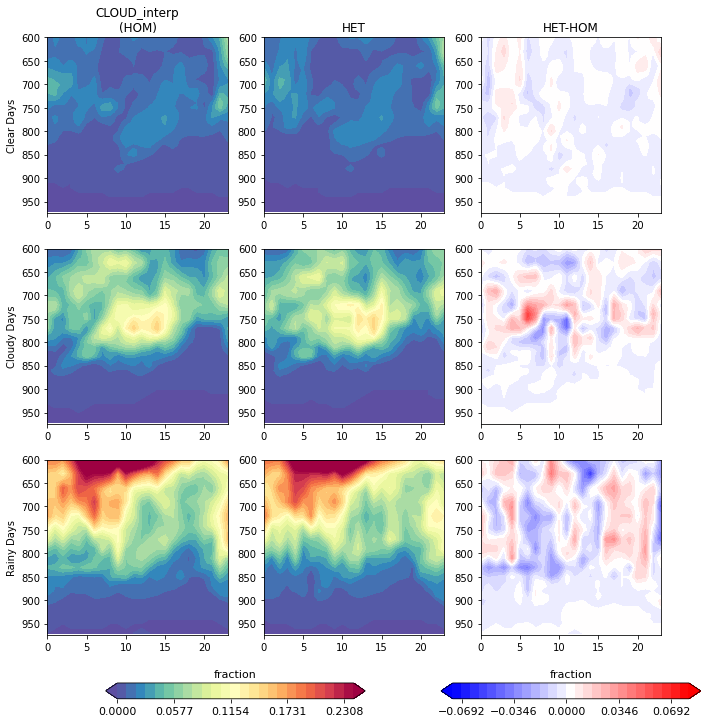

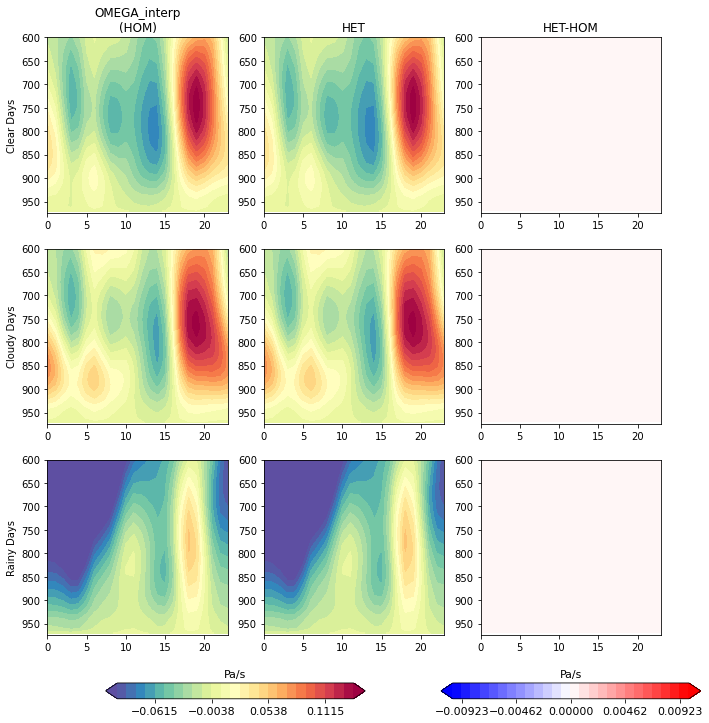

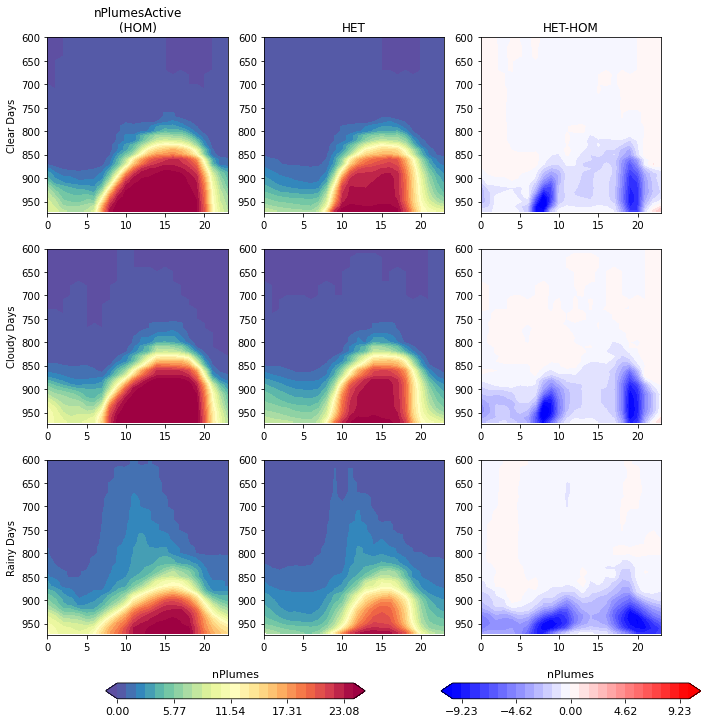

In [86]:
# ## ----- 3D CAM plots ----- #


# hourlyDS_clear  = clear_h0_L50
# hourlyDS_cloudy = cloudy_h0_L50
# hourlyDS_rainy  = rainy_h0_L50

# pltVars = ['Q_interp','T_interp','CLDLIQ_interp','CLOUD_interp','OMEGA_interp','nPlumesActive']
#           # 'nPlumesActive_grass','nPlumesActive_crop','nPlumesActive_urban','nPlumesActive_lake']

# cMin    = [0.003,  278,    0.0,  0.0,     -0.1,    0,   0,  0,  0,  0]
# cMax    = [0.018,  307,   5e-5,  0.25,   0.15,  25,  10, 10, 10, 10]
# diffMax = [0.00045, 0.45,  2.4e-5, 0.075, 0.01,   10,  10, 10, 10, 10]
# unitsStr = [scamDS_h0_L50['Q'].units,     scamDS_h0_L50['T'].units,      scamDS_h0_L50['CLDLIQ'].units, 
#             scamDS_h0_L50['CLOUD'].units, scamDS_h0_L50['OMEGA'].units, 'nPlumes',
#              'nPlumes',  'nPlumes',  'nPlumes',  'nPlumes']
# maxLev  = 600.0

# for iVar in range(len(pltVars)):  
    
#     fig,axs = plt.subplots(3,3,figsize=(11,11))
#     axs     = axs.ravel()

#     ## Clear Days 
#     axs[0].contourf(hourlyDS_clear['hour'].values, hourlyDS_clear['levInterp'].values, 
#                        np.squeeze(hourlyDS_clear[pltVars[iVar]].isel(case=0)).transpose(),
#                        np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
#                        cmap='Spectral_r', extend='both')
#     axs[1].contourf(hourlyDS_clear['hour'].values, hourlyDS_clear['levInterp'].values, 
#                        np.squeeze(hourlyDS_clear[pltVars[iVar]].isel(case=1)).transpose(),
#                        np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
#                        cmap='Spectral_r', extend='both')
    
#     diffVar = np.squeeze(hourlyDS_clear[pltVars[iVar]].isel(case=1)) - np.squeeze(hourlyDS_clear[pltVars[iVar]].isel(case=0))
#     nstep = (2*diffMax[iVar])/26
#     cplt = axs[2].contourf(hourlyDS_clear['hour'].values, hourlyDS_clear['levInterp'].values, 
#                        diffVar.transpose(),
#                        np.arange(-diffMax[iVar], diffMax[iVar]+nstep, nstep), 
#                        cmap='bwr', extend='both')

#     ## Cloudy Days 
#     axs[3].contourf(hourlyDS_cloudy['hour'].values, hourlyDS_cloudy['levInterp'].values, 
#                        np.squeeze(hourlyDS_cloudy[pltVars[iVar]].isel(case=0)).transpose(),
#                        np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
#                        cmap='Spectral_r', extend='both')
#     axs[4].contourf(hourlyDS_cloudy['hour'].values, hourlyDS_cloudy['levInterp'].values, 
#                        np.squeeze(hourlyDS_cloudy[pltVars[iVar]].isel(case=1)).transpose(),
#                        np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
#                        cmap='Spectral_r', extend='both')
    
#     diffVar = np.squeeze(hourlyDS_cloudy[pltVars[iVar]].isel(case=1)) - np.squeeze(hourlyDS_cloudy[pltVars[iVar]].isel(case=0))
#     nstep = (2*diffMax[iVar])/26
#     cplt = axs[5].contourf(hourlyDS_cloudy['hour'].values, hourlyDS_cloudy['levInterp'].values, 
#                        diffVar.transpose(),
#                        np.arange(-diffMax[iVar], diffMax[iVar]+nstep, nstep), 
#                        cmap='bwr', extend='both')    
    
#     ## Rainy Days 
#     axs[6].contourf(hourlyDS_rainy['hour'].values, hourlyDS_rainy['levInterp'].values, 
#                        np.squeeze(hourlyDS_rainy[pltVars[iVar]].isel(case=0)).transpose(),
#                        np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
#                        cmap='Spectral_r', extend='both')
#     cplt = axs[7].contourf(hourlyDS_rainy['hour'].values, hourlyDS_rainy['levInterp'].values, 
#                        np.squeeze(hourlyDS_rainy[pltVars[iVar]].isel(case=1)).transpose(),
#                        np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
#                        cmap='Spectral_r', extend='both')
#     # Add colorbar
#     ax_position = axs[7].get_position()
#     cbar_ax = fig.add_axes([ax_position.x0-0.2, ax_position.y0-0.08, ax_position.width+0.1, 0.02])
#     # cbar = fig.colorbar(cplt, cax=cbar_ax, orientation='horizontal', format='%.1e')
#     cbar = fig.colorbar(cplt, cax=cbar_ax, orientation='horizontal')
#     cbar.ax.locator_params(nbins=6)
#     cbar.ax.set_title(unitsStr[iVar], fontsize=11)
#     cbar.ax.tick_params(labelsize=11) 

    
#     diffVar = np.squeeze(hourlyDS_rainy[pltVars[iVar]].isel(case=1)) - np.squeeze(hourlyDS_rainy[pltVars[iVar]].isel(case=0))
#     nstep = (2*diffMax[iVar])/26
#     cplt = axs[8].contourf(hourlyDS_rainy['hour'].values, hourlyDS_cloudy['levInterp'].values, 
#                        diffVar.transpose(),
#                        np.arange(-diffMax[iVar], diffMax[iVar]+nstep, nstep), 
#                        cmap='bwr', extend='both')    
#     # Add colorbar
#     ax_position = axs[8].get_position()
#     cbar_ax = fig.add_axes([ax_position.x0-0.05, ax_position.y0-0.08, ax_position.width+0.1, 0.02])
#     # cbar = fig.colorbar(cplt, cax=cbar_ax, orientation='horizontal', format='%.1e')
#     cbar = fig.colorbar(cplt, cax=cbar_ax, orientation='horizontal')
#     cbar.ax.locator_params(nbins=6)
#     cbar.ax.set_title(unitsStr[iVar], fontsize=11)
#     cbar.ax.tick_params(labelsize=11) 

#     axs[0].set_title(pltVars[iVar]+'\n(HOM)')
#     axs[1].set_title('HET')
#     axs[2].set_title('HET-HOM')

#     axs[0].set_ylabel('Clear Days')
#     axs[3].set_ylabel('Cloudy Days')
#     axs[6].set_ylabel('Rainy Days') 
    
#     # ## Add PBLH???
#     # axs[0].plot(hourlyDS_clear.hour.values, veryRoughPBLH_clear[0,:],'k:')
#     # axs[1].plot(hourlyDS_clear.hour.values, veryRoughPBLH_clear[1,:],'k--')
#     # axs[2].plot(hourlyDS_clear.hour.values, veryRoughPBLH_clear[0,:],'k:')
#     # axs[2].plot(hourlyDS_clear.hour.values, veryRoughPBLH_clear[1,:],'k--')
#     # axs[3].plot(hourlyDS_cloudy.hour.values, veryRoughPBLH_cloudy[0,:],'k--')
#     # axs[4].plot(hourlyDS_cloudy.hour.values, veryRoughPBLH_cloudy[1,:],'k:')
#     # axs[5].plot(hourlyDS_cloudy.hour.values, veryRoughPBLH_cloudy[0,:],'k--')
#     # axs[5].plot(hourlyDS_cloudy.hour.values, veryRoughPBLH_cloudy[1,:],'k:')
#     # axs[6].plot(hourlyDS_rainy.hour.values, veryRoughPBLH_rainy[0,:],'k--')
#     # axs[7].plot(hourlyDS_rainy.hour.values, veryRoughPBLH_rainy[1,:],'k:')
#     # axs[8].plot(hourlyDS_rainy.hour.values, veryRoughPBLH_rainy[0,:],'k--')
#     # axs[8].plot(hourlyDS_rainy.hour.values, veryRoughPBLH_rainy[1,:],'k:')
    

    
#     axs[0].invert_yaxis()
#     axs[1].invert_yaxis()
#     axs[2].invert_yaxis()
#     axs[3].invert_yaxis()
#     axs[4].invert_yaxis()
#     axs[5].invert_yaxis()
#     axs[6].invert_yaxis()
#     axs[7].invert_yaxis()
#     axs[8].invert_yaxis()

#     axs[0].set_ylim([975,maxLev])
#     axs[1].set_ylim([975,maxLev])
#     axs[2].set_ylim([975,maxLev])
#     axs[3].set_ylim([975,maxLev])
#     axs[4].set_ylim([975,maxLev])
#     axs[5].set_ylim([975,maxLev])
#     axs[6].set_ylim([975,maxLev])
#     axs[7].set_ylim([975,maxLev])
#     axs[8].set_ylim([975,maxLev])


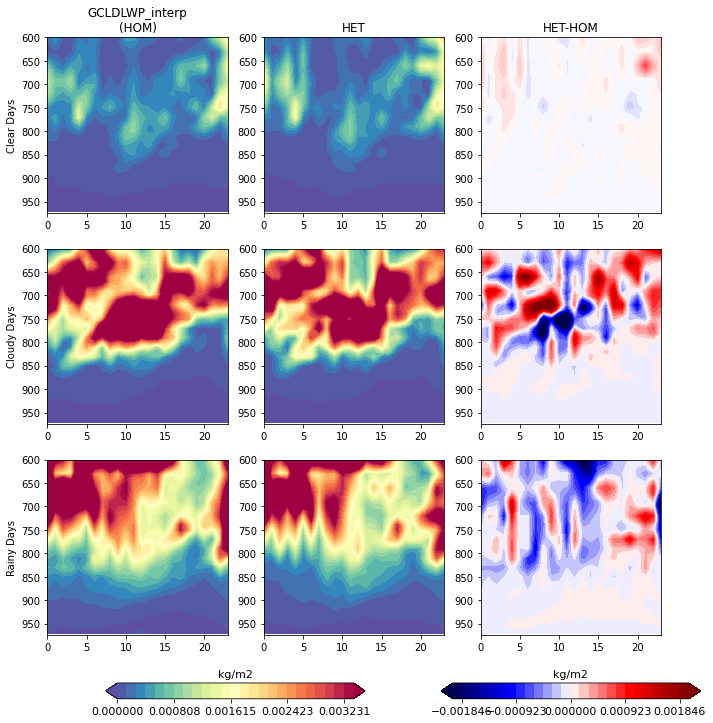

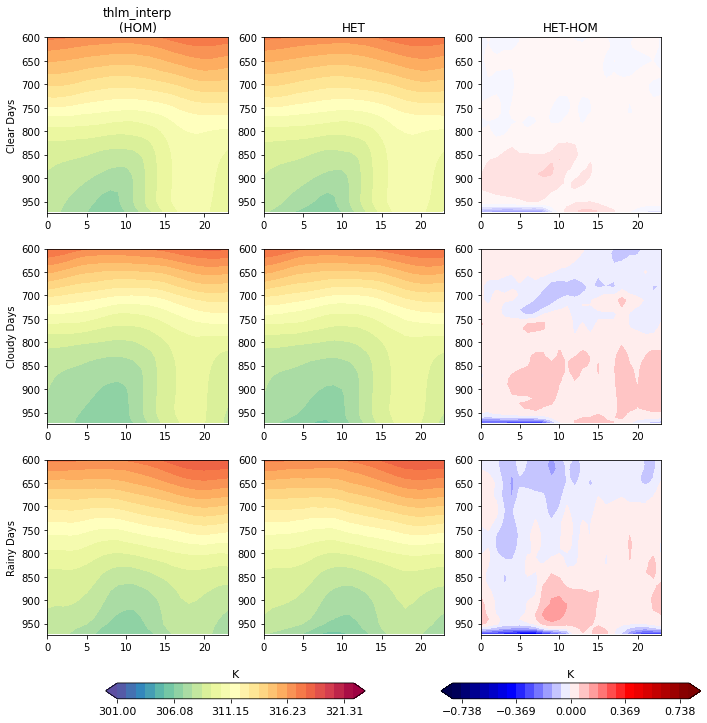

In [90]:
# # ----- 3D CAM plots ----- #

# hourlyDS_clear  = clear_h0_L50
# hourlyDS_cloudy = cloudy_h0_L50
# hourlyDS_rainy  = rainy_h0_L50

# pltVars = ['GCLDLWP_interp','thlm_interp']

# cMin    = [0, 301]
# cMax    = [3.5e-3, 323]
# diffMax = [2e-3, 0.8]
# unitsStr = [scamDS_h0_L50['GCLDLWP'].units,     scamDS_h0_L50['thlm'].units]
# maxLev  = 600.0

# for iVar in range(len(pltVars)):  
    
#     fig,axs = plt.subplots(3,3,figsize=(11,11))
#     axs     = axs.ravel()

#     ## Clear Days 
#     axs[0].contourf(hourlyDS_clear['hour'].values, hourlyDS_clear['levInterp'].values, 
#                        np.squeeze(hourlyDS_clear[pltVars[iVar]].isel(case=0)).transpose(),
#                        np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
#                        cmap='Spectral_r', extend='both')
#     axs[1].contourf(hourlyDS_clear['hour'].values, hourlyDS_clear['levInterp'].values, 
#                        np.squeeze(hourlyDS_clear[pltVars[iVar]].isel(case=1)).transpose(),
#                        np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
#                        cmap='Spectral_r', extend='both')
    
#     diffVar = np.squeeze(hourlyDS_clear[pltVars[iVar]].isel(case=1)) - np.squeeze(hourlyDS_clear[pltVars[iVar]].isel(case=0))
#     nstep = (2*diffMax[iVar])/26
#     cplt = axs[2].contourf(hourlyDS_clear['hour'].values, hourlyDS_clear['levInterp'].values, 
#                        diffVar.transpose(),
#                        np.arange(-diffMax[iVar], diffMax[iVar]+nstep, nstep), 
#                        cmap='bwr', extend='both')

#     ## Cloudy Days 
#     axs[3].contourf(hourlyDS_cloudy['hour'].values, hourlyDS_cloudy['levInterp'].values, 
#                        np.squeeze(hourlyDS_cloudy[pltVars[iVar]].isel(case=0)).transpose(),
#                        np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
#                        cmap='Spectral_r', extend='both')
#     axs[4].contourf(hourlyDS_cloudy['hour'].values, hourlyDS_cloudy['levInterp'].values, 
#                        np.squeeze(hourlyDS_cloudy[pltVars[iVar]].isel(case=1)).transpose(),
#                        np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
#                        cmap='Spectral_r', extend='both')
    
#     diffVar = np.squeeze(hourlyDS_cloudy[pltVars[iVar]].isel(case=1)) - np.squeeze(hourlyDS_cloudy[pltVars[iVar]].isel(case=0))
#     nstep = (2*diffMax[iVar])/26
#     cplt = axs[5].contourf(hourlyDS_cloudy['hour'].values, hourlyDS_cloudy['levInterp'].values, 
#                        diffVar.transpose(),
#                        np.arange(-diffMax[iVar], diffMax[iVar]+nstep, nstep), 
#                        cmap='seismic', extend='both')    
    
#     ## Rainy Days 
#     axs[6].contourf(hourlyDS_rainy['hour'].values, hourlyDS_rainy['levInterp'].values, 
#                        np.squeeze(hourlyDS_rainy[pltVars[iVar]].isel(case=0)).transpose(),
#                        np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
#                        cmap='Spectral_r', extend='both')
#     cplt = axs[7].contourf(hourlyDS_rainy['hour'].values, hourlyDS_rainy['levInterp'].values, 
#                        np.squeeze(hourlyDS_rainy[pltVars[iVar]].isel(case=1)).transpose(),
#                        np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
#                        cmap='Spectral_r', extend='both')
#     # Add colorbar
#     ax_position = axs[7].get_position()
#     cbar_ax = fig.add_axes([ax_position.x0-0.2, ax_position.y0-0.08, ax_position.width+0.1, 0.02])
#     # cbar = fig.colorbar(cplt, cax=cbar_ax, orientation='horizontal', format='%.1e')
#     cbar = fig.colorbar(cplt, cax=cbar_ax, orientation='horizontal')
#     cbar.ax.locator_params(nbins=6)
#     cbar.ax.set_title(unitsStr[iVar], fontsize=11)
#     cbar.ax.tick_params(labelsize=11) 

    
#     diffVar = np.squeeze(hourlyDS_rainy[pltVars[iVar]].isel(case=1)) - np.squeeze(hourlyDS_rainy[pltVars[iVar]].isel(case=0))
#     nstep = (2*diffMax[iVar])/26
#     cplt = axs[8].contourf(hourlyDS_rainy['hour'].values, hourlyDS_cloudy['levInterp'].values, 
#                        diffVar.transpose(),
#                        np.arange(-diffMax[iVar], diffMax[iVar]+nstep, nstep), 
#                        cmap='seismic', extend='both')    
#     # Add colorbar
#     ax_position = axs[8].get_position()
#     cbar_ax = fig.add_axes([ax_position.x0-0.05, ax_position.y0-0.08, ax_position.width+0.1, 0.02])
#     # cbar = fig.colorbar(cplt, cax=cbar_ax, orientation='horizontal', format='%.1e')
#     cbar = fig.colorbar(cplt, cax=cbar_ax, orientation='horizontal')
#     cbar.ax.locator_params(nbins=6)
#     cbar.ax.set_title(unitsStr[iVar], fontsize=11)
#     cbar.ax.tick_params(labelsize=11) 

#     axs[0].set_title(pltVars[iVar]+'\n(HOM)')
#     axs[1].set_title('HET')
#     axs[2].set_title('HET-HOM')

#     axs[0].set_ylabel('Clear Days')
#     axs[3].set_ylabel('Cloudy Days')
#     axs[6].set_ylabel('Rainy Days') 
    
#     # ## Add PBLH???
#     # axs[0].plot(hourlyDS_clear.hour.values, veryRoughPBLH_clear[0,:],'k:')
#     # axs[1].plot(hourlyDS_clear.hour.values, veryRoughPBLH_clear[1,:],'k--')
#     # axs[2].plot(hourlyDS_clear.hour.values, veryRoughPBLH_clear[0,:],'k:')
#     # axs[2].plot(hourlyDS_clear.hour.values, veryRoughPBLH_clear[1,:],'k--')
#     # axs[3].plot(hourlyDS_cloudy.hour.values, veryRoughPBLH_cloudy[0,:],'k--')
#     # axs[4].plot(hourlyDS_cloudy.hour.values, veryRoughPBLH_cloudy[1,:],'k:')
#     # axs[5].plot(hourlyDS_cloudy.hour.values, veryRoughPBLH_cloudy[0,:],'k--')
#     # axs[5].plot(hourlyDS_cloudy.hour.values, veryRoughPBLH_cloudy[1,:],'k:')
#     # axs[6].plot(hourlyDS_rainy.hour.values, veryRoughPBLH_rainy[0,:],'k--')
#     # axs[7].plot(hourlyDS_rainy.hour.values, veryRoughPBLH_rainy[1,:],'k:')
#     # axs[8].plot(hourlyDS_rainy.hour.values, veryRoughPBLH_rainy[0,:],'k--')
#     # axs[8].plot(hourlyDS_rainy.hour.values, veryRoughPBLH_rainy[1,:],'k:')
    

    
#     axs[0].invert_yaxis()
#     axs[1].invert_yaxis()
#     axs[2].invert_yaxis()
#     axs[3].invert_yaxis()
#     axs[4].invert_yaxis()
#     axs[5].invert_yaxis()
#     axs[6].invert_yaxis()
#     axs[7].invert_yaxis()
#     axs[8].invert_yaxis()

#     axs[0].set_ylim([975,maxLev])
#     axs[1].set_ylim([975,maxLev])
#     axs[2].set_ylim([975,maxLev])
#     axs[3].set_ylim([975,maxLev])
#     axs[4].set_ylim([975,maxLev])
#     axs[5].set_ylim([975,maxLev])
#     axs[6].set_ylim([975,maxLev])
#     axs[7].set_ylim([975,maxLev])
#     axs[8].set_ylim([975,maxLev])


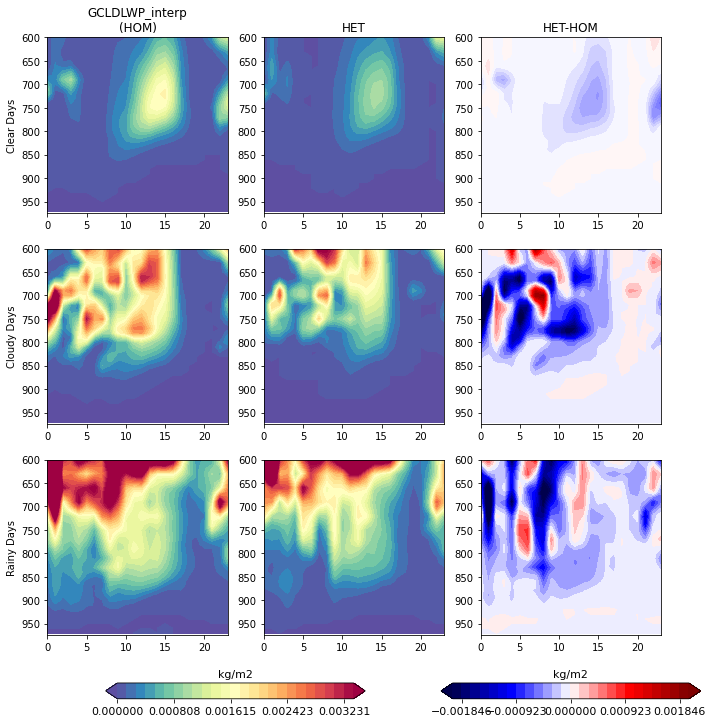

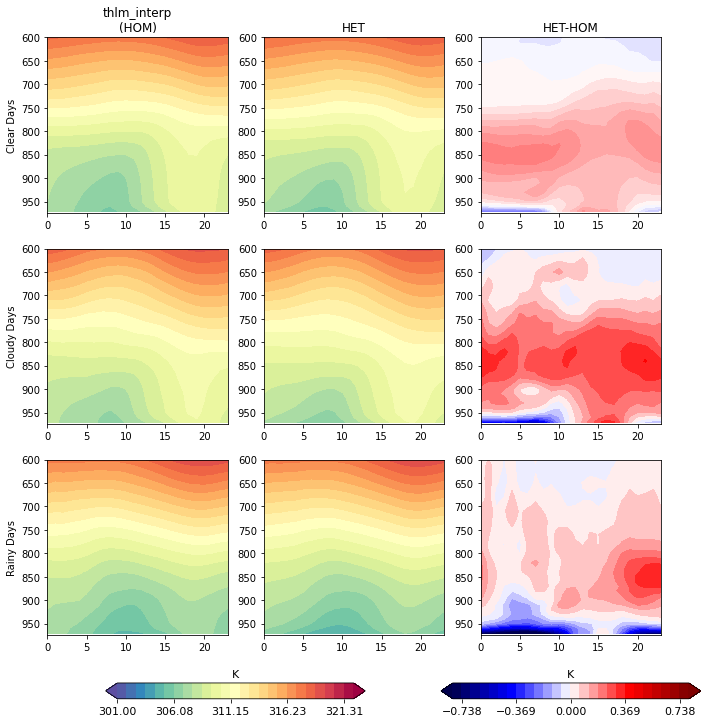

In [91]:
# ----- 3D CAM plots ----- #

hourlyDS_clear  = clear_h0_L250
hourlyDS_cloudy = cloudy_h0_L250
hourlyDS_rainy  = rainy_h0_L250

pltVars = ['GCLDLWP_interp','thlm_interp']

cMin    = [0, 301]
cMax    = [3.5e-3, 323]
diffMax = [2e-3, 0.8]
unitsStr = [scamDS_h0_L50['GCLDLWP'].units,     scamDS_h0_L50['thlm'].units]
maxLev  = 600.0

for iVar in range(len(pltVars)):  
    
    fig,axs = plt.subplots(3,3,figsize=(11,11))
    axs     = axs.ravel()

    ## Clear Days 
    axs[0].contourf(hourlyDS_clear['hour'].values, hourlyDS_clear['levInterp'].values, 
                       np.squeeze(hourlyDS_clear[pltVars[iVar]].isel(case=0)).transpose(),
                       np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
                       cmap='Spectral_r', extend='both')
    axs[1].contourf(hourlyDS_clear['hour'].values, hourlyDS_clear['levInterp'].values, 
                       np.squeeze(hourlyDS_clear[pltVars[iVar]].isel(case=1)).transpose(),
                       np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
                       cmap='Spectral_r', extend='both')
    
    diffVar = np.squeeze(hourlyDS_clear[pltVars[iVar]].isel(case=1)) - np.squeeze(hourlyDS_clear[pltVars[iVar]].isel(case=0))
    nstep = (2*diffMax[iVar])/26
    cplt = axs[2].contourf(hourlyDS_clear['hour'].values, hourlyDS_clear['levInterp'].values, 
                       diffVar.transpose(),
                       np.arange(-diffMax[iVar], diffMax[iVar]+nstep, nstep), 
                       cmap='bwr', extend='both')

    ## Cloudy Days 
    axs[3].contourf(hourlyDS_cloudy['hour'].values, hourlyDS_cloudy['levInterp'].values, 
                       np.squeeze(hourlyDS_cloudy[pltVars[iVar]].isel(case=0)).transpose(),
                       np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
                       cmap='Spectral_r', extend='both')
    axs[4].contourf(hourlyDS_cloudy['hour'].values, hourlyDS_cloudy['levInterp'].values, 
                       np.squeeze(hourlyDS_cloudy[pltVars[iVar]].isel(case=1)).transpose(),
                       np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
                       cmap='Spectral_r', extend='both')
    
    diffVar = np.squeeze(hourlyDS_cloudy[pltVars[iVar]].isel(case=1)) - np.squeeze(hourlyDS_cloudy[pltVars[iVar]].isel(case=0))
    nstep = (2*diffMax[iVar])/26
    cplt = axs[5].contourf(hourlyDS_cloudy['hour'].values, hourlyDS_cloudy['levInterp'].values, 
                       diffVar.transpose(),
                       np.arange(-diffMax[iVar], diffMax[iVar]+nstep, nstep), 
                       cmap='seismic', extend='both')    
    
    ## Rainy Days 
    axs[6].contourf(hourlyDS_rainy['hour'].values, hourlyDS_rainy['levInterp'].values, 
                       np.squeeze(hourlyDS_rainy[pltVars[iVar]].isel(case=0)).transpose(),
                       np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
                       cmap='Spectral_r', extend='both')
    cplt = axs[7].contourf(hourlyDS_rainy['hour'].values, hourlyDS_rainy['levInterp'].values, 
                       np.squeeze(hourlyDS_rainy[pltVars[iVar]].isel(case=1)).transpose(),
                       np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
                       cmap='Spectral_r', extend='both')
    # Add colorbar
    ax_position = axs[7].get_position()
    cbar_ax = fig.add_axes([ax_position.x0-0.2, ax_position.y0-0.08, ax_position.width+0.1, 0.02])
    # cbar = fig.colorbar(cplt, cax=cbar_ax, orientation='horizontal', format='%.1e')
    cbar = fig.colorbar(cplt, cax=cbar_ax, orientation='horizontal')
    cbar.ax.locator_params(nbins=6)
    cbar.ax.set_title(unitsStr[iVar], fontsize=11)
    cbar.ax.tick_params(labelsize=11) 

    
    diffVar = np.squeeze(hourlyDS_rainy[pltVars[iVar]].isel(case=1)) - np.squeeze(hourlyDS_rainy[pltVars[iVar]].isel(case=0))
    nstep = (2*diffMax[iVar])/26
    cplt = axs[8].contourf(hourlyDS_rainy['hour'].values, hourlyDS_cloudy['levInterp'].values, 
                       diffVar.transpose(),
                       np.arange(-diffMax[iVar], diffMax[iVar]+nstep, nstep), 
                       cmap='seismic', extend='both')    
    # Add colorbar
    ax_position = axs[8].get_position()
    cbar_ax = fig.add_axes([ax_position.x0-0.05, ax_position.y0-0.08, ax_position.width+0.1, 0.02])
    # cbar = fig.colorbar(cplt, cax=cbar_ax, orientation='horizontal', format='%.1e')
    cbar = fig.colorbar(cplt, cax=cbar_ax, orientation='horizontal')
    cbar.ax.locator_params(nbins=6)
    cbar.ax.set_title(unitsStr[iVar], fontsize=11)
    cbar.ax.tick_params(labelsize=11) 

    axs[0].set_title(pltVars[iVar]+'\n(HOM)')
    axs[1].set_title('HET')
    axs[2].set_title('HET-HOM')

    axs[0].set_ylabel('Clear Days')
    axs[3].set_ylabel('Cloudy Days')
    axs[6].set_ylabel('Rainy Days') 
    
    # ## Add PBLH???
    # axs[0].plot(hourlyDS_clear.hour.values, veryRoughPBLH_clear[0,:],'k:')
    # axs[1].plot(hourlyDS_clear.hour.values, veryRoughPBLH_clear[1,:],'k--')
    # axs[2].plot(hourlyDS_clear.hour.values, veryRoughPBLH_clear[0,:],'k:')
    # axs[2].plot(hourlyDS_clear.hour.values, veryRoughPBLH_clear[1,:],'k--')
    # axs[3].plot(hourlyDS_cloudy.hour.values, veryRoughPBLH_cloudy[0,:],'k--')
    # axs[4].plot(hourlyDS_cloudy.hour.values, veryRoughPBLH_cloudy[1,:],'k:')
    # axs[5].plot(hourlyDS_cloudy.hour.values, veryRoughPBLH_cloudy[0,:],'k--')
    # axs[5].plot(hourlyDS_cloudy.hour.values, veryRoughPBLH_cloudy[1,:],'k:')
    # axs[6].plot(hourlyDS_rainy.hour.values, veryRoughPBLH_rainy[0,:],'k--')
    # axs[7].plot(hourlyDS_rainy.hour.values, veryRoughPBLH_rainy[1,:],'k:')
    # axs[8].plot(hourlyDS_rainy.hour.values, veryRoughPBLH_rainy[0,:],'k--')
    # axs[8].plot(hourlyDS_rainy.hour.values, veryRoughPBLH_rainy[1,:],'k:')
    

    
    axs[0].invert_yaxis()
    axs[1].invert_yaxis()
    axs[2].invert_yaxis()
    axs[3].invert_yaxis()
    axs[4].invert_yaxis()
    axs[5].invert_yaxis()
    axs[6].invert_yaxis()
    axs[7].invert_yaxis()
    axs[8].invert_yaxis()

    axs[0].set_ylim([975,maxLev])
    axs[1].set_ylim([975,maxLev])
    axs[2].set_ylim([975,maxLev])
    axs[3].set_ylim([975,maxLev])
    axs[4].set_ylim([975,maxLev])
    axs[5].set_ylim([975,maxLev])
    axs[6].set_ylim([975,maxLev])
    axs[7].set_ylim([975,maxLev])
    axs[8].set_ylim([975,maxLev])


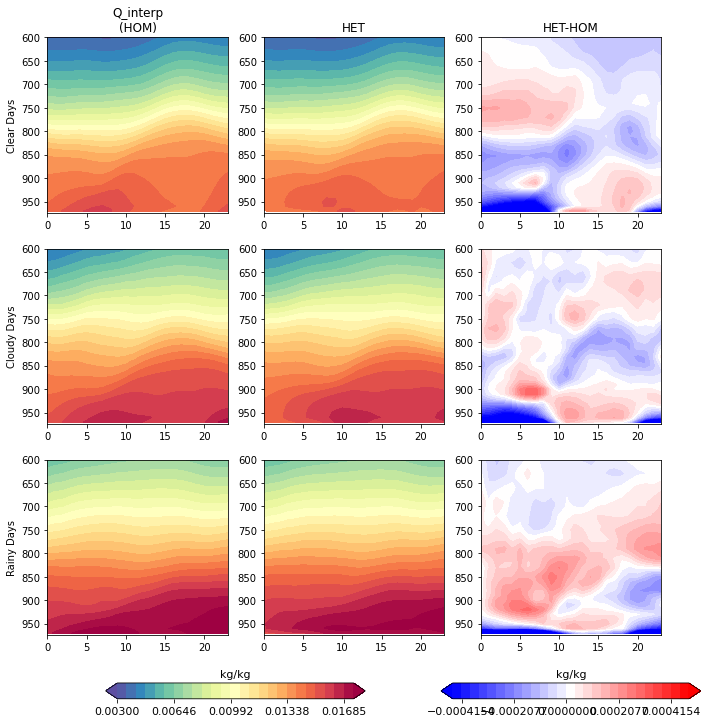

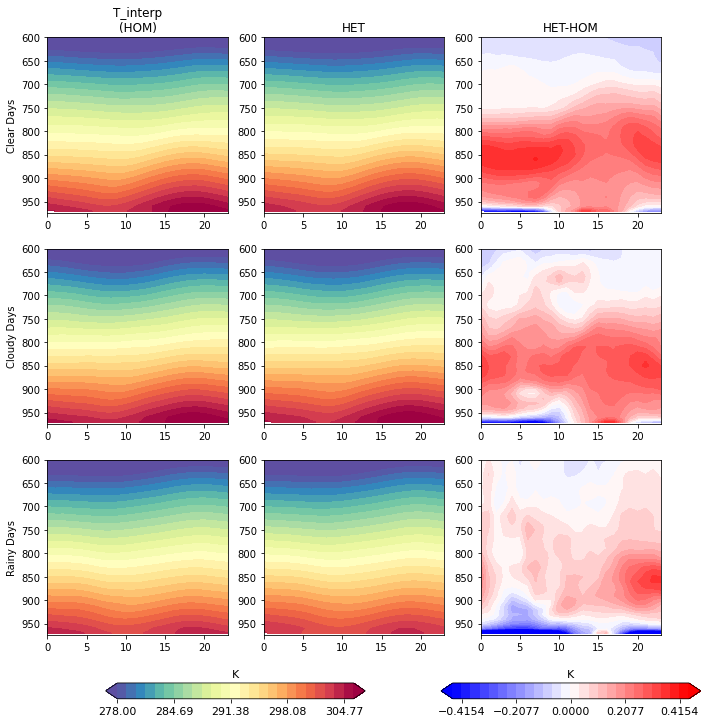

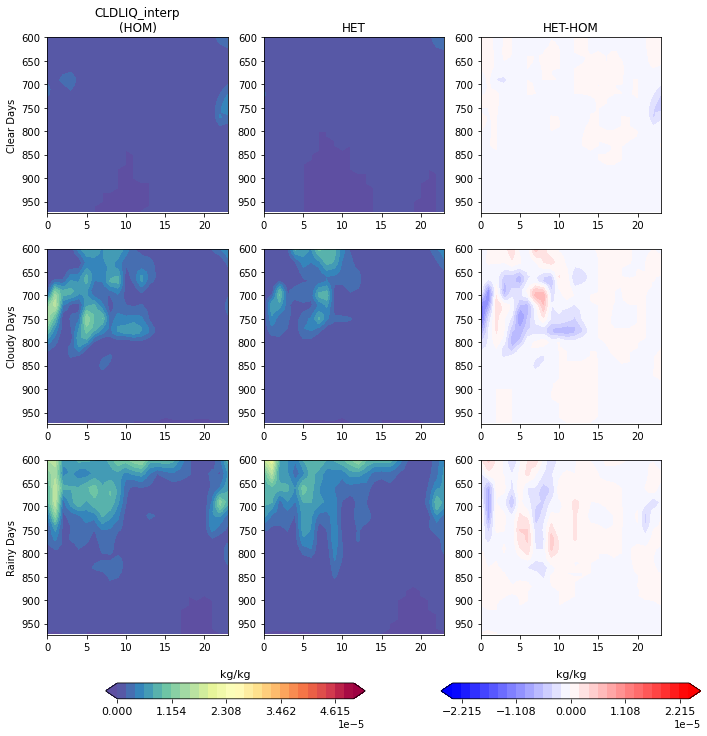

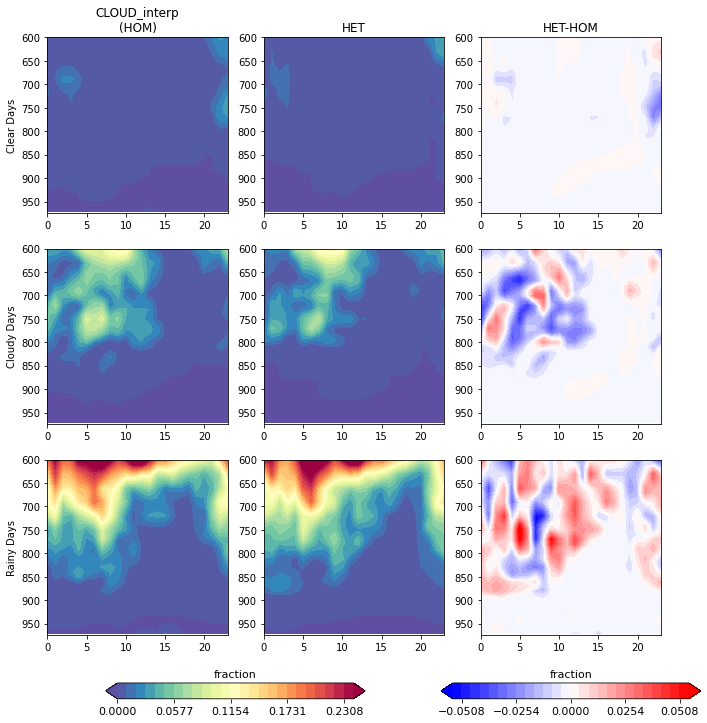

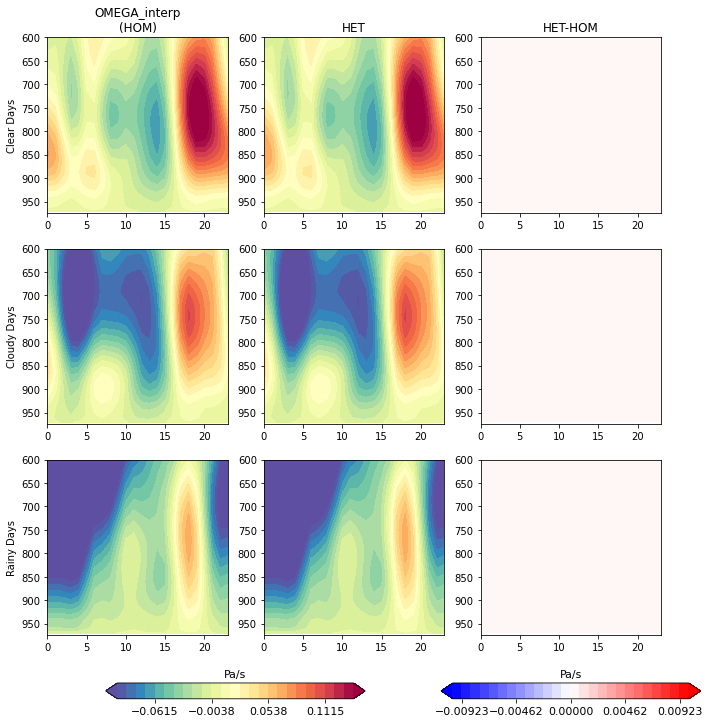

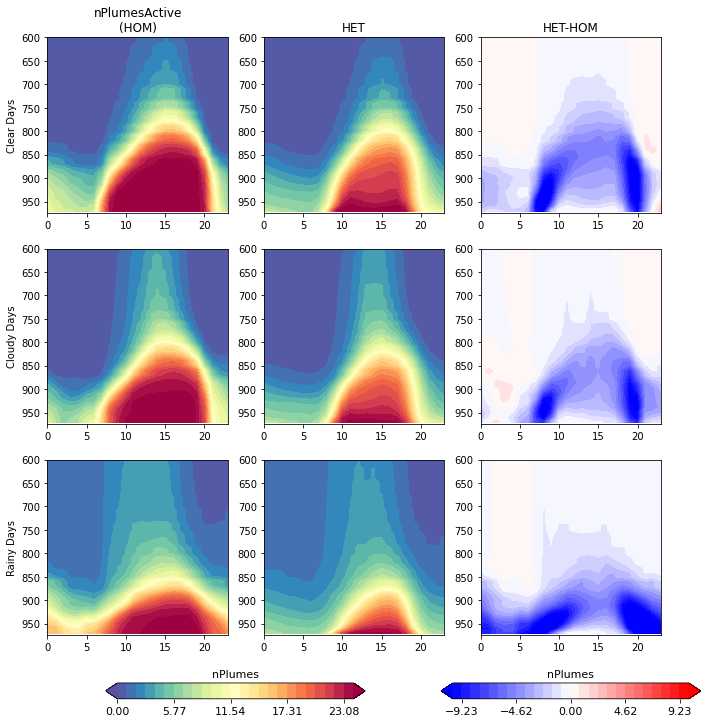

In [13]:
## ----- 3D CAM plots ----- #


hourlyDS_clear  = clear_h0_L250
hourlyDS_cloudy = cloudy_h0_L250
hourlyDS_rainy  = rainy_h0_L250

pltVars = ['Q_interp','T_interp','CLDLIQ_interp','CLOUD_interp','OMEGA_interp','nPlumesActive']
          # 'nPlumesActive_grass','nPlumesActive_crop','nPlumesActive_urban','nPlumesActive_lake']

cMin    = [0.003,  278,    0.0,  0.0,     -0.1,    0,   0,  0,  0,  0]
cMax    = [0.018,  307,   5e-5,  0.25,   0.15,  25,  10, 10, 10, 10]
diffMax = [0.00045, 0.45,  2.4e-5, 0.055, 0.01,   10,  10, 10, 10, 10]
unitsStr = [scamDS_h0_L50['Q'].units,     scamDS_h0_L50['T'].units,      scamDS_h0_L50['CLDLIQ'].units, 
            scamDS_h0_L50['CLOUD'].units, scamDS_h0_L50['OMEGA'].units, 'nPlumes',
             'nPlumes',  'nPlumes',  'nPlumes',  'nPlumes']
maxLev  = 600.0

for iVar in range(len(pltVars)):  
    
    fig,axs = plt.subplots(3,3,figsize=(11,11))
    axs     = axs.ravel()

    ## Clear Days 
    axs[0].contourf(hourlyDS_clear['hour'].values, hourlyDS_clear['levInterp'].values, 
                       np.squeeze(hourlyDS_clear[pltVars[iVar]].isel(case=0)).transpose(),
                       np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
                       cmap='Spectral_r', extend='both')
    axs[1].contourf(hourlyDS_clear['hour'].values, hourlyDS_clear['levInterp'].values, 
                       np.squeeze(hourlyDS_clear[pltVars[iVar]].isel(case=1)).transpose(),
                       np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
                       cmap='Spectral_r', extend='both')
    
    diffVar = np.squeeze(hourlyDS_clear[pltVars[iVar]].isel(case=1)) - np.squeeze(hourlyDS_clear[pltVars[iVar]].isel(case=0))
    nstep = (2*diffMax[iVar])/26
    cplt = axs[2].contourf(hourlyDS_clear['hour'].values, hourlyDS_clear['levInterp'].values, 
                       diffVar.transpose(),
                       np.arange(-diffMax[iVar], diffMax[iVar]+nstep, nstep), 
                       cmap='bwr', extend='both')

    ## Cloudy Days 
    axs[3].contourf(hourlyDS_cloudy['hour'].values, hourlyDS_cloudy['levInterp'].values, 
                       np.squeeze(hourlyDS_cloudy[pltVars[iVar]].isel(case=0)).transpose(),
                       np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
                       cmap='Spectral_r', extend='both')
    axs[4].contourf(hourlyDS_cloudy['hour'].values, hourlyDS_cloudy['levInterp'].values, 
                       np.squeeze(hourlyDS_cloudy[pltVars[iVar]].isel(case=1)).transpose(),
                       np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
                       cmap='Spectral_r', extend='both')
    
    diffVar = np.squeeze(hourlyDS_cloudy[pltVars[iVar]].isel(case=1)) - np.squeeze(hourlyDS_cloudy[pltVars[iVar]].isel(case=0))
    nstep = (2*diffMax[iVar])/26
    cplt = axs[5].contourf(hourlyDS_cloudy['hour'].values, hourlyDS_cloudy['levInterp'].values, 
                       diffVar.transpose(),
                       np.arange(-diffMax[iVar], diffMax[iVar]+nstep, nstep), 
                       cmap='bwr', extend='both')    
    
    ## Rainy Days 
    axs[6].contourf(hourlyDS_rainy['hour'].values, hourlyDS_rainy['levInterp'].values, 
                       np.squeeze(hourlyDS_rainy[pltVars[iVar]].isel(case=0)).transpose(),
                       np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
                       cmap='Spectral_r', extend='both')
    cplt = axs[7].contourf(hourlyDS_rainy['hour'].values, hourlyDS_rainy['levInterp'].values, 
                       np.squeeze(hourlyDS_rainy[pltVars[iVar]].isel(case=1)).transpose(),
                       np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
                       cmap='Spectral_r', extend='both')
    # Add colorbar
    ax_position = axs[7].get_position()
    cbar_ax = fig.add_axes([ax_position.x0-0.2, ax_position.y0-0.08, ax_position.width+0.1, 0.02])
    # cbar = fig.colorbar(cplt, cax=cbar_ax, orientation='horizontal', format='%.1e')
    cbar = fig.colorbar(cplt, cax=cbar_ax, orientation='horizontal')
    cbar.ax.locator_params(nbins=6)
    cbar.ax.set_title(unitsStr[iVar], fontsize=11)
    cbar.ax.tick_params(labelsize=11) 

    
    diffVar = np.squeeze(hourlyDS_rainy[pltVars[iVar]].isel(case=1)) - np.squeeze(hourlyDS_rainy[pltVars[iVar]].isel(case=0))
    nstep = (2*diffMax[iVar])/26
    cplt = axs[8].contourf(hourlyDS_rainy['hour'].values, hourlyDS_cloudy['levInterp'].values, 
                       diffVar.transpose(),
                       np.arange(-diffMax[iVar], diffMax[iVar]+nstep, nstep), 
                       cmap='bwr', extend='both')    
    # Add colorbar
    ax_position = axs[8].get_position()
    cbar_ax = fig.add_axes([ax_position.x0-0.05, ax_position.y0-0.08, ax_position.width+0.1, 0.02])
    # cbar = fig.colorbar(cplt, cax=cbar_ax, orientation='horizontal', format='%.1e')
    cbar = fig.colorbar(cplt, cax=cbar_ax, orientation='horizontal')
    cbar.ax.locator_params(nbins=6)
    cbar.ax.set_title(unitsStr[iVar], fontsize=11)
    cbar.ax.tick_params(labelsize=11) 

    axs[0].set_title(pltVars[iVar]+'\n(HOM)')
    axs[1].set_title('HET')
    axs[2].set_title('HET-HOM')

    axs[0].set_ylabel('Clear Days')
    axs[3].set_ylabel('Cloudy Days')
    axs[6].set_ylabel('Rainy Days') 
    
    # ## Add PBLH???
    # axs[0].plot(hourlyDS_clear.hour.values, veryRoughPBLH_clear[0,:],'k:')
    # axs[1].plot(hourlyDS_clear.hour.values, veryRoughPBLH_clear[1,:],'k--')
    # axs[2].plot(hourlyDS_clear.hour.values, veryRoughPBLH_clear[0,:],'k:')
    # axs[2].plot(hourlyDS_clear.hour.values, veryRoughPBLH_clear[1,:],'k--')
    # axs[3].plot(hourlyDS_cloudy.hour.values, veryRoughPBLH_cloudy[0,:],'k--')
    # axs[4].plot(hourlyDS_cloudy.hour.values, veryRoughPBLH_cloudy[1,:],'k:')
    # axs[5].plot(hourlyDS_cloudy.hour.values, veryRoughPBLH_cloudy[0,:],'k--')
    # axs[5].plot(hourlyDS_cloudy.hour.values, veryRoughPBLH_cloudy[1,:],'k:')
    # axs[6].plot(hourlyDS_rainy.hour.values, veryRoughPBLH_rainy[0,:],'k--')
    # axs[7].plot(hourlyDS_rainy.hour.values, veryRoughPBLH_rainy[1,:],'k:')
    # axs[8].plot(hourlyDS_rainy.hour.values, veryRoughPBLH_rainy[0,:],'k--')
    # axs[8].plot(hourlyDS_rainy.hour.values, veryRoughPBLH_rainy[1,:],'k:')
    

    
    axs[0].invert_yaxis()
    axs[1].invert_yaxis()
    axs[2].invert_yaxis()
    axs[3].invert_yaxis()
    axs[4].invert_yaxis()
    axs[5].invert_yaxis()
    axs[6].invert_yaxis()
    axs[7].invert_yaxis()
    axs[8].invert_yaxis()

    axs[0].set_ylim([975,maxLev])
    axs[1].set_ylim([975,maxLev])
    axs[2].set_ylim([975,maxLev])
    axs[3].set_ylim([975,maxLev])
    axs[4].set_ylim([975,maxLev])
    axs[5].set_ylim([975,maxLev])
    axs[6].set_ylim([975,maxLev])
    axs[7].set_ylim([975,maxLev])
    axs[8].set_ylim([975,maxLev])


In [ ]:
clims = np.arange(0,3.5e-3,1e-4)
dlims = np.arange(-3e-3, 3.1e-3, 0.1e-3)

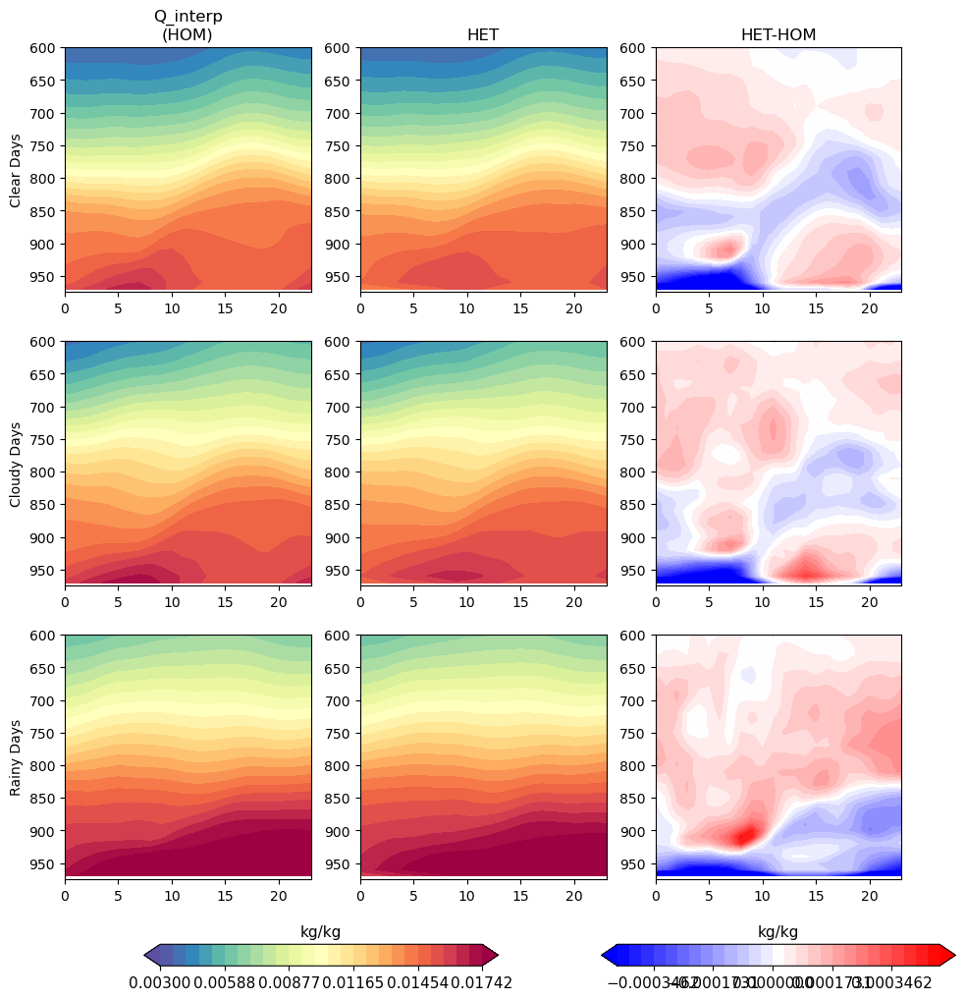

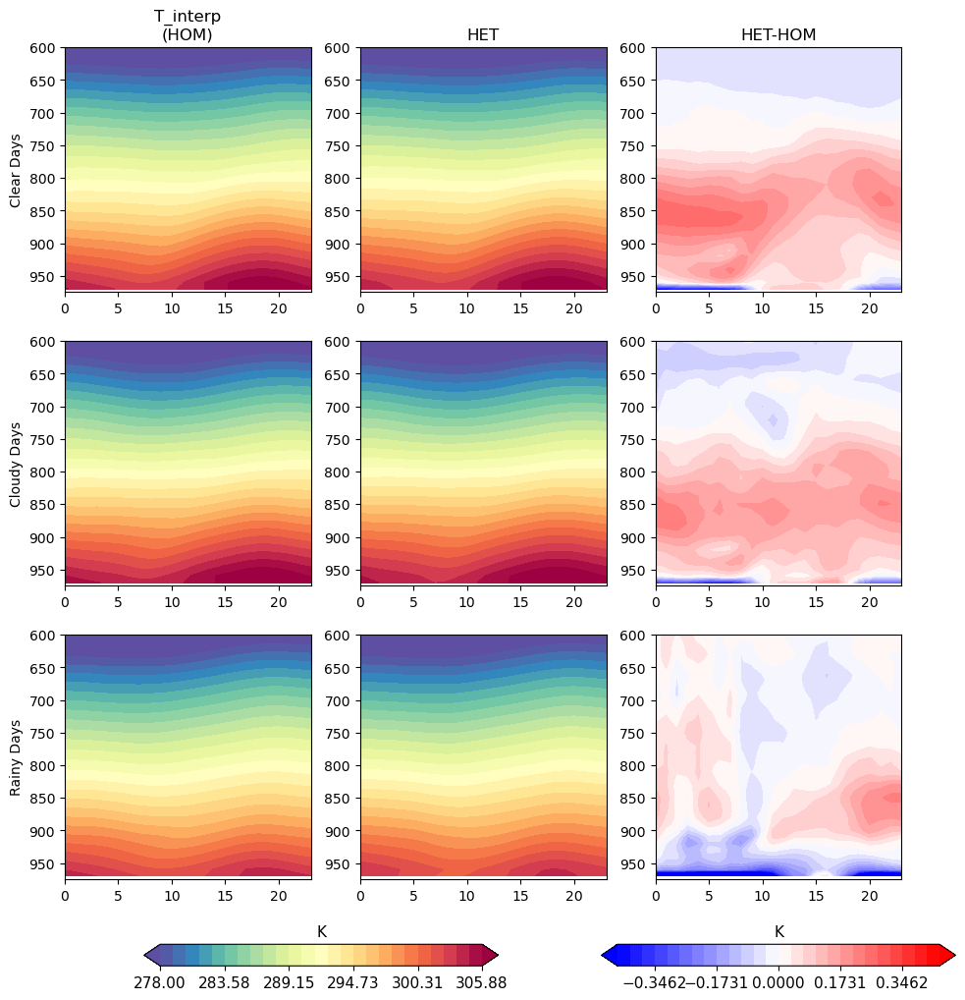

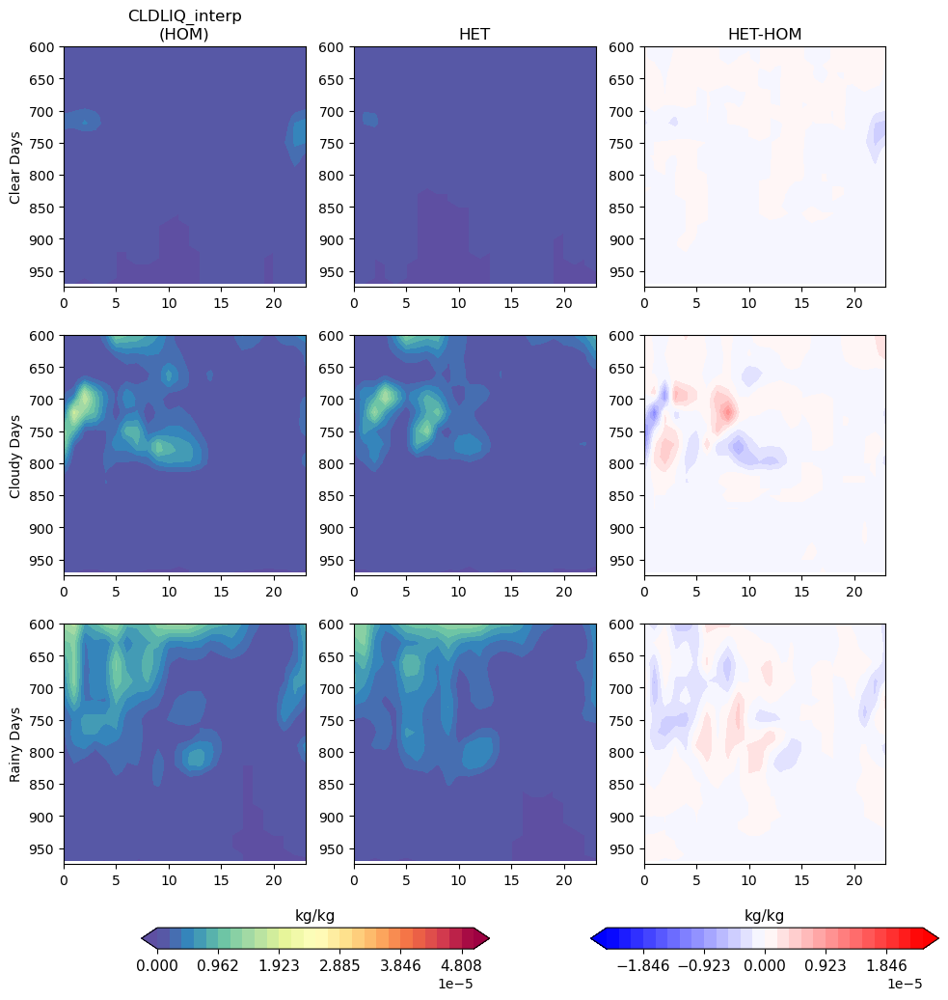

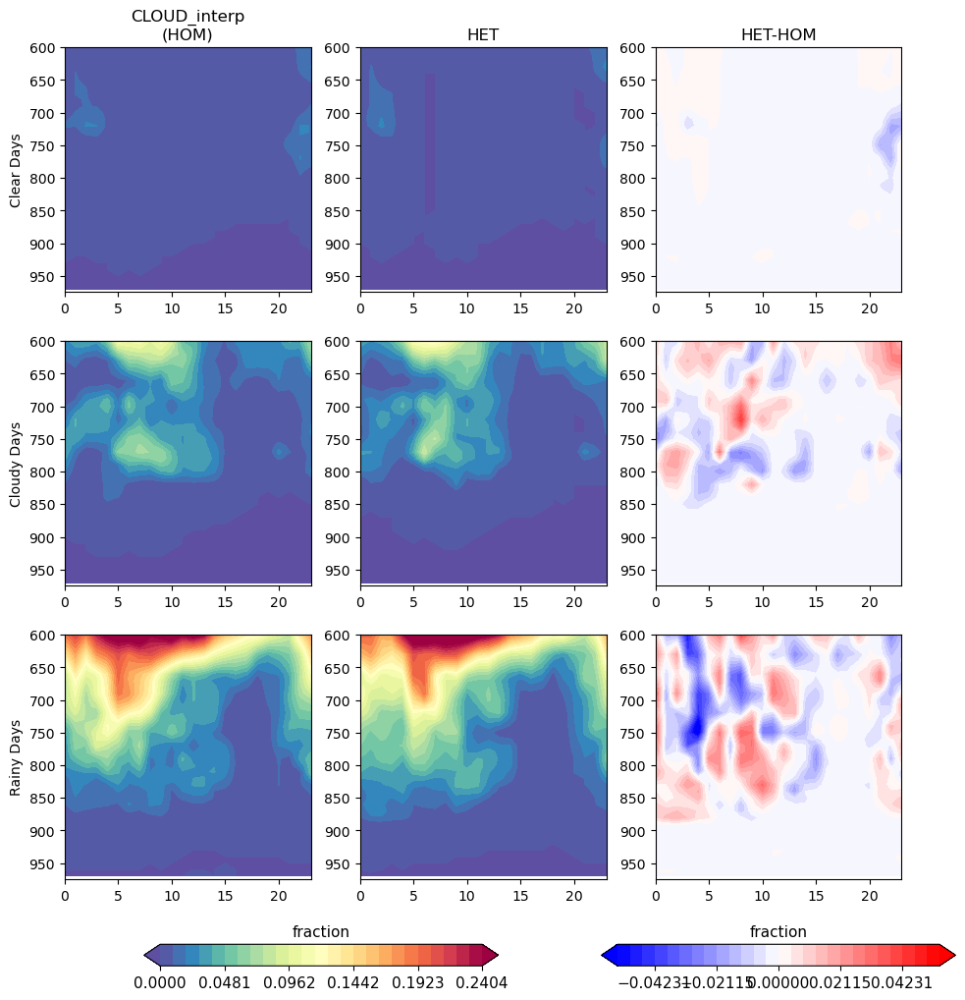

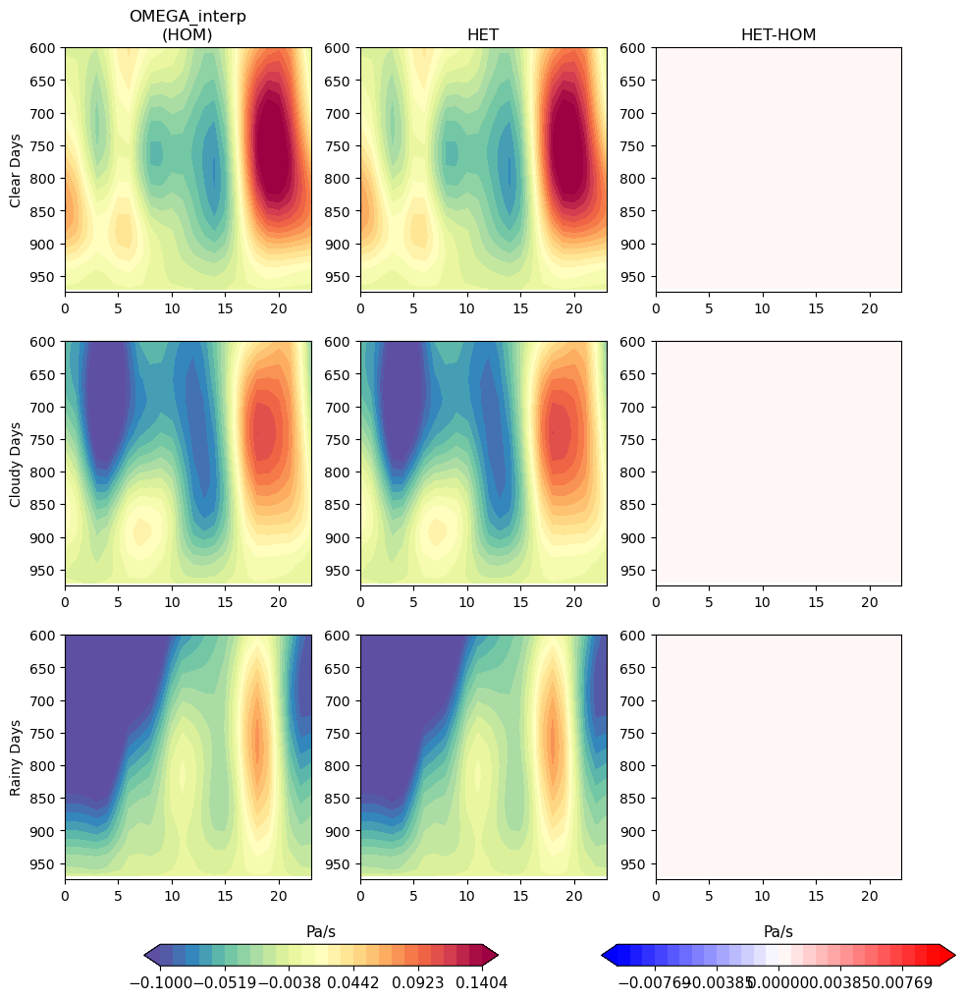

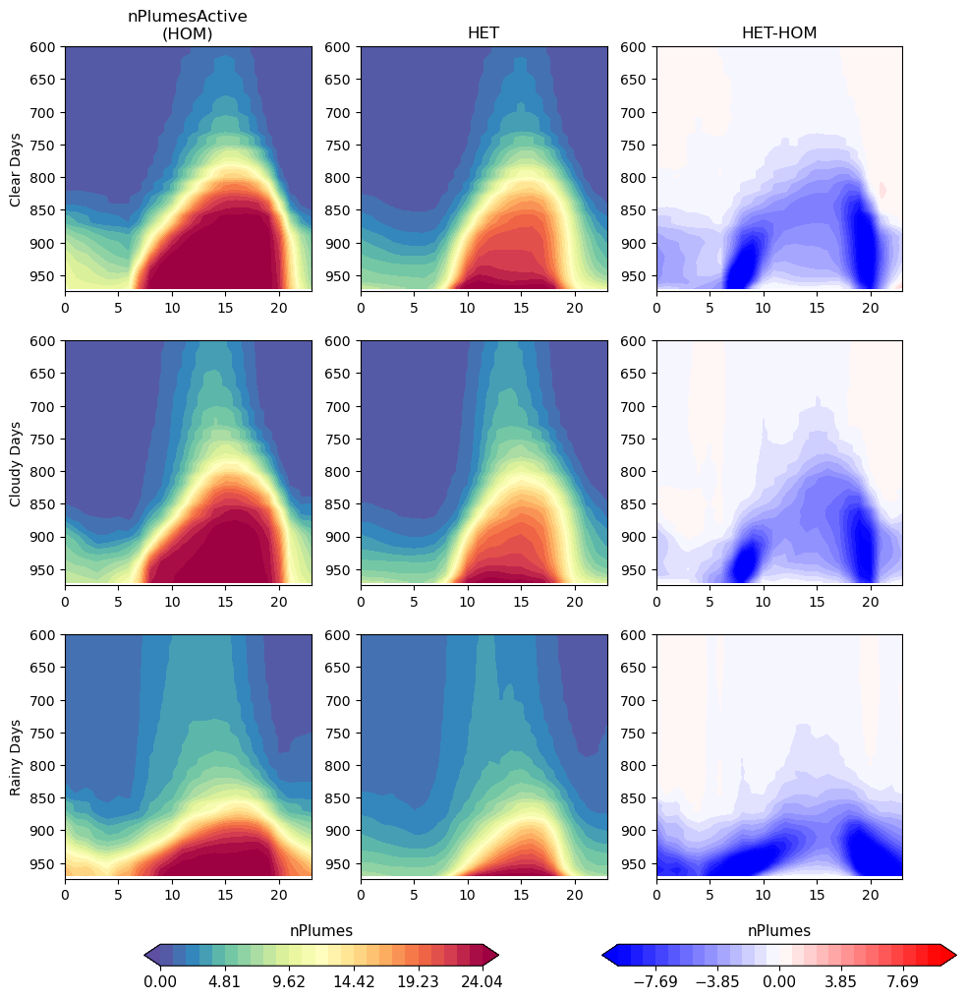

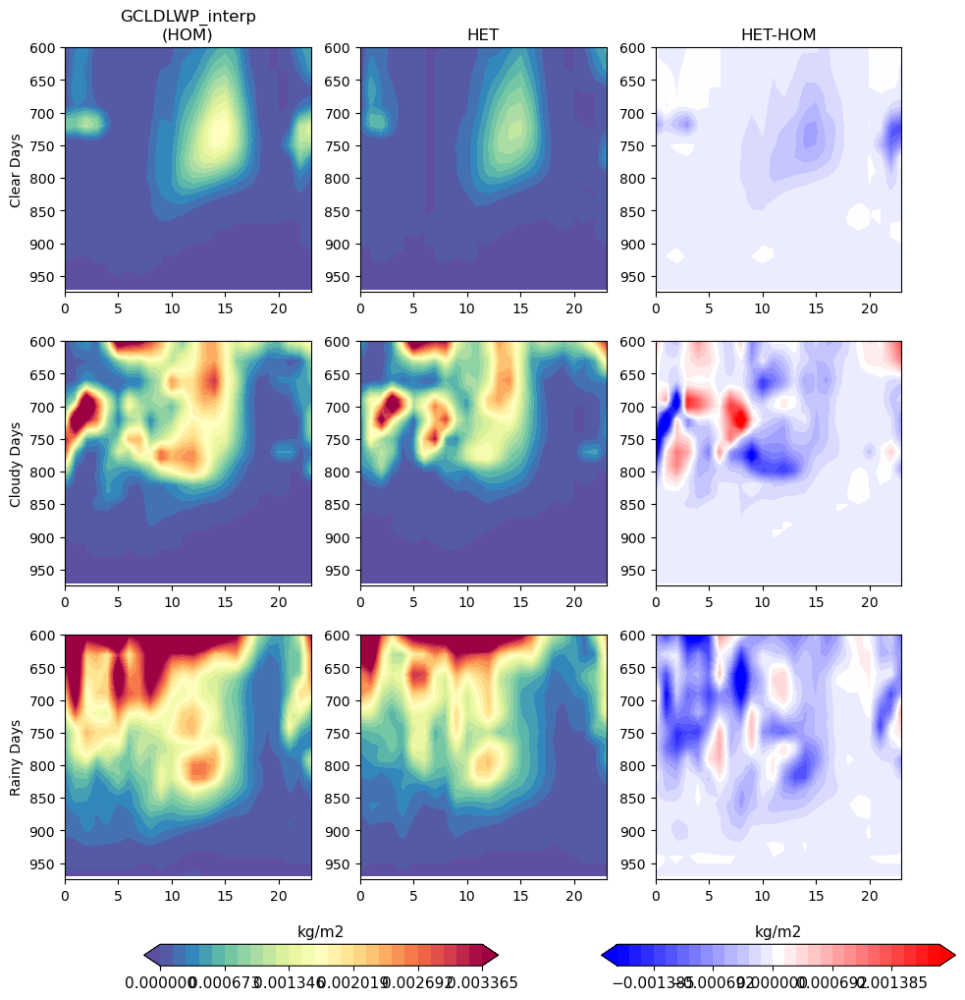

In [35]:
## ----- 3D CAM plots ----- #


hourlyDS_clear  = clear_h0_L250
hourlyDS_cloudy = cloudy_h0_L250
hourlyDS_rainy  = rainy_h0_L250

pltVars = ['Q_interp','T_interp','CLDLIQ_interp','CLOUD_interp','OMEGA_interp','nPlumesActive','GCLDLWP_interp']
          # 'nPlumesActive_grass','nPlumesActive_crop','nPlumesActive_urban','nPlumesActive_lake']

cMin    = [0.003,  278,    0.0,  0.0,    -0.1,    0,    0,  0,  0,  0,  0]
cMax    = [0.018,  307,   5e-5,  0.25,   0.15,    25,   3.5e-3,  10, 10, 10, 10]
diffMax = [0.00045, 0.45,  2.4e-5, 0.055, 0.01,   10,   1.8e-3,  10, 10, 10, 10]
unitsStr = [scamDS_h0_L250['Q'].units,     scamDS_h0_L250['T'].units,      scamDS_h0_L250['CLDLIQ'].units, 
            scamDS_h0_L250['CLOUD'].units, scamDS_h0_L250['OMEGA'].units, 'nPlumes', scamDS_h0_L250['GCLDLWP'].units, 
             'nPlumes',  'nPlumes',  'nPlumes',  'nPlumes']
maxLev  = 600.0

for iVar in range(len(pltVars)):  
    
    fig,axs = plt.subplots(3,3,figsize=(11,11))
    axs     = axs.ravel()

    ## Clear Days 
    axs[0].contourf(hourlyDS_clear['hour'].values, hourlyDS_clear['levInterp'].values, 
                       np.squeeze(hourlyDS_clear[pltVars[iVar]].isel(case=0)).transpose(),
                       np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
                       cmap='Spectral_r', extend='both')
    axs[1].contourf(hourlyDS_clear['hour'].values, hourlyDS_clear['levInterp'].values, 
                       np.squeeze(hourlyDS_clear[pltVars[iVar]].isel(case=1)).transpose(),
                       np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
                       cmap='Spectral_r', extend='both')
    
    diffVar = np.squeeze(hourlyDS_clear[pltVars[iVar]].isel(case=1)) - np.squeeze(hourlyDS_clear[pltVars[iVar]].isel(case=0))
    nstep = (2*diffMax[iVar])/26
    cplt = axs[2].contourf(hourlyDS_clear['hour'].values, hourlyDS_clear['levInterp'].values, 
                       diffVar.transpose(),
                       np.arange(-diffMax[iVar], diffMax[iVar]+nstep, nstep), 
                       cmap='bwr', extend='both')

    ## Cloudy Days 
    axs[3].contourf(hourlyDS_cloudy['hour'].values, hourlyDS_cloudy['levInterp'].values, 
                       np.squeeze(hourlyDS_cloudy[pltVars[iVar]].isel(case=0)).transpose(),
                       np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
                       cmap='Spectral_r', extend='both')
    axs[4].contourf(hourlyDS_cloudy['hour'].values, hourlyDS_cloudy['levInterp'].values, 
                       np.squeeze(hourlyDS_cloudy[pltVars[iVar]].isel(case=1)).transpose(),
                       np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
                       cmap='Spectral_r', extend='both')
    
    diffVar = np.squeeze(hourlyDS_cloudy[pltVars[iVar]].isel(case=1)) - np.squeeze(hourlyDS_cloudy[pltVars[iVar]].isel(case=0))
    nstep = (2*diffMax[iVar])/26
    cplt = axs[5].contourf(hourlyDS_cloudy['hour'].values, hourlyDS_cloudy['levInterp'].values, 
                       diffVar.transpose(),
                       np.arange(-diffMax[iVar], diffMax[iVar]+nstep, nstep), 
                       cmap='bwr', extend='both')    
    
    ## Rainy Days 
    axs[6].contourf(hourlyDS_rainy['hour'].values, hourlyDS_rainy['levInterp'].values, 
                       np.squeeze(hourlyDS_rainy[pltVars[iVar]].isel(case=0)).transpose(),
                       np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
                       cmap='Spectral_r', extend='both')
    cplt = axs[7].contourf(hourlyDS_rainy['hour'].values, hourlyDS_rainy['levInterp'].values, 
                       np.squeeze(hourlyDS_rainy[pltVars[iVar]].isel(case=1)).transpose(),
                       np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
                       cmap='Spectral_r', extend='both')
    # Add colorbar
    ax_position = axs[7].get_position()
    cbar_ax = fig.add_axes([ax_position.x0-0.2, ax_position.y0-0.08, ax_position.width+0.1, 0.02])
    # cbar = fig.colorbar(cplt, cax=cbar_ax, orientation='horizontal', format='%.1e')
    cbar = fig.colorbar(cplt, cax=cbar_ax, orientation='horizontal')
    cbar.ax.locator_params(nbins=6)
    cbar.ax.set_title(unitsStr[iVar], fontsize=11)
    cbar.ax.tick_params(labelsize=11) 

    
    diffVar = np.squeeze(hourlyDS_rainy[pltVars[iVar]].isel(case=1)) - np.squeeze(hourlyDS_rainy[pltVars[iVar]].isel(case=0))
    nstep = (2*diffMax[iVar])/26
    cplt = axs[8].contourf(hourlyDS_rainy['hour'].values, hourlyDS_cloudy['levInterp'].values, 
                       diffVar.transpose(),
                       np.arange(-diffMax[iVar], diffMax[iVar]+nstep, nstep), 
                       cmap='bwr', extend='both')    
    # Add colorbar
    ax_position = axs[8].get_position()
    cbar_ax = fig.add_axes([ax_position.x0-0.05, ax_position.y0-0.08, ax_position.width+0.1, 0.02])
    # cbar = fig.colorbar(cplt, cax=cbar_ax, orientation='horizontal', format='%.1e')
    cbar = fig.colorbar(cplt, cax=cbar_ax, orientation='horizontal')
    cbar.ax.locator_params(nbins=6)
    cbar.ax.set_title(unitsStr[iVar], fontsize=11)
    cbar.ax.tick_params(labelsize=11) 

    axs[0].set_title(pltVars[iVar]+'\n(HOM)')
    axs[1].set_title('HET')
    axs[2].set_title('HET-HOM')

    axs[0].set_ylabel('Clear Days')
    axs[3].set_ylabel('Cloudy Days')
    axs[6].set_ylabel('Rainy Days') 

    axs[0].invert_yaxis()
    axs[1].invert_yaxis()
    axs[2].invert_yaxis()
    axs[3].invert_yaxis()
    axs[4].invert_yaxis()
    axs[5].invert_yaxis()
    axs[6].invert_yaxis()
    axs[7].invert_yaxis()
    axs[8].invert_yaxis()

    axs[0].set_ylim([975,maxLev])
    axs[1].set_ylim([975,maxLev])
    axs[2].set_ylim([975,maxLev])
    axs[3].set_ylim([975,maxLev])
    axs[4].set_ylim([975,maxLev])
    axs[5].set_ylim([975,maxLev])
    axs[6].set_ylim([975,maxLev])
    axs[7].set_ylim([975,maxLev])
    axs[8].set_ylim([975,maxLev])


In [20]:
def getWeighted_hourlyDS2(DS, varWgt):
    wgts           = DS.upa_macmicAvg_interp.resample(time='1H').mean(dim='time').fillna(0)
    hourlyDS_wgted = DS[varWgt].resample(time='1H').mean(dim='time').weighted(wgts).mean(dim='nens').groupby('time.hour').mean(dim='time')

    return hourlyDS_wgted
    

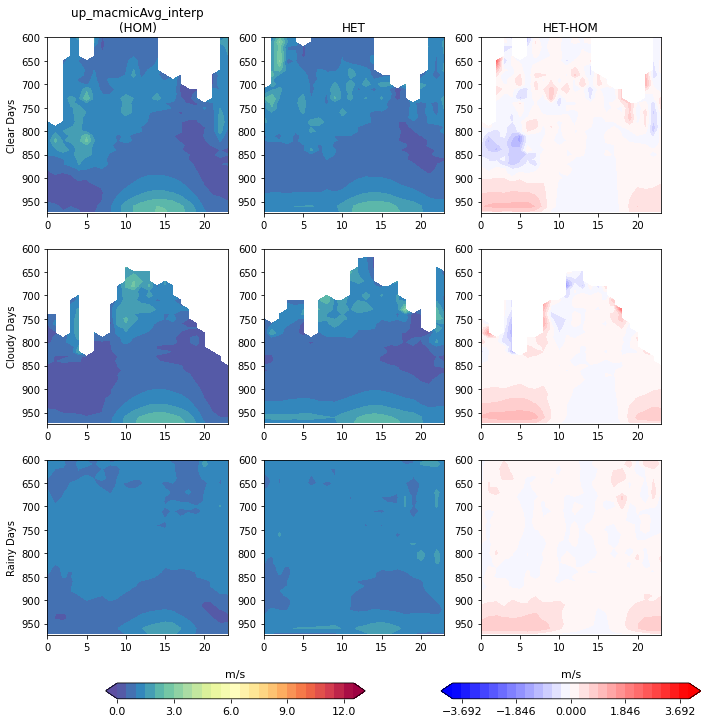

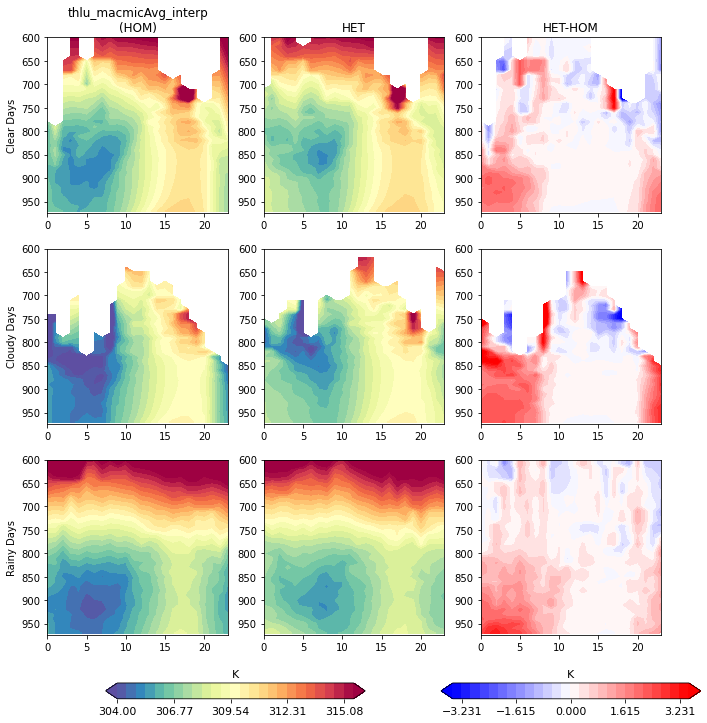

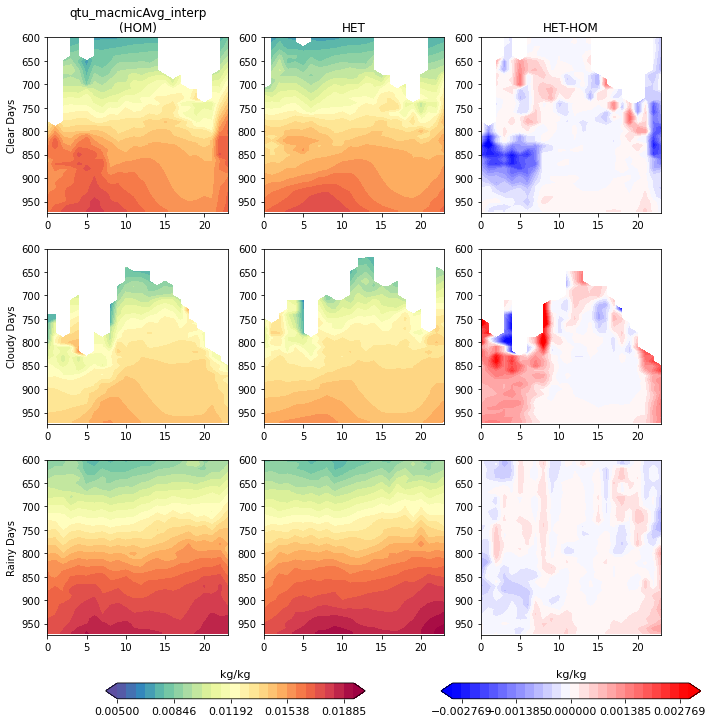

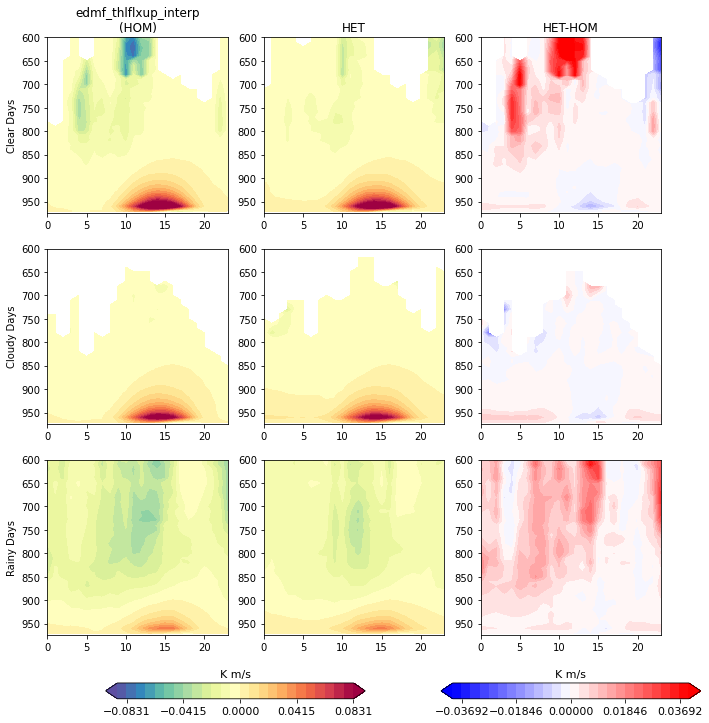

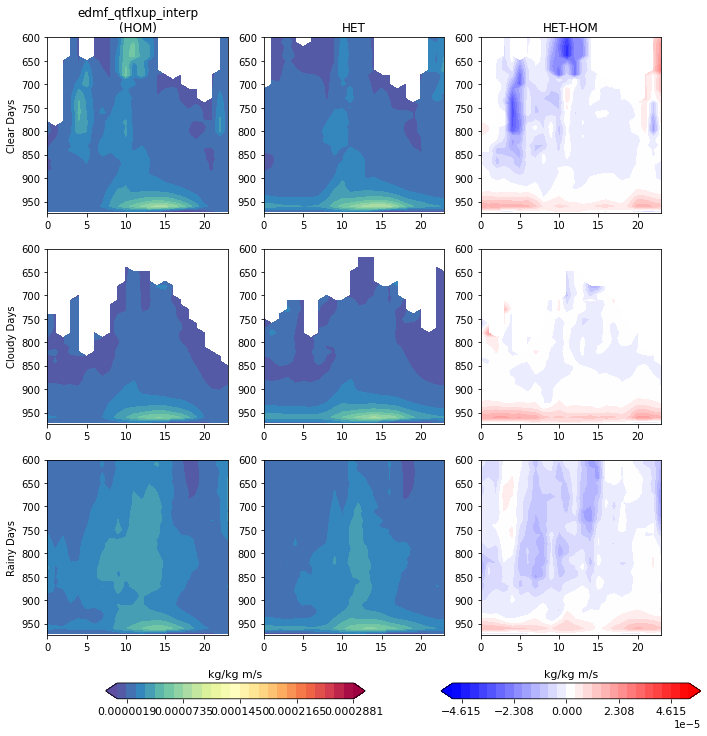

...

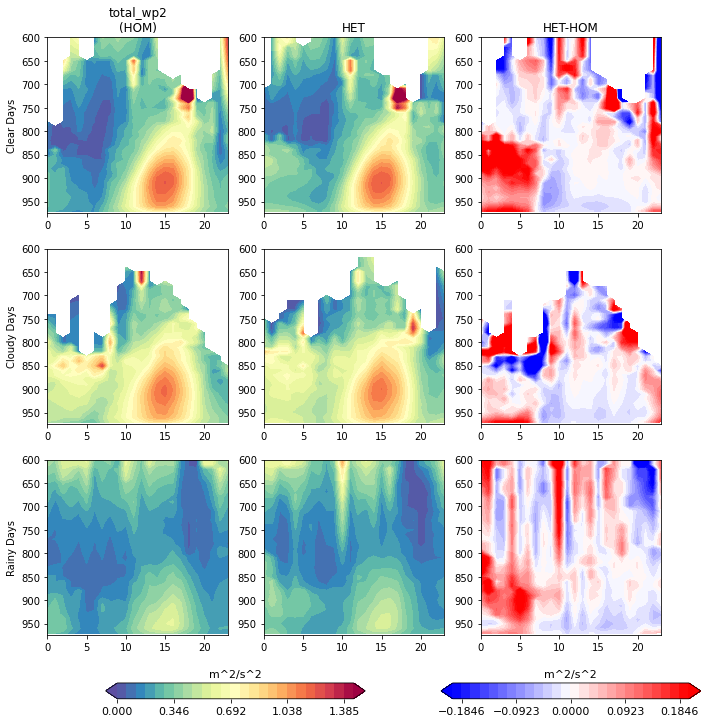

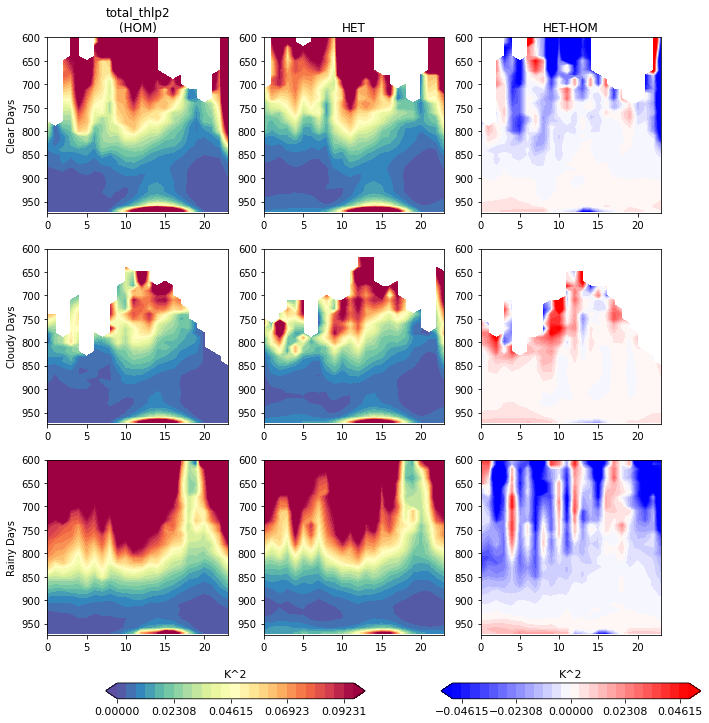

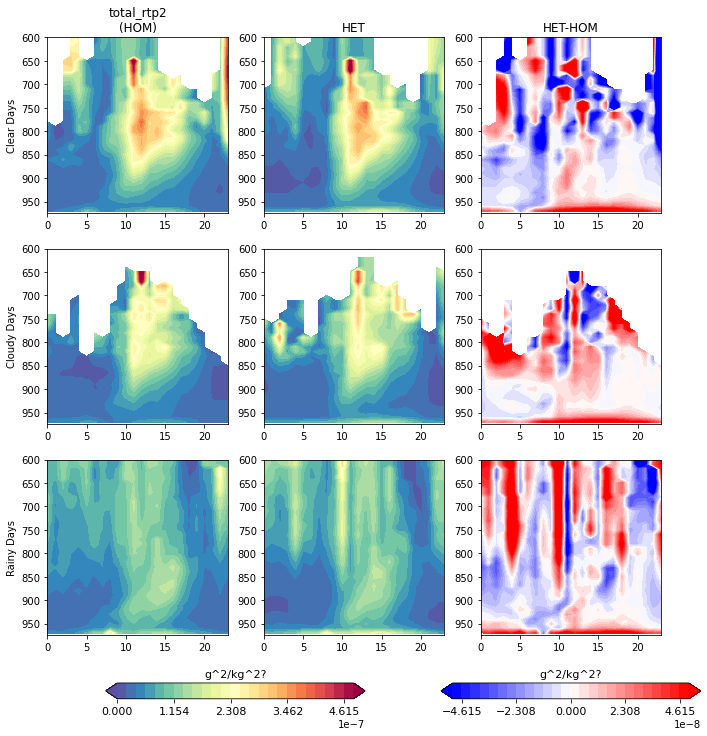

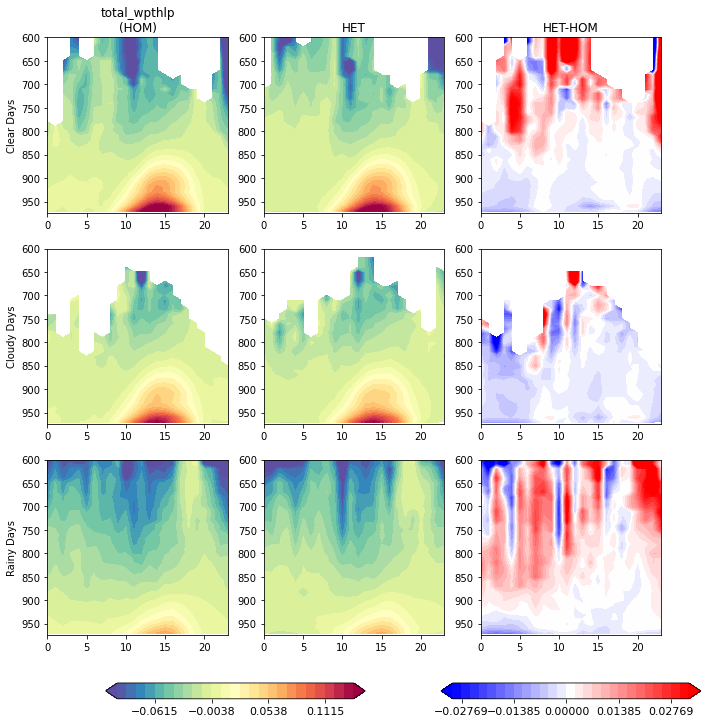

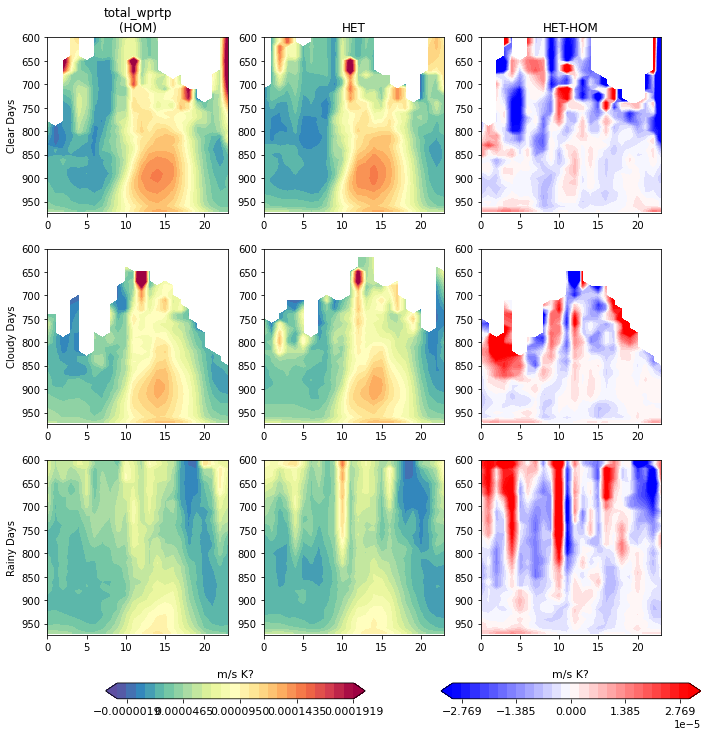

In [27]:
# hourlyDSraw_clear  = clearRaw_L50
# hourlyDSraw_cloudy = cloudyRaw_L50
# hourlyDSraw_rainy  = rainyRaw_L50

# # ----- 3D CAM plots ----- #
# pltVars = ['up_macmicAvg_interp','thlu_macmicAvg_interp','qtu_macmicAvg_interp',
#            'edmf_thlflxup_interp','edmf_qtflxup_interp','edmf_upbuoy_interp',
#            'total_wp2','total_thlp2','total_rtp2',
#            'total_wpthlp','total_wprtp',
#           ]

# cMin    = [0,    304,     5e-3,   -0.09,     -1e-5,     -0.01,    0.0,     0.0,    0.0,      -0.1,  -1e-5]
# cMax    = [13,    316,     0.02,    0.09,      3e-4,      0.08,    1.5,     0.1,   5e-7,     0.15,  2e-4]
# diffMax = [4,    3.5,    0.003,    0.04,      5e-5,      0.01,    0.2,    0.05,   5e-8,      0.03,  3e-5]
# unitsStr = ['m/s', 'K', 'kg/kg', 'K m/s', 'kg/kg m/s', 'm/s^2', 'm^2/s^2', 'K^2', 'g^2/kg^2?', '', 'm/s K?', 'm/s kg/kg?']
# maxLev  = 600.0


# for iVar in range(len(pltVars)): 
#     hourlyDS_clear  = getWeighted_hourlyDS2(hourlyDSraw_clear, [pltVars[iVar]])
#     hourlyDS_cloudy = getWeighted_hourlyDS2(hourlyDSraw_cloudy, [pltVars[iVar]])
#     hourlyDS_rainy  = getWeighted_hourlyDS2(hourlyDSraw_rainy, [pltVars[iVar]])
    
#     fig,axs = plt.subplots(3,3,figsize=(11,11))
#     axs     = axs.ravel()

#     ## Clear Days 
#     axs[0].contourf(hourlyDS_clear['hour'].values, hourlyDS_clear['levInterp'].values, 
#                        np.squeeze(hourlyDS_clear[pltVars[iVar]].isel(case=0)).transpose(),
#                        np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
#                        cmap='Spectral_r', extend='both')
#     axs[1].contourf(hourlyDS_clear['hour'].values, hourlyDS_clear['levInterp'].values, 
#                        np.squeeze(hourlyDS_clear[pltVars[iVar]].isel(case=1)).transpose(),
#                        np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
#                        cmap='Spectral_r', extend='both')
    
#     diffVar = np.squeeze(hourlyDS_clear[pltVars[iVar]].isel(case=1)) - np.squeeze(hourlyDS_clear[pltVars[iVar]].isel(case=0))
#     nstep = (2*diffMax[iVar])/26
#     cplt = axs[2].contourf(hourlyDS_clear['hour'].values, hourlyDS_clear['levInterp'].values, 
#                        diffVar.transpose(),
#                        np.arange(-diffMax[iVar], diffMax[iVar]+nstep, nstep), 
#                        cmap='bwr', extend='both')

#     ## Cloudy Days 
#     axs[3].contourf(hourlyDS_cloudy['hour'].values, hourlyDS_cloudy['levInterp'].values, 
#                        np.squeeze(hourlyDS_cloudy[pltVars[iVar]].isel(case=0)).transpose(),
#                        np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
#                        cmap='Spectral_r', extend='both')
#     axs[4].contourf(hourlyDS_cloudy['hour'].values, hourlyDS_cloudy['levInterp'].values, 
#                        np.squeeze(hourlyDS_cloudy[pltVars[iVar]].isel(case=1)).transpose(),
#                        np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
#                        cmap='Spectral_r', extend='both')
    
#     diffVar = np.squeeze(hourlyDS_cloudy[pltVars[iVar]].isel(case=1)) - np.squeeze(hourlyDS_cloudy[pltVars[iVar]].isel(case=0))
#     nstep = (2*diffMax[iVar])/26
#     cplt = axs[5].contourf(hourlyDS_cloudy['hour'].values, hourlyDS_cloudy['levInterp'].values, 
#                        diffVar.transpose(),
#                        np.arange(-diffMax[iVar], diffMax[iVar]+nstep, nstep), 
#                        cmap='bwr', extend='both')    
    
#     ## Rainy Days 
#     axs[6].contourf(hourlyDS_rainy['hour'].values, hourlyDS_rainy['levInterp'].values, 
#                        np.squeeze(hourlyDS_rainy[pltVars[iVar]].isel(case=0)).transpose(),
#                        np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
#                        cmap='Spectral_r', extend='both')
#     cplt = axs[7].contourf(hourlyDS_rainy['hour'].values, hourlyDS_rainy['levInterp'].values, 
#                        np.squeeze(hourlyDS_rainy[pltVars[iVar]].isel(case=1)).transpose(),
#                        np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
#                        cmap='Spectral_r', extend='both')
#     # Add colorbar
#     ax_position = axs[7].get_position()
#     cbar_ax = fig.add_axes([ax_position.x0-0.2, ax_position.y0-0.08, ax_position.width+0.1, 0.02])
#     cbar = fig.colorbar(cplt, cax=cbar_ax, orientation='horizontal')
#     cbar.ax.locator_params(nbins=6)
#     cbar.ax.set_title(unitsStr[iVar], fontsize=11)
#     cbar.ax.tick_params(labelsize=11) 

    
#     diffVar = np.squeeze(hourlyDS_rainy[pltVars[iVar]].isel(case=1)) - np.squeeze(hourlyDS_rainy[pltVars[iVar]].isel(case=0))
#     nstep = (2*diffMax[iVar])/26
#     cplt = axs[8].contourf(hourlyDS_rainy['hour'].values, hourlyDS_rainy['levInterp'].values, 
#                        diffVar.transpose(),
#                        np.arange(-diffMax[iVar], diffMax[iVar]+nstep, nstep), 
#                        cmap='bwr', extend='both')    
#     # Add colorbar
#     ax_position = axs[8].get_position()
#     cbar_ax = fig.add_axes([ax_position.x0-0.05, ax_position.y0-0.08, ax_position.width+0.1, 0.02])
#     cbar = fig.colorbar(cplt, cax=cbar_ax, orientation='horizontal')
#     cbar.ax.locator_params(nbins=6)
#     cbar.ax.set_title(unitsStr[iVar], fontsize=11)
#     cbar.ax.tick_params(labelsize=11) 

#     axs[0].set_title(pltVars[iVar]+'\n(HOM)')
#     axs[1].set_title('HET')
#     axs[2].set_title('HET-HOM')

#     axs[0].set_ylabel('Clear Days')
#     axs[3].set_ylabel('Cloudy Days')
#     axs[6].set_ylabel('Rainy Days') 
    
#     axs[0].invert_yaxis()
#     axs[1].invert_yaxis()
#     axs[2].invert_yaxis()
#     axs[3].invert_yaxis()
#     axs[4].invert_yaxis()
#     axs[5].invert_yaxis()
#     axs[6].invert_yaxis()
#     axs[7].invert_yaxis()
#     axs[8].invert_yaxis()

#     axs[0].set_ylim([975,maxLev])
#     axs[1].set_ylim([975,maxLev])
#     axs[2].set_ylim([975,maxLev])
#     axs[3].set_ylim([975,maxLev])
#     axs[4].set_ylim([975,maxLev])
#     axs[5].set_ylim([975,maxLev])
#     axs[6].set_ylim([975,maxLev])
#     axs[7].set_ylim([975,maxLev])
#     axs[8].set_ylim([975,maxLev])


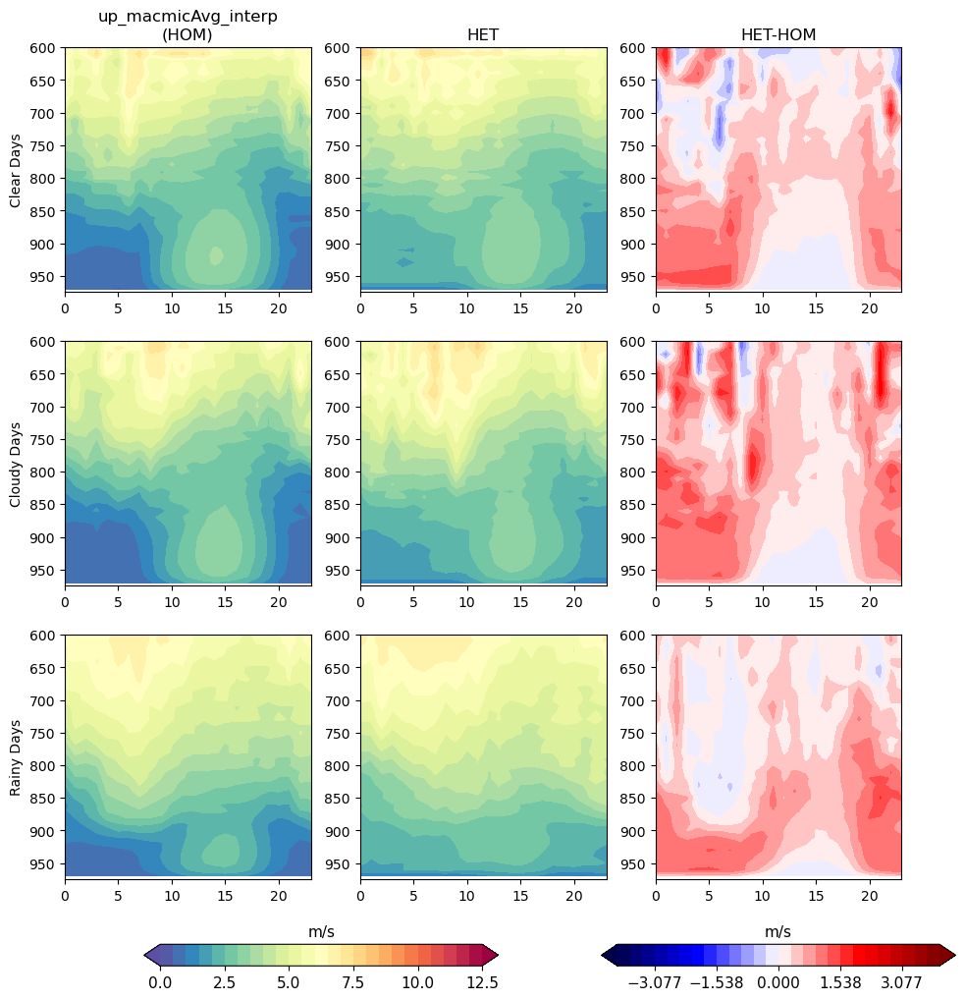

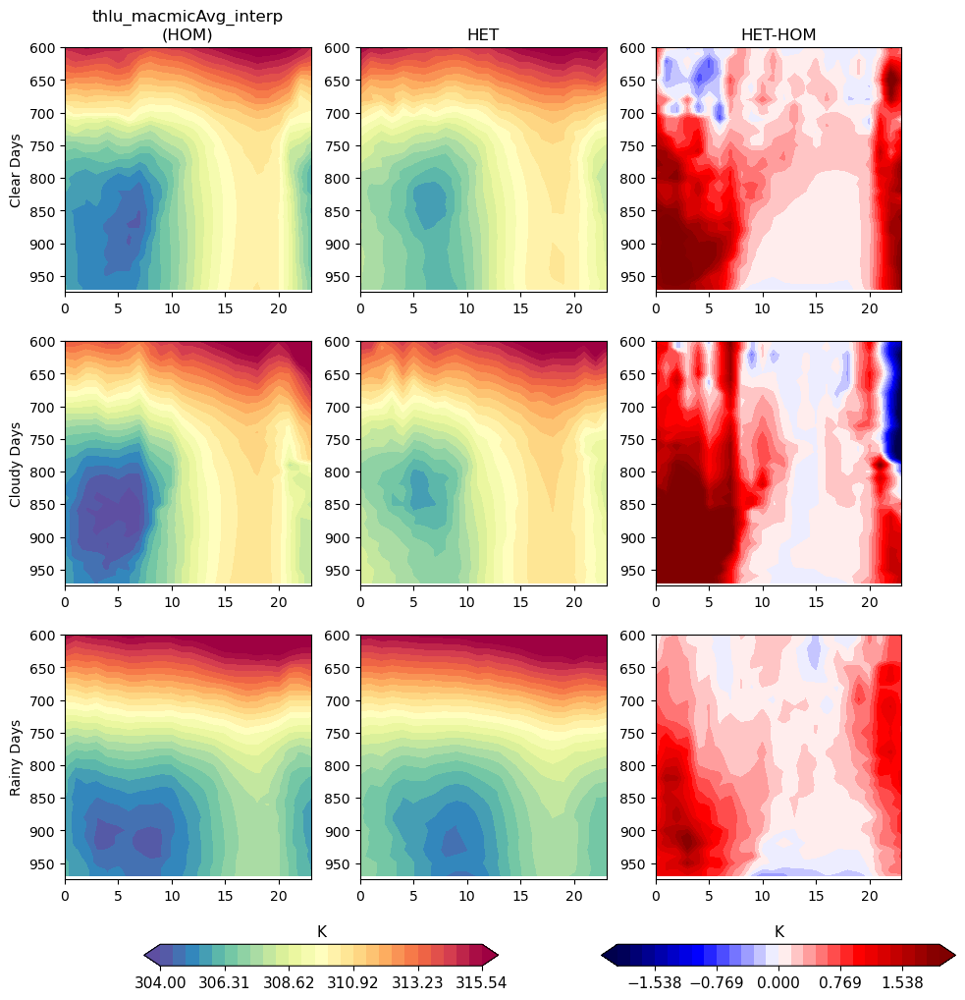

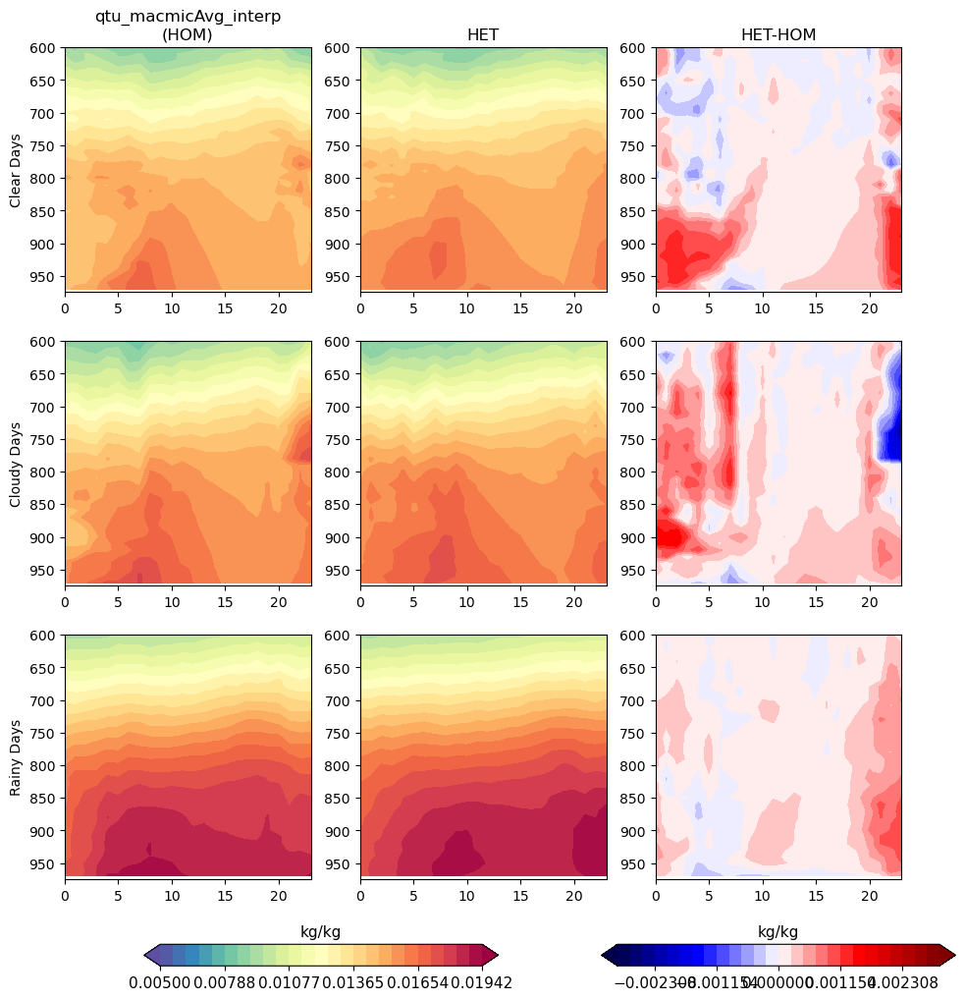

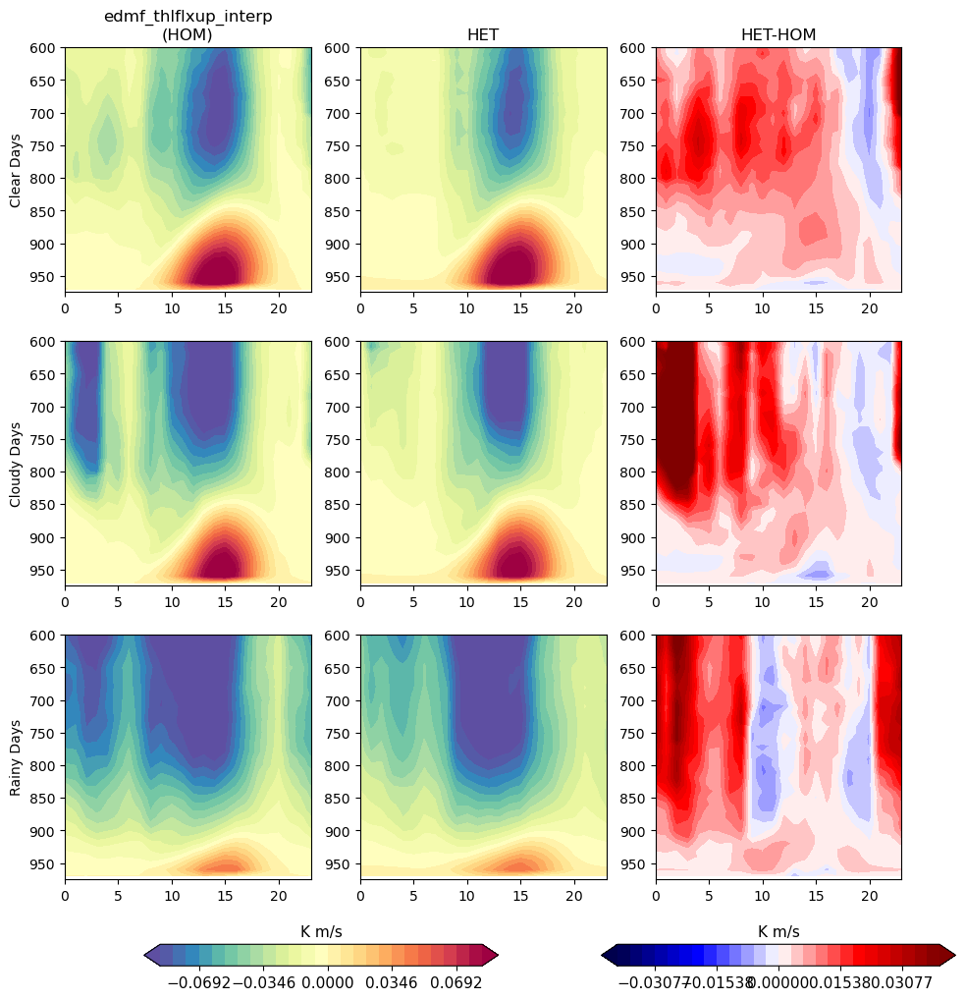

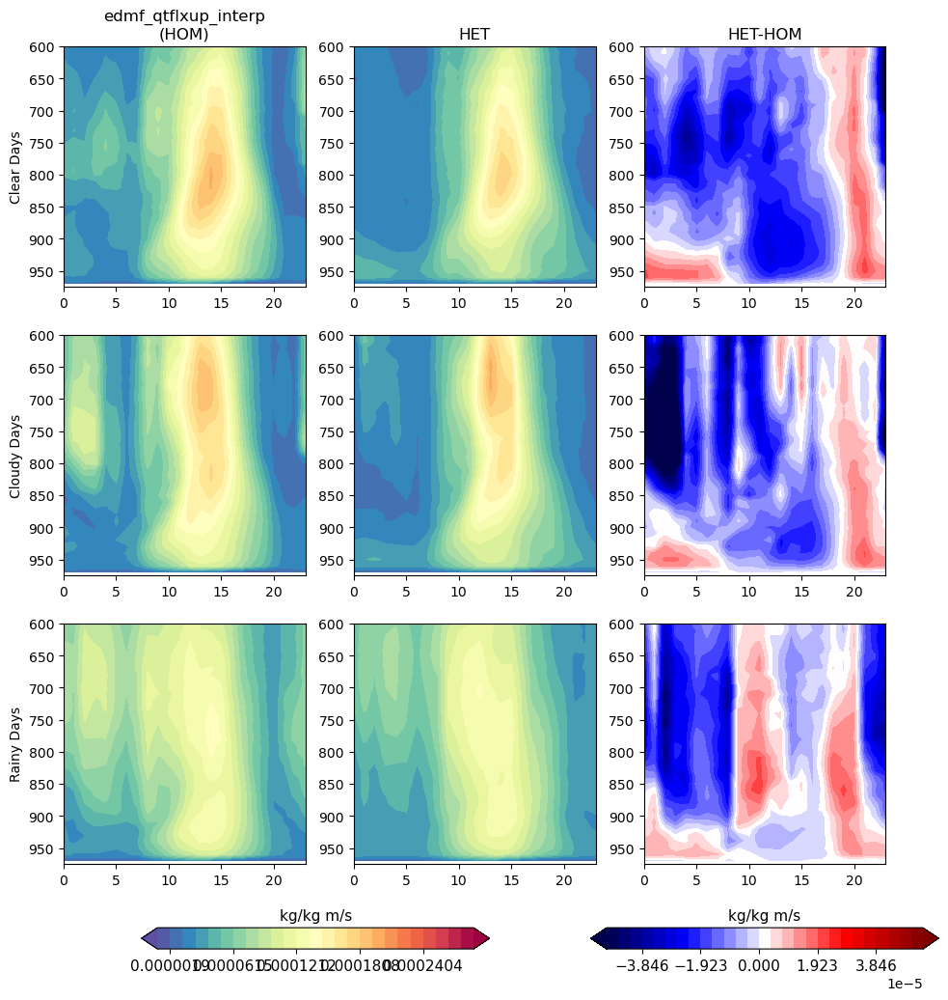

...

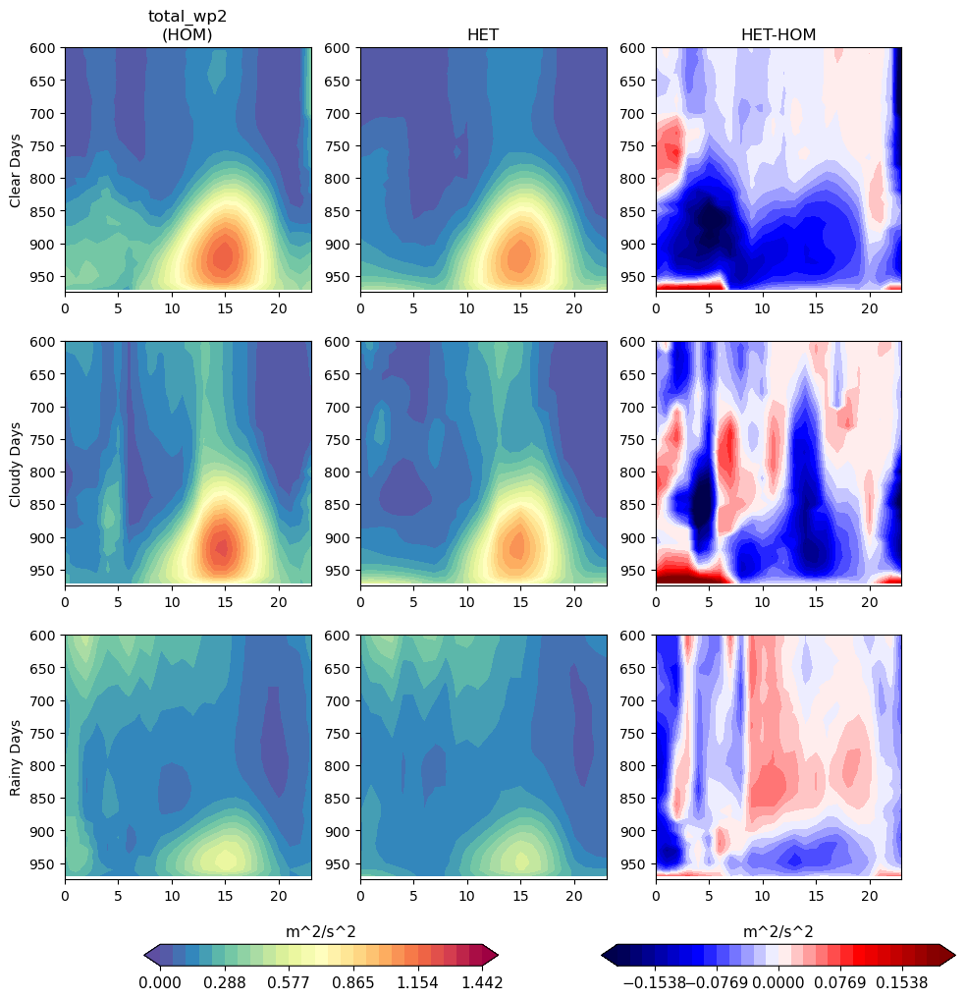

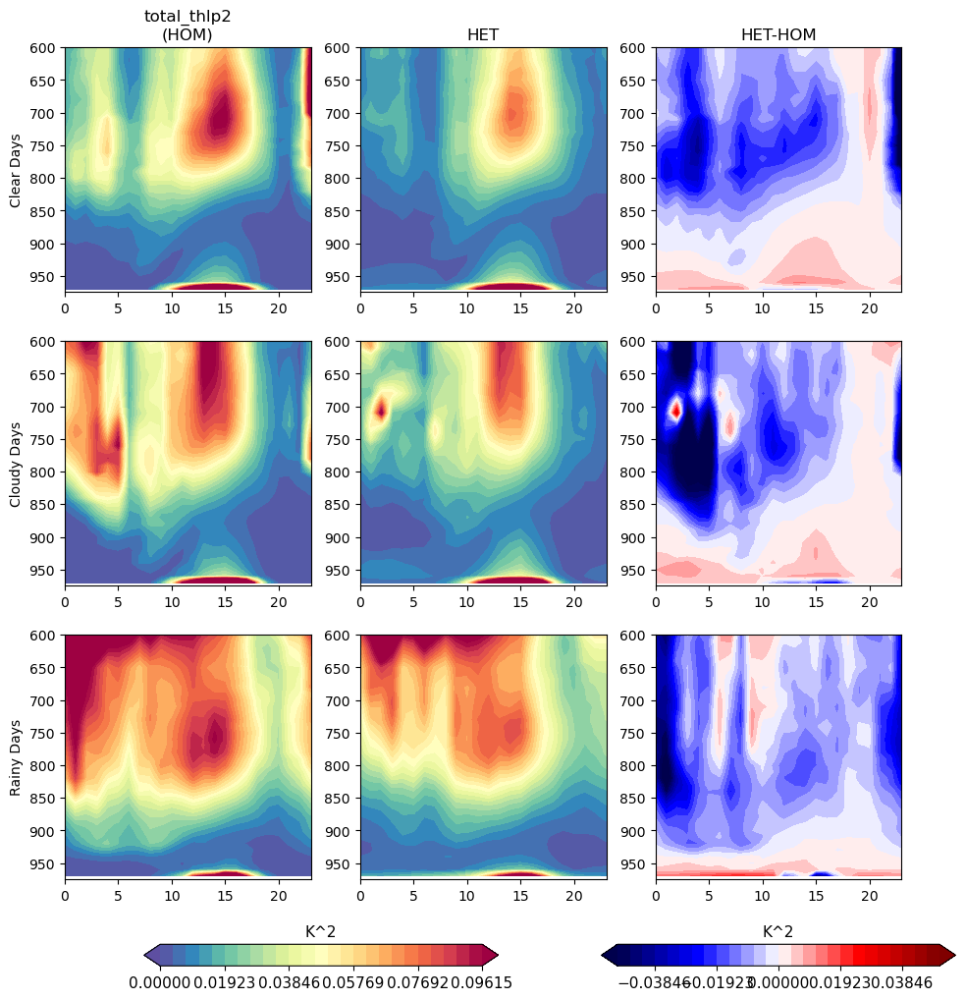

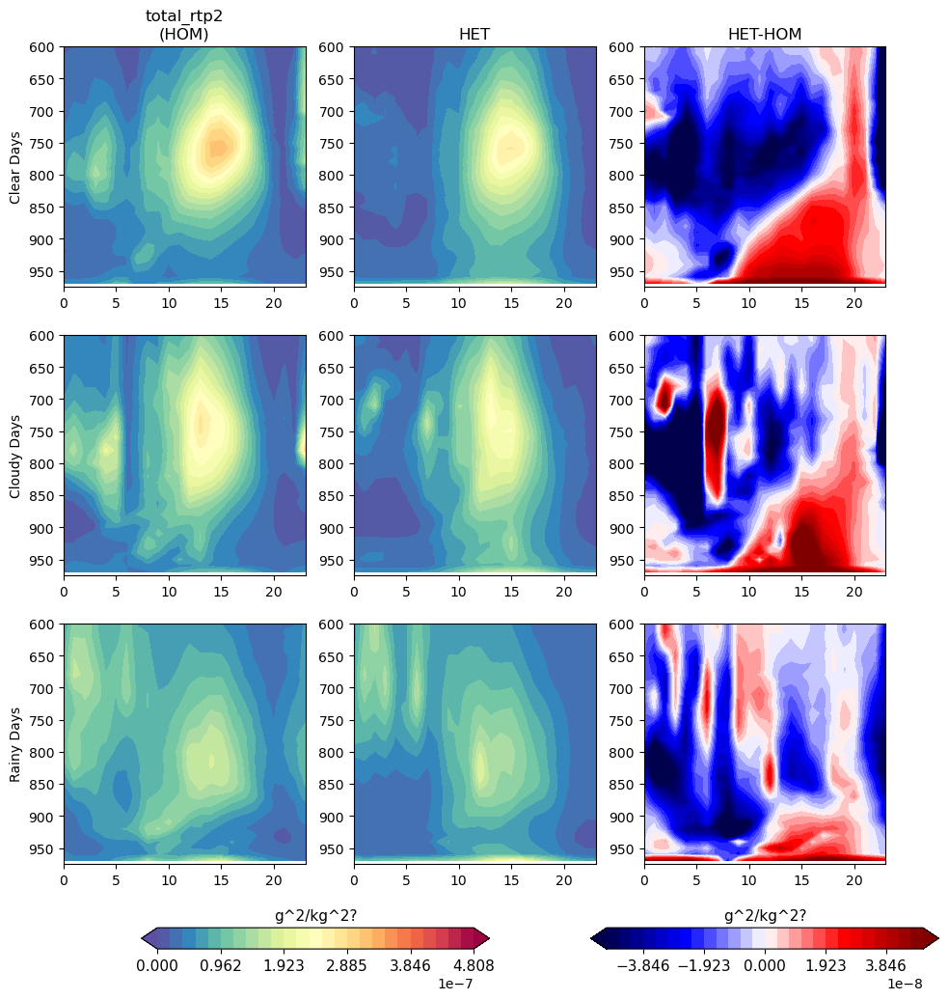

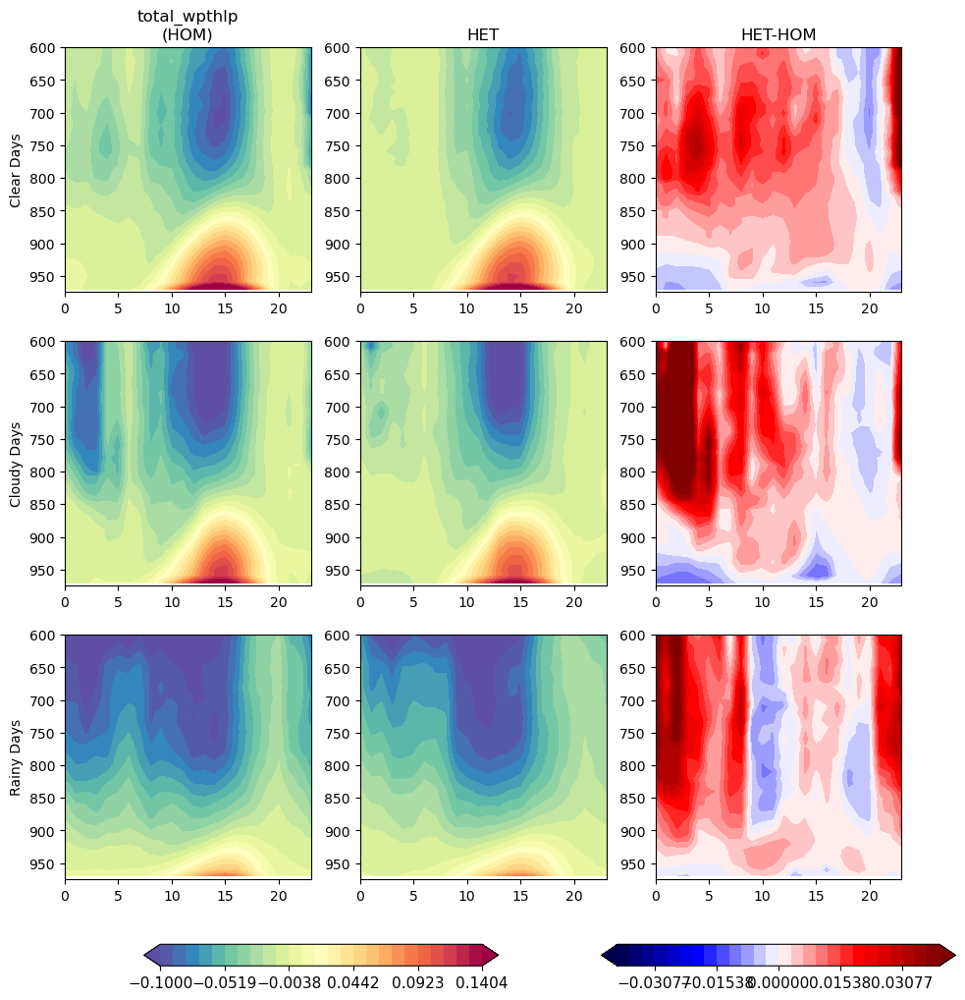

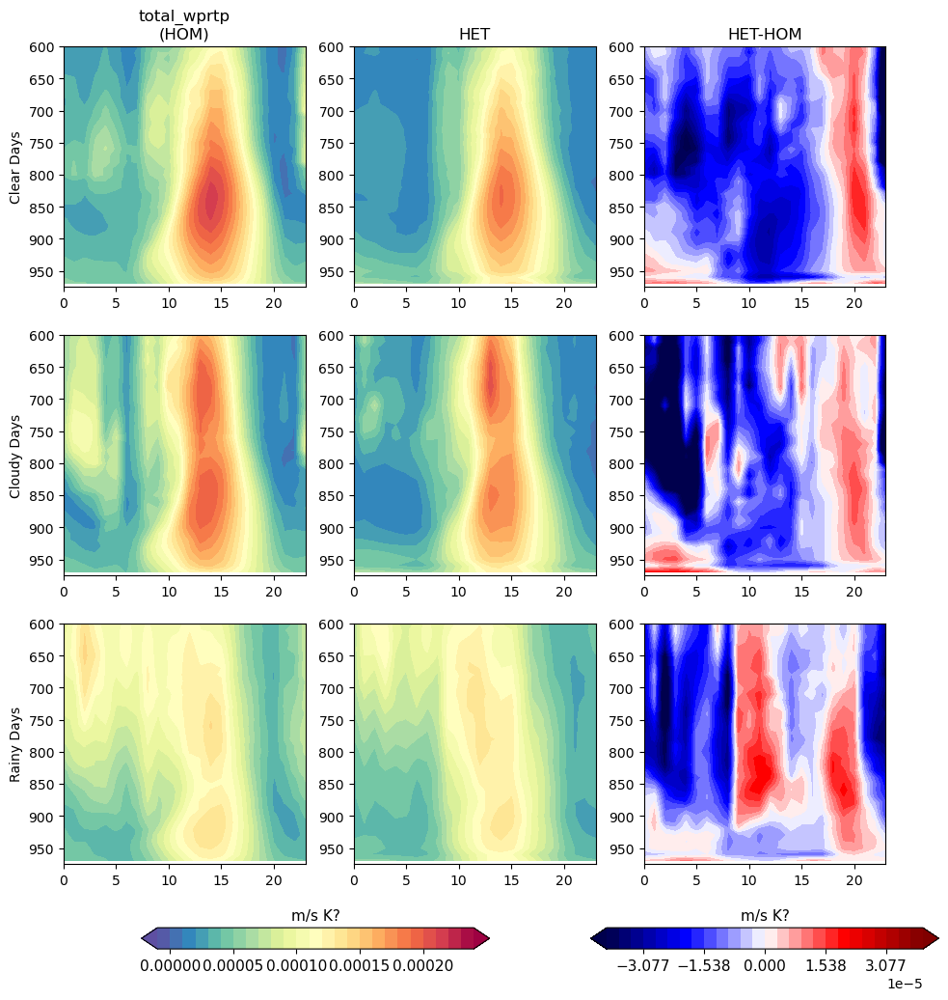

In [71]:
hourlyDSraw_clear  = clearRaw_L250
hourlyDSraw_cloudy = cloudyRaw_L250
hourlyDSraw_rainy  = rainyRaw_L250

# ----- 3D CAM plots ----- #
pltVars = ['up_macmicAvg_interp','thlu_macmicAvg_interp','qtu_macmicAvg_interp',
           'edmf_thlflxup_interp','edmf_qtflxup_interp','edmf_upbuoy_interp',
           'total_wp2','total_thlp2','total_rtp2',
           'total_wpthlp','total_wprtp',
          ]

cMin    = [0,     304,     5e-3,   -0.09,     -1e-5,     -0.01,    0.0,     0.0,    0.0,      -0.1, -1e-5]
cMax    = [13,    316,     0.02,    0.09,      3e-4,      0.08,    1.5,     0.1,   5e-7,       0.15,  2.5e-4]
diffMax = [4,     2.0,    0.003,    0.04,      5e-5,      0.01,    0.2,    0.05,   5e-8,       0.04,  4e-5]
unitsStr = ['m/s', 'K', 'kg/kg', 'K m/s', 'kg/kg m/s', 'm/s^2', 'm^2/s^2', 'K^2', 'g^2/kg^2?', '','m/s K?', 'm/s kg/kg?']
maxLev  = 600.0


for iVar in range(len(pltVars)): 
    hourlyDS_clear  = getWeighted_hourlyDS2(hourlyDSraw_clear, [pltVars[iVar]])
    hourlyDS_cloudy = getWeighted_hourlyDS2(hourlyDSraw_cloudy, [pltVars[iVar]])
    hourlyDS_rainy  = getWeighted_hourlyDS2(hourlyDSraw_rainy, [pltVars[iVar]])

    fig,axs = plt.subplots(3,3,figsize=(11,11))
    axs     = axs.ravel()

    ## Clear Days 
    axs[0].contourf(hourlyDS_clear['hour'].values, hourlyDS_clear['levInterp'].values, 
                       np.squeeze(hourlyDS_clear[pltVars[iVar]].isel(case=0)).transpose(),
                       np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
                       cmap='Spectral_r', extend='both')
    axs[1].contourf(hourlyDS_clear['hour'].values, hourlyDS_clear['levInterp'].values, 
                       np.squeeze(hourlyDS_clear[pltVars[iVar]].isel(case=1)).transpose(),
                       np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
                       cmap='Spectral_r', extend='both')
    
    diffVar = np.squeeze(hourlyDS_clear[pltVars[iVar]].isel(case=1)) - np.squeeze(hourlyDS_clear[pltVars[iVar]].isel(case=0))
    nstep = (2*diffMax[iVar])/26
    cplt = axs[2].contourf(hourlyDS_clear['hour'].values, hourlyDS_clear['levInterp'].values, 
                       diffVar.transpose(),
                       np.arange(-diffMax[iVar], diffMax[iVar]+nstep, nstep), 
                       cmap='seismic', extend='both')

    ## Cloudy Days 
    axs[3].contourf(hourlyDS_cloudy['hour'].values, hourlyDS_cloudy['levInterp'].values, 
                       np.squeeze(hourlyDS_cloudy[pltVars[iVar]].isel(case=0)).transpose(),
                       np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
                       cmap='Spectral_r', extend='both')
    axs[4].contourf(hourlyDS_cloudy['hour'].values, hourlyDS_cloudy['levInterp'].values, 
                       np.squeeze(hourlyDS_cloudy[pltVars[iVar]].isel(case=1)).transpose(),
                       np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
                       cmap='Spectral_r', extend='both')
    
    diffVar = np.squeeze(hourlyDS_cloudy[pltVars[iVar]].isel(case=1)) - np.squeeze(hourlyDS_cloudy[pltVars[iVar]].isel(case=0))
    nstep = (2*diffMax[iVar])/26
    cplt = axs[5].contourf(hourlyDS_cloudy['hour'].values, hourlyDS_cloudy['levInterp'].values, 
                       diffVar.transpose(),
                       np.arange(-diffMax[iVar], diffMax[iVar]+nstep, nstep), 
                       cmap='seismic', extend='both')    
    
    ## Rainy Days 
    axs[6].contourf(hourlyDS_rainy['hour'].values, hourlyDS_rainy['levInterp'].values, 
                       np.squeeze(hourlyDS_rainy[pltVars[iVar]].isel(case=0)).transpose(),
                       np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
                       cmap='Spectral_r', extend='both')
    cplt = axs[7].contourf(hourlyDS_rainy['hour'].values, hourlyDS_rainy['levInterp'].values, 
                       np.squeeze(hourlyDS_rainy[pltVars[iVar]].isel(case=1)).transpose(),
                       np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
                       cmap='Spectral_r', extend='both')
    # Add colorbar
    ax_position = axs[7].get_position()
    cbar_ax = fig.add_axes([ax_position.x0-0.2, ax_position.y0-0.08, ax_position.width+0.1, 0.02])
    cbar = fig.colorbar(cplt, cax=cbar_ax, orientation='horizontal')
    cbar.ax.locator_params(nbins=6)
    cbar.ax.set_title(unitsStr[iVar], fontsize=11)
    cbar.ax.tick_params(labelsize=11) 

    
    diffVar = np.squeeze(hourlyDS_rainy[pltVars[iVar]].isel(case=1)) - np.squeeze(hourlyDS_rainy[pltVars[iVar]].isel(case=0))
    nstep = (2*diffMax[iVar])/26
    cplt = axs[8].contourf(hourlyDS_rainy['hour'].values, hourlyDS_rainy['levInterp'].values, 
                       diffVar.transpose(),
                       np.arange(-diffMax[iVar], diffMax[iVar]+nstep, nstep), 
                       cmap='seismic', extend='both')    
    # Add colorbar
    ax_position = axs[8].get_position()
    cbar_ax = fig.add_axes([ax_position.x0-0.05, ax_position.y0-0.08, ax_position.width+0.1, 0.02])
    cbar = fig.colorbar(cplt, cax=cbar_ax, orientation='horizontal')
    cbar.ax.locator_params(nbins=6)
    cbar.ax.set_title(unitsStr[iVar], fontsize=11)
    cbar.ax.tick_params(labelsize=11) 

    axs[0].set_title(pltVars[iVar]+'\n(HOM)')
    axs[1].set_title('HET')
    axs[2].set_title('HET-HOM')

    axs[0].set_ylabel('Clear Days')
    axs[3].set_ylabel('Cloudy Days')
    axs[6].set_ylabel('Rainy Days') 
    
    axs[0].invert_yaxis()
    axs[1].invert_yaxis()
    axs[2].invert_yaxis()
    axs[3].invert_yaxis()
    axs[4].invert_yaxis()
    axs[5].invert_yaxis()
    axs[6].invert_yaxis()
    axs[7].invert_yaxis()
    axs[8].invert_yaxis()

    axs[0].set_ylim([975,maxLev])
    axs[1].set_ylim([975,maxLev])
    axs[2].set_ylim([975,maxLev])
    axs[3].set_ylim([975,maxLev])
    axs[4].set_ylim([975,maxLev])
    axs[5].set_ylim([975,maxLev])
    axs[6].set_ylim([975,maxLev])
    axs[7].set_ylim([975,maxLev])
    axs[8].set_ylim([975,maxLev])


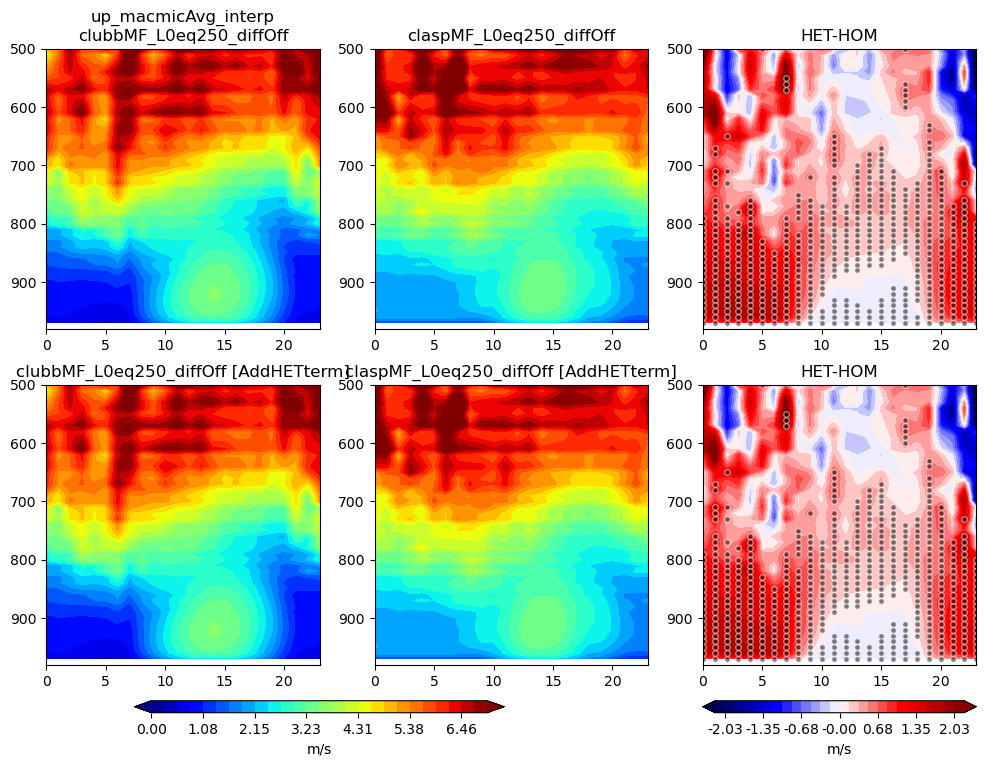

In [22]:
varPlot = 'up_macmicAvg_interp'
unitsStr = 'm/s'

cStep = (7-0)/26
clims = np.arange(0, 7+cStep, cStep)
dMax = 2.2
dStep = (2*dMax)/26
dlims = np.arange(-dMax, dMax+dStep, dStep)

axs = plots_timeHeight_weightMFplumes(clearRaw_L250, clearRaw_L250, 
                                      varPlot, unitsStr, clims, dlims, topLev,
                                       pltHET=True, cbarFormat='%.2f', cbTicks=7)


In [ ]:
hourlyDSraw_clear  = clearRaw_L250
hourlyDSraw_cloudy = cloudyRaw_L250
hourlyDSraw_rainy  = rainyRaw_L250

# ----- 3D CAM plots ----- #
pltVars = ['up_macmicAvg_interp','thlu_macmicAvg_interp','qtu_macmicAvg_interp',
           'edmf_thlflxup_interp','edmf_qtflxup_interp','edmf_upbuoy_interp',
           'total_wp2','total_thlp2','total_rtp2',
           'total_wpthlp','total_wprtp',
          ]

cMin    = [0,     304,     5e-3,   -0.09,     -1e-5,     -0.01,    0.0,     0.0,    0.0,      -0.1, -1e-5]
cMax    = [13,    316,     0.02,    0.09,      3e-4,      0.08,    1.5,     0.1,   5e-7,       0.15,  2.5e-4]
diffMax = [4,     2.0,    0.003,    0.04,      5e-5,      0.01,    0.2,    0.05,   5e-8,       0.04,  4e-5]
unitsStr = ['m/s', 'K', 'kg/kg', 'K m/s', 'kg/kg m/s', 'm/s^2', 'm^2/s^2', 'K^2', 'g^2/kg^2?', '','m/s K?', 'm/s kg/kg?']
maxLev  = 600.0


for iVar in range(len(pltVars)): 
    hourlyDS_clear  = getWeighted_hourlyDS2(hourlyDSraw_clear, [pltVars[iVar]])
    hourlyDS_cloudy = getWeighted_hourlyDS2(hourlyDSraw_cloudy, [pltVars[iVar]])
    hourlyDS_rainy  = getWeighted_hourlyDS2(hourlyDSraw_rainy, [pltVars[iVar]])

    fig,axs = plt.subplots(3,3,figsize=(11,11))
    axs     = axs.ravel()

    ## Clear Days 
    axs[0].contourf(hourlyDS_clear['hour'].values, hourlyDS_clear['levInterp'].values, 
                       np.squeeze(hourlyDS_clear[pltVars[iVar]].isel(case=0)).transpose(),
                       np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
                       cmap='Spectral_r', extend='both')
    axs[1].contourf(hourlyDS_clear['hour'].values, hourlyDS_clear['levInterp'].values, 
                       np.squeeze(hourlyDS_clear[pltVars[iVar]].isel(case=1)).transpose(),
                       np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
                       cmap='Spectral_r', extend='both')
    
    diffVar = np.squeeze(hourlyDS_clear[pltVars[iVar]].isel(case=1)) - np.squeeze(hourlyDS_clear[pltVars[iVar]].isel(case=0))
    nstep = (2*diffMax[iVar])/26
    cplt = axs[2].contourf(hourlyDS_clear['hour'].values, hourlyDS_clear['levInterp'].values, 
                       diffVar.transpose(),
                       np.arange(-diffMax[iVar], diffMax[iVar]+nstep, nstep), 
                       cmap='seismic', extend='both')

    ## Cloudy Days 
    axs[3].contourf(hourlyDS_cloudy['hour'].values, hourlyDS_cloudy['levInterp'].values, 
                       np.squeeze(hourlyDS_cloudy[pltVars[iVar]].isel(case=0)).transpose(),
                       np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
                       cmap='Spectral_r', extend='both')
    axs[4].contourf(hourlyDS_cloudy['hour'].values, hourlyDS_cloudy['levInterp'].values, 
                       np.squeeze(hourlyDS_cloudy[pltVars[iVar]].isel(case=1)).transpose(),
                       np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
                       cmap='Spectral_r', extend='both')
    
    diffVar = np.squeeze(hourlyDS_cloudy[pltVars[iVar]].isel(case=1)) - np.squeeze(hourlyDS_cloudy[pltVars[iVar]].isel(case=0))
    nstep = (2*diffMax[iVar])/26
    cplt = axs[5].contourf(hourlyDS_cloudy['hour'].values, hourlyDS_cloudy['levInterp'].values, 
                       diffVar.transpose(),
                       np.arange(-diffMax[iVar], diffMax[iVar]+nstep, nstep), 
                       cmap='seismic', extend='both')    
    
    ## Rainy Days 
    axs[6].contourf(hourlyDS_rainy['hour'].values, hourlyDS_rainy['levInterp'].values, 
                       np.squeeze(hourlyDS_rainy[pltVars[iVar]].isel(case=0)).transpose(),
                       np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
                       cmap='Spectral_r', extend='both')
    cplt = axs[7].contourf(hourlyDS_rainy['hour'].values, hourlyDS_rainy['levInterp'].values, 
                       np.squeeze(hourlyDS_rainy[pltVars[iVar]].isel(case=1)).transpose(),
                       np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
                       cmap='Spectral_r', extend='both')
    # Add colorbar
    ax_position = axs[7].get_position()
    cbar_ax = fig.add_axes([ax_position.x0-0.2, ax_position.y0-0.08, ax_position.width+0.1, 0.02])
    cbar = fig.colorbar(cplt, cax=cbar_ax, orientation='horizontal')
    cbar.ax.locator_params(nbins=6)
    cbar.ax.set_title(unitsStr[iVar], fontsize=11)
    cbar.ax.tick_params(labelsize=11) 

    
    diffVar = np.squeeze(hourlyDS_rainy[pltVars[iVar]].isel(case=1)) - np.squeeze(hourlyDS_rainy[pltVars[iVar]].isel(case=0))
    nstep = (2*diffMax[iVar])/26
    cplt = axs[8].contourf(hourlyDS_rainy['hour'].values, hourlyDS_rainy['levInterp'].values, 
                       diffVar.transpose(),
                       np.arange(-diffMax[iVar], diffMax[iVar]+nstep, nstep), 
                       cmap='seismic', extend='both')    
    # Add colorbar
    ax_position = axs[8].get_position()
    cbar_ax = fig.add_axes([ax_position.x0-0.05, ax_position.y0-0.08, ax_position.width+0.1, 0.02])
    cbar = fig.colorbar(cplt, cax=cbar_ax, orientation='horizontal')
    cbar.ax.locator_params(nbins=6)
    cbar.ax.set_title(unitsStr[iVar], fontsize=11)
    cbar.ax.tick_params(labelsize=11) 

    axs[0].set_title(pltVars[iVar]+'\n(HOM)')
    axs[1].set_title('HET')
    axs[2].set_title('HET-HOM')

    axs[0].set_ylabel('Clear Days')
    axs[3].set_ylabel('Cloudy Days')
    axs[6].set_ylabel('Rainy Days') 
    
    axs[0].invert_yaxis()
    axs[1].invert_yaxis()
    axs[2].invert_yaxis()
    axs[3].invert_yaxis()
    axs[4].invert_yaxis()
    axs[5].invert_yaxis()
    axs[6].invert_yaxis()
    axs[7].invert_yaxis()
    axs[8].invert_yaxis()

    axs[0].set_ylim([975,maxLev])
    axs[1].set_ylim([975,maxLev])
    axs[2].set_ylim([975,maxLev])
    axs[3].set_ylim([975,maxLev])
    axs[4].set_ylim([975,maxLev])
    axs[5].set_ylim([975,maxLev])
    axs[6].set_ylim([975,maxLev])
    axs[7].set_ylim([975,maxLev])
    axs[8].set_ylim([975,maxLev])


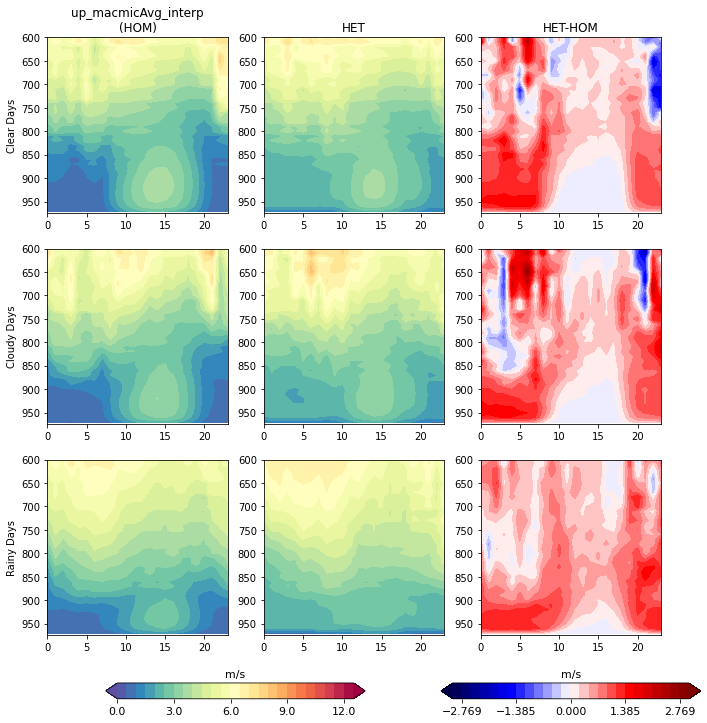

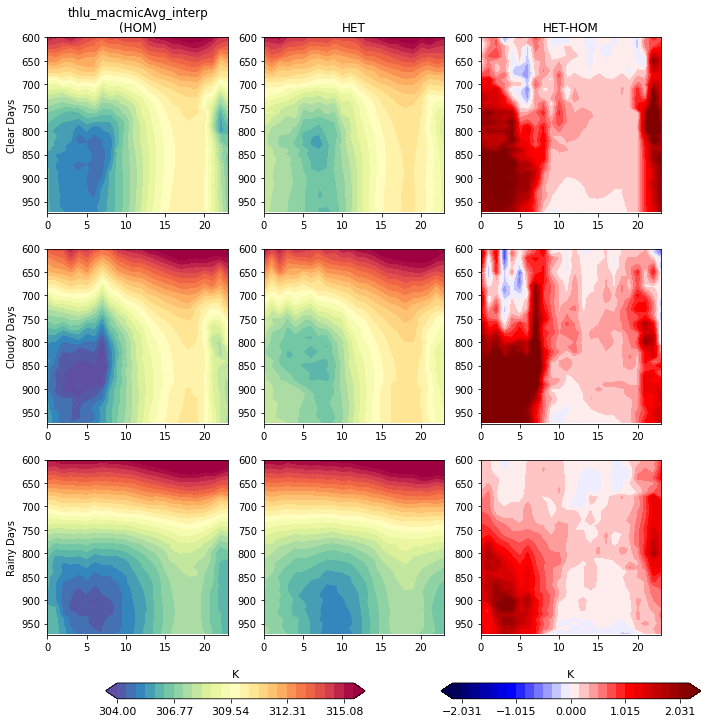

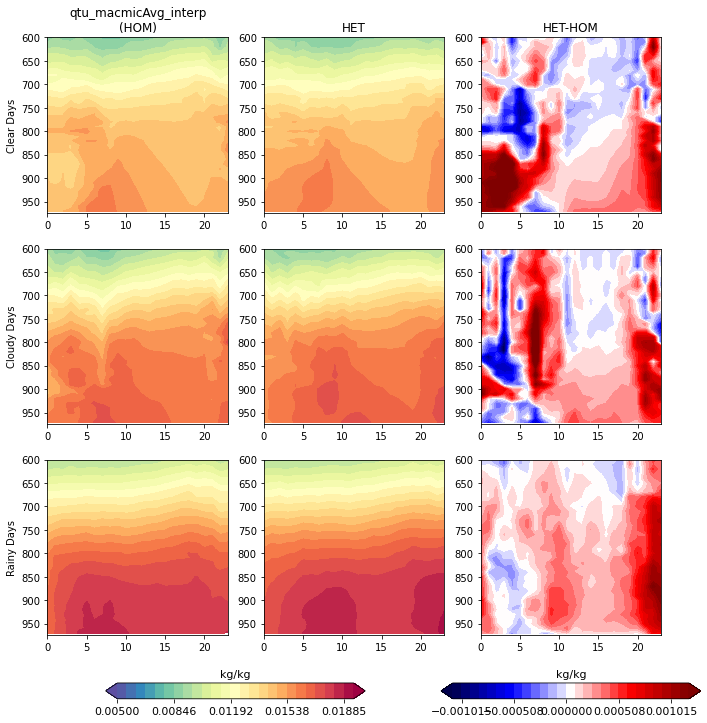

In [99]:

# ----- 3D CAM plots ----- #
pltVars = ['up_macmicAvg_interp','thlu_macmicAvg_interp','qtu_macmicAvg_interp',
           # 'edmf_thlflxup_interp','edmf_qtflxup_interp','edmf_upbuoy_interp',
           # 'total_wp2','total_thlp2','total_rtp2',
           # 'total_wpthlp','total_wprtp',
          ]

cMin    = [0,     304,     5e-3]   
           # -0.09,     -1e-5,     -0.01,    0.0,     0.0,    0.0,     -0.02]
cMax    = [13,    316,     0.02]    
           # 0.09,      3e-4,      0.08,    1.5,     0.1,   5e-7,      0.02]
diffMax = [3,     2.2,   11e-4]    
           # 0.04,      5e-5,      0.01,    0.2,    0.05,   5e-8,     0.005]
unitsStr = ['m/s', 'K', 'kg/kg']
            # 'K m/s', 'kg/kg m/s', 'm/s^2', 'm^2/s^2', 'K^2', 'g^2/kg^2?', '']
maxLev  = 600.0

for iVar in range(len(pltVars)): 
    hourlyDS_clear  = getWeighted_hourlyDS2(hourlyDSraw_clear, [pltVars[iVar]])
    hourlyDS_cloudy = getWeighted_hourlyDS2(hourlyDSraw_cloudy, [pltVars[iVar]])
    hourlyDS_rainy  = getWeighted_hourlyDS2(hourlyDSraw_rainy, [pltVars[iVar]])

    fig,axs = plt.subplots(3,3,figsize=(11,11))
    axs     = axs.ravel()

    ## Clear Days 
    axs[0].contourf(hourlyDS_clear['hour'].values, hourlyDS_clear['levInterp'].values, 
                       np.squeeze(hourlyDS_clear[pltVars[iVar]].isel(case=0)).transpose(),
                       np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
                       cmap='Spectral_r', extend='both')
    axs[1].contourf(hourlyDS_clear['hour'].values, hourlyDS_clear['levInterp'].values, 
                       np.squeeze(hourlyDS_clear[pltVars[iVar]].isel(case=1)).transpose(),
                       np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
                       cmap='Spectral_r', extend='both')
    
    diffVar = np.squeeze(hourlyDS_clear[pltVars[iVar]].isel(case=1)) - np.squeeze(hourlyDS_clear[pltVars[iVar]].isel(case=0))
    nstep = (2*diffMax[iVar])/26
    cplt = axs[2].contourf(hourlyDS_clear['hour'].values, hourlyDS_clear['levInterp'].values, 
                       diffVar.transpose(),
                       np.arange(-diffMax[iVar], diffMax[iVar]+nstep, nstep), 
                       cmap='seismic', extend='both')

    ## Cloudy Days 
    axs[3].contourf(hourlyDS_cloudy['hour'].values, hourlyDS_cloudy['levInterp'].values, 
                       np.squeeze(hourlyDS_cloudy[pltVars[iVar]].isel(case=0)).transpose(),
                       np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
                       cmap='Spectral_r', extend='both')
    axs[4].contourf(hourlyDS_cloudy['hour'].values, hourlyDS_cloudy['levInterp'].values, 
                       np.squeeze(hourlyDS_cloudy[pltVars[iVar]].isel(case=1)).transpose(),
                       np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
                       cmap='Spectral_r', extend='both')
    
    diffVar = np.squeeze(hourlyDS_cloudy[pltVars[iVar]].isel(case=1)) - np.squeeze(hourlyDS_cloudy[pltVars[iVar]].isel(case=0))
    nstep = (2*diffMax[iVar])/26
    cplt = axs[5].contourf(hourlyDS_cloudy['hour'].values, hourlyDS_cloudy['levInterp'].values, 
                       diffVar.transpose(),
                       np.arange(-diffMax[iVar], diffMax[iVar]+nstep, nstep), 
                       cmap='seismic', extend='both')    
    
    ## Rainy Days 
    axs[6].contourf(hourlyDS_rainy['hour'].values, hourlyDS_rainy['levInterp'].values, 
                       np.squeeze(hourlyDS_rainy[pltVars[iVar]].isel(case=0)).transpose(),
                       np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
                       cmap='Spectral_r', extend='both')
    cplt = axs[7].contourf(hourlyDS_rainy['hour'].values, hourlyDS_rainy['levInterp'].values, 
                       np.squeeze(hourlyDS_rainy[pltVars[iVar]].isel(case=1)).transpose(),
                       np.arange(cMin[iVar], cMax[iVar], (cMax[iVar]-cMin[iVar])/26), 
                       cmap='Spectral_r', extend='both')
    # Add colorbar
    ax_position = axs[7].get_position()
    cbar_ax = fig.add_axes([ax_position.x0-0.2, ax_position.y0-0.08, ax_position.width+0.1, 0.02])
    cbar = fig.colorbar(cplt, cax=cbar_ax, orientation='horizontal')
    cbar.ax.locator_params(nbins=6)
    cbar.ax.set_title(unitsStr[iVar], fontsize=11)
    cbar.ax.tick_params(labelsize=11) 

    
    diffVar = np.squeeze(hourlyDS_rainy[pltVars[iVar]].isel(case=1)) - np.squeeze(hourlyDS_rainy[pltVars[iVar]].isel(case=0))
    nstep = (2*diffMax[iVar])/26
    cplt = axs[8].contourf(hourlyDS_rainy['hour'].values, hourlyDS_rainy['levInterp'].values, 
                       diffVar.transpose(),
                       np.arange(-diffMax[iVar], diffMax[iVar]+nstep, nstep), 
                       cmap='seismic', extend='both')    
    # Add colorbar
    ax_position = axs[8].get_position()
    cbar_ax = fig.add_axes([ax_position.x0-0.05, ax_position.y0-0.08, ax_position.width+0.1, 0.02])
    cbar = fig.colorbar(cplt, cax=cbar_ax, orientation='horizontal')
    cbar.ax.locator_params(nbins=6)
    cbar.ax.set_title(unitsStr[iVar], fontsize=11)
    cbar.ax.tick_params(labelsize=11) 

    axs[0].set_title(pltVars[iVar]+'\n(HOM)')
    axs[1].set_title('HET')
    axs[2].set_title('HET-HOM')

    axs[0].set_ylabel('Clear Days')
    axs[3].set_ylabel('Cloudy Days')
    axs[6].set_ylabel('Rainy Days') 
    
    axs[0].invert_yaxis()
    axs[1].invert_yaxis()
    axs[2].invert_yaxis()
    axs[3].invert_yaxis()
    axs[4].invert_yaxis()
    axs[5].invert_yaxis()
    axs[6].invert_yaxis()
    axs[7].invert_yaxis()
    axs[8].invert_yaxis()

    axs[0].set_ylim([975,maxLev])
    axs[1].set_ylim([975,maxLev])
    axs[2].set_ylim([975,maxLev])
    axs[3].set_ylim([975,maxLev])
    axs[4].set_ylim([975,maxLev])
    axs[5].set_ylim([975,maxLev])
    axs[6].set_ylim([975,maxLev])
    axs[7].set_ylim([975,maxLev])
    axs[8].set_ylim([975,maxLev])


**What about days where HET changes the categorization?**

In [23]:
## Use something similar to Meng's definition of clear/cloudy/rain days 

def getDayClassIndividual_DS(DSuse, DSuse_h2): 

    q_var = 'CLDLIQ_interp'
    q_ctl  = DSuse.isel(case=0)[q_var]
    q_test = DSuse.isel(case=1)[q_var]

    p_var = 'PRECT'
    p_ctl  = DSuse.isel(case=0)[p_var]
    p_test = DSuse.isel(case=1)[p_var]

    minHr = 6
    maxHr = 18

    selHours = np.where( (DSuse['time.hour'].values>=minHr) & (DSuse['time.hour'].values<=maxHr) )[0]

    levSel   = np.where((DSuse.levInterp.values>600))[0]

    # Daily mean rain rate in right units:
    p_dailyMean = p_ctl.isel(time=selHours).resample(time='1D').mean(dim='time')*1e3*86400
    p_dailyMean_test = p_test.isel(time=selHours).resample(time='1D').mean(dim='time')*1e3*86400

    # Select lower levels
    q_dailyMax      = q_ctl.isel(levInterp=levSel, time=selHours).resample(time='1D').mean(dim='time').max(dim='levInterp')
    q_dailyMax_test = q_test.isel(levInterp=levSel, time=selHours).resample(time='1D').mean(dim='time').max(dim='levInterp')

    # Consistently use percentiles across cases, though numbers will vary
    # plim = np.nanpercentile(p_dailyMean, 60)  #mm/day
    # qlim = np.nanpercentile(q_dailyMax,  60) #kg/kg
    plim = np.nanpercentile(p_dailyMean, 75)  #mm/day
    qlim = np.nanpercentile(q_dailyMax,  50) #kg/kg

    print('Precip limit (75th percentile): ', plim)
    
    # Define days using their indices...
    iRainDay_ctl  = np.where(  (p_dailyMean >= plim) )[0]
    iCloudDay_ctl = np.where( (p_dailyMean < plim) & (q_dailyMax>=qlim) )[0]
    iClearDay_ctl = np.where( (p_dailyMean < plim) & (q_dailyMax<qlim) )[0]

    iRainDay_test  = np.where( (p_dailyMean_test >= plim) )[0]
    iCloudDay_test = np.where( (p_dailyMean_test < plim) & (q_dailyMax_test>=qlim))[0]
    iClearDay_test = np.where( (p_dailyMean_test < plim) & (q_dailyMax_test<qlim))[0]
     
        
    ctl_labels = np.full([len(p_dailyMean_test.time.values)], 'Missing')
    test_labels = np.full([len(p_dailyMean_test.time.values)], 'Missing')
    
    ctl_labels[iRainDay_ctl]  = 'Rain'
    ctl_labels[iCloudDay_ctl] = 'Cloud'
    ctl_labels[iClearDay_ctl] = 'Clear'
    
    test_labels[iRainDay_test]  = 'Rain'
    test_labels[iCloudDay_test] = 'Cloud'
    test_labels[iClearDay_test] = 'Clear'
    
    dates = p_dailyMean_test.time.values
        
    return dates,ctl_labels,test_labels


In [24]:
dates50,ctl50_labels,test50_labels = getDayClassIndividual_DS(scamDS_h0_L50, scamDS_h2_L50)
print()
dates250,ctl250_labels,test250_labels = getDayClassIndividual_DS(scamDS_h0_L250, scamDS_h2_L250)


Precip limit (75th percentile):  3.8288158597424626

Precip limit (75th percentile):  5.002586462069303


In [25]:
print('               L0 = 50m')
print('       Date     CTRL    TEST')
count_notMatch = 0

for iDay in range(len(ctl50_labels)):
    
    if ctl50_labels[iDay]==test50_labels[iDay]: 
        if ctl50_labels[iDay]!='Missing':
            print('\033[1;32m %12s %6s %8s' % (str(dates50[iDay])[0:11], ctl50_labels[iDay], test50_labels[iDay]) ) 
    else: 
        print('\033[1;31m %12s %6s %8s' % (str(dates50[iDay])[0:11], ctl50_labels[iDay], test50_labels[iDay]) )
        count_notMatch = count_notMatch+1

print('Number of days that classify differently: ', count_notMatch)

               L0 = 50m
       Date     CTRL    TEST
  2015-06-02T  Cloud    Cloud
  2015-06-03T  Clear    Clear
  2015-06-04T  Cloud    Clear
  2015-06-05T  Cloud    Cloud
  2015-06-06T  Clear    Clear
  2015-06-07T  Cloud    Cloud
  2015-06-08T  Cloud    Cloud
  2015-06-09T  Clear    Clear
  2015-06-10T  Clear    Clear
  2015-06-11T  Cloud    Cloud
  2015-06-12T   Rain     Rain
  2015-06-13T   Rain     Rain
  2015-06-14T   Rain     Rain
  2015-06-15T   Rain     Rain
  2015-06-16T   Rain     Rain
  2015-06-17T  Clear    Clear
  2015-06-18T   Rain     Rain
  2015-06-19T  Cloud    Cloud
  2015-06-20T  Clear    Cloud
  2015-06-21T  Cloud    Cloud
  2015-06-22T  Cloud    Cloud
  2015-06-23T  Cloud    Cloud
  2015-06-24T  Cloud    Cloud
  2015-06-25T  Cloud    Cloud
  2015-06-26T  Clear    Cloud
  2015-06-27T  Clear    Clear
  2015-06-28T  Clear    Clear
  2015-06-29T  Clear    Clear
  2015-06-30T  Clear    Clear
  2015-07-01T  Clear    Clear
  2015-07-02T   Rain     Rain
  2015-07-03T  Cl

In [26]:
print('               L0 = 250m')
print('       Date     CTRL    TEST')
count_notMatch = 0
for iDay in range(len(ctl250_labels)):
    
    if ctl250_labels[iDay]==test250_labels[iDay]: 
        if ctl250_labels[iDay]!='Missing':
            print('\033[1;32m %12s %6s %8s' % (str(dates250[iDay])[0:11], ctl250_labels[iDay], test250_labels[iDay]) ) 
    else: 
        print('\033[1;31m %12s %6s %8s' % (str(dates250[iDay])[0:11], ctl250_labels[iDay], test250_labels[iDay]) )
        count_notMatch = count_notMatch+1

print('Number of days that classify differently: ', count_notMatch)

               L0 = 250m
       Date     CTRL    TEST
  2015-06-02T  Clear    Clear
  2015-06-03T  Clear    Clear
  2015-06-04T  Clear    Clear
  2015-06-05T  Cloud    Cloud
  2015-06-06T  Clear    Clear
  2015-06-07T  Clear    Clear
  2015-06-08T  Cloud    Clear
  2015-06-09T  Clear    Clear
  2015-06-10T  Clear    Clear
  2015-06-11T  Cloud    Cloud
  2015-06-12T   Rain     Rain
  2015-06-13T   Rain     Rain
  2015-06-14T   Rain     Rain
  2015-06-15T   Rain     Rain
  2015-06-16T   Rain     Rain
  2015-06-17T   Rain     Rain
  2015-06-18T   Rain     Rain
  2015-06-19T  Clear    Clear
  2015-06-20T  Clear    Clear
  2015-06-21T  Cloud    Clear
  2015-06-22T  Cloud    Clear
  2015-06-23T  Cloud    Cloud
  2015-06-24T  Clear    Clear
  2015-06-25T  Clear    Clear
  2015-06-26T   Rain     Rain
  2015-06-27T  Clear    Clear
  2015-06-28T  Cloud    Cloud
  2015-06-29T  Clear    Clear
  2015-06-30T  Clear    Clear
  2015-07-01T  Cloud    Cloud
  2015-07-02T   Rain     Rain
  2015-07-03T   

**Figure out a way to get plume info?**

In [27]:
## Create day-type label array for all times, but only with dates where it's the same between cases to align with above 

dates50  = pd.DatetimeIndex(dates50)
dates250 = pd.DatetimeIndex(dates250)

dayLabels_L50  = np.full([len(scamDS_h2_L50.time.values)], 'NotAMatch')
dayLabels_L250 = np.full([len(scamDS_h2_L50.time.values)], 'NotAMatch')

for iTime in range(len(ctl50_labels)): 
    
    ## Same category in HOM and HET? And not just 'missing'? 
    if ctl50_labels[iTime]==test50_labels[iTime]: 
        if ctl50_labels[iTime]!='Missing':
            thisDay = dates50[iTime]
            iTimesMatch = np.where((scamDS_h2_L50['time.year'].values==thisDay.year) & 
                                   (scamDS_h2_L50['time.month'].values==thisDay.month) &
                                   (scamDS_h2_L50['time.day'].values==thisDay.day))[0]
            dayLabels_L50[iTimesMatch]  = ctl50_labels[iTime]
            
    
    ## Same category in HOM and HET? And not just 'missing'? 
    if ctl250_labels[iTime]==test250_labels[iTime]: 
        if ctl250_labels[iTime]!='Missing':
            thisDay = dates250[iTime]
            iTimesMatch = np.where((scamDS_h2_L250['time.year'].values==thisDay.year) & 
                                   (scamDS_h2_L250['time.month'].values==thisDay.month) &
                                   (scamDS_h2_L250['time.day'].values==thisDay.day))[0]
            dayLabels_L250[iTimesMatch]  = ctl250_labels[iTime]


In [28]:
scamDS_h2_L50['DayLabel'] = (('time'), dayLabels_L50)

In [29]:
scamDS_h2_L250['DayLabel'] = (('time'), dayLabels_L250)

Text(0.5, 1.0, '')

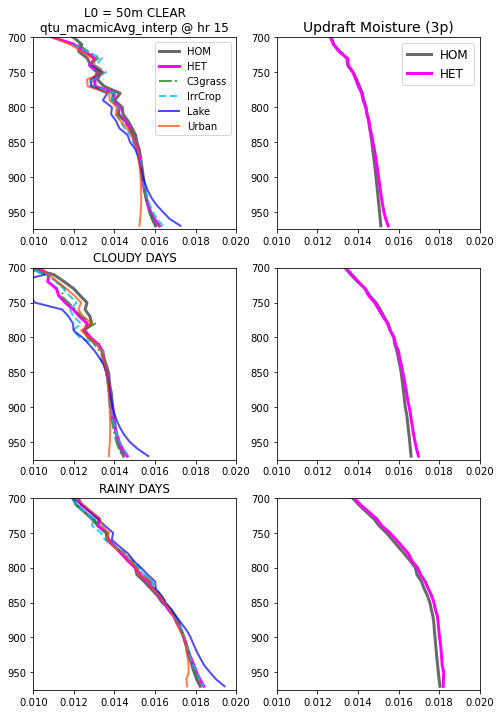

In [43]:
hrSel = 15

# varSel = 'up_macmicAvg_interp'
# xMin = 0
# xMax = 6

# varSel = 'thlu_macmicAvg_interp'
# # xMin = 303  # 3a
# # xMax = 310 
# xMin = 305  # 3p
# xMax = 313 

# varSel = 'edmf_upbuoy_interp'

varSel = 'qtu_macmicAvg_interp'
xMin = 0.010
xMax = 0.02

fig,axs = plt.subplots(3,2,figsize=(8,12))
axs     = axs.ravel() 

# - - - - - - - - - - - - 
# L50 
# - - - - - - - - - - - - 

## HOM 
thisHr_L50_HOM = scamDS_h2_L50.isel(time=np.where(scamDS_h2_L50['time.hour']==hrSel)[0]).isel(case=0)
homVarWgt = thisHr_L50_HOM['upa_macmicAvg_interp'].where(thisHr_L50_HOM.plumeLabel == 'SurfaceAvg').fillna(0)

homVar_clear  = thisHr_L50_HOM[varSel].where(thisHr_L50_HOM.plumeLabel == 'SurfaceAvg').weighted(homVarWgt).mean(dim='nens').where(thisHr_L50_HOM.DayLabel == 'Clear').resample(time='1H').mean().mean(dim='time')
homVar_cloud  = thisHr_L50_HOM[varSel].where(thisHr_L50_HOM.plumeLabel == 'SurfaceAvg').weighted(homVarWgt).mean(dim='nens').where(thisHr_L50_HOM.DayLabel == 'Cloud').resample(time='1H').mean().mean(dim='time')
homVar_rain   = thisHr_L50_HOM[varSel].where(thisHr_L50_HOM.plumeLabel == 'SurfaceAvg').weighted(homVarWgt).mean(dim='nens').where(thisHr_L50_HOM.DayLabel == 'Rain').resample(time='1H').mean().mean(dim='time')

## HET
thisHr_L50_HET = scamDS_h2_L50.isel(time=np.where(scamDS_h2_L50['time.hour']==hrSel)[0]).isel(case=1)
hetVarWgt = thisHr_L50_HET['upa_macmicAvg_interp'].fillna(0)

hetVar_clear   = thisHr_L50_HET[varSel].weighted(hetVarWgt).mean(dim='nens').where(thisHr_L50_HET.DayLabel == 'Clear').resample(time='1H').mean().mean(dim='time')    
hetVar_cloud   = thisHr_L50_HET[varSel].weighted(hetVarWgt).mean(dim='nens').where(thisHr_L50_HET.DayLabel == 'Cloud').resample(time='1H').mean().mean(dim='time')    
hetVar_rain    = thisHr_L50_HET[varSel].weighted(hetVarWgt).mean(dim='nens').where(thisHr_L50_HET.DayLabel == 'Rain').resample(time='1H').mean().mean(dim='time')    

grassVarWgt = thisHr_L50_HET['upa_macmicAvg_interp'].where(thisHr_L50_HET.plumeLabel == 'C3grass').fillna(0)
cropVarWgt  = thisHr_L50_HET['upa_macmicAvg_interp'].where(thisHr_L50_HET.plumeLabel == 'IrrigCrop').fillna(0)
lakeVarWgt  = thisHr_L50_HET['upa_macmicAvg_interp'].where(thisHr_L50_HET.plumeLabel == 'Lake').fillna(0)
urbanVarWgt = thisHr_L50_HET['upa_macmicAvg_interp'].where(thisHr_L50_HET.plumeLabel == 'Urban').fillna(0)

grassVar_clear = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'C3grass').weighted(grassVarWgt).mean(dim='nens').where(thisHr_L50_HET.DayLabel == 'Clear').resample(time='1H').mean().mean(dim='time')
grassVar_cloud = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'C3grass').weighted(grassVarWgt).mean(dim='nens').where(thisHr_L50_HET.DayLabel == 'Cloud').resample(time='1H').mean().mean(dim='time')
grassVar_rain  = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'C3grass').weighted(grassVarWgt).mean(dim='nens').where(thisHr_L50_HET.DayLabel == 'Rain').resample(time='1H').mean().mean(dim='time')

cropVar_clear  = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'IrrigCrop').weighted(cropVarWgt).mean(dim='nens').where(thisHr_L50_HET.DayLabel == 'Clear').resample(time='1H').mean().mean(dim='time')
cropVar_cloud  = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'IrrigCrop').weighted(cropVarWgt).mean(dim='nens').where(thisHr_L50_HET.DayLabel == 'Cloud').resample(time='1H').mean().mean(dim='time')
cropVar_rain  = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'IrrigCrop').weighted(cropVarWgt).mean(dim='nens').where(thisHr_L50_HET.DayLabel == 'Rain').resample(time='1H').mean().mean(dim='time')

lakeVar_clear  = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'Lake').weighted(lakeVarWgt).mean(dim='nens').where(thisHr_L50_HET.DayLabel == 'Clear').resample(time='1H').mean().mean(dim='time')
lakeVar_cloud  = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'Lake').weighted(lakeVarWgt).mean(dim='nens').where(thisHr_L50_HET.DayLabel == 'Cloud').resample(time='1H').mean().mean(dim='time')
lakeVar_rain   = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'Lake').weighted(lakeVarWgt).mean(dim='nens').where(thisHr_L50_HET.DayLabel == 'Rain').resample(time='1H').mean().mean(dim='time')

urbanVar_clear = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'Urban').weighted(urbanVarWgt).mean(dim='nens').where(thisHr_L50_HET.DayLabel == 'Clear').resample(time='1H').mean().mean(dim='time')
urbanVar_cloud = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'Urban').weighted(urbanVarWgt).mean(dim='nens').where(thisHr_L50_HET.DayLabel == 'Cloud').resample(time='1H').mean().mean(dim='time')
urbanVar_rain  = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'Urban').weighted(urbanVarWgt).mean(dim='nens').where(thisHr_L50_HET.DayLabel == 'Rain').resample(time='1H').mean().mean(dim='time')


## Add to Plot 
axs[0].plot(homVar_clear.values, homVar_clear.levInterp, color='dimgrey', linewidth=3, label='HOM')
axs[0].plot(hetVar_clear.values, hetVar_clear.levInterp, color='magenta', linewidth=3, linestyle='-',label='HET')
axs[0].plot(grassVar_clear.values, grassVar_clear.levInterp, color='forestgreen', linewidth=2, linestyle='-.', alpha=0.8, label='C3grass')
axs[0].plot(cropVar_clear.values, cropVar_clear.levInterp, color='deepskyblue', linewidth=2, linestyle='--', alpha=0.8, label='IrrCrop')
axs[0].plot(lakeVar_clear.values, lakeVar_clear.levInterp, color='blue', linewidth=2, alpha=0.7, label='Lake')
axs[0].plot(urbanVar_clear.values, urbanVar_clear.levInterp, color='orangered', linewidth=2, alpha=0.7, label='Urban')
axs[0].legend()
axs[0].invert_yaxis()
axs[0].set_title('L0 = 50m CLEAR\n'+varSel+' @ hr '+str(hrSel))


axs[2].plot(homVar_cloud.values, homVar_clear.levInterp, color='dimgrey', linewidth=3, label='HOM')
axs[2].plot(hetVar_cloud.values, hetVar_clear.levInterp, color='magenta', linewidth=3, linestyle='-',label='HET')
axs[2].plot(grassVar_cloud.values, grassVar_clear.levInterp, color='forestgreen', linewidth=2, linestyle='-.', alpha=0.8, label='C3grass')
axs[2].plot(cropVar_cloud.values, cropVar_clear.levInterp, color='deepskyblue', linewidth=2, linestyle='--', alpha=0.8, label='IrrCrop')
axs[2].plot(lakeVar_cloud.values, lakeVar_clear.levInterp, color='blue', linewidth=2, alpha=0.7, label='Lake')
axs[2].plot(urbanVar_cloud.values, urbanVar_clear.levInterp, color='orangered', linewidth=2, alpha=0.7, label='Urban')
# axs[2].legend()
axs[2].invert_yaxis()
axs[2].set_title('CLOUDY DAYS')


axs[4].plot(homVar_rain.values, homVar_clear.levInterp, color='dimgrey', linewidth=3, label='HOM')
axs[4].plot(hetVar_rain.values, hetVar_clear.levInterp, color='magenta', linewidth=3, linestyle='-',label='HET')
axs[4].plot(grassVar_rain.values, grassVar_clear.levInterp, color='forestgreen', linewidth=2, linestyle='-.', alpha=0.8, label='C3grass')
axs[4].plot(cropVar_rain.values, cropVar_clear.levInterp, color='deepskyblue', linewidth=2, linestyle='--', alpha=0.8, label='IrrCrop')
axs[4].plot(lakeVar_rain.values, lakeVar_clear.levInterp, color='blue', linewidth=2, alpha=0.7, label='Lake')
axs[4].plot(urbanVar_rain.values, urbanVar_clear.levInterp, color='orangered', linewidth=2, alpha=0.7, label='Urban')
# axs[4].legend()
axs[4].invert_yaxis()
axs[4].set_title('RAINY DAYS')


# - - - - - - - - - - - - 
# L250 
# - - - - - - - - - - - - 

## HOM 
thisHr_L250_HOM = scamDS_h2_L250.isel(time=np.where(scamDS_h2_L250['time.hour']==hrSel)[0]).isel(case=0)
homVarWgt = thisHr_L250_HOM['upa_macmicAvg_interp'].where(thisHr_L250_HOM.plumeLabel == 'SurfaceAvg').fillna(0)
homVar_clear  = thisHr_L250_HOM[varSel].where(thisHr_L250_HOM.plumeLabel == 'SurfaceAvg').weighted(homVarWgt).mean(dim='nens').where(thisHr_L250_HOM.DayLabel == 'Clear').resample(time='1H').mean().mean(dim='time')
homVar_cloud  = thisHr_L250_HOM[varSel].where(thisHr_L250_HOM.plumeLabel == 'SurfaceAvg').weighted(homVarWgt).mean(dim='nens').where(thisHr_L250_HOM.DayLabel == 'Cloud').resample(time='1H').mean().mean(dim='time')
homVar_rain   = thisHr_L250_HOM[varSel].where(thisHr_L250_HOM.plumeLabel == 'SurfaceAvg').weighted(homVarWgt).mean(dim='nens').where(thisHr_L250_HOM.DayLabel == 'Rain').resample(time='1H').mean().mean(dim='time')

## HET
thisHr_L250_HET = scamDS_h2_L250.isel(time=np.where(scamDS_h2_L250['time.hour']==hrSel)[0]).isel(case=1)
hetVarWgt = thisHr_L250_HET['upa_macmicAvg_interp'].fillna(0)
hetVar_clear   = thisHr_L250_HET[varSel].weighted(hetVarWgt).mean(dim='nens').where(thisHr_L250_HET.DayLabel == 'Clear').resample(time='1H').mean().mean(dim='time')    
hetVar_cloud   = thisHr_L250_HET[varSel].weighted(hetVarWgt).mean(dim='nens').where(thisHr_L250_HET.DayLabel == 'Cloud').resample(time='1H').mean().mean(dim='time')    
hetVar_rain    = thisHr_L250_HET[varSel].weighted(hetVarWgt).mean(dim='nens').where(thisHr_L250_HET.DayLabel == 'Rain').resample(time='1H').mean().mean(dim='time')    

grassVarWgt = thisHr_L250_HET['upa_macmicAvg_interp'].where(thisHr_L250_HET.plumeLabel == 'C3grass').fillna(0)
cropVarWgt  = thisHr_L250_HET['upa_macmicAvg_interp'].where(thisHr_L250_HET.plumeLabel == 'IrrigCrop').fillna(0)
lakeVarWgt  = thisHr_L250_HET['upa_macmicAvg_interp'].where(thisHr_L250_HET.plumeLabel == 'Lake').fillna(0)
urbanVarWgt = thisHr_L250_HET['upa_macmicAvg_interp'].where(thisHr_L250_HET.plumeLabel == 'Urban').fillna(0)

grassVar_clear = thisHr_L250_HET[varSel].where(thisHr_L250_HET.plumeLabel == 'C3grass').weighted(grassVarWgt).mean(dim='nens').where(thisHr_L250_HET.DayLabel == 'Clear').resample(time='1H').mean().mean(dim='time')
grassVar_cloud = thisHr_L250_HET[varSel].where(thisHr_L250_HET.plumeLabel == 'C3grass').weighted(grassVarWgt).mean(dim='nens').where(thisHr_L250_HET.DayLabel == 'Cloud').resample(time='1H').mean().mean(dim='time')
grassVar_rain  = thisHr_L250_HET[varSel].where(thisHr_L250_HET.plumeLabel == 'C3grass').weighted(grassVarWgt).mean(dim='nens').where(thisHr_L250_HET.DayLabel == 'Rain').resample(time='1H').mean().mean(dim='time')

cropVar_clear  = thisHr_L250_HET[varSel].where(thisHr_L250_HET.plumeLabel == 'IrrigCrop').weighted(cropVarWgt).mean(dim='nens').where(thisHr_L250_HET.DayLabel == 'Clear').resample(time='1H').mean().mean(dim='time')
cropVar_cloud  = thisHr_L250_HET[varSel].where(thisHr_L250_HET.plumeLabel == 'IrrigCrop').weighted(cropVarWgt).mean(dim='nens').where(thisHr_L250_HET.DayLabel == 'Cloud').resample(time='1H').mean().mean(dim='time')
cropVar_rain   = thisHr_L250_HET[varSel].where(thisHr_L250_HET.plumeLabel == 'IrrigCrop').weighted(cropVarWgt).mean(dim='nens').where(thisHr_L250_HET.DayLabel == 'Rain').resample(time='1H').mean().mean(dim='time')

lakeVar_clear  = thisHr_L250_HET[varSel].where(thisHr_L250_HET.plumeLabel == 'Lake').weighted(lakeVarWgt).mean(dim='nens').where(thisHr_L250_HET.DayLabel == 'Clear').resample(time='1H').mean().mean(dim='time')
lakeVar_cloud  = thisHr_L250_HET[varSel].where(thisHr_L250_HET.plumeLabel == 'Lake').weighted(lakeVarWgt).mean(dim='nens').where(thisHr_L250_HET.DayLabel == 'Cloud').resample(time='1H').mean().mean(dim='time')
lakeVar_rain   = thisHr_L250_HET[varSel].where(thisHr_L250_HET.plumeLabel == 'Lake').weighted(lakeVarWgt).mean(dim='nens').where(thisHr_L250_HET.DayLabel == 'Rain').resample(time='1H').mean().mean(dim='time')

urbanVar_clear = thisHr_L250_HET[varSel].where(thisHr_L250_HET.plumeLabel == 'Urban').weighted(urbanVarWgt).mean(dim='nens').where(thisHr_L250_HET.DayLabel == 'Clear').resample(time='1H').mean().mean(dim='time')
urbanVar_cloud = thisHr_L250_HET[varSel].where(thisHr_L250_HET.plumeLabel == 'Urban').weighted(urbanVarWgt).mean(dim='nens').where(thisHr_L250_HET.DayLabel == 'Cloud').resample(time='1H').mean().mean(dim='time')
urbanVar_rain  = thisHr_L250_HET[varSel].where(thisHr_L250_HET.plumeLabel == 'Urban').weighted(urbanVarWgt).mean(dim='nens').where(thisHr_L250_HET.DayLabel == 'Rain').resample(time='1H').mean().mean(dim='time')


## Add to Plot 
axs[1].plot(homVar_clear.values, homVar_clear.levInterp, color='dimgrey', linewidth=3, label='HOM')
axs[1].plot(hetVar_clear.values, hetVar_clear.levInterp, color='magenta', linewidth=3, linestyle='-',label='HET')
# axs[1].plot(grassVar_clear.values, grassVar_clear.levInterp, color='forestgreen', linewidth=2, linestyle='-.', alpha=0.8, label='C3grass')
# axs[1].plot(cropVar_clear.values, cropVar_clear.levInterp, color='deepskyblue', linewidth=2, linestyle='--', alpha=0.8, label='IrrCrop')
# axs[1].plot(lakeVar_clear.values, lakeVar_clear.levInterp, color='blue', linewidth=2, alpha=0.7, label='Lake')
# axs[1].plot(urbanVar_clear.values, urbanVar_clear.levInterp, color='orangered', linewidth=2, alpha=0.7, label='Urban')
axs[1].legend(fontsize=12)
axs[1].invert_yaxis()
axs[1].set_title('L0 = 250m CLEAR\n'+varSel+' @ hr '+str(hrSel))


axs[3].plot(homVar_cloud.values, homVar_clear.levInterp, color='dimgrey', linewidth=3, label='HOM')
axs[3].plot(hetVar_cloud.values, hetVar_clear.levInterp, color='magenta', linewidth=3, linestyle='-',label='HET')
# axs[3].plot(grassVar_cloud.values, grassVar_clear.levInterp, color='forestgreen', linewidth=2, linestyle='-.', alpha=0.8, label='C3grass')
# axs[3].plot(cropVar_cloud.values, cropVar_clear.levInterp, color='deepskyblue', linewidth=2, linestyle='--', alpha=0.8, label='IrrCrop')
# axs[3].plot(lakeVar_cloud.values, lakeVar_clear.levInterp, color='blue', linewidth=2, alpha=0.7, label='Lake')
# axs[3].plot(urbanVar_cloud.values, urbanVar_clear.levInterp, color='orangered', linewidth=2, alpha=0.7, label='Urban')
# axs[3].legend()
axs[3].invert_yaxis()
axs[3].set_title('CLOUDY DAYS')


axs[5].plot(homVar_rain.values, homVar_clear.levInterp, color='dimgrey', linewidth=3, label='HOM')
axs[5].plot(hetVar_rain.values, hetVar_clear.levInterp, color='magenta', linewidth=3, linestyle='-',label='HET')
# axs[5].plot(grassVar_rain.values, grassVar_clear.levInterp, color='forestgreen', linewidth=2, linestyle='-.', alpha=0.8, label='C3grass')
# axs[5].plot(cropVar_rain.values, cropVar_clear.levInterp, color='deepskyblue', linewidth=2, linestyle='--', alpha=0.8, label='IrrCrop')
# axs[5].plot(lakeVar_rain.values, lakeVar_clear.levInterp, color='blue', linewidth=2, alpha=0.7, label='Lake')
# axs[5].plot(urbanVar_rain.values, urbanVar_clear.levInterp, color='orangered', linewidth=2, alpha=0.7, label='Urban')
# axs[5].legend()
axs[5].invert_yaxis()
axs[5].set_title('RAINY DAYS')

axs[0].set_ylim([975, 700])
axs[1].set_ylim([975, 700])
axs[2].set_ylim([975, 700])
axs[3].set_ylim([975, 700])
axs[4].set_ylim([975, 700])
axs[5].set_ylim([975, 700])

axs[0].set_xlim([xMin,xMax]) 
axs[1].set_xlim([xMin,xMax]) 
axs[2].set_xlim([xMin,xMax]) 
axs[3].set_xlim([xMin,xMax]) 
axs[4].set_xlim([xMin,xMax]) 
axs[5].set_xlim([xMin,xMax]) 

# # buoyancy
# axs[0].set_xlim([0,0.04])
# axs[1].set_xlim([0,0.04])

axs[1].set_title('Updraft Moisture (3p)', fontsize=14)
axs[3].set_title('')
axs[5].set_title('')


**What about statistics testing on each class?**

In [45]:
clearDays_h0_L250 = scamDS_h0_L250.isel(time=np.where(scamDS_h2_L250['DayLabel'].values=='Clear')[0])   # Only the L250_h2 has dayLabel
clearDays_h2_L250 = scamDS_h2_L250.isel(time=np.where(scamDS_h2_L250['DayLabel'].values=='Clear')[0])

cloudDays_h0_L250 = scamDS_h0_L250.isel(time=np.where(scamDS_h2_L250['DayLabel'].values=='Cloud')[0])
cloudDays_h2_L250 = scamDS_h2_L250.isel(time=np.where(scamDS_h2_L250['DayLabel'].values=='Cloud')[0])

rainDays_h0_L250 = scamDS_h0_L250.isel(time=np.where(scamDS_h2_L250['DayLabel'].values=='Rain')[0])
rainDays_h2_L250 = scamDS_h2_L250.isel(time=np.where(scamDS_h2_L250['DayLabel'].values=='Rain')[0])



In [46]:
diurnal_clearDays_h0_L250 = clearDays_h0_L250.resample(time='1H').mean().groupby('time.hour').mean(dim='time')
diurnal_clearDays_h2_L250 = clearDays_h2_L250.resample(time='1H').mean().groupby('time.hour').mean(dim='time')

diurnal_cloudDays_h0_L250 = cloudDays_h0_L250.resample(time='1H').mean().groupby('time.hour').mean(dim='time')
diurnal_cloudDays_h2_L250 = cloudDays_h2_L250.resample(time='1H').mean().groupby('time.hour').mean(dim='time')

diurnal_rainDays_h0_L250 = rainDays_h0_L250.resample(time='1H').mean().groupby('time.hour').mean(dim='time')
diurnal_rainDays_h2_L250 = rainDays_h2_L250.resample(time='1H').mean().groupby('time.hour').mean(dim='time')



CLEAR DAYS
CLOUDY DAYS
RAINY DAYS


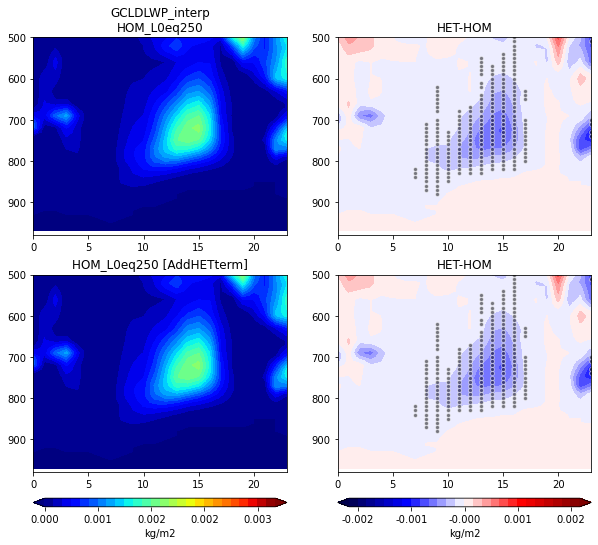

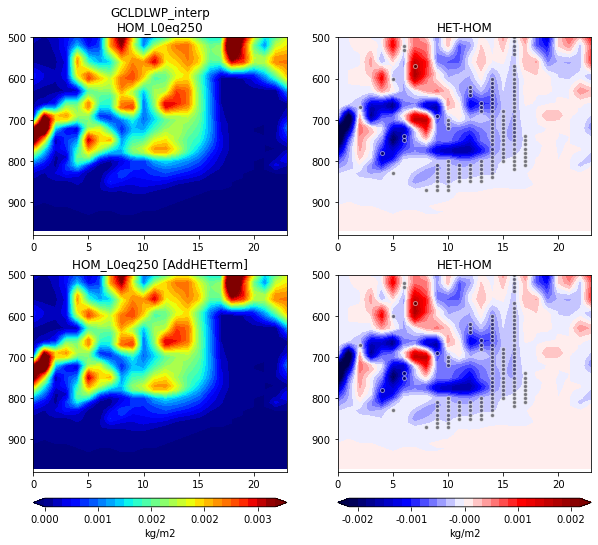

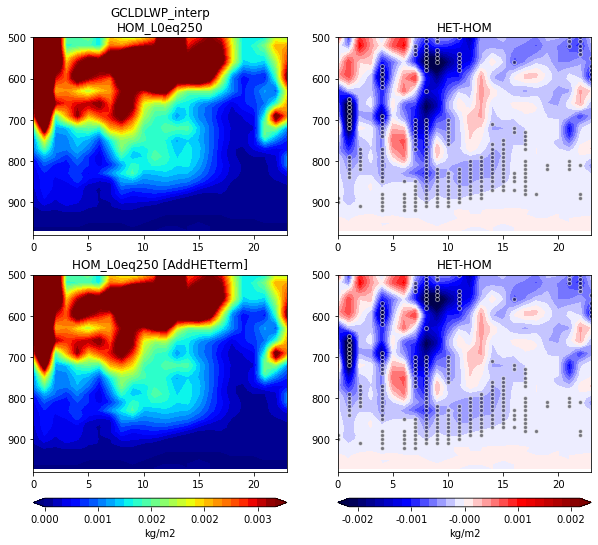

In [50]:
varPlot = 'GCLDLWP_interp'
unitsStr = scamDS_h0_L50.GCLDLWP.units

cStep = (3.5e-3 - 0)/26
clims = np.arange(0, 3.5e-3+cStep, cStep)
dMax = 2.5e-3
dStep = (2*dMax)/26
dlims = np.arange(-dMax, dMax+dStep, dStep)

print('CLEAR DAYS')
axs = plots_timeHeight(diurnal_clearDays_h0_L250, diurnal_clearDays_h0_L250, 
                       clearDays_h0_L250, clearDays_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev, 
                       pltHET=False,cbarFormat='%.3f', cbTicks=5)

print('CLOUDY DAYS')
axs = plots_timeHeight(diurnal_cloudDays_h0_L250, diurnal_cloudDays_h0_L250, 
                       cloudDays_h0_L250, cloudDays_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev, 
                       pltHET=False,cbarFormat='%.3f', cbTicks=5)

print('RAINY DAYS')
axs = plots_timeHeight(diurnal_rainDays_h0_L250, diurnal_rainDays_h0_L250, 
                       rainDays_h0_L250, rainDays_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev, 
                       pltHET=False,cbarFormat='%.3f', cbTicks=5)


CLEAR DAYS
CLOUDY DAYS
RAINY DAYS


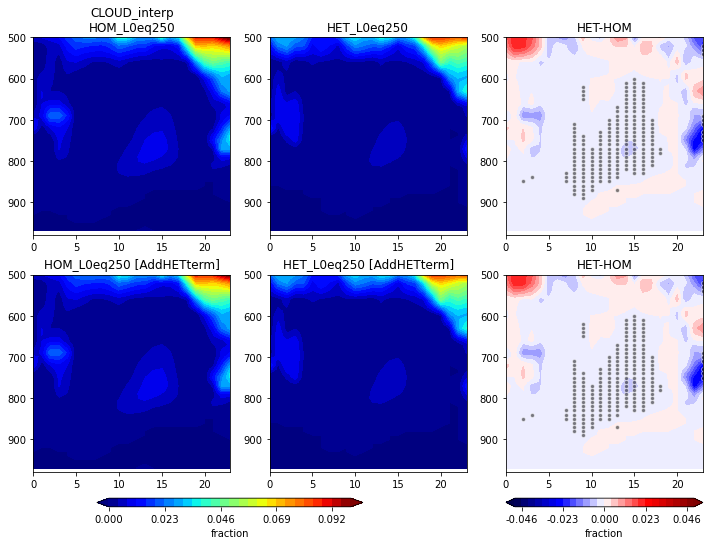

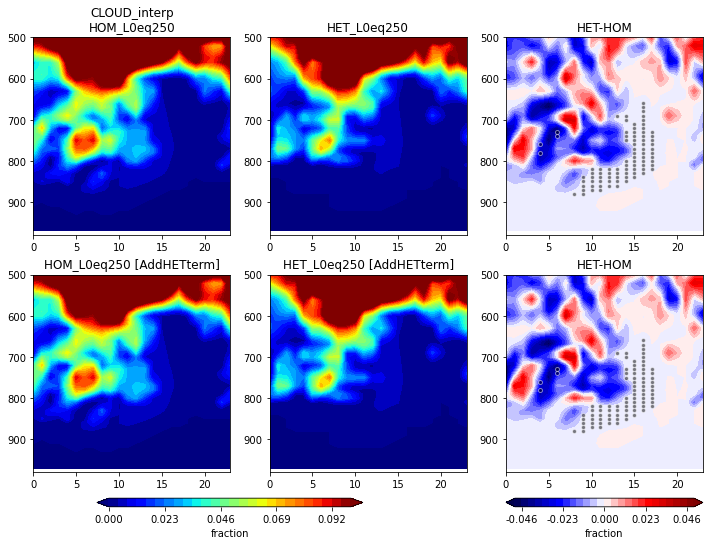

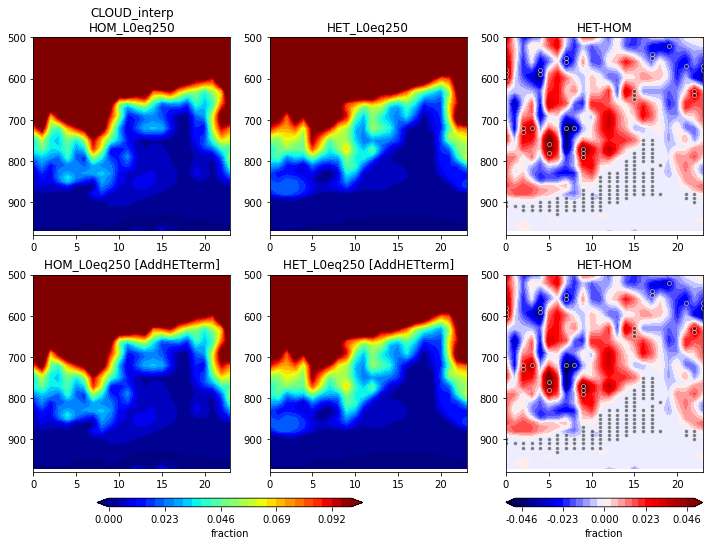

In [49]:
varPlot = 'CLOUD_interp'
unitsStr = scamDS_h0_L50.CLOUD.units

cStep = (0.1 - 0)/26
clims = np.arange(0, 0.1+cStep, cStep)
dMax = 0.05
dStep = (2*dMax)/26
dlims = np.arange(-dMax, dMax+dStep, dStep)

print('CLEAR DAYS')
axs = plots_timeHeight(diurnal_clearDays_h0_L250, diurnal_clearDays_h0_L250, 
                       clearDays_h0_L250, clearDays_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev, 
                       pltHET=True,cbarFormat='%.3f', cbTicks=5)

print('CLOUDY DAYS')
axs = plots_timeHeight(diurnal_cloudDays_h0_L250, diurnal_cloudDays_h0_L250, 
                       cloudDays_h0_L250, cloudDays_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev, 
                       pltHET=True,cbarFormat='%.3f', cbTicks=5)

print('RAINY DAYS')
axs = plots_timeHeight(diurnal_rainDays_h0_L250, diurnal_rainDays_h0_L250, 
                       rainDays_h0_L250, rainDays_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev, 
                       pltHET=True,cbarFormat='%.3f', cbTicks=5)


In [ ]:
pltVars = ['Q_interp','T_interp','CLDLIQ_interp','CLOUD_interp','OMEGA_interp','nPlumesActive']
          # 'nPlumesActive_grass','nPlumesActive_crop','nPlumesActive_urban','nPlumesActive_lake']

cMin    = [0.003,  278,    0.0,  0.0,     -0.1,    0,   0,  0,  0,  0]
cMax    = [0.018,  307,   5e-5,  0.25,   0.15,  25,  10, 10, 10, 10]
diffMax = [0.00045, 0.45,  2.4e-5, 0.055, 0.01,   10,  10, 10, 10, 10]


CLEAR DAYS
CLOUDY DAYS
RAINY DAYS


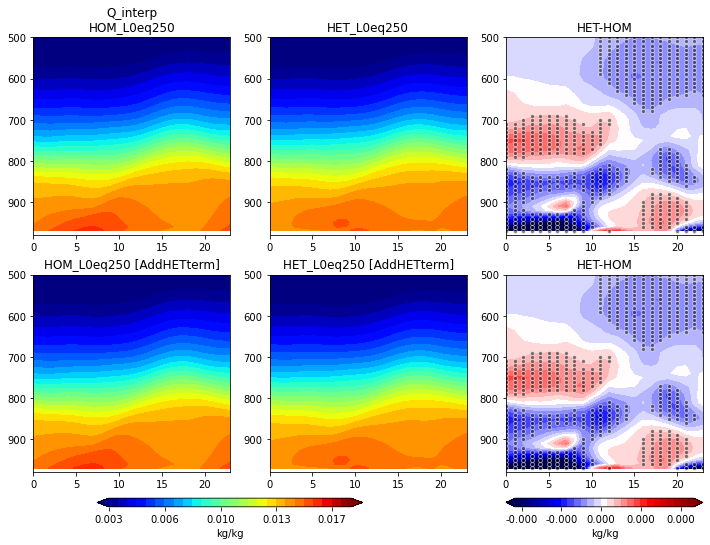

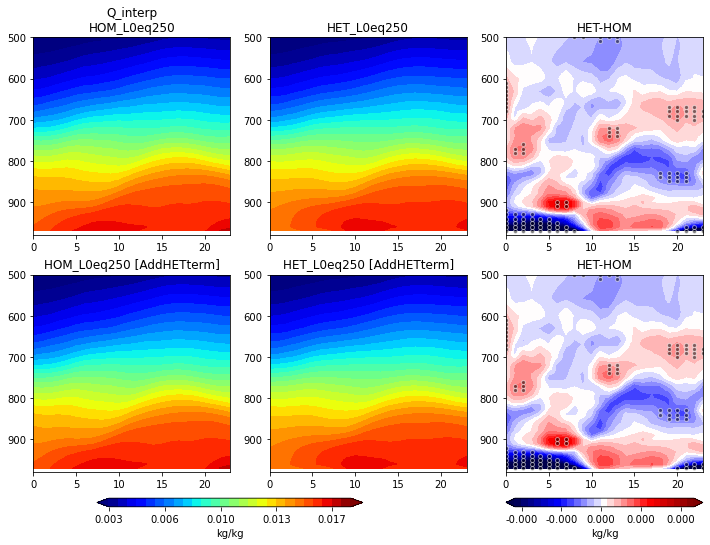

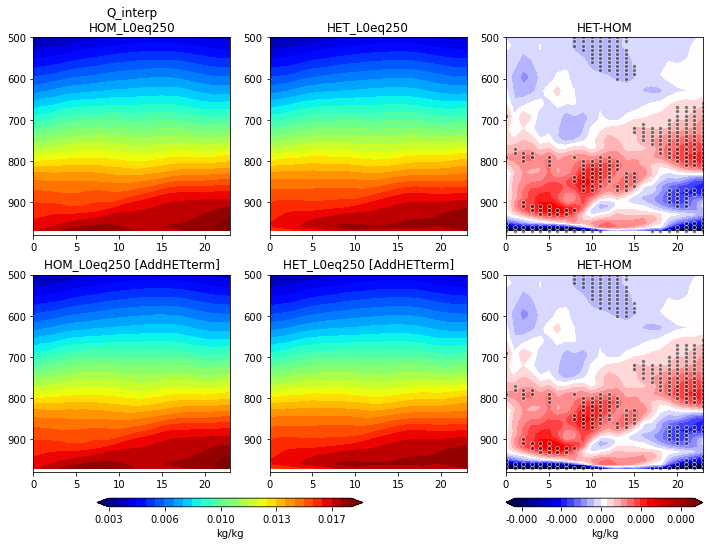

In [51]:
varPlot = 'Q_interp'
unitsStr = scamDS_h0_L50.Q.units

cStep = (0.018 - 0.003)/26
clims = np.arange(0.003, 0.018+cStep, cStep)
dMax = 0.00045
dStep = (2*dMax)/26
dlims = np.arange(-dMax, dMax+dStep, dStep)

print('CLEAR DAYS')
axs = plots_timeHeight(diurnal_clearDays_h0_L250, diurnal_clearDays_h0_L250, 
                       clearDays_h0_L250, clearDays_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev, 
                       pltHET=True,cbarFormat='%.3f', cbTicks=5)

print('CLOUDY DAYS')
axs = plots_timeHeight(diurnal_cloudDays_h0_L250, diurnal_cloudDays_h0_L250, 
                       cloudDays_h0_L250, cloudDays_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev, 
                       pltHET=True,cbarFormat='%.3f', cbTicks=5)

print('RAINY DAYS')
axs = plots_timeHeight(diurnal_rainDays_h0_L250, diurnal_rainDays_h0_L250, 
                       rainDays_h0_L250, rainDays_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev, 
                       pltHET=True,cbarFormat='%.3f', cbTicks=5)


CLEAR DAYS
CLOUDY DAYS
RAINY DAYS


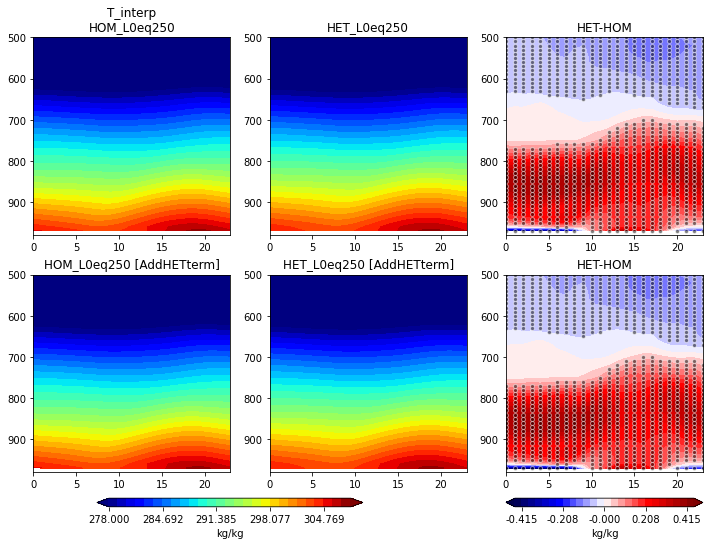

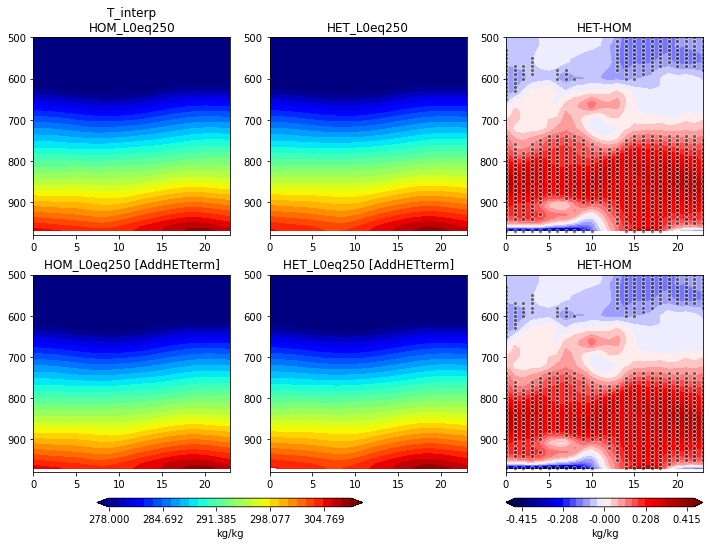

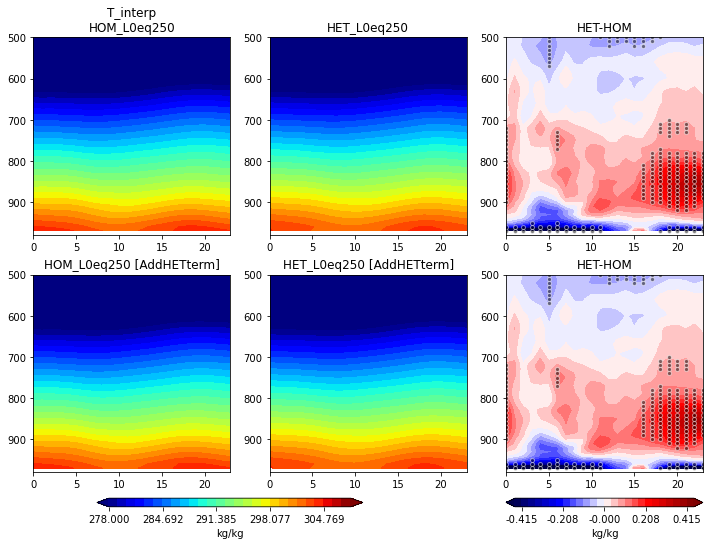

In [52]:
varPlot = 'T_interp'
unitsStr = scamDS_h0_L50.Q.units

cStep = (307 - 278)/26
clims = np.arange(278, 307+cStep, cStep)
dMax = 0.45
dStep = (2*dMax)/26
dlims = np.arange(-dMax, dMax+dStep, dStep)

print('CLEAR DAYS')
axs = plots_timeHeight(diurnal_clearDays_h0_L250, diurnal_clearDays_h0_L250, 
                       clearDays_h0_L250, clearDays_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev, 
                       pltHET=True,cbarFormat='%.3f', cbTicks=5)

print('CLOUDY DAYS')
axs = plots_timeHeight(diurnal_cloudDays_h0_L250, diurnal_cloudDays_h0_L250, 
                       cloudDays_h0_L250, cloudDays_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev, 
                       pltHET=True,cbarFormat='%.3f', cbTicks=5)

print('RAINY DAYS')
axs = plots_timeHeight(diurnal_rainDays_h0_L250, diurnal_rainDays_h0_L250, 
                       rainDays_h0_L250, rainDays_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev, 
                       pltHET=True,cbarFormat='%.3f', cbTicks=5)


**What if we just knock out days with rain rates in the top quartile of the CTRL case?**

In [19]:
ikeepDays_L50  = np.where((scamDS_h2_L50['DayLabel'].values=='Clear')  | (scamDS_h2_L50['DayLabel'].values=='Cloud') )[0]
ikeepDays_L250 = np.where((scamDS_h2_L250['DayLabel'].values=='Clear') | (scamDS_h2_L250['DayLabel'].values=='Cloud') )[0]

notRainDays_h0_L50  = scamDS_h0_L50.isel(time=ikeepDays_L50)
notRainDays_h0_L250 = scamDS_h0_L250.isel(time=ikeepDays_L250)

notRainDays_h2_L50  = scamDS_h2_L50.isel(time=ikeepDays_L50)
notRainDays_h2_L250 = scamDS_h2_L250.isel(time=ikeepDays_L250)


In [20]:
diurnalNotRain_h0_L50  = notRainDays_h0_L50.resample(time='1H').mean().groupby('time.hour').mean(dim='time')
diurnalNotRain_h0_L250 = notRainDays_h0_L250.resample(time='1H').mean().groupby('time.hour').mean(dim='time')

diurnalNotRain_h2_L50  = notRainDays_h2_L50.resample(time='1H').mean().groupby('time.hour').mean(dim='time')
diurnalNotRain_h2_L250 = notRainDays_h2_L250.resample(time='1H').mean().groupby('time.hour').mean(dim='time')



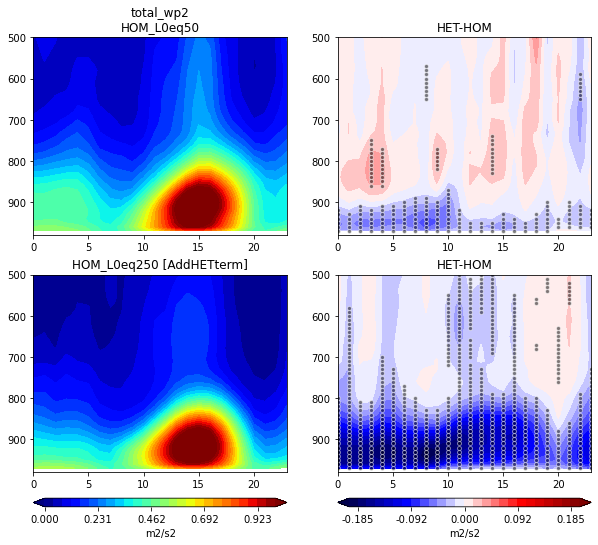

In [22]:
varPlot = 'total_wp2'
unitsStr = 'm2/s2'

cStep = (1-0)/26
clims = np.arange(0,1+cStep,cStep)
diffMax = 0.2
dStep = (2*diffMax)/26
dlims = np.arange(-diffMax, diffMax+dStep, dStep)

axs = plots_timeHeight(diurnalNotRain_h2_L50, diurnalNotRain_h2_L250, 
                       notRainDays_h2_L50, notRainDays_h2_L250,
                       varPlot, unitsStr, clims, dlims, topLev, 
                       pltHET=False,cbarFormat='%.3f', cbTicks=5)


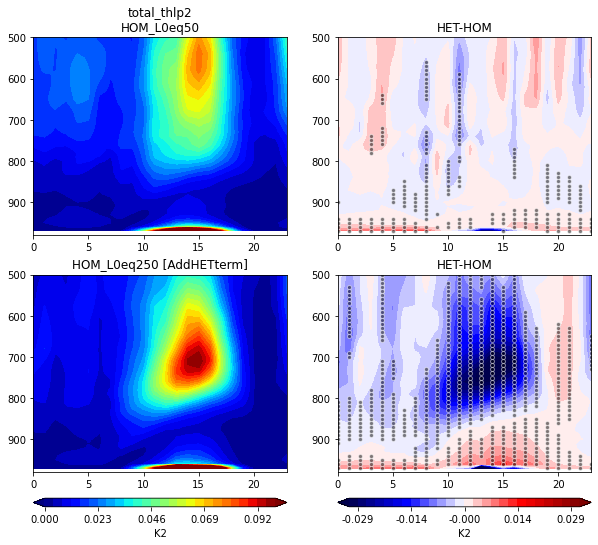

In [23]:
varPlot = 'total_thlp2'
unitsStr = 'K2'

cStep = (0.1-0)/26
clims = np.arange(0,0.1+cStep,cStep)
diffMax = 3.1e-2
dStep = (2*diffMax)/26
dlims = np.arange(-diffMax, diffMax+dStep, dStep)

axs = plots_timeHeight(diurnalNotRain_h2_L50, diurnalNotRain_h2_L250, 
                       notRainDays_h2_L50, notRainDays_h2_L250,
                       varPlot, unitsStr, clims, dlims, topLev, 
                       pltHET=False,cbarFormat='%.3f', cbTicks=5)


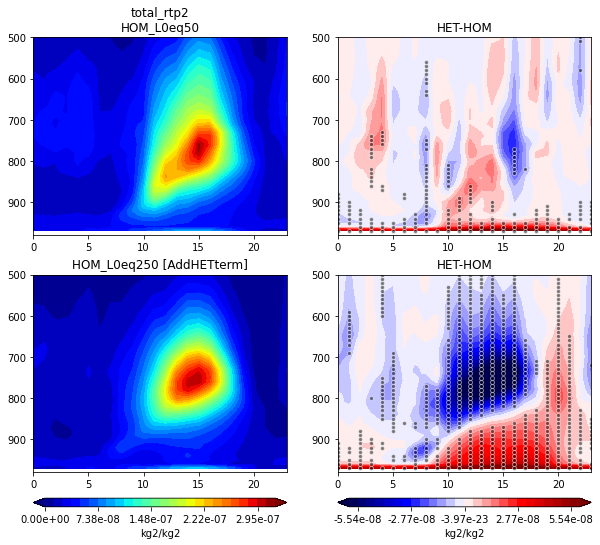

In [24]:
varPlot = 'total_rtp2'
unitsStr = 'kg2/kg2'

cStep = (3.2e-7)/26
clims = np.arange(0,3.2e-7+cStep, cStep)
diffMax = 6e-8
dStep = (2*diffMax)/26
dlims = np.arange(-diffMax, diffMax+dStep, dStep)

axs = plots_timeHeight(diurnalNotRain_h2_L50, diurnalNotRain_h2_L250, 
                       notRainDays_h2_L50, notRainDays_h2_L250,
                       varPlot, unitsStr, clims, dlims, topLev, 
                       pltHET=False,cbarFormat='%.2e', cbTicks=5)

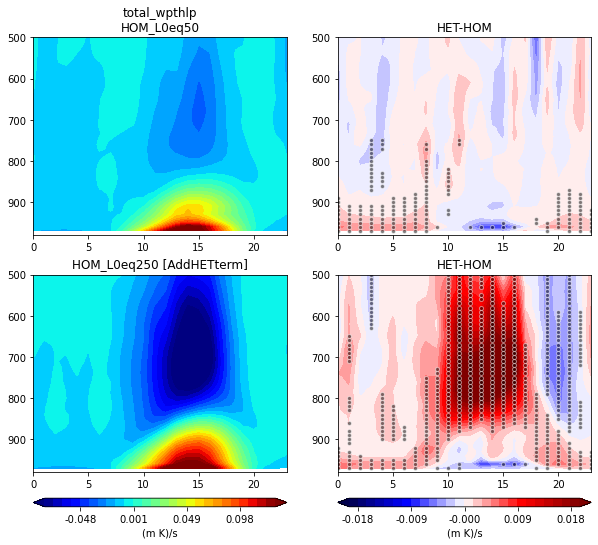

In [25]:
varPlot = 'total_wpthlp'
unitsStr = scamDS_h0_L50.wpthlp.units

cStep = (0.13--0.08)/26
clims = np.arange(-0.08,0.13+cStep,cStep)
diffMax = 2e-2
dStep = (2*diffMax)/26
dlims = np.arange(-diffMax, diffMax+dStep, dStep)

axs = plots_timeHeight(diurnalNotRain_h2_L50, diurnalNotRain_h2_L250, 
                       notRainDays_h2_L50, notRainDays_h2_L250,
                       varPlot, unitsStr, clims, dlims, topLev, 
                       pltHET=False,cbarFormat='%.3f', cbTicks=5)


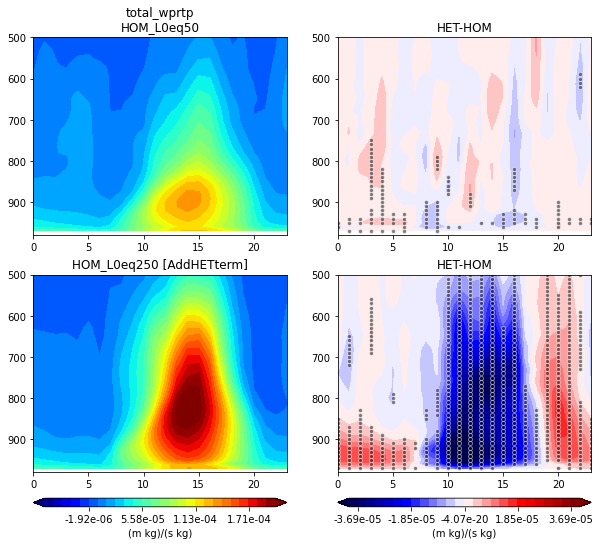

In [26]:
varPlot = 'total_wprtp'
unitsStr = scamDS_h0_L50.wprtp.units

cStep = (2e-4 - -0.5e-4)/26
clims = np.arange(-0.5e-4,2e-4+cStep,cStep)
diffMax = 4e-5
dStep = (2*diffMax)/26
dlims = np.arange(-diffMax, diffMax+dStep, dStep)

axs = plots_timeHeight(diurnalNotRain_h2_L50, diurnalNotRain_h2_L250, 
                       notRainDays_h2_L50, notRainDays_h2_L250,
                       varPlot, unitsStr, clims, dlims, topLev, 
                       pltHET=False,cbarFormat='%.2e', cbTicks=5)


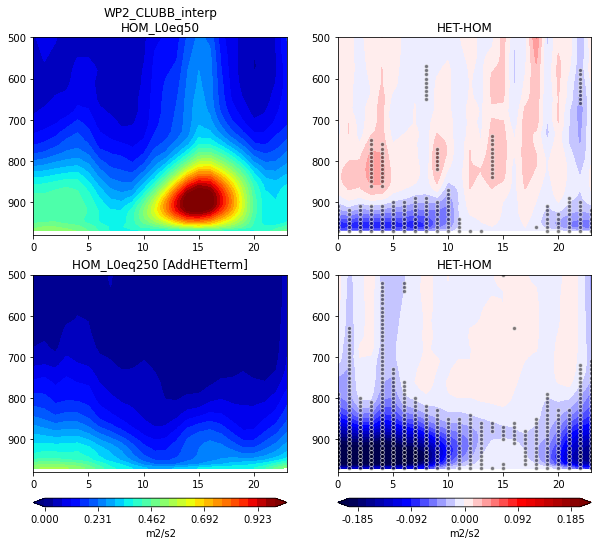

In [27]:
varPlot = 'WP2_CLUBB_interp'
unitsStr = scamDS_h0_L50.WP2_CLUBB.units

cStep = (1-0)/26
clims = np.arange(0,1+cStep,cStep)
diffMax = 0.2
dStep = (2*diffMax)/26
dlims = np.arange(-diffMax, diffMax+dStep, dStep)

axs = plots_timeHeight(diurnalNotRain_h0_L50, diurnalNotRain_h0_L250, 
                       notRainDays_h0_L50, notRainDays_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev, 
                       pltHET=False,cbarFormat='%.3f', cbTicks=5)


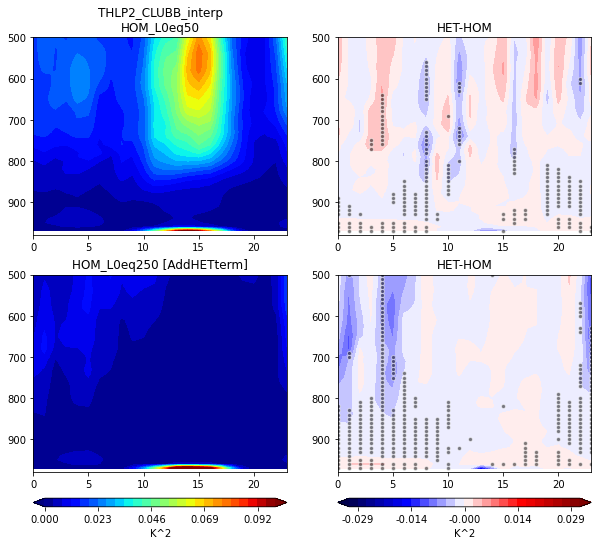

In [28]:
varPlot = 'THLP2_CLUBB_interp'
unitsStr = scamDS_h0_L50.THLP2_CLUBB.units

cStep = (0.1-0)/26
clims = np.arange(0,0.1+cStep,cStep)
diffMax = 3.1e-2
dStep = (2*diffMax)/26
dlims = np.arange(-diffMax, diffMax+dStep, dStep)

axs = plots_timeHeight(diurnalNotRain_h0_L50, diurnalNotRain_h0_L250, 
                       notRainDays_h0_L50, notRainDays_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev, 
                       pltHET=False,cbarFormat='%.3f', cbTicks=5)


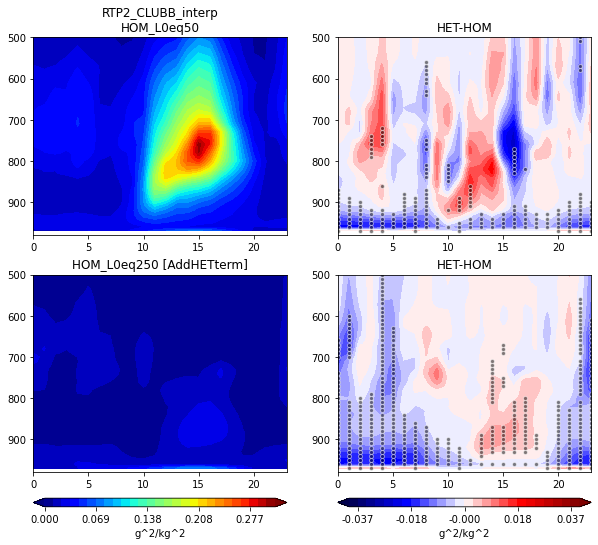

In [29]:
varPlot = 'RTP2_CLUBB_interp'
unitsStr = scamDS_h0_L50.RTP2_CLUBB.units

cStep = (0.3-0)/26
clims = np.arange(0,0.3+cStep,cStep)
diffMax = 0.4e-1
dStep = (2*diffMax)/26
dlims = np.arange(-diffMax, diffMax+dStep, dStep)

axs = plots_timeHeight(diurnalNotRain_h0_L50, diurnalNotRain_h0_L250, 
                       notRainDays_h0_L50, notRainDays_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev, 
                       pltHET=False,cbarFormat='%.3f', cbTicks=5)


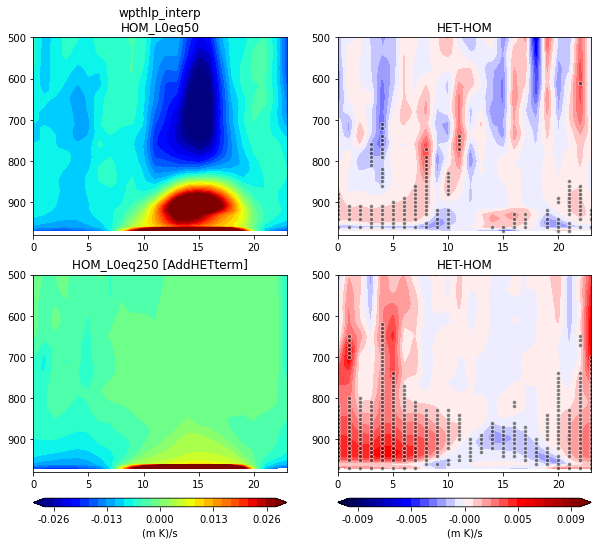

In [30]:
varPlot = 'wpthlp_interp'
unitsStr = scamDS_h0_L50.wpthlp.units

cStep = (2.8e-2 - -2.8e-2)/26
clims = np.arange(-2.8e-2, 2.8e-2+cStep,cStep)
diffMax = 1e-2
dStep = (2*diffMax)/26
dlims = np.arange(-diffMax, diffMax+dStep, dStep)

axs = plots_timeHeight(diurnalNotRain_h0_L50, diurnalNotRain_h0_L250, 
                       notRainDays_h0_L50, notRainDays_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev, 
                       pltHET=False,cbarFormat='%.3f', cbTicks=5)


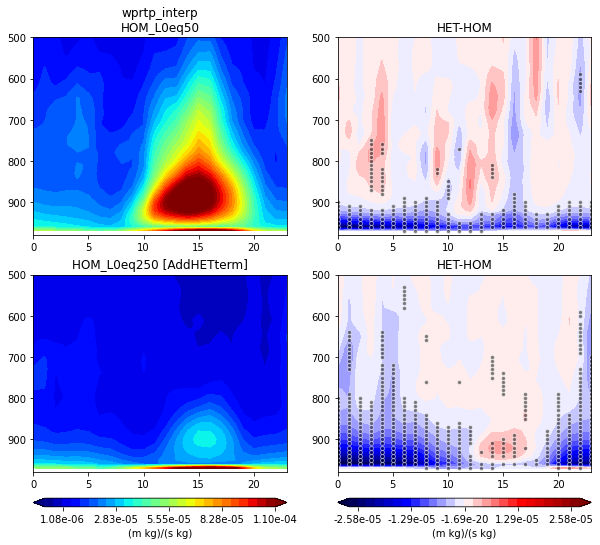

In [31]:
varPlot  = 'wprtp_interp'
unitsStr = scamDS_h0_L50.wprtp.units

cStep = (1.1e-4 - -0.8e-5)/26
clims = np.arange(-0.8e-5, 1.1e-4+cStep,cStep)
diffMax = 2.8e-5
dStep = (2*diffMax)/26
dlims = np.arange(-diffMax, diffMax+dStep, dStep)

axs = plots_timeHeight(diurnalNotRain_h0_L50, diurnalNotRain_h0_L250, 
                       notRainDays_h0_L50, notRainDays_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev, 
                       pltHET=False,cbarFormat='%.2e', cbTicks=5)


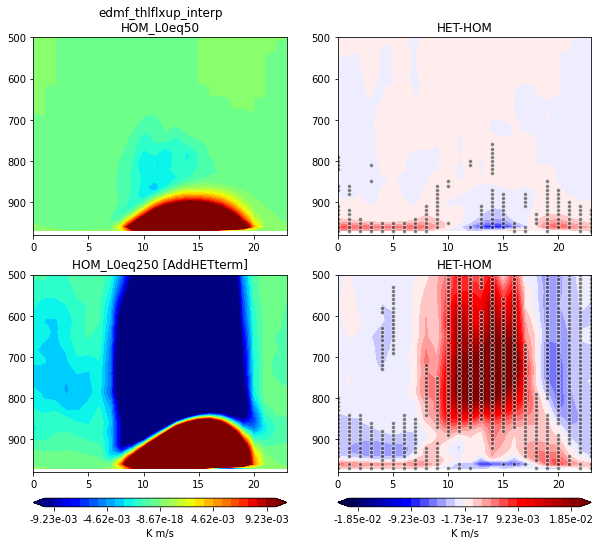

In [32]:
varPlot = 'edmf_thlflxup_interp'
unitsStr = scamDS_h2_L50.edmf_thlflxup.units

cStep = (1e-2 - -1e-2)/26
clims = np.arange(-1e-2, 1e-2+cStep,cStep)
diffMax = 2e-2
dStep = (2*diffMax)/26
dlims = np.arange(-diffMax, diffMax+dStep, dStep)

axs = plots_timeHeight(diurnalNotRain_h2_L50, diurnalNotRain_h2_L250, 
                       notRainDays_h2_L50, notRainDays_h2_L250,
                       varPlot, unitsStr, clims, dlims, topLev, 
                       pltHET=False,cbarFormat='%.2e', cbTicks=5)


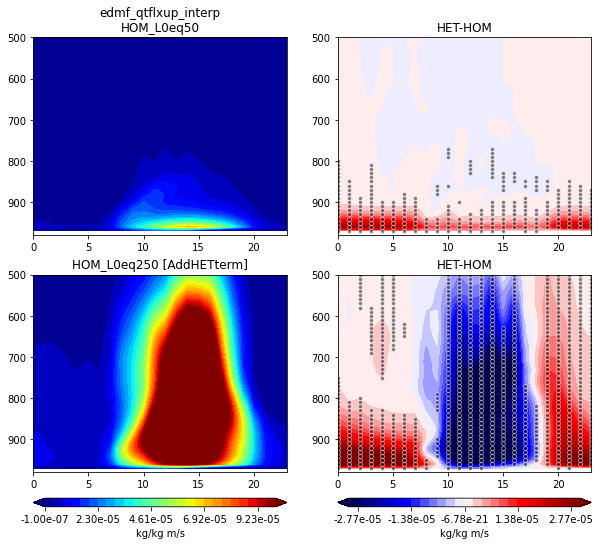

In [33]:
varPlot = 'edmf_qtflxup_interp'
unitsStr = scamDS_h2_L50.edmf_qtflxup.units

cStep = (1e-4 - -1e-7)/26
clims = np.arange(-1e-7, 1e-4+cStep,cStep)
diffMax = 3e-5
dStep = (2*diffMax)/26
dlims = np.arange(-diffMax, diffMax+dStep, dStep)

axs = plots_timeHeight(diurnalNotRain_h2_L50, diurnalNotRain_h2_L250, 
                       notRainDays_h2_L50, notRainDays_h2_L250,
                       varPlot, unitsStr, clims, dlims, topLev, 
                       pltHET=False,cbarFormat='%.2e', cbTicks=5)


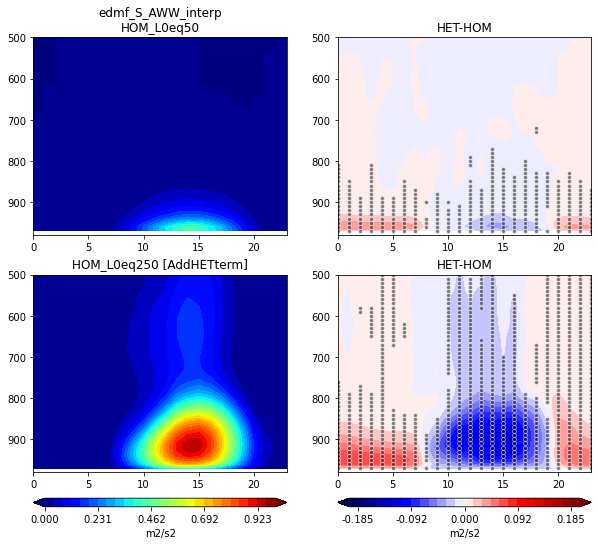

In [34]:
varPlot = 'edmf_S_AWW_interp'
unitsStr = scamDS_h2_L50.edmf_S_AWW.units

cStep = (1-0)/26
clims = np.arange(0,1+cStep,cStep)
diffMax = 0.2
dStep = (2*diffMax)/26
dlims = np.arange(-diffMax, diffMax+dStep, dStep)

axs = plots_timeHeight(diurnalNotRain_h2_L50, diurnalNotRain_h2_L250, 
                       notRainDays_h2_L50, notRainDays_h2_L250,
                       varPlot, unitsStr, clims, dlims, topLev, 
                       pltHET=False,cbarFormat='%.3f', cbTicks=5)


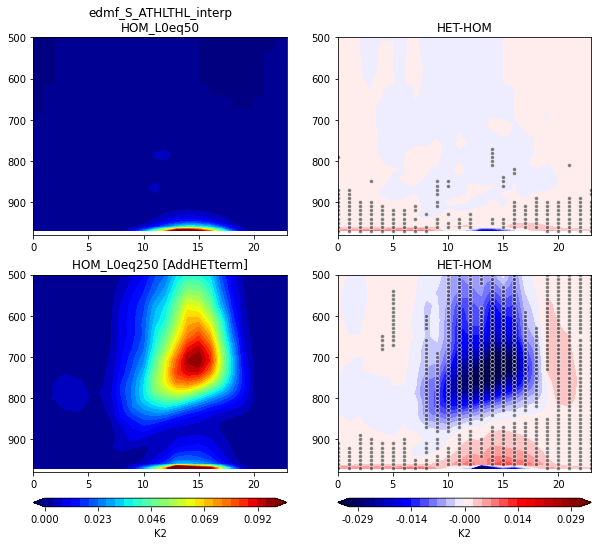

In [35]:
varPlot = 'edmf_S_ATHLTHL_interp'
unitsStr = scamDS_h2_L50.edmf_S_ATHLTHL.units

cStep = (0.1-0)/26
clims = np.arange(0,0.1+cStep,cStep)
diffMax = 3.1e-2
dStep = (2*diffMax)/26
dlims = np.arange(-diffMax, diffMax+dStep, dStep)

axs = plots_timeHeight(diurnalNotRain_h2_L50, diurnalNotRain_h2_L250, 
                       notRainDays_h2_L50, notRainDays_h2_L250,
                       varPlot, unitsStr, clims, dlims, topLev, 
                       pltHET=False,cbarFormat='%.3f', cbTicks=5)


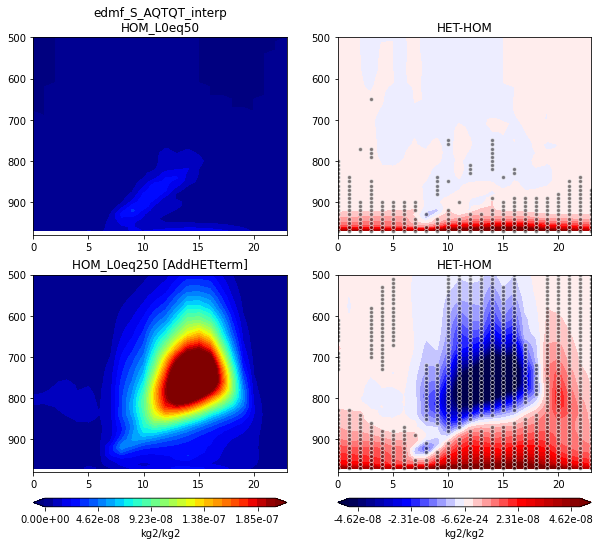

In [36]:
varPlot = 'edmf_S_AQTQT_interp'
unitsStr = scamDS_h2_L50.edmf_S_AQTQT.units

cStep = (2e-7-0)/26
clims = np.arange(0,2e-7+cStep,cStep)
diffMax = 5e-8
dStep = (2*diffMax)/26
dlims = np.arange(-diffMax, diffMax+dStep, dStep)



axs = plots_timeHeight(diurnalNotRain_h2_L50, diurnalNotRain_h2_L250, 
                       notRainDays_h2_L50, notRainDays_h2_L250,
                       varPlot, unitsStr, clims, dlims, topLev, 
                       pltHET=False,cbarFormat='%.2e', cbTicks=5)


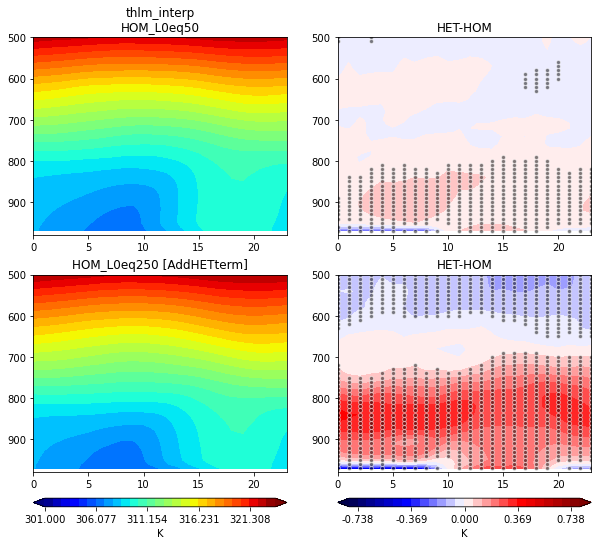

In [37]:
varPlot = 'thlm_interp'
unitsStr = scamDS_h0_L50.thlm.units

cStep = (323 - 301)/26
clims = np.arange(301, 323+cStep, cStep)
dMax = 0.8
dStep = (2*dMax)/26
dlims = np.arange(-dMax, dMax+dStep, dStep)

axs = plots_timeHeight(diurnalNotRain_h0_L50, diurnalNotRain_h0_L250, 
                       notRainDays_h0_L50, notRainDays_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev, 
                       pltHET=False,cbarFormat='%.3f', cbTicks=5)


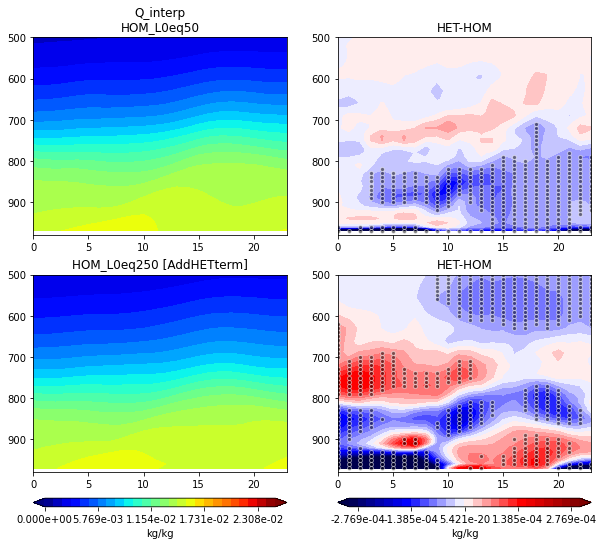

In [38]:
varPlot = 'Q_interp'
unitsStr = scamDS_h0_L50.Q.units

cStep = (0.025 - 0)/26
clims = np.arange(0, 0.025+cStep, cStep)
dMax = 0.3e-3
dStep = (2*dMax)/26
dlims = np.arange(-dMax, dMax+dStep, dStep)



axs = plots_timeHeight(diurnalNotRain_h0_L50, diurnalNotRain_h0_L250, 
                       notRainDays_h0_L50, notRainDays_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev, 
                       pltHET=False,cbarFormat='%.3e', cbTicks=5)


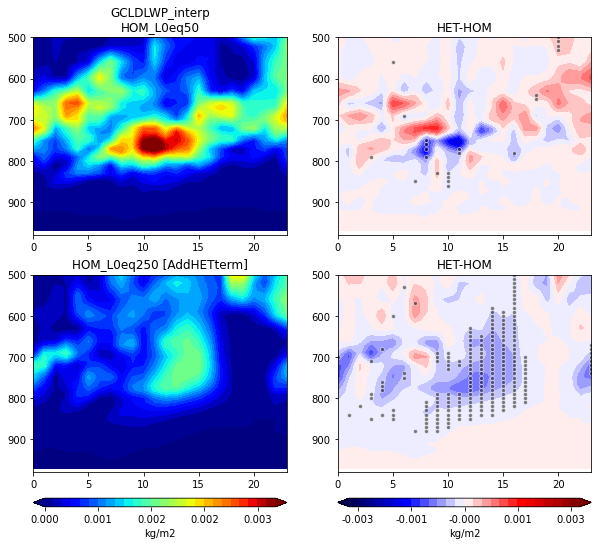

In [39]:
varPlot = 'GCLDLWP_interp'
unitsStr = scamDS_h0_L50.GCLDLWP.units

cStep = (3.5e-3 - 0)/26
clims = np.arange(0, 3.5e-3+cStep, cStep)
dMax = 3e-3
dStep = (2*dMax)/26
dlims = np.arange(-dMax, dMax+dStep, dStep)

axs = plots_timeHeight(diurnalNotRain_h0_L50, diurnalNotRain_h0_L250, 
                       notRainDays_h0_L50, notRainDays_h0_L250,
                       varPlot, unitsStr, clims, dlims, topLev, 
                       pltHET=False,cbarFormat='%.3f', cbTicks=5)


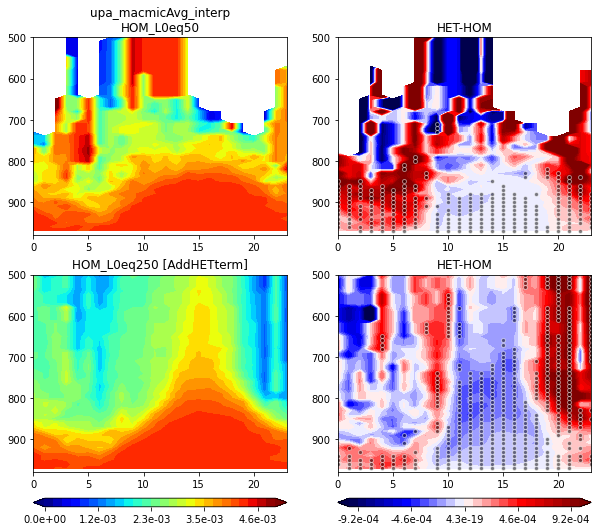

In [40]:
varPlot = 'upa_macmicAvg_interp'
unitsStr = ''

cStep = (0.005-0)/26
clims = np.arange(0, 0.005+cStep, cStep)
dMax = 0.001
dStep = (2*dMax)/26
dlims = np.arange(-dMax, dMax+dStep, dStep)

axs = plots_timeHeight_weightMFplumes(notRainDays_h2_L50, notRainDays_h2_L250, 
                                      varPlot, unitsStr, clims, dlims, topLev,
                                       pltHET=False, cbarFormat='%.1e', cbTicks=7)


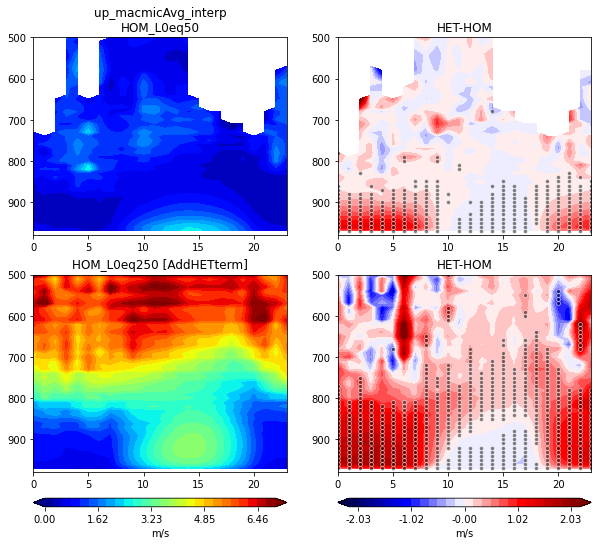

In [41]:
varPlot = 'up_macmicAvg_interp'
unitsStr = 'm/s'

cStep = (7-0)/26
clims = np.arange(0, 7+cStep, cStep)
dMax = 2.2
dStep = (2*dMax)/26
dlims = np.arange(-dMax, dMax+dStep, dStep)

axs = plots_timeHeight_weightMFplumes(notRainDays_h2_L50, notRainDays_h2_L250, 
                                      varPlot, unitsStr, clims, dlims, topLev,
                                       pltHET=False, cbarFormat='%.2f', cbTicks=7)

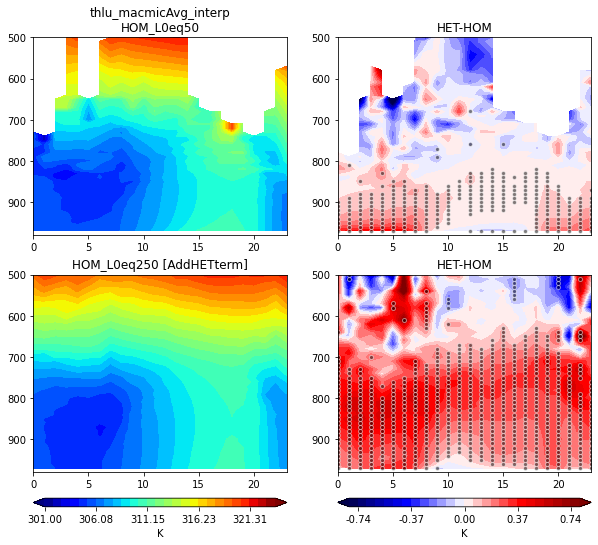

In [42]:

varPlot = 'thlu_macmicAvg_interp'
unitsStr = 'K'

cStep = (323 - 301)/26
clims = np.arange(301, 323+cStep, cStep)
dMax = 0.8
dStep = (2*dMax)/26
dlims = np.arange(-dMax, dMax+dStep, dStep)

axs = plots_timeHeight_weightMFplumes(notRainDays_h2_L50, notRainDays_h2_L250, 
                                      varPlot, unitsStr, clims, dlims, topLev,
                                      pltHET=False, cbarFormat='%.2f', cbTicks=7)


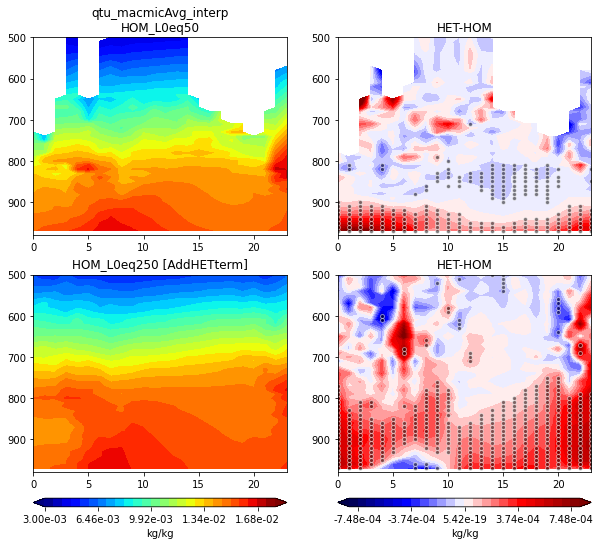

In [43]:
varPlot  = 'qtu_macmicAvg_interp'
unitsStr = 'kg/kg'

cStep = (1.8e-2 - 0.003)/26
clims = np.arange(0.003, 1.8e-2+cStep, cStep)
dMax = 0.81e-3
dStep = (2*dMax)/26
dlims = np.arange(-dMax, dMax+dStep, dStep)

axs = plots_timeHeight_weightMFplumes(notRainDays_h2_L50, notRainDays_h2_L250, 
                                      varPlot, unitsStr, clims, dlims, topLev,
                                      pltHET=False, cbarFormat='%.2e', cbTicks=7)


(0.012, 0.019)

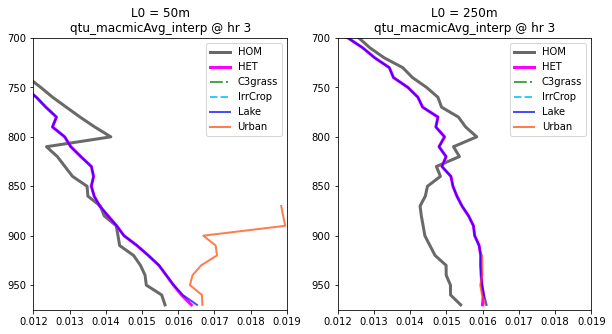

In [46]:
hrSel = 3
# varSel = 'up_macmicAvg_interp'
# varSel = 'thlu_macmicAvg_interp'
varSel = 'qtu_macmicAvg_interp'
# varSel = 'edmf_upbuoy_interp'


fig,axs = plt.subplots(1,2,figsize=(10,5))
axs = axs.ravel() 

# - - - - - - - - - - - - 
# L50 
# - - - - - - - - - - - - 

## HOM 
thisHr_L50_HOM = notRainDays_h2_L50.isel(time=np.where(notRainDays_h2_L50['time.hour']==hrSel)[0]).isel(case=0)
homVarWgt = thisHr_L50_HOM['upa_macmicAvg_interp'].where(thisHr_L50_HOM.plumeLabel == 'SurfaceAvg').fillna(0)
homVar    = thisHr_L50_HOM[varSel].where(thisHr_L50_HOM.plumeLabel == 'SurfaceAvg').weighted(homVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')
homVar_std    = thisHr_L50_HOM[varSel].where(thisHr_L50_HOM.plumeLabel == 'SurfaceAvg').weighted(homVarWgt).mean(dim='nens').resample(time='1H').mean().std(dim='time')

## HET
thisHr_L50_HET = notRainDays_h2_L50.isel(time=np.where(notRainDays_h2_L50['time.hour']==hrSel)[0]).isel(case=1)
hetVarWgt = thisHr_L50_HET['upa_macmicAvg_interp'].fillna(0)
hetVar    = thisHr_L50_HET[varSel].weighted(hetVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')    

grassVarWgt = thisHr_L50_HET['upa_macmicAvg_interp'].where(thisHr_L50_HET.plumeLabel == 'C3grass').fillna(0)
cropVarWgt  = thisHr_L50_HET['upa_macmicAvg_interp'].where(thisHr_L50_HET.plumeLabel == 'IrrigCrop').fillna(0)
lakeVarWgt  = thisHr_L50_HET['upa_macmicAvg_interp'].where(thisHr_L50_HET.plumeLabel == 'Lake').fillna(0)
urbanVarWgt = thisHr_L50_HET['upa_macmicAvg_interp'].where(thisHr_L50_HET.plumeLabel == 'Urban').fillna(0)

grassVar = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'C3grass').weighted(grassVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')
cropVar  = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'IrrigCrop').weighted(cropVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')
lakeVar  = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'Lake').weighted(lakeVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')
urbanVar = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'Urban').weighted(urbanVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')

## Get std too 
grassVar_std = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'C3grass').weighted(grassVarWgt).mean(dim='nens').resample(time='1H').mean().std(dim='time')
cropVar_std  = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'IrrigCrop').weighted(cropVarWgt).mean(dim='nens').resample(time='1H').mean().std(dim='time')
lakeVar_std  = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'Lake').weighted(lakeVarWgt).mean(dim='nens').resample(time='1H').mean().std(dim='time')
urbanVar_std = thisHr_L50_HET[varSel].where(thisHr_L50_HET.plumeLabel == 'Urban').weighted(urbanVarWgt).mean(dim='nens').resample(time='1H').mean().std(dim='time')


## Add to Plot 
axs[0].plot(homVar.values, homVar.levInterp, color='dimgrey', linewidth=3, label='HOM')
# axs[0].fill_betweenx(homVar.levInterp, homVar.values-homVar_std.values, homVar.values+homVar_std.values, color='dimgrey', alpha=0.3)

axs[0].plot(hetVar.values, hetVar.levInterp, color='magenta', linewidth=3, linestyle='-',label='HET')

axs[0].plot(grassVar.values, grassVar.levInterp, color='forestgreen', linewidth=2, linestyle='-.', alpha=0.8, label='C3grass')
# axs[0].fill_betweenx(grassVar.levInterp, grassVar.values-grassVar_std.values, grassVar.values+grassVar_std.values, color='mediumspringgreen', alpha=0.15)

axs[0].plot(cropVar.values, cropVar.levInterp, color='deepskyblue', linewidth=2, linestyle='--', alpha=0.8, label='IrrCrop')
# axs[0].fill_betweenx(cropVar.levInterp, cropVar.values-cropVar_std.values, cropVar.values+cropVar_std.values, color='darkorange', alpha=0.15)

axs[0].plot(lakeVar.values, lakeVar.levInterp, color='blue', linewidth=2, alpha=0.7, label='Lake')
# axs[0].fill_betweenx(lakeVar.levInterp, lakeVar.values-lakeVar_std.values, lakeVar.values+lakeVar_std.values, color='blue', alpha=0.15)

axs[0].plot(urbanVar.values, urbanVar.levInterp, color='orangered', linewidth=2, alpha=0.7, label='Urban')
# axs[0].fill_betweenx(urbanVar.levInterp, urbanVar.values-urbanVar_std.values, urbanVar.values+urbanVar_std.values, color='orangered', alpha=0.15)

axs[0].legend()

axs[0].invert_yaxis()
axs[0].set_title('L0 = 50m\n'+varSel+' @ hr '+str(hrSel))

# - - - - - - - - - - - - 
# L250 
# - - - - - - - - - - - - 

## HOM 
thisHr_L250_HOM = notRainDays_h2_L250.isel(time=np.where(notRainDays_h2_L250['time.hour']==hrSel)[0]).isel(case=0)
homVarWgt = thisHr_L250_HOM['upa_macmicAvg_interp'].where(thisHr_L250_HOM.plumeLabel == 'SurfaceAvg').fillna(0)
homVar    = thisHr_L250_HOM[varSel].where(thisHr_L250_HOM.plumeLabel == 'SurfaceAvg').weighted(homVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')

## HET
thisHr_L250_HET = notRainDays_h2_L250.isel(time=np.where(notRainDays_h2_L250['time.hour']==hrSel)[0]).isel(case=1)
hetVarWgt = thisHr_L250_HET['upa_macmicAvg_interp'].fillna(0)
hetVar    = thisHr_L250_HET[varSel].weighted(hetVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')    

grassVarWgt = thisHr_L250_HET['upa_macmicAvg_interp'].where(thisHr_L250_HET.plumeLabel == 'C3grass').fillna(0)
cropVarWgt  = thisHr_L250_HET['upa_macmicAvg_interp'].where(thisHr_L250_HET.plumeLabel == 'IrrigCrop').fillna(0)
lakeVarWgt  = thisHr_L250_HET['upa_macmicAvg_interp'].where(thisHr_L250_HET.plumeLabel == 'Lake').fillna(0)
urbanVarWgt = thisHr_L250_HET['upa_macmicAvg_interp'].where(thisHr_L250_HET.plumeLabel == 'Urban').fillna(0)

grassVar = thisHr_L250_HET[varSel].where(thisHr_L250_HET.plumeLabel == 'C3grass').weighted(grassVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')
cropVar  = thisHr_L250_HET[varSel].where(thisHr_L250_HET.plumeLabel == 'IrrigCrop').weighted(cropVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')
lakeVar  = thisHr_L250_HET[varSel].where(thisHr_L250_HET.plumeLabel == 'Lake').weighted(lakeVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')
urbanVar = thisHr_L250_HET[varSel].where(thisHr_L250_HET.plumeLabel == 'Urban').weighted(urbanVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')

## Add to Plot 
axs[1].plot(homVar.values, homVar.levInterp, color='dimgrey', linewidth=3,  label='HOM')
axs[1].plot(hetVar.values, hetVar.levInterp, color='magenta', linewidth=3, linestyle='-',label='HET')
axs[1].plot(grassVar.values, grassVar.levInterp, color='forestgreen',  linewidth=2, linestyle='-.', alpha=0.8, label='C3grass')
axs[1].plot(cropVar.values, cropVar.levInterp, color='deepskyblue', linewidth=2, linestyle='--', alpha=0.8, label='IrrCrop')
axs[1].plot(lakeVar.values, lakeVar.levInterp, color='blue', linewidth=2, alpha=0.7, label='Lake')
axs[1].plot(urbanVar.values, urbanVar.levInterp, color='orangered', linewidth=2, alpha=0.7, label='Urban')
axs[1].legend()

axs[1].invert_yaxis()
axs[1].set_title('L0 = 250m\n'+varSel+' @ hr '+str(hrSel))

axs[0].set_ylim([975, 700])
axs[1].set_ylim([975, 700])

# # 'thlu_macmicAvg_interp'
# axs[0].set_xlim([308,313])
# axs[1].set_xlim([308,313])
# axs[0].set_xlim([304,311])  ## 5am
# axs[1].set_xlim([304,311])

# # up_macmicAvg 
# axs[0].set_xlim([0,6])
# axs[1].set_xlim([0,6])

# # qtu_macmicAvg
axs[0].set_xlim([0.012,0.019]) 
axs[1].set_xlim([0.012,0.019])

# # buoyancy
# axs[0].set_xlim([0,0.04])
# axs[1].set_xlim([0,0.04])
